# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

 POOL Class 0.09851699286804885POOL Class 0.09537734590024737 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09851699286804885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09851699286804885
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1
0.5  A value =  1 Asset  i  Class Price =  0.10720152407830091
POOL Class   A value =  1 Asset  j  Class Price =  0.10720152407830091
POOL Class   A value =  1 Asset  k  Class Price =  0.10720152407830091
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class POOL Class  Asset   A value =  POOL Class  0.5 Asset  i  Class Price =  0.10228171614201965
POOL Class   A value =  1 Asset  j  Class Price =  0.10228171614201965
POOL Class   A value =  1 Asset  k  Class Price =  0.10228171614201965
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  i  A value =  POOL Class   A value =  1.5  Class Price = POOL Class  A value = Asset  i  Class Price

  A value =    POOL Class POOL Class Q over Wq =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   102107  107812  140000  170000  150000    0   117812  132107  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   1.5  R over W=  10.000000000000002 Q over Wq =   A value =  1 Asset  i  Class Price =  0.09134485449275621
POOL Class   A value =  


   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99843  110122  140000  170000  150000    0   120122  129843  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   i 0.08761523596461306kPOOL Class   Class Price =  0.11090390789809863
POOL Class   A value =  1 Asset  j  Class Price =  0.11090390789809863
POOL Class   A value =  1  Class Price

 POOL Class POOL Class 0.085404447824107150.10121546284391356POOL Class   A value =  0.5 Asset  i  Class Price =  0.09205100590849538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09205100590849538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09205100590849538
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10121546284391356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10121546284391356
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class 
 POOL Class   POOL Class  A value =  1.5 Asset  i  Class Price =  0.09129461224905501
POOL Class   A value =  1.5 Asset    A value =  1 Asset  j  Class Price =  0.08540444782410715
POOL Class   A value =  1 Asset  k  Class Price =  0.08540444782410715
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0  POOL Class j  Class Price =  0.09129461224905501 A value

POOL Class   A value = jQ over Wq =    Class Price =  0.1134685182876702
POOL Class   A value =  1 Asset  k  Class Price =  0.1134685182876702
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value =   0.50.5   Class Price = 1.0 POOL Class 
11  Asset  0.09523973459048186Asset POOL Class    POOL Class  
  A value =  1.5 Asset  i j Asset  i  A value =  1.5 Asset  i  Class Price =  0.09532872179035007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09532872179035007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09532872179035007
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = i Asset POOL Class  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09434869515416745
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09434869515416745
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09434869515416745
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  

POOL Class  POOL Class   A value =  1 Asset   A value =  0.5  A value =  1.5 Asset  j  Class Price =  0.09501265052751356
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09501265052751356
POOL Class   A value = j    iPOOL Class Asset  j  Class Price =  0.11219173428967963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11219173428967963
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =   Class Price =  j0.1096207109864514 POOL Class  0.117844873982211981.5  
  A value =  0.5 Asset  i  Class Price =  0.11307000534611339
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11307000534611339
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11307000534611339
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = 
1.0 Class Price = POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.11327477900331674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1132747790033167

 i 0.09278663953845949
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   POOL Class 0.11817821013581375 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class   A value =  0.10939828123444757
POOL Class   A value =   1.5 Asset  k1
 0.5 Asset  j POOL Class   Asset  i  Class Price =   Class Price =  0.10939828123444757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10939828123444757
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.11867316045822751
 Class Price = POOL Class  A value =   0.0973892043131142
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08666088940164664
POOL Class   A value =  1 Asset  j  Class Price =  0.08666088940164664
POOL Class   A value =  1 Asset  k  Class Price =  0.08666088940164664
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.096157917

POOL Class   A value =  0.5 Asset  k  Class Price =     Q over Wq = iiAsset      Class Price =  0.09714412852018879
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09714412852018879
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09714412852018879
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.00.102255100109389751.0  A value =  1 Asset  i  Class Price =  0.09062237804563983
POOL Class   A value =  1 Asset  j  Class Price =  0.09062237804563983
POOL Class   A value =  1 Asset  k  Class Price =  0.09062237804563983
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0 i  Class Price =  0.09866183115698503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09866183115698503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09866183115698503
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0



POOL Class 
POOL Class POOL Class     POOL Class  A value =  0.5 Asset  i  Class Pr

 POOL Class  POOL Class 1    Class Price =  0.10064019515237743
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.5 j1.5   A value =  1.5 Asset  i  Class Price =  0.10355156339054819
POOL Class   A value =  1.5  Asset  j  Class Price =  0.10395170538936904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10395170538936904
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.11273101649799111 A value =  1 Asset  i Asset  j  Class Price =  0.10355156339054819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10355156339054819
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  A value =  Asset   j  Class Price =  0.08909192444819744
POOL Class   A value =  1 Asset  k  Class Price =  0.08909192444819744
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Class Price = Asset 
  POOL Class    POOL Class k  Class Price =  0.1010019

POOL Class   i  Class Price =  0.1200690094059623
POOL Class   A value =  0.5 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  0.10608285380594394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10608285380594394
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10608285380594394
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10849853829768699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10849853829768699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10849853829768699
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  A value =  1.5 Asset  0.1200690094059623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1200690094059623
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  i  Class Price =  0.11317494258223232
POOL Class   A value =  1 Asset  j  Class Price = i  Class Price =  0.1069631652

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1159875093173453
POOL Class   A value =  0.5  A value =  0.5  Asset  j  Class Price =  0.1159875093173453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1159875093173453
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11436134264385796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11436134264385796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11436134264385796
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.51 Asset  i  Class Price =  0.1250703317165032
POOL Class   A value =  1 Asset  j  Class Price =  0.1250703317165032
POOL Class   A value =  1 Asset  k  Class Price =  0.1250703317165032
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.11135408260478682
POOL Class   A value =  1 Asset  j  Class Price =  0.11135408260

POOL Class   A value =  1 1  POOL Class   A value = Asset i k  Class Price =  0.09264117081625624
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.0Asset       A value =  1.5 Asset  i  Class Price =  0.0933974472778546
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0933974472778546
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0933974472778546
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 0.5 iPOOL Class  Asset  i  Class Price =  0.12551534678444318
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12551534678444318
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12551534678444318
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset 
 i Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.1162564858976504
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1162564858976504
POOL Class   A value =  0.5 Asset  k  Class Price =  0.

 POOL Class POOL Class   Class Price = j0.13166704493248246Asset   k 0.08956473608437286
POOL Class   A value =  1 Asset  j  Class Price =  0.08956473608437286
POOL Class   A value =  1 Asset  k  Class Price =  0.08956473608437286
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = 0.12319201721095184 
 A value =  A value =  1.5 Asset  j  Class Price =  0.11184889707579207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11184889707579207
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1
 POOL Class  R over W=  POOL Class i    0.11720858012743027  1
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 10.000000000000002 Class Price =   Class Price =    Asset 0.092941167508385270.1065083114444991  A value = POOL Class POOL Class  
1
  Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.11353112946242598
POOL Class   A value =  1.5 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  k  Class Price =  0.09339414687279518
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.11359450863185279 Asset  k  Class Price =  0.11488924425154601
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Class Price = POOL Class  
 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09265626153354103
POOL Class   A value =  1 Asset  j  Class Price =  0.09265626153354103
POOL Class   A value =  1 Asset  0.09636519755229486k  Class Price =  0.09265626153354103
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10769272384293035
POOL Class   A value = POOL Class 
 1.0POOL Class   A value =  1.5 Asset  k  Class Price =  0.09636519755229486
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 POOL Class  0.5Asset POOL Class   A value =  A value =     A value =  1 Asset  i  Class Price =  0.09230792800176371
P

Asset     0.09523565445504617
POOL Class  POOL Class     R over W=  Class Price = 0.111350124049077221  A value =  1 Asset  i  Class Price =  0.13353743805671578
POOL Class   A value =  1 Asset  j  Class Price =  0.13353743805671578
POOL Class   A value =  1 Asset  k  Class Price =  0.13353743805671578
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11135012404907722
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11135012404907722
POOL Class   A value = 0.5  A value = POOL Class  Asset  k  Class Price =  0.0945480504556663
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Q over Wq =  1.0
  Asset  i  Class Price =  0.11420217203790692
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11420217203790692
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11420217203790692
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


 A value = POOL Class  POOL Class   10.000000000000002 A value = Asset  0.11759084761285972  A value = POOL Class    A value = 
Q over Wq =     A value =  1 Asset  i  Class Price =  0.09281077101089254
POOL Class   A value =  1 Asset  j  Class Price =  0.09281077101089254
POOL Class   A value =  1 Asset  k  Class Price =  0.09281077101089254
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 1.0
kPOOL Class  0.5 Asset  j  Class Price =  0.11619053772324295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11619053772324295
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W=  0.50.5POOL Class  A value =      Class Price = POOL Class  1.5 Asset  k  Class Price =  0.11759084761285972
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002Asset Asset  POOL Class 0.12300949024943451 i  Class Price =  0.1219757662364228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12197576623

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  Q over Wq = 0.1224167761882174
POOL Class   A value =  0.5  A value =    Asset  k  Class Price =  0.1224167761882174
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.0 Class Price = 1.0   A value =  0.5 Asset  i  Class Price =  0.1255954783530198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1255954783530198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1255954783530198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class POOL Class 
0.1170600972224487 1  A value =  1 Asset  i  Class Price =  0.13090960758947823
POOL Class   A value =  1 Asset  j  Class Price =  0.13090960758947823
POOL Class   A value =  1 Asset  k  Class Price =  0.13090960758947823
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.09686405480317194
POOL Class   A value =  1.

  A value =  154999 A value =  1 Asset  k 
1i  Class Price =  0.11980470581113915
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11980470581113915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11980470581113915
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 0.09880918022683698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09880918022683698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
0.5 Asset  i  Class Price =  0.12072418834586145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12072418834586145
POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL Class   A value =  0.5POOL Class POOL Class       Class Price =  Asset  A value = Asset 0.50.12861441881273994 POOL Class 0.12072418834586145 A value =     
  A value =  1.5 Asset  i  Class Price =  0.10109002336520884
POOL Class   A value =  1.5 Asset  j

POOL Class  10.000000000000002 Q over Wq =  0.9999999999999998
 A value = POOL Class    POOL Class  A value = i  POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.12391496715938236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12391496715938236
POOL Class    A value =  1.5  0.5 A value =  A value =  0.5 Asset  k  Class Price =  0.12391496715938236
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
1.5 Asset  1 Asset     Class Price =  j  Class Price =  0.11855011887981105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11855011887981105
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.13330629973241306
POOL Class   A value =  1Asset   A value =  k  0.11584090100820861 Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11584090100820861
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11584090100820861
POOL Class   A value =  0.5  R over W=  10

 POOL Class 1 Asset  iPOOL Class 1  Class Price =  0.1320930093780528
POOL Class   A value =  1 Asset  j  Class Price =  0.1320930093780528
1.5  A value =  0.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class    POOL Class Asset  i  Class Price =  0.08923253763066097
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.09477474524472894
POOL Class   A value =  0.5 Asset  j Asset  A value =  0.5 Asset  i  A value =  1 Asset  j  A value =  1 Asset  k  Class Price =  0.1320930093780528
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.09477474524472894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09477474524472894
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j Class Price 

j POOL Class   Class Price =  0.10132139468158617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10132139468158617
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value =  POOL Class  1.5 Asset  i  Class Price =  0.10536278996051303
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.10399394751667768 1.5Asset  i  Class Price =  0.09475733239750032
POOL Class   A value =  1 Asset  j  Class Price =  0.09475733239750032
POOL Class   A value =  1 Asset  k  Class Price =  0.09475733239750032
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 Asset  j  Class Price =  0.10536278996051303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10536278996051303
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.0971690878758665
 A value =  1.5 Asset  i  Class Price =  0.10269704069050303
  Class Price =  0.08819237

  1POOL Class 1.5POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.09551957495732843
POOL Class   A value =  1 Asset  j  Class Price =  0.09551957495732843
POOL Class   A value =  1 Asset  kAsset  j  Class Price =  0.09821597731292263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09821597731292263
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 10
 Asset Asset   POOL Class POOL Class  1.5  Class Price =   A value =  delta W =   A value =  0.5 Asset  i  Class Price =  0.09982508815494373 4677.746913511609
POOL ADD LIQUIDITY Timestep ===  10 delta W  4677.746913511609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09982508815494373
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09982508815494373
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = j  Class Price =  0.09205130938949768
POOL Class   A value =  1   
j Asset  k  Class Price =  0.09205130938949768
POOL Class   A

  POOL Class POOL Class  POOL Class  Asset  A value =    iPOOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.08961263054106197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08961263054106197
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08961263054106197
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10168013205641782
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10168013205641782
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10168013205641782
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1i  POOL Class   Class Price =  A value =     Class Price =  0.09501068394339865
POOL Class   A value =  1 Asset  j  Class Price =  0.09501068394339865
POOL Class   A value =  1 Asset  k  Class Price =  0.09501068394339865
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class   A value =  0.5 Asset  Asset  k  Clas

POOL Class   A value =  1.5  R over W= POOL Class  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.09600605477058806
POOL Class   A value =  1 Asset  k  Class Price =  0.09600605477058806
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class 0.09933837043186128
POOL Class   A value =  POOL Class 0.5  11.5   A value =  1 Asset  i  Class Price =  0.0968494403887644
POOL Class   A value =  1 Asset  j  Class Price =  0.0968494403887644
POOL Class   A value =  1 Asset  k  Class Price =  0.0968494403887644
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.09108332079606463
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  i  Class Price =  0.0860480883949409
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0860480883949409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08604808839

  Class Price =  1.5  0.09293023675482456POOL Class 
 A value = k  A value =   A value =   A value =  1 Asset  i  Class Price =  0.10631474617140907
POOL Class   A value =  1 Asset  j  Class Price =  0.10631474617140907
POOL Class   A value =  1 Asset  k  Class Price =  0.10631474617140907
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =   0.096545218239693280.10326806914395543 Class Price =  0.09967704278175016
POOL Class   A value =  1.5  R over W=    POOL Class 0.5POOL Class 
 10.0000000000000021.5  
  A value =   Asset 0.5POOL Class  A value = POOL Class       Q over Wq = Asset 1 A value = 1  iAsset  A value =  Asset  i  Class Price =  0.10448647272102499
POOL Class   A value =  1 Asset  j  Class Price =  0.10448647272102499
POOL Class   A value =  1 Asset  k  Class Price =  0.10448647272102499
POOL Class   A value =  1.0i 1  R over W=   10.0000000000000021
     R over W= 1.5i  POOL Class   Class Price =    Class Price =  R over W= Q

POOL Class POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09165244653650555
POOL Class   A value =  1 Asset  j  Class Price =  0.09165244653650555
POOL Class   A value =  1 Asset  k  Class Price =  0.09165244653650555
POOL Class   A value =     A value =  1.5 Asset  i  Class Price =  0.09912734382803963
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09912734382803963
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09912734382803963
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.10007739306981298
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10007739306981298
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10007739306981298
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10164651458218182
POOL

0.5   A value = POOL Class  0.1041574381639625 R over W=   1 Asset  i  Class Price =  0.09008430418666964
POOL Class   A value =  1 Asset  j  Class Price =  0.09008430418666964
POOL Class   A value =  1 Asset  k  Class Price =  0.09008430418666964
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  R over W=  
  1.5 A value = POOL Class 10.000000000000002 Q over Wq =  1.0
   A value =  Asset   1 Asset  k  Class Price =  0.09989856686365538
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5POOL Class Asset 10.000000000000002    i A value = Asset Asset  POOL Class      A value =  Class Price = 1kj  i     Class Price =  0.10744393188068141
POOL Class   A value =  1.5 1  A value =  1 Asset  i  Class Price =  0.08946021845046277
POOL Class   A value =  1 Asset  j  Class Price =  0.08946021845046277
POOL Class   A value =  1 Asset  k  Class Price =  0.08946021845046277
POOL Class   A value =  1  R over W=  10.000000000000002 Q 

1 Asset  j  Class Price =  0.09909689219446864
POOL Class   A value =  1 Asset  k  Class Price =  0.09909689219446864
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class k    A value =  1 Asset  i  Class Price =  0.10169268303022175
POOL Class   A value =  1 Asset  j  Class Price =  0.10169268303022175
POOL Class   A value =  1 Asset  k  Class Price =  0.10169268303022175
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  k  Class Price =  0.0915519192636034
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.09922200745615736
POOL Class   A value =  1 Asset  j  Class Price =  0.09922200745615736
POOL Class   A value =  1 Asset  k  Class Price =  0.09922200745615736
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
POOL Class   A value =  1.5 

POOL Class j Class Price =     POOL Class 10.0000000000000021    Class Price =  A value = Asset   R over W=  0.10092739885778813
POOL Class   A value =  1 Asset  k  Class Price =  0.10092739885778813 1.5 Asset  i  Class Price =  0.09168548867364418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09168548867364418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09168548867364418
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = Asset  
 A value =  j  Class Price =  0.10468727211565297
POOL Class POOL Class POOL Class     1.0  A value =  1.5 Asset  i  Class Price =  0.09138243883086974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09138243883086974
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09138243883086974  A value = 10.0000000000000020.08866224300009225 A value = k 

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    Class Price = 
 POOL Class 1.51Q over Wq =  POOL Class 1      Asset 

 1 POOL Class POOL Class POOL Class   Class Price =  POOL Class    A value =  0.5  A value =   A value =  0.5 Asset  i  Class Price =  0.09944610518593441
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09944610518593441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09944610518593441
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  Asset    A value =  0.5 Asset  i  Class Price =  0.10126034277625501
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10126034277625501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10126034277625501
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.09638115623451529  R over W= 1.5POOL Class   A value =  0.5 Asset  i  A value =   
  Class Price =  0.10017709536941635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10017709536941635
POOL Class   A value =  0.5 Asset  k  Class Price = 10.000000000000002 Q over Wq =  1.0
Asset i1 1.5 POOL Class  

1.0 POOL Class j A value = 1.5 Asset  j  Class Price =  0.10797065571142478
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10797065571142478
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    i
POOL Class   A value =  1 Asset  i  Class Price =  0.11969574626510866
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11102495143986262
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11102495143986262
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11102495143986262
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1  Class Price =  A value =  1.5 Asset  j  Class Price =  0.10906630578859511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10906630578859511
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09353700789590731   POOL Class 0.10134169392440417POOL Class Asset 
  A value =  1.5 Asset  i    
POOL Class POOL Class POOL Class 1 Class Price = i Cla

 Class Price = POOL Class    POOL Class  Asset   A value = 0.10481802207464569  Class Price =  1 Class Price =  0.09624338176893617
POOL Class   A value =  1 Asset  k
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10481802207464569
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i      A value =   A value =  1.5 Asset  i  Class Price =  0.10690398009487288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10690398009487288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10690398009487288
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09497448829421111
POOL Class   Class Price = 1.50.12446899574531473 A value =  1.5 Asset  j  Class Price =  0.09497448829421111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09497448829421111
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = Asset  
POOL Class POOL Class   i  POOL Class Asset 0.5 A value 

POOL Class 1.5  Asset Asset   Class Price =  POOL Class    A value =  1.5 Asset  k  Class Price =  0.10551328771943802
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10127980317052838
POOL Class   A value =  1 Asset  j  Class Price =  0.10127980317052838
POOL Class   A value =  1 Asset  k  Class Price =  0.10127980317052838
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset POOL Class    A value =   A value =  0.5 Asset  k  Class Price =  0.09638997434231449
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class ji Asset  i   A value =  1 Asset  i  Class Price =  0.09897153042986345
POOL Class   A value =  1 Asset  j  Class Price =  0.09897153042986345
POOL Class   A value =  1 Asset  k  Class Price =  0.09897153042986345
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value =   0.5POOL Class     Class Price = k    A value =  1 Asset  i  Class

 POOL Class  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.11022246849804501
POOL Class   A value = POOL Class    0.10303939643890533
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10303939643890533
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.00.11203429771714814POOL Class  POOL Class  A value = 
1.5  A value =  0.5 Asset  i  Class Price =  0.09878380231878969
POOL Class   A value =  0.5
   A value =  1 Asset  i  Class Price =  0.13044903723162093
POOL Class   A value =  1 Asset  j  Class Price =  0.13044903723162093
POOL Class   A value =  1 Asset  k  Class Price =  0.13044903723162093
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value = 1    A value = Asset  j  Class Price =  0.09878380231878969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09878380231878969
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 R over W= POOL Class  10.0000

   Class Price =  10.000000000000002 Q over Wq =   Class Price =  Class Price =  0.5 i  Class Price =  0.11107099261024055
POOL Class 1.0
 0.10204996776569214
POOL Class   A value =  1 Asset  j  Class Price =  0.10204996776569214
POOL Class   A value =  1 Asset  k  Class Price =  0.10204996776569214
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  0.1365398707181383 POOL Class POOL Class 0.105708113790650860.09515606270111092   A value = 
  A value =  1.5 Asset  i  Class Price =  0.11072532882764462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11072532882764462
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11072532882764462
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

  1.5 Asset  j  Class Price =  0.11107099261024055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11107099261024055
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  A value = POOL Class 

 A value =  A value =  POOL Class  
 1.5Asset  A value = i  A value =  1 Asset  i  Class Price =  0.09977042692698955
POOL Class   A value =  1 Asset  j  Class Price =  0.09977042692698955
POOL Class   A value =  1  i  Class Price =  0.08947727315875602
POOL Class   A value =  0.5 Asset  j   Class Price =  0.10078400564362794
POOL Class  Asset  Class Price =  A value = 1.5 POOL Class   R over W=    1   A value =  1.5 Asset  i  Class Price =  0.10659393278031254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10659393278031254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10659393278031254
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.08947727315875602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08947727315875602
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k Asset POOL Class 1  R over W=   10.000000000000002 Q over Wq =  1.0
 Class Price =  0.09977042692698955
POOL Class   A value =  10.0000000000

POOL Class  1POOL Class   A value =   A value = POOL Class  1.5 Asset  i  Class Price =  0.10247461865741293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10247461865741293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10247461865741293
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class Asset  1.5   A value =  A value =   i A value =   POOL Class    A value =  A value = Asset  0.5  A value =  1.5 Asset  i  Class Price =  0.10535315769872214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10535315769872214
POOL Class   A value =  1.51.5 Asset  i  Class Price =  0.1120769265291675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1120769265291675
POOL Class   A value =  1.5 Asset  k   Class Price =    Asset  k  Class Price =  0.10535315769872214
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1 0.5k1    0.13849176041357691 POOL Class   Class Price = Asset 0.11207692652

POOL Class      A value = i A value =  1 Asset  i  Class Price =   Class Price =  0.10961215092631776
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10961215092631776
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10961215092631776
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10410300230782336 1.5POOL Class   A value =  1 0.09722730598671403
POOL Class   A value =  1 Asset 0.5 Asset  i  Class Price =  0.09396466822627392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09396466822627392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09396466822627392
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5
 POOL Class  Asset POOL Class POOL Class Asset   jAsset     A value =  0.5 Asset  i  Class Price =  0.09229820721823091
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09229820721823091
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09229820721823091
POOL Class   A value =  0.5   Cla

j A value =   A value =  1 Asset  i  Class Price =  0.10794674960318705
POOL Class   A value =  1 Asset  j  Class Price =  Asset  A value = POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    j 0.11192421488164227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11192421488164227
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1.5 R over W=    0.5 Class Price = POOL Class   Class Price = 10.000000000000002 0.10794674960318705 A value =  Q over Wq =  1.0
Asset 
 Asset     k  Class Price =  0.09891467969412274
POOL Class 10.14225270727637268 A value = 0.1038196119556283 POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class  1.5 Asset  i 
k     Class Price =  0.10778914537047155
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1 Asset  k  Class Price =  0.10794674960318705
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 0.10185754830126109
POOL Class   A value =

 Asset   A value =  1 Asset  i  Class Price =  0.08564105815330542
POOL Class   A value =  1 Asset  j  Class Price =  0.08564105815330542
POOL Class   A value =  1 Asset  k  Class Price =  0.08564105815330542
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    R over W= POOL Class   A value =  A value = iPOOL Class  Class Price =    1.5  A value =  1 Asset  i  Class Price =  0.08427125123307926
POOL Class   A value =  1 Asset  j  Class Price =  0.08427125123307926
POOL Class   A value =  1 Asset  k  Class Price =  0.08427125123307926
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.01
 Asset  i  Class Price =  0.09749327172230611
POOL Class   A value =  1 Asset  j  Class Price =  0.09749327172230611
POOL Class   A value =  1 Asset  k  Class Price =  0.09749327172230611
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08266483

POOL Class   A value =  1 Asset  i POOL Class j  Class Price =  0.08631257950818007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08631257950818007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08770374298720587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08770374298720587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08770374298720587
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09884878077089325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09884878077089325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09884878077089325
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    POOL Class  A value =  1.5 Asset  i  Class Price =  0.09980163501578837
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =  

POOL Class   A value =  0.5   Asset j 
   j  Class Price =  0.0952319148914867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0952319148914867
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10 A value = j A value =      delta W =  4658.520078674438
POOL ADD LIQUIDITY Timestep ===  10 delta W  4658.520078674438
POOL Class   A value =  0.5 0.5 Class Price =  POOL Class  POOL Class 1.5 Class Price =  Asset   A value =  0.5 Asset  i  Class Price =  0.09776662061581325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09776662061581325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09776662061581325
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.09998638618932017
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09998638618932017
POOL Class   0.10361222124104975    A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j

1.5POOL Class   A value =  1 Asset  i  Class Price =  0.0971835545936827
POOL Class   A value =  1 Asset  j  A value =  Asset  i  Class Price =  0.10688288245866778
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10688288245866778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10688288245866778
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5 Class Price =  0.0971835545936827
  A value =  1.5 Asset  i  Class Price =  0.10557428441240081
POOL Class   A value =  1.5 Asset POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.10663940142394539
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10663940142394539
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10663940142394539
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class k  Class Price =  0.0971835545936827
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq  j  Class Price =  0.10

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10570304734389453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10570304734389453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10570304734389453
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10471587391595741
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10471587391595741
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10471587391595741
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10624638289796294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10624638289796294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10624638289796294
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10514728206962777
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class POOL Class    Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.09892869121579516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09892869121579516
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09892869121579516
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11345253513738252
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11345253513738252
POOL Class   A value =   0.5 Asset  k  Class Price =  0.11345253513738252
POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.09936163506844449
POOL Class   A value =  1 Asset  j  Class Price =  0.09936163506844449
POOL Class   A value =  R over W=  1 Asset  k  Class Price =  0.09936163506844449
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10122610237948705
POOL Class   A value =  1 Asset  j  Class Price =  0.10122610237948705


 1.5 1.5 Asset  i  Class Price =  0.10496329334884341
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10496329334884341
POOL Class   A value = Q over Wq = POOL Class      A value =  1 Asset  i  Class Price =  0.09814452805294918
POOL Class   A value =  1 Asset  j  Class Price =  0.09814452805294918
POOL Class   A value =  1 Asset  k  Class Price =  0.09814452805294918
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1.0
 POOL Class j1.5  POOL Class  Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.10011717566238294
POOL Class   A value =  1 Asset  j  Class Price =  0.10011717566238294
POOL Class   A value =  1 Asset  k  Class Price =  0.10011717566238294
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   POOL Class   A value =  1 Asset   k  Class Price =  0.10496329334884341
POOL Class  0.1107398519795135 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
i0.5  A value =  1.5

POOL Class   A value =  1 Asset  k  Class Price = POOL Class   0.10436086680912374
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  POOL Class 0.0944128621186972  A value =  1 Asset  i  Class Price =  0.10607984695715758
POOL Class   A value =  1 Asset k
POOL Class   A value =  j  Class Price =  0.10607984695715758
POOL Class   A value =  1 Asset  k  Class Price =  0.10607984695715758
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.0944128621186972
POOL Class   A value =  0.5 Asset  POOL Class k   A value =  1 Asset  i  Class Price =  0.10558192924606377
POOL Class   A value =  1 Asset  j  Class Price =  0.10558192924606377
POOL Class   Class Price =  0.0944128621186972
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09236596112252535
POOL Class   A value

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10661737770071142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10661737770071142
POOL Class   A value =  0.5 Asset   R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= POOL Class   A value =  0.5 Asset  i  Class Price =  0.11654392884446098
POOL Class   A value =  0.5 Asset  j  Class Price =   0.11654392884446098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11654392884446098
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.11441124088411783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11441124088411783
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11441124088411783
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  0.5  Asset  i  Class Price =  0.11293067032038925
POOL Class   A value =  0.5 Asset  j

   POOL Class k  Class Price =  0.1002688273483541 Class Price =  0.10395996647090311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10395996647090311
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

  A value = POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.09459812440597135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09459812440597135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09459812440597135
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10608202308556615
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10608202308556615
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10608202308556615
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1019758654600223
POOL Class   A value =  1 Asset  j  Class Price =  0.1019758654600223
P

POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.12156803103878992
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12156803103878992
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12156803103878992
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i POOL Class  Class Price =  0.10504930695301558
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10504930695301558
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10504930695301558
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12003895520165082
POOL Class   A value =  1.5  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  j  Class Price =  0.12003895520165082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12003895520165082
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =  1.5

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10658538032610308
POOL Class   A value =  0.5 Asset  j  Class Price =  A value =   0.10658538032610308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10658538032610308
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1POOL Class  Asset  i  Class Price =  0.09927609137647558
POOL Class   A value =  1 Asset  j  Class Price =  0.09927609137647558
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  i  Class Price =  0.10559551946923484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10559551946923484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10559551946923484
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09927609137647558
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10550169723175336
POOL Class   A value =  0.5 Asset  j  Class Price 

POOL Class   A value =  1.5 A value = Asset    A value =  0.5 Asset  i   0.11448427452692339POOL Class 
j Class Price = Asset  POOL Class   A value =  0.5 Asset  k  Class Price =  0.11448427452692339
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1    Class Price =  0.09188738567888373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09188738567888373
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.11345652725126651
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = POOL Class  0.09945705777147845 A value =  0.5 Asset  i  Class Price =  0.11225036104403634
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11225036104403634
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11225036104403634
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.099457057771478

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   1.5 Asset  i  Class Price =  0.09968236629273478
POOL Class  POOL Class 1.5 A value =  1.0  A value =  1 Asset  i  Class Price =  0.12292509050400616
POOL Class   A value =  1 Asset  j  Class Price =  0.12292509050400616
POOL Class   A value =  1 Asset  k  Class Price =  0.12292509050400616
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09545722967550227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09545722967550227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09545722967550227
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5
POOL Class    Asset  A value = POOL Class POOL Class  Asset   i  Class Price =  0.11381498763248939
POOL Class   A value =  j  Class Price = 1 Asset  i  Class Price =  0.11954886921598408
POOL Class   A value =   0.09968236629273478
POOL Class   A value =  A value =  1 Ass

POOL Class POOL Class   A value =  0.5 Asset  POOL Class  i 1 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =   A value =  1.5 Asset  i  Class Price =  0.11526207408089913
POOL Class   A value =  1.5 Asset  POOL Class Asset 0.11553669820148114   A value =  1.5 Asset  i  Class Price =  0.1013218896154938
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1013218896154938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1013218896154938
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  
kj0.5 Asset  j  Class Price =  0.09281506752549007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09281506752549007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  Class Price = POOL Class   A value =  0.5 Asset   j  Class Price =  0.11553669820148114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11553669820148114
POOL Class   A

POOL Class 1.5 A value =  Class Price =     0.5Asset POOL Class  A value =  1.5 Asset  i  Class Price =  0.10871876377712401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10871876377712401
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.12223383529959705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12223383529959705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12223383529959705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   0.12309442367433625  A value = i1.5 Asset  i  Class Price =  0.09435607366343061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09435607366343061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09435607366343061
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

  Class Price =  0.1171458522517241
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.116

   Class Price =     Class Price = 0.11603438949074248 R over W= 0.5  Class Price = 0.11939088696631012 0.10573506580541182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10573506580541182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10573506580541182
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
POOL Class  10.0000000000000020.1198195300988768 POOL Class POOL Class  A value =  1 Asset  i  Class Price =  0.11796147566820403
POOL Class      A value =  0.5 Asset  i  Class Price =  0.10739400375348697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10739400375348697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10739400375348697
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  R over W= 0.1128915227306874 A value =   1 Asset  j  Class Price =  0.11796147566820403
POOL Class   A value =  1 Asset  k  Cl

 A value = Asset 0.5 A value = POOL Class    j POOL REMOVE LIQUIDITY weight fraction of pool = 0.309478566817302 Asset  i  Class Price =  0.11367839873646976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11367839873646976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11367839873646976
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 
1.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.11128859747483316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11128859747483316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11128859747483316
POOL Class   A value =  0.5 Asset  POOL Class   POOL Class 1  Asset 1.5   Class Price = i  A value =  0.5 Asset  i  Class Price =  0.11181257902689419
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11181257902689419
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11181257902689419
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  

POOL Class   Class Price =  0.5 Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.11152582245589304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11152582245589304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11152582245589304
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =    0.11595005094881758   A value =  0.5 Asset  i  Class Price =  0.11014164398118428
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11014164398118428
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11014164398118428
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.119978960095167590.11104965638404395
 POOL Class 
POOL Class Asset 1
  A value =  0.5 Asset  i  Class Price =  0.11214005409509337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11214005409509337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11214005409509337
POOL Class   A value =  0.5  R over W=  10.0000000

 POOL Class  R over W= POOL Class  Asset   Asset   R over W= Asset  Class Price =    10.000000000000002 A value = i    0.11966033482881695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11966033482881695
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  10.000000000000002kk A value =  1 Class Price =   POOL Class  Class Price =  0.1135540152898971 Class Price =   0.5 Asset  j  Class Price =  0.08653119586604029
POOL Class   A value =   0.11719940918715074
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =   0.5Q over Wq = 
154999 A value =  1.0
 Asset  k  Class Price =  0.08653119586604029
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
 Asset POOL Class  0.1085281192744473POOL REMOVE LIQUIDITY Timestep === 1.0  
 A value = POOL Class j  
   A value =  1 Asset  i  Class Price =  0.11440462454391549
POOL Class   A value =  1 Asset  j  Class Price =  0.11440462454391549
POOL 

i Class Price =     POOL Class POOL Class  A value =  1 Asset  j  Class Price =  0.10991111584423295
POOL Class   A value =  1 Asset  k  Class Price =  0.10991111584423295
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  R over W=  kPOOL Class  A value =   0.11695515713148665  A value =    A value =  1 Asset  i  Class Price =  0.1085342231944466
POOL Class   A value =  1 Asset  j  Class Price =  0.1085342231944466
POOL Class   A value =  1 Asset  k  Class Price =  0.1085342231944466
POOL Class   A value =  0.5 Asset  i  Class Price =   10.000000000000002  A value =  Class Price =  0.11419289851918224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11419289851918224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11419289851918224
POOL Class   A value =  0.5  Q over Wq =  0.9999999999999998
0.09104884553191345 Class Price = 1.51.5 R over W=  10.000000000000002 Q over Wq =  1.0

     R over W= Asset  j  Class Price =  0.1139275303863516

 A value = 0.5 j A value = 1POOL Class  Asset     POOL Class   Class Price = 1.5Asset  A value =   A value = 1 i  Class Price =  0.09240858671366897 1 Asset  i  Class Price =  0.11363878527471748
POOL Class   A value =  1 Asset  j  Class Price =  0.11363878527471748
POOL Class   A value =  1 Asset  k  A value =       Class Price =  0.11363878527471748
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.1200400117467110.5Asset  
 1Asset ij  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset POOL Class POOL Class         A value =  1 Asset  i  Class Price =  0.11042220940701279
POOL Class   A value =  1 Asset  j  Class Price =  0.11042220940701279
POOL Class   A value =  1 Asset  k  Class Price =  0.11042220940701279
POOL Class   A value =  1  R over W=  10.000000000000002 i  Class Price =  k  Class Price =  0.098019801980198
POOL Class 0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.

 Class Price =  0.0940572294877582
POOL Class   A value =  1 Asset   Class Price =   A value = 10.000000000000002 0.09295958331437437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09295958331437437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09295958331437437
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class j1.5POOL Class      0.09573470307507896
POOL Class   A value =  Class Price =  0.0940572294877582
POOL Class   A value =  1 Asset  k  Class Price =  0.0940572294877582
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  A value =  A value =   Q over Wq =  POOL Class   A value =    0.51.51POOL Class   A value =   A value =  1.5 Asset  1.01 Asset  i  Class Price =  0.0908955866464676
POOL Class   A value =  1 Asset  j  Class Price =  0.0908955866464676
POOL Class   A value =  1 Asset  k  Class Price =  0.0908955866464676
POOL Class   A value =  1  R over W=  10.000000000000002 Q ove

POOL Class   A value = i1.5POOL Class  A value =   POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.09517296845599052
POOL Class   A value =  1 Asset  j  Class Price =  0.09517296845599052
POOL Class   A value =  1 Asset  k  Class Price =  0.09517296845599052
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   0.5 ii1.5 Class Price =  Asset  addliq - Sq delta Sq j  Class Price =  0.11042977789394465
POOL Class  4758.766721636165
addliq - Sq delta S 4758.766721636165
Wq ADD LIQUIDITY Timestep ===  10  delta W =   Asset  j 0.10910101582561195
 Class Price =  Asset  i R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
   Class Price =  0.10093334897449173
POOL Class   A value =  1.5 Asset  4758.648422799526  Class Price =  
POOL ADD LIQUIDITY Timestep ===  10 delta W  4758.648422799526
POOL Class   A value =  1 Asset  i  Class Price =  0.09517296845599052
POOL Class   A value =  1 Asset  j  Class Price =  0.09517296845599052
POO

POOL Class   A value =   1.5  1.5POOL Class POOL Class  Asset  j  0.10651098121128345
POOL Class   A value =  1 Asset  j  Class Price =  0.10651098121128345
POOL Class   A value =  1 Asset  k  Class Price =  0.10651098121128345
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1   A value =   Class Price =  Asset  A value =  0.5 Asset  k  Class Price =  0.09389469811490654
POOL Class   A value =  0.5  R over W=  10.000000000000002POOL Class    Asset   A value =    A value =  1 Asset  i  Class Price =  0.10484762411915871
POOL Class   A value =  1 Asset  j  Class Price =  0.10484762411915871
POOL Class   A value =  1 Asset  k  Class Price =  0.10484762411915871
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.5iiQ over Wq =   A value =  1 Asset  i  Class Price =  0.10748167792012651
POOL Class   A value =  1 Asset  j  Class Price =  0.10748167792012651
POOL Class   A value =  1 Asset  k  Class Price =  0.1074816779201

POOL Class  1 jAsset k      Class Price =  0.0964097478117798
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  A value =  iAsset  A value =    A value =  0.5 Asset  i  Class Price =  0.09112766402625329
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09112766402625329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09112766402625329
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.10125124440164793
POOL Class   A value =  1.5 Asset  j 
 POOL Class   A value =   Class Price =    A value =  1.5 Asset  j 0.5 0.0937741272611329
POOL Class   A value =  0.5 1 Asset  i  Class Price =  Asset  j Class Price = 10.10366402782187992
POOL Class   A value =  1 Asset   Class Price = k  Class Price =  0.0937741272611329
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.10366402782187992
POOL Class   A value =  1 Asset  k  Class Price =  0.103664027821

 0.100040933186872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.100040933186872
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset    Class Price = 
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09946332706606004
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09946332706606004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09946332706606004
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0957473869434012
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0957473869434012
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0957473869434012
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class Asset 1.0 POOL Class    A value =  1.5 Asset  i  Class Price =  0.09774233081784253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09774233081784253 i  Class Price =   
POOL Class   A value =  

1 POOL Class  A value = POOL Class  POOL Class Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.1029768885455316
POOL Class   A value =  1 Asset  POOL Class    A value = j  Class Price =  0.1029768885455316
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  A value =  0.5 Asset  j  Class Price =  0.08975671431832455
1.5 1 Asset  k  Class Price =  0.1029768885455316
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i Asset   POOL Class POOL Class  A value =   Asset   0.09550250299401812  A value =  1 Asset  i  Class Price =  0.10169440339370334
POOL Class   A value =  1 Asset  j  Class Price =  0.10169440339370334
POOL Class   A value =  1 Asset  k  Class Price =  0.10169440339370334
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.11691140811435151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11691140811435151
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11691140811435151

11.5 Asset  i  Class Price =  0.11310925735138587
POOL Class   A value =  1.5 Asset    i  Class Price =  0.10421435332769222
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10421435332769222
POOL Class   A value =  1.5j  Class Price =  0.09863702028655448
POOL Class   A value =  1 Asset  k  Class Price =  0.09863702028655448
POOL Class   Asset  k  Class Price =  0.10421435332769222
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.09765802772153556Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.09617884766258414
POOL Class   A value =  0.5 Asset  j  Class Price =   1  R over W=   A value =  1.5 Asset  i  Class Price =  0.10607764135885463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10607764135885463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10607764135885463
0.09617884766258414   A value = j
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

i 10.00000000

  Class Price =  0.11519213243451044  POOL Class  0.5
 A value = POOL Class   1 POOL Class  0.5Asset 0.09377972586442408 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10154899453555777
POOL Class   A value =  1 Asset  j  Class Price =  0.10154899453555777
POOL Class   A value =  1 Asset  k  Class Price =  0.10154899453555777
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10748081580290489
POOL Class   A value =  1.5 Asset  j 
POOL Class Asset  POOL Class  Class Price =     A value =  1 Asset  i  Class Price =  0.10275333718888215
POOL Class   A value =  1 Asset  j  Class Price =  0.10275333718888215
POOL Class   A value =  1 Asset  k  Class Price =  0.10275333718888215
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   1i  A value =  1.5 Asset  j  Class Price =  0.11519213243451044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11519213243451044
POOL Class   0.

 Class Price =  Q over Wq =  A value = POOL Class    A value =    A value =  0.5 Asset  i  Class Price =  0.1002205845294286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1002205845294286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1002205845294286
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  A value = 1.0
  0.0968670020511491  A value =  0.5 Asset  i  Class Price =  0.09898004207001083
POOL Class   A value =  0.5 1.5Asset   A value = 
POOL Class  POOL Class POOL Class       A value = 1  A value =  0.5 Asset  i  Class Price =  0.09971796415797286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09971796415797286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09971796415797286
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 1.5j

POOL Class   A value =  1.5 Asset   A value = Asset POOL Class j   A value = POOL Class  A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.09870069459999305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09870069459999305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09870069459999305
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.11593990225707392
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11593990225707392
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.102939224699439
POOL Class   A value =  1 Asset  k  Class Price =  0.102939224699439
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   Asset  i  Class Price =  0.09932023455121122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09932023455121122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09932023455121122
POOL Class   A value =  0.5  R over W=  10.0000000000

  Class Price =   A value =  Asset    Class Price = kPOOL Class   A value =  0.5 Asset  i  Class Price =  0.09989069291571684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09989069291571684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09989069291571684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =  0.11532517264162195
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 A value =  POOL Class  0.1035292804403514  A value =  0.5 Asset  i  Class Price =  0.10359627574425413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10359627574425413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10359627574425413
POOL Class  i   A value =  0.102068620176722111POOL Class  Class Price =  
 Asset 
1  A value =  1.5 Asset  i  Class Price =  0.11540045878839732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11540045878839732
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1 Asset

 10.000000000000002   A value =  1.0POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09739228941544129
POOL Class   A value =  1
   POOL Class 0.5Asset  A value =  A value = POOL Class POOL Class    Q over Wq =      A value =  0.5 Asset  i  Class Price =  0.09151652784432042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09151652784432042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09151652784432042 0.9999999999999999 A value = 1.5 A value =  1.5 Asset  i  Class Price =  0.11576114154628364
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11576114154628364
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11576114154628364
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  R over W= j

POOL Class 1  POOL Class 10.000000000000002 Q over Wq =  1.0
    A value =  Class Price =     Asset POOL Class   A value = Asset Asset  j  1.50.09739228941544129
POOL Class  A value =  ii  Class Price =  0.09682420526343993
POOL Cla

POOL Class 0.5 Asset 1 Asset  i1 Asset  i  Class Price =  0.09737250020787189
POOL Class   A value =  1 Asset  j  Class Price =  0.09737250020787189
POOL Class   A value =  1 Asset  k  Class Price =  0.09737250020787189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.11776955417777939
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11776955417777939
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11776955417777939
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = 0.5POOL Class i Class Price =   A value =  0.5 Asset  i  Class Price =  0.10894491583214785
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10894491583214785
POOL Class         Class Price =  0.09766470556361902
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09766470556361902
POOL Class   A value =  0.5 0.09588196445587421
POOL Class   A value =  A value =  

   10.000000000000002Asset  k  Class Price = POOL Class  A value =    Class Price =   Q over Wq =  j 0.099739421974525791 Asset  i  Class Price =  0.09821172251224443
POOL Class   A value =  1 Asset  j  Class Price =  0.09821172251224443
POOL Class   A value =  1 Asset  k  Class Price =  0.09821172251224443
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.1217616364870806 A value = 
 POOL Class POOL Class 1.0POOL Class   A value =  1 Asset  i  Class Price =  0.09990079444100652
POOL Class   A value =  1 Asset  j  Class Price =  0.09990079444100652
POOL Class   A value =  1 Asset  k  Class Price =  0.09990079444100652
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
 
    A value =  1 Asset  i  Class Price =  0.10165437512301218
POOL Class   A value =  1 Asset  j  Class Price =  0.10165437512301218
POOL Class   A value =  1 Asset  k  Class Price =  0.10165437512301218
POOL Class   A value =  1  R over W=  10.00000000000000


POOL Class   A value =  1 Asset  k  Class Price =  0.11285492451217286
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1.5  POOL Class  Asset  0.5 A value = 
  A value =  1 Asset  i  Class Price =  0.10252087225311422
POOL Class   A value =  1 Asset  j  Class Price =  0.10252087225311422
POOL Class   A value =  1 Asset  k  Class Price =  0.10252087225311422
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  Asset  i  1 Asset  i  Class Price =  0.13047209059053358
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13047209059053358
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13047209059053358
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.01.5   Class Price = iPOOL Class 
 POOL Class    A value =  1 Asset  j  Class Price =  0.10262645112114391
POOL Class   A value =  1 Asset  k  Class Price =  0.10262645112114391
POOL Class   A value =  1  R over W=  10.000000000000002 Q ov

POOL Class   A value =   A value =  A value =  1.5 Asset  i  Class Price =  0.12237038584974139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12237038584974139
POOL Class   A value =  1.5 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09352087170515713
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09352087170515713
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09352087170515713
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset     1 Asset  i  Class Price =   A value = 10.09844625177239485POOL Class 
  
0.5   A value =  0.5 Asset  i  Class Price =  0.09104342725348717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09104342725348717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09104342725348717
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
kPOOL Class POOL Class 1.5Asset  Asset  i  Class Price =  0.12825127710731798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1282

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10265471797335102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10265471797335102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10265471797335102
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10391429232048041
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10391429232048041
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10391429232048041
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1049930126084471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1049930126084471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1049930126084471
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10312752710790359
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1  R over W=  10.000000000000002 1.5Q over Wq =  1.0
 Asset  i  Class Price =  0.12993065945305565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12993065945305565
POOL Class   A value =  1.5 Asset  154999
kPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  5136.7592753734025 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20190827985109125
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3117689222850528
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3117689222850528
POOL Class   A value =  1 Asset  i  Class Price =  0.12993065945305565
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13332419502679502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13332419502679502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13332419502679502
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class   A value

 1.0POOL Class  R over W= 
  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.14259405017183047
POOL Class   A value =   10.000000000000002 1.5 Asset  j  Class Price =  0.14259405017183047
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =  0.5 Asset   Q over Wq =   0.14259405017183047
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0000000000000002j
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13544532993051245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13544532993051245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13544532993051245
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0154999POOL Class  

  A value =  1.5 Asset  i  Class Price =  0.14451109316309635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14451109316309635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14451109316309635
POOL Class   A

POOL Class   A value =  1.5 Asset  POOL Class i   Class Price =  0.1244588152822467
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1244588152822467
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1244588152822467
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   POOL Class  A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.12226103516304496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12226103516304496
1 Asset  k  Class Price =  0.09252750500372256
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 POOL Class   A value =  1.5 Asset  k  Class Price =  0.12226103516304496
POOL Class   A value =  1.5  R over W=  0.5 Asset  i  Class Price =  0.09659200643528834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09659200643528834
POOL Class   A value =  0.5 Asset  k 10.000000000000002 1.5 Asset  i  Class Price =  0.09459469663842525
POOL Class   A value =  1.5 Asset  j 

  A value =  A value =  POOL Class 1  1 Asset  i Asset  k  Class Price =  0.12747513538173252
POOL Class   A value =  1  R over W=  A value =   0.5 Asset POOL Class  10.000000000000002   Class Price = i A value =    0.10079512673465922Q over Wq =  
  Class Price = 1.51.0  POOL Class  
0.09982286475882998Asset  A value = 
  POOL Class i1  POOL Class   Class Price =  Asset  A value =  A value =    1 Asset  i  Class Price =  0.13056865015170943
POOL Class   A value =  1 Asset  j  Class Price =  0.13056865015170943
POOL Class   A value =  1 Asset  k  Class Price =  0.13056865015170943
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j0.14025093160422789   Class Price =  0.10079512673465922
POOL Class   A value =  1 Asset  k  Class Price =  0.10079512673465922
POOL Class POOL Class 0.5
  A value =  1 Asset   Asset  j  Class Price =  0.09982286475882998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09982286475882998
POOL Class   A value =  0.5  R over W=  10

 i  Class Price =  0.09974964979881294
POOL Class   A value =  1 Asset  j  Class Price =  0.09974964979881294
POOL Class   A value =  1 Asset  k  Class Price =  0.09974964979881294
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.09941880801265626k  Class Price =  0.11463529216439447
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = POOL Class   A value = 
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.09941880801265626
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09941880801265626
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.09122186317353441
POOL Class   A value =  1.5  R over W=  10.000000000000002  1 Asset  j  Class Price =  0.10228748701251804
POOL Class   A value =  1 Asset  k  Class Price =  0.10228748701251804
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 POOL Class   A value =  0.5  R over W= Asset  i

POOL Class   A value = Asset Q over Wq =  Asset   Asset  i  Class Price =  0.09833807687017689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09833807687017689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09833807687017689
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09980770729880743
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09980770729880743
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09980770729880743
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   POOL Class  A value =  i  A value =  0.5 Asset  i  Class Price =  0.10138646043374043
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.08741879306770228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08741879306770228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08741879306770228
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price = 

POOL Class     A value =  1.5 Asset  i  Class Price =  0.08800761128280407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08800761128280407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08800761128280407
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10185585214583827
POOL Class   A value =  1 Asset  j  Class Price =  0.10185585214583827
POOL Class   A value =  1 Asset  k  Class Price =  0.10185585214583827
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.08950960210863362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08950960210863362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08950960210863362
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset POOL Class     A value =  1 Asset  i  Class Price =  0.10072557043797589
POOL Class   A value =  1 Asset  j  Cla

POOL Class 0.09355943053655387 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09694723141645052
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09694723141645052
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09694723141645052
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  k  Class Price =  0.09600429718050224
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09355943053655387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09355943053655387
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10167400466294811   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  1

 Class Price =  i  Class Price =  0.0944305232320389
POOL Class   A value =   0.09272129181366506
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09272129181366506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09272129181366506
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  1    A value =  1 Asset  i  Class Price =  0.10440041372650617
POOL Class   A value =  1 Asset  j  Class Price =  0.10440041372650617
POOL Class   A value =  1 Asset  k  Class Price =  0.10440041372650617
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5Asset   A value =  j  Class Price =  POOL Class 0.0944305232320389 A value =  POOL Class   R over W=  
  A value =  1.5 Asset  i  Class Price =  0.09540479636133944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09540479636133944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09540479636133944
POOL Class   A value =  1.5  R over W=  10.0000000000

 Class Price =   R over W=  A value =  A value =  0.0985884167845306POOL Class  j   A value = 
 0.10681788391686815 10.000000000000002  1.5 Asset  j  Class Price =  0.10589170505803334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10589170505803334
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1.5POOL Class 
 Class Price = POOL Class     0.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10366225691224522
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  k  Class Price =  0.10681788391686815
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1 Asset  k  Class Price =  0.09538919688022136
POOL Class   A value =   Asset  i  Class Price =  0.0890940651848495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0890940651848495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0890940651848495
POOL Class   A value =  0.5  R over W= 0.09734203811442915Asset 1.01Q over Wq =  A value =   10.000000000

1.5  Class Price =  POOL Class kAsset  A value =     Q over Wq =  A value =   0.09781104095253608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09781104095253608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09781104095253608
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 0.5k  1.0
1.5 Asset   A value = POOL Class  Class Price =  0.10722179427307241
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1.5 Asset  i  Class Price =  0.10668583468658076
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10297472165751571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10297472165751571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10297472165751571
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  POOL Class j R over W=    A value =  1.5 Asset  i  Class Price =  0.10913345099549113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10913

POOL Class  1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.10208097425325721POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10208097425325721
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10208097425325721
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.10665469199979237
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  POOL Class   A value =   A value = 0.5 k Asset  k  Class Price =  0.10323868685620297
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.10388530429910155
POOL Class 0.5   A value =  0.5 Asset  j  Class Price =  0.10388530429910155
POOL Class   A value =  0.5 Asset  k  Class Price = Asset  POOL Class  A value = Asset  0.09729743185320675 0.10388530429910155
      Class Price =  0.10633592969658251
POOL Class   A value =  1.5  R over W= ki
1 10.0000000000

POOL Class   A value =  Asset  A value =  
  0.5  i  Class Price =  0.11490545093752284
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11490545093752284
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11490545093752284
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  R over W=  10.5 10.000000000000002 Q over Wq =  1.0
1.5POOL Class Asset  A value =    A value =  1.5 Asset  i  Class Price =  0.11380412858224316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11380412858224316
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10431524621604958
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10431524621604958
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10431524621604958
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset     A value =  POOL Class   k POOL Class 1Asset 1.5 Asset i   A value =  1.5 Asset  i  Class Price =  0.10303862809208275
POOL Class   A value =  1.5 Asset  

POOL Class  POOL Class  0.09483313749596438
POOL Class   A value =  1 Asset  j  Class Price =  0.09483313749596438
POOL Class   A value =  1 Asset  k  Class Price =  0.09483313749596438
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
     A value =  POOL Class   A value =  Class Price =  A value =  A value =  Class Price =    A value =  1 Asset  i  Class Price =  0.09618396883521198
POOL Class   A value =  1 Asset  j  Class Price =  0.09618396883521198
POOL Class   A value =  1 Asset  k  Class Price =  0.09618396883521198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1.5 Asset  i  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  1.5 A value =  Class Price = jPOOL Class    0.10430875478167155
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1.5 0.10503521405122083
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10624596014333174
POOL Class   A value =  0.5 Asset  j   A val

 A value =   0.5 Asset  i  Class Price =  0.10616771872049334
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10616771872049334
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10616771872049334
POOL Class   A value =  0.5  R over W=  10.000000000000002 Class Price =  0.09891894331080915
POOL Class   A value =  1 Asset  j  Class Price =  0.09891894331080915
POOL Class   A value =  1 Asset  k  Class Price =  0.09891894331080915
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset POOL Class  
 0.09649270183406149POOL Class  Class Price = Q over Wq =  1.0
POOL Class    
i0.12024318552742617
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12024318552742617
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class   A value = POOL Class   A value =  1.5 Class Price =    A value =   POOL Class   A value = Asset  1 Asset  i  Class Price =  0.099451459855053
POOL Class   A value =  1 Asset  j  Class Price

POOL Class 0.10222828923180242  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

i
  Class Price =  0.09912205826113667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09912205826113667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09912205826113667
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value = POOL Class  0.5    POOL Class 10.000000000000002POOL Class  A value =  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.10879177664112
POOL Class   A value =   Q over Wq =  POOL Class   1.5 Asset  j  Class Price =  0.10879177664112
POOL Class   A value =  1.50.5 Asset  j  Class Price =  0.10222828923180242
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10222828923180242
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1Asset      POOL Class  A value = Asset   A value = 1.51.0   A value =  0.5 Asset  i  Class Price =  0.10485054913773612
POOL Class   A 

  A value =  0.1068552439126542
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10308424678558915
POOL Class   A value =  1 Asset  j  Class Price =  0.10308424678558915
POOL Class   A value =  1 Asset  k  Class Price =  0.10308424678558915
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset     R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    Class Price = i  Class Price =  0.1041040187043463
POOL Class   A value =  1 Asset  j  Class Price =  0.1041040187043463
POOL Class   A value =  1 Asset  k  Class Price =  0.1041040187043463
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5POOL Class   POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.10874460754981732
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10874460754981732
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10874460754981732
POOL Clas

i0.5 0.11455565007354575


POOL Class   A value =  0.5 Asset  k  Class Price =  0.11345257630873064
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.10402272146698914
POOL Class   A value =  1 Asset  j  Class Price =  0.10402272146698914
POOL Class   A value =  1 Asset  k  Class Price =  0.10402272146698914
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 0.1099439773982969POOL Class Asset 1.5POOL Class POOL Class   
POOL Class   A value =  1 Asset  i  Class Price =  0.1055106521604545
POOL Class   A value =  1 Asset  j  Class Price =  0.1055106521604545
POOL Class   A value =  1 Asset  k  Class Price =  0.1055106521604545
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1 A value =   A value =  0.5 Asset  j  Class Price =  0.1099439773982969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1099439773982969
POOL Class   A value =  0.5  R over W=  1

POOL Class POOL Class  POOL Class   A value = POOL Class  A value =  POOL Class POOL Class   0.10913928129363383   0.5 A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value = 0.5  A value =  Asset  i  Class Price =  0.10289324008837024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10289324008837024
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10289324008837024
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i
 0.5 Asset    Class Price =  POOL Class   A value =  1.5 Asset  k  Class Price =  0.10913928129363383
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.11772694016692542  A value = i  A value =  1 Asset  i  Class Price =  0.09937873648930655
POOL Class   A value =  1 Asset  j  Class Price =  0.09937873648930655
POOL Class   A value =  1 Asset  k  Class Price =  0.09937873648930655
POOL Class   A value =  1 POOL Class 1.5 
POOL Class 1.51  R over W=   POOL Class

POOL Class   kPOOL Class   A value =  0.5  k  A value =  jPOOL Class   A value =  Class Price =    R over W=   i 0.5 1.5  Class Price =  A value =  10.000000000000002 Q over Wq =  1.0
POOL Class      Class Price = 0.11585228250226015 Class Price =   A value =  0.5 Asset  i  Class Price =  0.11566371276825381
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11566371276825381
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11566371276825381
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 
 R over W=  POOL Class  0.10846533021386842Asset  POOL Class 0.095223884522629640.10854336909277507  A value =  0.5 Asset  i  Class Price =  0.11416741367405944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11416741367405944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11416741367405944
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =   R over W=  
POOL Class   A value =  1.5 Asset  j  Cla

 A value = 1POOL Class   10.000000000000002Asset POOL Class  1.5 Asset  i  Class Price =  0.10815772715091318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10815772715091318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10815772715091318
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 A value =    Asset  i  Class Price =  0.10785250666677403
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10785250666677403
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10785250666677403
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i POOL Class POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.1153764850076879
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1153764850076879
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1153764850076879
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0876453145146537
PO

POOL Class   R over W= 1.50.098145748181440171k 10.000000000000002 Q over Wq =  1.0
  10.000000000000002 Q over Wq =    
0.5 1.0
Asset POOL Class POOL Class  A value =  Class Price = POOL Class     R over W=      A value =  1.5 Asset  i  Class Price =  0.12524312476645783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12524312476645783
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12524312476645783
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1.50.11516295497939517iAsset  A value = POOL Class  
  1.5 Asset  i  Class Price =  0.10868380782340038
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10868380782340038
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10868380782340038
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1k    A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  10.000000000000002Asset  R over W=  A value =     i  Class Price =  0.

   0.5 Asset  k  Class Price =  0.11385027541688665
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999 1.5 Class Price = 
Asset Asset POOL Class   addliq - Sq delta Sqk  Class Price =  0.08812809971401167
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    POOL Class  A value =  1.5 Asset  i  Class Price =  0.10969892243549206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10969892243549206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10969892243549206
POOL Class   A value = Asset  j  Class Price =  k 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL REMOVE LIQUIDITY Timestep ===  4695.90091758343POOL Class 0.12438538216930282 90 delta W  5226.953300580361 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2025720683608485
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30223297482433775
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30223297482433775
POOL Class 
0.10232998150095203

 Asset  R over W=  A value = POOL Class   A value =   A value =  A value =   1 1.5 10.000000000000002  POOL Class  Asset  j0.5POOL Class  Q over Wq =   0.5   A value =  0.5  1.0
 Class Price =  Asset  A value = Asset kPOOL Class   Asset    R over W=    A value =  1 Asset  i  Class Price =  0.10186958419909534
POOL Class   A value =  1 Asset  j  Class Price =  0.10186958419909534
POOL Class   A value =  1 Asset  k  Class Price =  0.10186958419909534
POOL Class   A value =  1  R over W=  j i  10.000000000000002 Q over Wq =  1.01.5i Class Price =  0.09929785684089616
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09929785684089616
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09929785684089616
POOL Class  0.08890977323381011  Class Price =  0.10825239050061519
POOL Class 
POOL Class  10.000000000000002 Class Price =  
  A value =   A value =  0.5 Asset  i  Class Price =  0.10513416249934274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10513416249934274
POOL Clas

 A value =  1 Asset  i  Class Price =  0.09840677117200974
POOL Class   A value =  1 Asset  j  Class Price =  0.09840677117200974
POOL Class   A value =  1 Asset  k  Class Price =  0.09840677117200974
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 A value =  A value =   A value = POOL REMOVE LIQUIDITY Timestep === POOL Class  POOL Class      A value =    A value =  1 Asset  i  Class Price =  0.09877468996611811
POOL Class   A value =  1 Asset  j  Class Price =  0.09877468996611811
POOL Class   A value =  1 Asset  k  Class Price =  0.09877468996611811
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.51.5 90  0.5 1POOL Class Asset  Asset   0.5  A value =  1 Asset  i  Class Price =  0.09690872719896625
POOL Class   A value =  1 Asset  i  Class Price =  0.09157218604025126
POOL Class   A value =  1 Asset  i  Class Price =  0.09613027585839147
POOL Class   A value =  delta W  5209.081634716195 delta S  49991.5Asset  j  R ove

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08848409215918296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08848409215918296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08848409215918296
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta SqiPOOL Class    Class Price =  POOL Class  0.10705706190680896
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10705706190680896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10705706190680896
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4  

POOL Class  0.09749675477837255
POOL Class   A value = POOL Class     A value =  1 Asset  i  Class Price =  0.09641809573368365
POOL Class   A value =  1 Asset  j  Class Price =  0.0964180957336836510.000000000000002 Q over Wq =  1.0
 A value =   
POOL Class   A value =  1 Asset  k1 Asset 0.5 Asset  i  Class Price =  0.10207857625494401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10207857625494401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10207857625494401
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   j  Class Price =  0.09749675477837255
POOL Class   A value =  1 Asset  k  Class Price =  0.09749675477837255
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09641809573368365
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10079010033793548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1007901003379354

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10025354043883858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10025354043883858
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10025354043883858
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10721908782289698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10721908782289698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10721908782289698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset POOL Class   A value =   0.5 Asset  i  Class Price =  0.10173100251952437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10173100251952437
POOL Class i  Class Price =  0.10893411257098637
POOL Class   A value =  1.5  Asset  j  Class Price =  0.10893411257098637
POOL Class   A value =  1.5 Asset  k  Class Price =  A value =  0.5 Asset  k  Class Price =  0.10173100251

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09882462908237474
POOL Class   A value =   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.10265914940799385
POOL Class   A value =  1 Asset  j  Class Price =  0.10265914940799385
POOL Class   A value =  1 Asset  k  Class Price =  0.10265914940799385
 A value =  1.5 Asset  k  Class Price =  0.11788256798601342
POOL Class   A value =  1.5  R over W=  1.5 Asset  j  Class Price =  0.09882462908237474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09882462908237474
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset POOL Class 10.000000000000002 Q over Wq =    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0j i Class Price =  0.10908466824474754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10908466824474754
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class 
  A value =  0.5 Asset

POOL Class   A value =  0.5 Asset  i  Class Price =  0.089671550534424
POOL Class   A value =  0.5 Asset  j  Class Price =  0.089671550534424
POOL Class   A value =  0.5 Asset  k  Class Price =  0.089671550534424
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08786593708984172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08786593708984172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08786593708984172
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08690796358076097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08690796358076097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08690796358076097
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08600246350237814
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class    A value =  0.5 Asset  i  Class Price =  0.1011118731433821
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1011118731433821
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1011118731433821
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k  Class Price =  0.11088256007182899
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10057739721365537
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10057739721365537
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10057739721365537
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.11041714002989135
POOL Class   A value =  1 Asset  j  Class Price =  0.11041714002989135
POOL Class   A value =  1 Asset  k  Class Price =  0.11041714002989135
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =

POOL Class POOL Class  POOL Class    A value =  0.5 Asset  i  Class Price =  0.1147936382529179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1147936382529179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1147936382529179
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value =  1.5 Asset  i  Class Price =  0.10417431364868807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10417431364868807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10417431364868807
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10532509522775074
POOL Class   A value =  1.5 Asset  j  Class Price =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.1162334463100132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1162334463100132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1162334463100132
POOL Class   A value =  0.5  R over 

POOL Class   A value =  1.5 POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.08235709986805591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08235709986805591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08235709986805591
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i POOL Class   A value =  0.5 Asset  i  Class Price =  0.08354687704963076
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08354687704963076
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08354687704963076
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08290426957507668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08290426957507668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.082904269575076680.12507590189217427
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   A value =  0.5 Ass

POOL Class   A value =  1 Asset  i  Class Price =  0.10711574931463803
POOL Class   A value =  1 Asset  j  Class Price =  0.10711574931463803
POOL Class   A value =  1 Asset  k  Class Price =  0.10711574931463803
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10772343342094608
POOL Class   A value =  1 Asset  j  Class Price =  0.10772343342094608
POOL Class   A value =  1 Asset  k  Class Price =  0.10772343342094608
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10938422623629371
POOL Class   A value =  1 Asset  j  Class Price =  0.10938422623629371
POOL Class   A value =  1 Asset  k  Class Price =  0.10938422623629371
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10797796605958013
POOL Class   A value =  1 Asset  j  Class Price =  0.107977966059580

 Class Price =    A value = POOL Class    A value =  1.5 Asset  0.10649797510058615
POOL Class   A value =  1 Asset  j  Class Price =  0.10649797510058615
POOL Class   A value =  1 Asset  k  Class Price =  0.10649797510058615
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.10407116813186924 i0.5
 Asset  k  Class Price =  0.12466433625200037
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class 
POOL Class  POOL Class    Class Price =   A value =  A value =   A value =   0.11835909295160206 11.5
0.5  POOL Class  Asset  i  Class Price =  0.10781506424578234
POOL Class   A value =  1 Asset  j  Class Price =  0.10781506424578234
POOL Class   A value =  1 Asset  k  Class Price =  0.10781506424578234
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  k  Class Price =  0.10407116813186924
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value = POOL Class  A value =  

POOL Class   A value =  10.5 1POOL Class    10.000000000000002Asset    R over W= Asset  A value =  0.5 Asset   Q over Wq =   10.000000000000002i kk   1.0
 Class Price =  0.10284746710891857
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  Q over Wq =    A value =  1.50.09168126264652703
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09168126264652703
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09168126264652703
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.12931662874855399
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
 POOL Class Asset POOL Class POOL Class  POOL Class    A value =  1 Asset  i A value =  0.5 Asset  i  Class Price =  0.1279472470386138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1279472470386138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1279472470386138
POOL Class   A value =  0.5  R over W=  1

POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  0.5 Asset    i 0.10127943573637284
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= 10.000000000000002  Q over Wq =  1.0
 Class Price =  0.09203432389579712
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09203432389579712
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09203432389579712
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.12113004400084068
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12113004400084068
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 10.0000000000000021   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =      Q over Wq =   A value =  Asset 1.0
 A value =  1.5 Asset  i  Class Price =  0.12337329727488544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1233732972

POOL Class   A value =  0.5 Asset  j  Class Price =   10.000000000000002 Q over Wq =  Q over Wq =  A value = POOL Class 1.0  0.12460989691035786i 
 0.10532602804058194
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
1.0 A value =  0.5POOL Class 
 
154999
POOL REMOVE LIQUIDITY Timestep ===  POOL Class  A value =  1 Asset  i  Class Price =  0.08759781503114172
POOL Class   A value =  1 1.5 Asset  i  Class Price =  0.12950042103386267
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12950042103386267
POOL Class   A value =  1.5 Asset  POOL Class   A value = POOL Class  k A value =     Asset  Class Price =   A value =   Class Price = Asset  i  Class Price =  0.09488291709358478
POOL Class   A value =  0.5  j 1.5Asset 90 0.5 1 Asset  i 0.1211045596122923 Asset  0.12950042103386267   delta W  5150.662235946889 k  Class Price =  0.12460989691035786
POOL Class   A value =  0.5  R over W=   Class Price = 
 Class Price =  0.08759781503114172
POOL Class   

 1 Asset  j  Class Price =  0.08763094638598493
POOL Class   A value =  1 Asset  k  Class Price =  0.08763094638598493
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 0.12038140382192458  i1
POOL Class   Class Price =  0.12201311096685863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12201311096685863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12201311096685863
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08993788861884358
POOL Class   A value =  1 Asset  j  Class Price =  0.08993788861884358
POOL Class   A value =  1 Asset  k  Class Price =  0.08993788861884358
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class POOL Class    R over W= Asset POOL Class    A value =  1 Asset  i  Class Price =  0.08746108402808254
POOL Class   A value =  1 Asset  j  Class Price =  0.08746108402808254
POOL Class   A value =  1 As

 1 Asset Asset POOL Class  A value =   Class Price = Asset    i i  Class Price =  0.13432538295776608
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13432538295776608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13432538295776608
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  1  POOL Class   Class Price = i0.08771894436151591  A value =  10.000000000000002 Q over Wq =  1.0
 0.12163926046197905
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12163926046197905
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12163926046197905
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset 
0.5 Asset  i  Class Price =  0.09795715594370527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09795715594370527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09795715594370527
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class  j  Class Price =  

      A value = POOL Class 1.5 Class Price =  A value = 1   Asset  i  Class Price =  0.08805798253178364
POOL Class   A value =  1 Asset  j  Class Price =  0.08805798253178364
POOL Class   A value =  1 Asset  k  Class Price =  0.08805798253178364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1183589578308044
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.1200643407022475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  154999POOL Class 
1 A value = POOL REMOVE LIQUIDITY Timestep ===  1.5 Asset  i  Class Price =  0.1362856582844832
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1362856582844832
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1362856582844832
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset 90 delta W  5211.844573499934 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19991119608792368
POOL REMOVE LIQUIDITY sha

POOL Class  Class Price = 0.5 Asset  i  Class Price =  0.11528832112076157
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11528832112076157
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11528832112076157
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.098019801980198POOL Class Asset    A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09491565458644168
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09491565458644168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09491565458644168
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.1206236303875058POOL Class    i
POOL Class  POOL Class   Class Price =   A value =  0.5  A value =  R over W=  
0.5 A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.1327983056317695POOL Class 
10.0000000000000021.5   0.5Asset  POOL Class   A valu

 1.5i    POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.119393912025265231.5 POOL Class  A value =   Asset  A value =  
  A value =  1 Asset  i  Class Price =  0.09603125893027387
POOL Class   A value =  1 Asset  j  Class Price =  0.09603125893027387
POOL Class  Class Price =  0.10266103531215577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10266103531215577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10266103531215577
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 5134.9284694667085
addliq - Sq delta S POOL Class  Asset  i  Class Price =  Asset  i  Class Price =  0.10494676278039552
POOL Class   A value =  0.13559698516249782
POOL Class   A value =  1.5 Asset  j 5134.9284694667085
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5133.051765607

j A value = 0.09992708714661981
154999  
POOL Class POOL Class   A value =  1POOL Class  Class Price =  Asset  i  Class Price =  0.10367341506877548
POOL Class   A value =  1 Asset  0.10497222141367778
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10497222141367778
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.10367341506877548 
POOL Class   A value =  1 Asset  k  Class Price =  0.10367341506877548
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  A value =   1 Asset  i  Class Price =  0.10855042371457545
POOL Class   A value =  1 Asset  j  Class Price =  0.10855042371457545
POOL Class   A value =  1 Asset  k  Class Price =  0.10855042371457545
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5 A value =   A value = 0.5 Asset  k  Class Price =  0.09992708714661981
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over W

POOL Class  A value =  1 Asset  i  Class Price =  0.09028264866608184
POOL Class   A value =  1 Asset  j  Class Price =  0.09028264866608184
POOL Class   A value =  1 Asset  k  Class Price =  0.09028264866608184
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq  POOL Class  A value =  1 Asset  i  Class Price =  0.10645695106345038
POOL Class   A value =   4935.672952337655POOL Class  
Asset  j  Class Price =  0.09779514731110574
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09779514731110574
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = addliq - Sq delta S 4935.672952337655
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4933.415279097439
POOL ADD LIQUIDITY Timestep ===  10 delta W  4933.415279097439
POOL Class   A value =  1 Asset  i  Class Price =  0.09866830558194879
POOL Class   A value =  1 Asset  j  Class Price =  0.09866830558194879
POOL Class   A value =  1 Asset  k  Class Pr

POOL Class POOL Class POOL Class  POOL Class   A value =  0.5 A value =  1 Asset   i  Class Price =  0.10017689568046154
POOL Class   A value =  1 Asset  j  Class Price =  0.10017689568046154
POOL Class   A value =  1 Asset  k  Class Price =  0.10017689568046154
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11180992510304032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11180992510304032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11180992510304032
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  A value =  A value =  Asset  1.51 Asset  k  Class Price =  0.10895080201759492
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class      A value =  0.5 Asset  i  Class Price =  0.11024503731192385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11024503731192385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1102

 A value =  0.10556145216911446 1  Asset  j  Class Price = 0.09539755579117298
POOL Class   A value =  1.5 POOL Class 4635.6015666484245
Asset  POOL Class  0.10488646953235982 
 A value = k 
0.11362701435376589POOL Class POOL Class 
  addliq - Sq delta S 1.5  A value =  0.5 Asset  i  Class Price =  0.1104065697498887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1104065697498887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1104065697498887
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  Class Price =  0.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.11254985695916198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11254985695916198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11254985695916198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
     A value =   A value = POOL Class   14635.601566648424510.09539755579117298Asset   Asset 1 A value =  
 
 POOL Class i   

i
Asset  Asset POOL Class  Asset    POOL Class  i Class Price = iii   A value =  1 Asset  i  Class Price =  0.10872561544900466
POOL Class   A value =  1 Asset  j  Class Price =  0.10872561544900466
POOL Class   A value =  1 Asset  k  Class Price =  0.10872561544900466
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   k A value =  Class Price =  Class Price =   Class Price =   POOL Class  1    Class Price =  Class Price =   A value =  1 Asset  i  Class Price =  0.11127086243475938
POOL Class   A value =  1 Asset  j  Class Price =  0.11127086243475938
POOL Class   A value =  1 Asset  k  Class Price =  0.11127086243475938
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.11471817268266436 0.100477044357657210.088239335114504630.10671124454710441    A value =  1 Asset  i  Class Price =  0.11000196131218079
POOL Class   A value =  1 Asset  j  Class Price =  0.11000196131218079
POOL Class   A value =  1 Asset  k  Class Price = 

Asset   Asset    POOL Class  A value =  A value = 1.5 Class Price =   1 0.5 Asset  i  Class Price =  0.12215727128142645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12215727128142645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12215727128142645
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j j  Asset  i  Class Price =  0.08836213506675826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08836213506675826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08836213506675826
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  10.10059943074875341  A value = POOL Class  Class Price = 
  Class Price = Asset     A value =  1.5 Asset  i 0.096504282963987
 0.10249598417448777
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10249598417448777
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  Asset POOL Class 1.5POOL Class   A value =  0.5 Asse

 A value = POOL Class POOL Class  1.5POOL Class POOL Class     0.5  A value =  A value =   1.5  R over W=  A value =   A value =   A value =   10.000000000000002 Q over Wq =  1.0
POOL Class  Asset 1.5 1Asset   A value =  1.5 Asset  i  Class Price =  0.11342782253581889
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11342782253581889
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11342782253581889
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   1 1POOL Class ii  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5   Asset    A value =  1.5 Asset  i  Class Price =  0.09476948189681804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09476948189681804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09476948189681804
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset   Class Price =  A value = Asset   Class Price = Asset  j   i  Class Price =  0.09911813375485724
POOL Class   A value =  0.

POOL Class   A value =  1.5 Asset    A value =  10.10762395029797281  Class Price =  0.09446789159200311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09446789159200311
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset 
POOL Class  j  1.5   Class Price =  0.09472150301923422Asset  j  Class Price =  0.1096851106083566
POOL Class   A value =  1 Asset  k  Class Price =  0.1096851106083566
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =  0.11006952728125838
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = 
jPOOL Class Asset      A value = POOL Class  POOL Class  A value = i Class Price =  A value =     A value =  1.5 Asset  i  Class Price =  0.10783984010997548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10783984010997548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10783984010997548
POOL Class   A value =  1.5  R over W=  10.

 1  0.10532336636534716 A value =  1.0POOL Class 0.12627345164438636 1.0
  A value = 
 
Asset 
POOL Class 1 POOL Class 1.5 Asset  j  Class Price =  0.10929625565673581
 POOL Class   POOL Class  A value = k  A value =   Asset  A value =  1 Class Price =    j  Class Price =  0.11074441221048115
POOL Class   A value =  1 Asset  k  Class Price =  0.11074441221048115
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    POOL Class 0.110685347632856951.0  A value =  1.5 Asset  k  Class Price =  0.10929625565673581
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09697025524169427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09697025524169427
POOL Class   A value =  1.5 Asset  0.5  R over W= 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 k  A value =  Asset 1.5  Class Price =     A value = 1.50.5jAsset   POOL Class  R over W= 10.0000000000000021  A value =  1 Asset  i  Class Price =  0.11059958138539548
POO

    A value =  11i1.5 A value =      Q over Wq = 0.5POOL Class Asset Asset  Class Price = 1.5    i  Class Price =  0.10494223764632536
POOL Class   A value =  1 Asset  j  Class Price =  0.10494223764632536
POOL Class   A value =  1 Asset  k  Class Price =  0.10494223764632536
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset    Asset  1.0  A value =  1 Asset  i  Class Price =  0.10350217368840699
POOL Class   A value =  1 Asset  j  Class Price =  0.10350217368840699
POOL Class   A value =  1 Asset  k  Class Price =  0.10350217368840699
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.11543811589746616j i  Class Price =  0.0947598682417677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0947598682417677
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0947598682417677
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
Asset  A value =  0.10441361782195

 A value =    POOL Class 1 A value = 10.000000000000002kPOOL Class   j  Class Price =  0.13065918781143218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13065918781143218
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.11718578196946208
POOL Class   A value =  1 Asset  j  Class Price =  0.11718578196946208
POOL Class   A value =  1 Asset  k  Class Price =  0.11718578196946208
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  A value =      1.5Q over Wq =  A value =  A value =   1.5 Asset  i  Class Price =  0.10391491433566646
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10391491433566646
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10391491433566646
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1.50.11640714494458956Asset POOL Class 1.0POOL Class 
  
   POOL Class  iAsset 1POOL Class     A value =  0.51k  Cla

POOL Class 0.5  0.101937082076808951.5 
 POOL Class   POOL Class   A value =  1.5 Asset  j  Class Price =  0.10193708207680895
POOL Class   A value =  1.5   A value =  1 Asset  i  Class Price =  0.12697054588341186
POOL Class   A value =  1 Asset  j  Class Price =  0.12697054588341186
POOL Class   A value =  1 Asset  k  Class Price =  0.12697054588341186
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  A value = Asset Asset  A value = 0.09907371937217067  A value =  1 Asset  i  Class Price =  0.12859841959792573
POOL Class   A value =  1 Asset  j  Class Price =  0.12859841959792573
POOL Class   A value =  1 Asset  k  Class Price =  0.12859841959792573
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.11738451314066711
POOL Class   A value =  1 Asset  j  Class Price =  0.11738451314066711
POOL Class   A value =  1 Asset  k  Class Price =  0.11738451314066711
POOL Class   A value =  1  R over 

POOL Class  A value =  POOL Class  0.5 Asset  i  Class Price =  0.10379225529601344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10379225529601344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10379225529601344
  A value =  1.5 Asset  i  Class Price =  0.10853028288803292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10853028288803292
POOL Class   A value =  1.5    A value =   POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.00.10511534810420067 11.5 A value =   A value =  0.5 Asset  i  Class Price =  0.10290704567171109
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10290704567171109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10290704567171109
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

   POOL Class POOL Class 0.5Asset Asset 1
  A value =  0.5 Asset  i  Class Price =  0.10565317751536817
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10565317751536817
POOL 

 Q over Wq =  1.0
 Class Price = 
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11434361019554204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11434361019554204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11434361019554204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.10238206703983231
0.5 Asset  i  Class Price =  0.12133070020734706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12133070020734706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12133070020734706
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class  A value =  POOL Class   0.10895031100668044 POOL Class 
 A value =  A value = 1.00.5 Asset  i  Class Price =  0.11529853242723771
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11529853242723771
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11529853242723771
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1057338769871953
POOL Class   A value =  1.5  Asset  j  Class Price =  0.1057338769871953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1057338769871953
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999 A value =  A value = 
POOL REMOVE LIQUIDITY Timestep ===    90 delta W  5119.499616941925 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19960456777518665
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30524317155769837
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30524317155769837
POOL Class 1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.1057338769871953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1057338769871953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1057338769871953
POOL Class   A value =  1.5  R over W=  10.0000000000000021 Asset  i  Class Price =  0.11590584022792914
POOL Class   A value =  1 Asset  j  Class Price 

 A value = POOL Class POOL Class   POOL Class   A value =  1 Asset  i  Class Price =  0.1133611906372776
POOL Class   A value =  1 A value =  0.5 Asset  i  A value =  1.5 Asset  i  Class Price =  0.10903850773194725
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10903850773194725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10903850773194725
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  Class Price =  0.1335305888399046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1335305888399046
POOL Class   A value =  0.5 Asset  kPOOL Class   Asset  j  Class Price =  0.1133611906372776
POOL Class   A value =  1 Asset  k  Class Price =  0.1133611906372776
POOL Class   Class Price =   POOL Class  0.1335305888399046
POOL Class   A value =  0.5 Asset  i  Class Price =  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value = POOL Class  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.1274074382040202
 POOL Class  A value =  1

POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    Class Price =  A value =  1.5 Asset  i  Class Price =  0.11390579141272004POOL Class   A value =  1.5 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11390579141272004
POOL Class   A value =   1.5 Asset  k  Class Price =  0.11390579141272004
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 154999Asset  
 POOL Class   A value =  1.5 Asset  POOL Class POOL REMOVE LIQUIDITY Timestep === 0.10499280605801932  A value =  1.5 Asset  i  Class Price =  0.11249562150798023
POOL Class   A value =  1.5 Asset  j  90 delta W  5326.704907011295 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20047584075854494
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28694421183770163
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28694421183770163
POOL Class   A value =  1 Asset  i  Class Price =  0.12815225726042748
POOL Class   A value =  1 Asset  j  Cl

  0.5POOL Class i A value =    A value =  1.5 Asset  i  Class Price =  0.11120061180851058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11120061180851058
 1 Asset  i  Class Price =  0.10697288486572502
POOL Class   A value =  1 Asset  j  Class Price =  0.10697288486572502
POOL Class   A value =  1 Asset  k  Class Price =  0.10697288486572502
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   i  Class Price =  0.12235818691724246
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12235818691724246
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12235818691724246
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.11062778907289847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11062778907289847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11062778907289847
POOL Class   A value =  1.5  R over W=  10.000000000000002   A value =  1 Asset  i  Class Price =  0.1071998703

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09962914994877554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09962914994877554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09962914994877554
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0985176063811844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0985176063811844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0985176063811844
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09720005346791277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09720005346791277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09720005346791277
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09602172061075355
POOL Class   A value =  1.5 Asset  j  Class P

1POOL Class    Asset  i  Class Price =  0.10920615591002361
POOL Class   A value =  1 Asset  j  A value =  1.5i Class Price =  0.10920615591002361
POOL Class   A value =  1 Asset  k  Class Price =  0.10920615591002361
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    Class Price =  0.11305351776389863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11305351776389863
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11305351776389863
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class 0.5 Asset  i  Class Price =  0.1370505912368908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1370505912368908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1370505912368908
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.11046456555508688
POOL Class   A value =  1.5 Asset  j  Class Price =  

 POOL Class   A value =  1 Asset  i  Class Price =  0.1093401931672266
POOL Class   A value =  1 Asset  j  Class Price =  0.1093401931672266
POOL Class   A value =  1 Asset  k  Class Price = 
 R over W= 1.0iPOOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.13418894723144525
POOL Class  POOL Class    1.0  Class Price =  0.11029432036319226
POOL Class 
 A value =  0.5 Asset  i  A value = 10.0000000000000020.1093401931672266 POOL Class  
POOL Class   Class Price =  A value =  Q over Wq =  1.0
POOL Class   0.5   A value =  1.5 Asset 1.50.10238046369248377
POOL Class     Asset  j  Class Price = i A value =    A value =  A value =  0.5 Asset  j  Class Price =  Class Price =  0.09573510645359345Asset   
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09573510645359345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09573510645359345
 j  Class Price =  0.13418894723144525
POOL Class   A value =  0.5 Ass

0.5 POOL Class   A value =  1 Asset  i  Class Price =  0.1070534453266247
POOL Class   A value =  1 Asset  j  Class Price =  0.1070534453266247
POOL Class   A value =  1 Asset  k  Class Price =  0.1070534453266247
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   POOL Class   A value =  1 Asset  i  Class Price =  0.10533362832961861
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.10558149751581353
POOL Class   A value =  1 Asset  j  Class Price =  0.10558149751581353
POOL Class   A value =  1 Asset  k  Class Price =  0.10558149751581353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.1053107422442597
POOL Class   A value =  1 Asset  j  Class Price =  0.1053107422442597
POOL Class   A value =  1 Asset  k  Class Price =  0.1053107422442597
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
jPOOL Class POOL Class  1

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09799057991875845
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09799057991875845
POOL Class   A value =  1.5 Asset  k  Class Price = addliq - Sq delta Sq  4604.419199491032
addliq - Sq delta S 4604.419199491032
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4605.3140877125215
POOL ADD LIQUIDITY Timestep ===  10 delta W  4605.3140877125215
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09210628175425042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09210628175425042
0.09799057991875845
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09210628175425042
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  1700

 Class Price = 0.1061594499585915  POOL Class  Class Price =  Class Price =  0.09398311453117918
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09398311453117918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09398311453117918
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  
0.10550844831275207Asset   0.10670003199096054 A value = 0.098019801980198POOL Class 

POOL Class 0.10934419825574437
POOL Class   A value =  1 Asset 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     POOL Class POOL Class  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.5 POOL Class  A value =   A value =  A value = kj A value =   A value =  1.5 Asset  i  Class Price =  0.10593221076175519
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10593221076175519
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10593221076175519
POOL C

 1.5  POOL Class 1iPOOL Class 0.10193535478657478
 0.10754892126218552   POOL Class   A value =  0.5 Asset  k  Class Price =  0.10193535478657478
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  R over W=  Class Price = 
 A value =  POOL Class  POOL Class  A value = Asset     A value =  0.5 Asset  i  Class Price =  0.10013351359416073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10013351359416073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10013351359416073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   i1.50.10237006142807763POOL Class  
i10.000000000000002  A value =    A value =  0.5 Asset  i  Class Price =  0.09798393669864638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09798393669864638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09798393669864638
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.09851596277236628
Asset  i  Class Pri

Asset  A value = POOL Class  Class Price =   Class Price =  i  Class Price =  0.09550759080021781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09550759080021781
POOL Class   A value =  1.5 POOL Class POOL Class 0.5   A value =  1 Asset  i0.09390900791509238   A value =  1.5 Asset  i  Class Price =  0.09685580346000003
POOL Class   A value =  1.5 Asset  A value =  1.5 Asset  i  Class Price =  0.1090382245189085
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1090382245189085
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1090382245189085
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.09685580346000003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09685580346000003
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  
  Class Price =  0.1159627864993895
POOL Class   A value =  1 Asset  j  Class Price =  0.1159627864993895
POOL Class   A value =  1 Asset  k  Class Price =  0.115962

POOL Class     A value =  0.5 Asset  i  Class Price =  0.09449282606081011
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09449282606081011
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09449282606081011
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0937005787838618
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0937005787838618
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0937005787838618
POOL Class   A value =  A value = POOL Class   A value =  0.5 Asset   1 Asset i  Class Price =  0.09385902660802892
POOL Class   A value =  0.5 Asset   k  Class Price =  0.10599940326741165
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.09385902660802892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09385902660802892
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = POOL Class   A value =  0

POOL Class POOL Class  POOL Class  Class Price = 1    A value =  1.5 Asset  i  Class Price =  0.0948736814745565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0948736814745565
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0948736814745565
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value =  POOL Class Asset     A value =  1.5 Asset  i  Class Price =  0.09655670227633466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09655670227633466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09655670227633466
POOL Class   A value =  1.5 0.5 Asset    R over W=  10.000000000000002 Q over Wq =  1.0
0.09169781280946242
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i1.5    iPOOL Class Asset  A value =   Class Price =     Class Price = 0.5  A value =  i 1.5 Asset  i  Class Price =  0.09435396257816166
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09435396257816166
POOL Class 

0.09725064722766434POOL Class 0.09287493444064798POOL Class  1 Asset  
   A value =  0.5 Asset  i  Class Price =  0.1011247378626347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1011247378626347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1011247378626347
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 A value =  A value = POOL Class  POOL Class   A value =  0.5 Asset   POOL Class j 1j    A value =  0.5 Asset  i  Class Price =  0.09962630831270708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09962630831270708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09962630831270708
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5  POOL Class  0.5 Class Price = Asset  Class Price =    A value =  0.5 Asset  i  Class Price =  0.10069901680544081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10069901680544081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1006990168054408

 i  Class Price =  0.1030144988467142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1030144988467142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1030144988467142
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.101877455101176
POOL Class   A value =  0.5 Asset  j  Class Price =  0.101877455101176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.101877455101176
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10077659688635184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10077659688635184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10077659688635184
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10042713242828738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10042713242828738
POOL Class  

i1 Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10649813942984483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10649813942984483i  Class Price =  0.1098250378198662
POOL Class   A value =  1 Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10221832292302475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10221832292302475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09945770618721556
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09945770618721556
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09945770618721556
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Asset  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.11788566036362327
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11788566036362327
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11788566036362327
POOL Class   A value =  1.5  R over W=  10.00000000000

 Asset 0.10779398783379955Asset  POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.09886792398055479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09886792398055479
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 A value =   Class Price =     A value =  1.5 Asset  i  Class Price =  0.09726359609542042
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09726359609542042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09726359609542042
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 0.12251985830218973
POOL Class   A value =  1.5 Asset  POOL Class  i  Class Price =  0.10168974243500306
POOL Class   A value =  1.5 Asset  j  Class Price =  i  Class Price =  0.10877218750677323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10877218750677323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10877218750677323
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over W

 1 Asset  i  Class Price =  0.1201752599475076
POOL Class   A value =  1 Asset  j  Class Price =  0.1201752599475076
POOL Class   A value =  1 Asset  k  Class Price =  0.1201752599475076
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09710498665272668
POOL Class   A value =  1 Asset  j  Class Price =  0.09710498665272668
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  i  Class Price =  0.09945027979964743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09945027979964743
POOL Class   A value =  0.5 Asset  k  Class Price =   POOL Class  POOL Class 0.099450279799647431.5 i   A value =  1 Asset  i  Class Price =  0.1188833442173273
POOL Class   A value =  1 Asset  j  Class Price =  0.1188833442173273
POOL Class   A value =  1 Asset  k  Class Price =  0.1188833442173273
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class 1.5 Asset  i  Class Price =  0.

POOL Class k   Class Price =  0.10325639240814051
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value = 1.5 1.5 i POOL Class  A value =   A value = 0.5 Asset    A value =  1 Asset  i  Class Price =  0.1194305852232289
POOL Class   A value =  1 Asset  j  Class Price =  0.1194305852232289
POOL Class   A value =  1 Asset  k  Class Price =  0.1194305852232289
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  Asset  Class Price =   POOL Class iAsset 0.5     A value =  1 Asset  i  Class Price =  0.11686807928269796
POOL Class   A value =  1 Asset  j  Class Price =  0.11686807928269796
POOL Class   A value =  1 Asset  k  Class Price =  0.11686807928269796
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  0.10902465740947703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10902465740947703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10902465740947703
POOL Class   A value

POOL Class Asset  POOL Class    A value =  0.5 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.1048808069397901
POOL Class   A value =  1 Asset  j  Class Price =  0.1048808069397901
POOL Class   A value =  1 Asset  k  Class Price =  0.1048808069397901
POOL Class   A value =   i  Class Price =  0.11489269419250261
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11489269419250261
POOL Class   A value =  1.5 Asset    0.11276093644080078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11276093644080078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11276093644080078
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.1048347073930479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1048347073930479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1048347073930479
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.51.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.112376807985926

 POOL Class POOL Class 0.5 POOL Class   POOL Class Asset   A value =  A value =   Asset  k  Class Price =  0.10030437739714845
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class i1 A value = j A value = 1.5  A value =  1.5 Asset  i  Class Price =  0.09854450649957774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09854450649957774
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09854450649957774
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.11300608565194734
POOL Class   A value =  1 Asset  j  Class Price =  0.11300608565194734
POOL Class   A value =  1 Asset  k  Class Price =  0.11300608565194734
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    POOL Class  Asset 0.5  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10020277694091113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10020277694091113
POOL Class   A value

 R over W=   Asset POOL Class k    10.000000000000002Asset POOL Class  Class Price =    A value =  A value =  Class Price =      Q over Wq =  i  Class Price =  0.11303004374350904
0.11319747827343912
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 A value = POOL Class  0.103431045826427930.5i  A value =  1 Asset  i  Class Price =  0.11565674627710529
POOL Class   A value =  1 Asset  j  Class Price =  0.11565674627710529
POOL Class   A value =  1  Asset  0.5 Asset    Class Price =  Asset  k  Class Price =  0.11565674627710529
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
i  0.11093205696804193 A value = 1.0POOL Class j Asset   A value =  1.5 Asset  k  Class Price =  0.10343104582642793
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.11887317506913983
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11887317506913983
POOL Class   A value =   Class Price =  0.1040553

0.11208557516311245 Class Price = 1 A value = 154999
   0.100579149289870161.51.50.11188196626808589
Asset POOL Class  
POOL Class Asset  j  Class Price =  0.11384800589275737
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11384800589275737
POOL Class   A value =  1.5  R over W=    A value =  1.5 Asset  j  Class Price =  0.11208557516311245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11208557516311245
POOL Class   A value =  1.5  R over W=  10.000000000000002  10.000000000000002 Q over Wq =  1.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5105.28423017301POOL Class     A value = POOL Class k delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19754724749775934
POOL REMOVE LIQUIDITY share fraction of reserve = 0.300115818903662
POOL REMOVE LIQUIDITY weight fraction of pool = 0.300115818903662
POOL Class   A value =  1 Asset  A value =    Asset  Q over Wq = POOL Class i A value = 0.5 Asset  i  Class Price =  0.10775257392944536
POOL Class   A value =  0

Asset POOL Class POOL Class   j0.11422231304100787
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset   iPOOL Class   A value =  1.5 Class Price =   Class Price =  0.0969652400205603
POOL Class   A value =  1 Asset  j  Class Price =  0.0969652400205603
POOL Class   A value =  1  Class Price =  Asset  i  Class Price =  0.09741029228027673
POOL Class   A value =  1.5 Asset  A value =  0.1028544982335555
POOL Class   A value =  1 Asset  k  Class Price =  0.1028544982335555
POOL Class   A value =  1  R over W=  10.000000000000002  A value =  1.5 Asset   A value =   0.5Asset    i  Class Price =  0.11293602982364356
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11293602982364356
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11293602982364356
  k  Class Price =  0.0969652400205603
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq = j1.5POOL Class   0.11725859785559486
POOL Class   A value

POOL Class POOL Class Asset    A value =  1 Asset  k  Class Price =  0.09894027154652421
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class      A value =  1 Asset  i  Class Price =  0.10119584886388401
POOL Class   A value =  1 Asset  j  Class Price =  0.10119584886388401
POOL Class   A value =  10.5  R over W=  10.000000000000002 Q over Wq =  1.0
k Asset   R over W=  R over W=  POOL Class  A value =  k  Class Price =  0.10119584886388401  A value = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = 10.000000000000002     POOL Class 1.510.000000000000002 A value =    A value = 1.5  A value =  1 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  j  Class Price =  0.098019801980198
POOL Class   A value = 0.10285859017718475
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Q over Wq =  1.0
  1 Asset  k  Class Price =

0.10189811487556973Q over Wq =   R over W=   
POOL Class   A value =  0.5jPOOL Class POOL Class 1.00.1031536123608392 

  POOL Class  Class Price =   POOL Class  10.000000000000002  A value =  Asset   A value = POOL Class   A value =  Q over Wq =   A value = 0.11793473328472123  A value =  1.5 Asset  i  Class Price =  0.11383583251920455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11383583251920455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11383583251920455
POOL Class   A value =  1.5  R over W=  1 0.5k 1.5 Asset 10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.1031536123608392
POOL Class  i  Class Price =  Class Price = POOL Class 
        A value =  1.5 Asset  i  Class Price =  0.11159349348976706
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11159349348976706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11159349348976706 A value =  0.5 Asset  k 1.0
1 Asset  j  Class Price =  0.10172027416917351
POOL Class   A value =  1 Asset

 Class Price =  A value =  Asset  10  1 Asset  j  Class Price =  0.09831928819383842
POOL Class   A value =  1 Asset  k  Class Price =  0.09831928819383842
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 0.09801115347396834POOL Class POOL Class 
POOL Class  i  POOL Class 0.5   A value =  0.5 Asset  i  Class Price =  0.10645123409361835
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10645123409361835
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10645123409361835
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 delta W   A value = 1.5 POOL Class   Class Price =   Asset  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.1088484858018351
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1088484858018351
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1088484858018351
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
4623.3132769918591 Asset   POOL Class 


POOL Class   A value =  0.5  R over W=  A value =  1 Asset  i POOL Class   Class Price =  0.08934565362651391
POOL Class   A value =  1 Asset  j  Class Price =  0.08934565362651391
POOL Class   A value =  1 Asset  k  Class Price =  0.08934565362651391
POOL Class   A value =  1  R over W=  10.000000000000002   A value =  0.5 Asset  i  Class Price =  0.10597260893518602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10597260893518602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10597260893518602
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999Q over Wq =  1.0
 Class Price =   0.09825613650226946
 A value =  0.5 Asset  k  Class Price =  0.11662950635815642
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  10.000000000000002 Q over Wq =  1.0
1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.11179192397772186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11179192397772186
POOL Class   A value =  0.5 A

POOL Class Asset  A value =      0.121972206013543141kAsset  POOL Class   0.50.10568317700189667 A value = 
  A value =  0.5 Asset  i  Class Price =  0.09080117667364204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09080117667364204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09080117667364204
POOL Class   A value =  0.5  1 Asset  i  Class Price =  0.10001923826889578
POOL Class   A value =  1 Asset  jj 
 R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  Asset POOL Class   Class Price =    Asset  POOL Class  A value =  Class Price =  0.11036515413610536POOL Class  i  A value =  0.5 Asset  i  Class Price =  0.0892085506305089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0892085506305089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0892085506305089
POOL Class   A value =  0.5i
 0.10660545565433918   POOL Class  A value = 
0.5 Class Price = 0.10001923826889578  POOL Class   
 R over W=  Class Price =   0.10350584231666565POOL Class    

 10.0000000000000020.5POOL Class 1    0.5 Q over Wq =  1.0
POOL Class Asset  A value =  0.5 Asset  i  Class Price =  0.10678380410905963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10678380410905963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10678380410905963
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.1075389906473055
POOL Class   A value =   Asset  j 1.5 0.5 Asset  i  Class Price =  0.12264648408981037
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12264648408981037
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12264648408981037
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  Asset  k  Class Price =  0.10090012439051807
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq = POOL Class   A value =    j  Class Price =  0.1075389906473055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1075

 POOL Class  A value =  A value =  POOL Class   POOL Class 1.5 A value =   A value =   A value =  1 Asset  i  Class Price = 1.5 Asset  iPOOL Class  0.10351446960366936
POOL Class   A value =   Asset  i  Class Price =  0.09892590720151338
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09892590720151338
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09892590720151338
POOL Class   A value =  1.5  R over W=  10.000000000000002 1  Q over Wq =  1.0
  A value =   Class Price =  10.5 Asset  k  Class Price =  0.08785826130110493
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class   A value =  i  Class Price =  0.09456067379294937
POOL Class   A value =  1 Asset  j  Class Price =  0.09456067379294937
POOL Class   A value =  1 Asset  k  Class Price =  0.09456067379294937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.11898282350815692    A value = 
POOL Class   A value =  1.5 Asset  j  Class Price = 

POOL Class POOL Class  Class Price = POOL Class   0.1307637311143839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1307637311143839
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1307637311143839
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.107053098195204880.11637300084460078 Asset 

 A value =  POOL Class  POOL Class  1 Asset  i  Class Price =  0.0875145887733984
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  
  A value =  1.5 Asset  i  Class Price =  0.13227256046475225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13227256046475225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13227256046475225
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 1.0POOL Class POOL Class i  A value =  A value =  
 POOL Class  A value =  A value =    1 0.5  Class Price =  0.09709469297952857
POOL Class   A value =  1 Asset  j  Class Price =  0.09709469297952857
POOL Class 

    A value =  1 Asset  i  Class Price =  0.09612881864694726
POOL Class   A value =  1 Asset  j  Class Price =  0.09612881864694726
POOL Class   A value =  1 Asset  k  Class Price =  0.09612881864694726
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class ii  0.09711190581623483   A value =  1 Asset  i  Class Price =  0.09530135871923003
POOL Class   A value =  1 Asset  j  Class Price =  0.09530135871923003
POOL Class   A value =  1 Asset  k  Class Price =  0.09530135871923003
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.09152249912882096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09152249912882096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09152249912882096
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class Asset   A value =  1 Asset  i  Class Price =  0.09695150105307239
POOL Class   A value =  1 Asset  j  Class Price =  0.096951501

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k 
 A value = POOL Class POOL Class   
 Class Price =  0.11820216058132355
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12708724647424885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12708724647424885
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.10756789781669136
POOL Class   A value =  1 Asset  j  POOL Class  Class Price =  A value = 1.5POOL Class   Class Price = POOL Class Asset    A value =      A value =  0.5 Asset  i  Class Price =  0.11730130089591906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11730130089591906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11730130089591906
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value = 10.10756789781669136   i
 10.09905443998860047P

 A value =   0.5    0.5 Asset  i  Class Price =  0.0913400078988759
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0913400078988759
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0913400078988759
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.09329545336696901
POOL Class  Class Price =  0.10362376435925065 Class Price = 1.0

POOL Class  Class Price = POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.1293083460869517
POOL Class  A value =  1 Asset  k  Class Price =  0.09329545336696901
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class      A value =  1 Asset  i  Class Price =  0.09252716557432324
POOL Class   A value =  1 Asset  j  Class Price =  0.09252716557432324
  A value =  A value =  1.5 Asset  j  Class Price =  0.1293083460869517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1293083460869517
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.1

k A value = Asset kPOOL Class         A value =  1 Asset  i  Class Price =  0.10784462437084967Asset  k  Class Price =  0.09871667141515762
POOL Class   A value =  1 1.5 Asset  i  Class Price =  0.10381007411019687
POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 
 A value = 0.5i 0.08766533373369727
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.10025400682359349
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1.5 Asset  j  Class Price =  0.10381007411019687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10381007411019687
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09046061530133348
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09046061530133348
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09046061530133348
POOL Class    A value =  1  A value =   Class 

Q over Wq = POOL Class 0.10422042129472159
POOL Class   A value =  1 Asset  k  Class Price =  0.10422042129472159
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.10129389308121912
POOL Class   A value =  1 Asset  k  Class Price =  0.10129389308121912
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
POOL Class POOL Class POOL Class    A value =     A value =  1 Asset  i  Class Price =  0.0981955630110399
POOL Class   A value = POOL Class   A value =  1 Asset  i  A value = 0.5POOL Class     A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.1336353247130065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1336353247130065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1336353247130065
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  Asset POOL Class 0.5 1 Asset  i  Class Price =  0.10258525455874337
POOL Class   A valu

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.12517462484226294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12517462484226294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12517462484226294
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.09600966433267233
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09600966433267233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09600966433267233
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.12283656851997127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12283656851997127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12283656851997127
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1256951439109479
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  1 Asset POOL Class  i  Class Price =  0.09848656369660982
POOL Class   A value =  1 Asset  j  Class Price =  0.09848656369660982
POOL Class   A value =  1 Asset  k  Class Price =  0.09848656369660982
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.09715224671679638
POOL Class   A value =  1 Asset  j  Class Price =  0.09715224671679638
POOL Class   A value =  1 Asset  k  Class Price =  0.09715224671679638
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.10744011974455603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10744011974455603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10744011974455603
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10625476832124547
POOL Class   A value =  1.5 Asset  j  Class Price =  0.106

POOL Class   A value =  1 Asset  i  Class Price =  0.10587181536311654
POOL Class   A value =  1 Asset  j  Class Price =  0.10587181536311654
POOL Class   A value =  1 Asset  k  Class Price =  0.10587181536311654
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10796786987321927
POOL Class   A value =  1 Asset  j  Class Price =  0.10796786987321927
POOL Class   A value =  1 Asset  k  Class Price =  0.10796786987321927
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5117.810844664604 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1999060843960516
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30652248026027373
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30652248026027373
POOL Class   A value =  1 Asset  i  Class Price =  0.10796786987321927
POOL Class   A value =  1 Asset  j  Class Price =  0.10796786987

POOL Class POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.10108261738038446
POOL Class   A value =  1 Asset  j  Class Price =  0.10108261738038446
POOL Class   A value =  1 Asset  k  Class Price =    R over W=  10.000000000000002 Q over Wq =  1.0
 0.10108261738038446POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1274160321867605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1274160321867605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1274160321867605
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 1.5   A value =  0.5 Asset  i  Class Price =  0.12603070532342364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12603070532342364
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12603070532342364
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset 

POOL Class   A value =  1.5 Asset  i 1 Asset  i  Class Price =  0.09785639479442164
POOL Class   A value =  1 Asset  j  Class Price =  0.09785639479442164
POOL Class   A value =  1 Asset  k  Class Price =  0.09785639479442164
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09721372023903604
POOL Class   A value =  1 Asset  j  Class Price =  0.09721372023903604
POOL Class   A value =  1 Asset  k  Class Price =  0.09721372023903604
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09949871262391836
POOL Class   A value =  1 Asset  j  Class Price =  0.09949871262391836
POOL Class   A value =  1 Asset  k  Class Price =  0.09949871262391836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09887988237722696
POOL Class   A value =  1 Asset  j  Class Price =  0.09

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11215383383767127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11215383383767127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11215383383767127
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11103937270501676
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11103937270501676
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11103937270501676
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11413321380632906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11413321380632906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11413321380632906
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 5697.170055956042
addliq - Sq delta S 5697.170055956042
Wq ADD LIQUIDITY Timestep ===  10  del

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10192582020762359
POOL Class   A value =  1 Asset  j  Class Price =  0.10192582020762359
POOL Class   A value =  1 Asset  k  Class Price =  0.10192582020762359
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
 POOL Class POOL Class  A value =   0.5 Asset  i  Class Price =  0.1232823998064992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1232823998064992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1232823998064992
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  A value =  0.5 0.10350698423554311
POOL Class   A value =  1 Asset  j  Class Price =  0.10350698423554311
POOL Class   A value =  1 Asset  k  Class Price =  0.10350698423554311
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class  Asset   A value =  i  Class Price =  0.098019801980198
POOL Class

POOL Class  A value =  1 Asset  i  Class Price =  0.09109508255309154
POOL Class   A value =  1 Asset  j  Class Price =  0.09109508255309154
POOL Class   A value =  1 Asset  k   Class Price =  0.09109508255309154
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09907454731524874
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09907454731524874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09907454731524874
POOL Class   A value =  0.5 POOL Class  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.09325836975660637
POOL Class   A value =  1 
POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.10308969077487366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10308969077487366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10308969077487366
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asse

  A value =  0.5 Asset  i  Class Price =  0.09599684770203915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09599684770203915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09599684770203915
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class     A value =  0.5 Asset  i  Class Price =  0.09371163034599711
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09371163034599711
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09371163034599711
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09980430920694253
POOL Class   A value =  1 Asset  j  Class Price =  0.09980430920694253
POOL Class   A value =  1 Asset  k  Class Price =  0.09980430920694253 A value =  0.5 Asset  i  Class Price =  0.08940038689513687
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08940038689513687
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08940038

Asset  k  Class Price =  0.11143260646081705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class addliq - Sq delta Sq  A value =  1.5 Asset  i  Class Price =  0.09897444315541301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09897444315541301
POOL Class   A value =  1.5  5566.686476454647
addliq - Sq delta S 5566.686476454646
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5571.630323040853
POOL ADD LIQUIDITY Timestep ===  10 delta W  5571.630323040853
POOL Class   A value =  0.5 Asset  i  Class Price = Asset POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.12137567339573373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12137567339573373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12137567339573373
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   k  A value =  1.5 Asset  i  Class Price =  0.12396258534686606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1239

 Asset  i  Class Price =  0.10847942219317798
POOL Class   A value =  1 Asset  j  Class Price =  0.10847942219317798
POOL Class   A value =  1 Asset  k  Class Price =  0.10847942219317798
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10722556345697096
POOL Class   A value =  1 Asset  j  Class Price =  0.10722556345697096
POOL Class   A value =  1 Asset  k  Class Price =  0.10722556345697096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5  A value =   R over W=  10.000000000000002POOL Class  Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.1204235013703006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1204235013703006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1204235013703006
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.11036485947443653
POOL Class   A value =  

j    A value = Asset POOL Class     Class Price = j  Class Price = 0.5  A value =  0.10087582643440934
POOL Class   A value =  1 Asset  k  Class Price =  0.10087582643440934
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  0.0980198019801981
POOL Class  POOL Class  R over W=   A value =  1 Asset  i  Class Price =  0.09887060668944858
POOL Class   A value =  1 Asset  j  Class Price =  0.09887060668944858
POOL Class   A value =  1 Asset  k  Class Price =  0.09887060668944858
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  POOL Class  10.000000000000002   A value =  1 Asset  i  Class Price =  0.09714601249616164
POOL Class   A value =  1 Asset  j  Class Price =  0.09714601249616164
POOL Class   A value =  1 Asset  k  Class Price =  0.09714601249616164
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = j   A value =  1 Asset  i  Class Price =  0.09608833711604
POOL Class   A value =  1 

 A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10303319653490536
POOL Class   A value =  0.5 Asset  j Asset 1  A value =  0.5 Asset  i  Class Price =  0.11363973114791735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11363973114791735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11363973114791735
POOL Class   A value =  0.5  R over W=    Class Price =  0.10303319653490536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10303319653490536
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  10.000000000000002  Q over Wq =  1.0
POOL Class  R over W= 1.5  A value =  POOL Class  Asset  i  Class Price =  0.09528671576885495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09528671576885495
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.104524044858337831.5 1.5 Asset  k  Class Price =  0.09528671576885495
POOL Class   A value =   1.5  R over W=  10.000000000000002 Q over Wq = 

POOL Class   A value =  0.5 Asset  k POOL Class  j  1.0  A value =  1 Asset  i  Class Price =  0.09283045055656465
POOL Class   A value =  1 Asset  j  Class Price =  0.09283045055656465
POOL Class   A value =  1 Asset  k  Class Price =  0.09283045055656465
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

10.000000000000002
 Class Price =  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.1077989447424804
POOL Class   A value =  1 Asset  j POOL Class     Class Price = POOL Class  0.5 Asset  k   A value =  1.5 Asset  i  Class Price =  0.10868400141274055
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10868400141274055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10868400141274055
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Q over Wq =   Class Price = 0.11639705542338807  A value =   A value =  1.5 Asset  i  Class Price =  0.11051451225855234
POOL Class   A value =  1.5 Asset  j  Class Pri

k  POOL Class   A value =  1 Asset  i Class Price =   A value =  1.5  0.10932234953211538
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  Class Price =  R over W=  Class Price =  1 Asset  i  Class Price =  0.1081200787420354
POOL Class   A value =  1 Asset  j  Class Price =  0.1081200787420354
POOL Class   A value =  1 Asset  k  Class Price =  0.1081200787420354
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10816939201021358
POOL Class   A value =  1 Asset  j  Class Price =  0.10816939201021358
POOL Class   A value =  1 Asset  k  Class Price =  0.10816939201021358
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.09408399582015539
POOL Class   A value =  1 Asset  j  Class Price =  0.09408399582015539
POOL Class   A value =  1 Asset  k  Class Price =  0.09408399582015539
POOL Class   A value =  1  R over W=  10.000000000000002 Q 

    POOL Class POOL Class  A value =   A value = 0.121971110382334750.11394385574518615 A value = 0.11066417841611464POOL Class   A value =  1.5 Asset  i  Class Price =  0.09615690585763342
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09615690585763342
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09615690585763342
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5 Asset  j  Class Price =  0.11116188080990375
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11116188080990375
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 


0.5  1 POOL Class   A value = POOL Class Asset  k  Class Price =  0.10054678495416246
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class POOL Class  A value = POOL Class 1 A value =     Asset   A value =  0.5 Asset  i  Class Price =  0.10053496639558
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10053496639558
POOL Class   A

 POOL Class   A value =  0.5 Asset  i  Asset  Asset  Class Price =  Asset  j  Class Price =  0.1029416590670133
POOL Class   A value =  1 Asset  k  Class Price =  Class Price =  0.10566926994861761
POOL Class   A value =  1 Asset  k  Class Price =  0.10566926994861761
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Asset      A value =  1 Asset  i  Class Price =  0.104132226159271910.1029416590670133
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1034360390748335
POOL Class   A value =  1 Asset  j  Class Price =  0.1034360390748335
POOL Class   A value =  1 Asset  k  Class Price =  0.1034360390748335
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

i i0.111485763720454961.5POOL Class   A value =  1 Asset  j  Class Price =  0.10413222615927191
POOL Class   A value =  1 Asset  k  Class Price =  0.10413222615927191
POOL Class   A value =  1  R ov

 i POOL Class  R over W=   10.000000000000002  Q over Wq = 1 POOL Class   A value =  1.5 Class Price =   A value =  0.5 Asset  i  Class Price =  0.10130565265730679
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10130565265730679
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10130565265730679
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.1010977171460305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1010977171460305
POOL Class   0.12013875866369414
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12013875866369414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12013875866369414
POOL Class   A value =  1.5  R over W=  A value =  1.5 Asset  k  Class Price =  0.1010977171460305
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  Asset 1.0POOL Class  i  Class Price =  0.09596641597799506
POOL Class   A value =  1 Asset  j  Class Price =  0.09596641597799506
POOL Class   A v

POOL Class  0.5Asset POOL Class  Asset  1.5 POOL Class  j  A value =   R over W=   Class Price =  0.10854968646070448
POOL Class   A value =  0.5    A value = Q over Wq = j Asset  k  Class Price =  0.10854968646070448
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 A value =   Asset  1.0
 1.5  Class Price = 1  POOL Class  i POOL Class 0.09698209941388351Q over Wq =  R over W= Asset  0.5   A value =  1.5 Asset  i  Class Price =  0.09618655796016183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09618655796016183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09618655796016183
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    Class Price = 
 POOL Class 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.10628822786079349
POOL Class  POOL Class 0.11490344400054336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11490344400054336
POOL Class   A value =  1.5 Asset  k  Class Price = 

POOL Class  0.5 A value = Asset      A value = Asset 1.0 A value =    j  Class Price =  0.10516256958519488
POOL Class   A value =  1 Asset  k  Class Price =  0.10516256958519488
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i 
0.5 R over W=   Class Price =  0.10407943045128752
POOL Class   A value =  1 Asset  j  Class Price =   1.5   1.510.000000000000002 Asset  i  Class Price =  0.1121117441665156
POOL Class   A value = j Asset  j  Class Price =  0.09905311444152554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09905311444152554
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Asset  POOL Class   A value =  Class Price =  i  Class Price =  0.11214863832023032
POOL Class   A value =  0.5 Asset  j  1.5 Asset  i  Class Price =  0.10068018068270865
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11214863832023032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11214

POOL Class   A value =  1.5 10.000000000000002 Class Price =  Asset Asset  Q over Wq =  1.0
  Class Price =  0.11303438720998252
POOL Class   A value =  0.5 Asset  k   1 0.5j Asset    Class Price =   kPOOL Class Asset i  0.11303438720998252 0.10269974370725513   Class Price =  A value = i Class Price = 
 Class Price = 
 POOL Class     POOL Class 0.09606673903614649 0.10600849841457316 0.111406609137787990.5 Class Price =   0.10133368473349197
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  i  Class Price =  0.11599263138575845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11599263138575845
POOL Class   A value =  0.5 Asset  k  Class Price = 
0.10133368473349197

POOL Class 
POOL Class POOL Class  A value =  A value =  POOL Class     0.11599263138575845 
 A value =   A value =  A value = 0.51  POOL Class   A value =   1.51.5 R over W=  10.000000000000002 Q over Wq =  1.0
Asset   R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 1 Asset 0.5      

 POOL Class j A value =   0.11142248839717335Asset   POOL Class   A value =  0.5 Asset   Class Price = 0.5 A value = i  Class Price =  0.11229975095268042j 0.11067748506014226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11067748506014226
POOL Class   A value =  0.5 
 Asset  i  Class Price =  0.11518935380316749
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11518935380316749
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11518935380316749
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  1 POOL Class   POOL Class   Class Price =  Asset  A value =  1.5 Asset  j  Class Price =  0.11142248839717335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11142248839717335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   1  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.11327035826324158
POOL Class   A value =  1.5 Asset  j j  Class Price =  0.09942362204880398
POOL Class   

iPOOL Class POOL Class POOL Class   A value =  POOL Class  A value =   A value =  1.5 Asset  j  Class Price =  0.11669343722152138
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11669343722152138
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    0.5 Asset  i  Class Price =  0.10216256302815648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10216256302815648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10216256302815648
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value = 1 Asset  i  Class Price =  0.10899878889033411
POOL Class   A value =  1 Asset  j  Class Price =  0.10899878889033411
POOL Class   A value =  1 Asset  k  Class Price =  0.10899878889033411
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.11045187227286966
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11045187227286966
POOL Class   A value =  1.5 Asset  k  Class Price 

POOL Class k A value =  Class Price =  Class Price =     A value =  0.5 Asset  i  Class Price =  0.11419128314323077
POOL Class 0.10592903655071888
POOL Class   A value =  1 Asset  j  Class Price =  0.10592903655071888
  A value =  0.5 Asset  j  Class Price =  0.11419128314323077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11419128314323077
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset POOL Class 
 0.114684062619077041.5  POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.10592903655071888
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =   Class Price =  POOL Class i  A value =  0.5 Asset  i  Class Price =  0.11622616189826451
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11622616189826451
POOL Class   A value =  0.5 Asset   0.09946715870506716
POOL Class    Class Price =  0.10034491098657773
POOL Class   A value =  1 Asset  j  Class Price =  0.10034491098657773
POOL C

POOL Class   A value = POOL Class  POOL Class   0.5POOL Class Q over Wq =   R over W=  10.000000000000002 Q over Wq =  1.0
i A value =   POOL Class  A value =  1.0  A value =  0.5 Asset  i  Class Price =  0.09207134218513482  1 Asset  i  Class Price =  0.1139315931109319
POOL Class   A value =  1 Asset  j  Class Price =  0.1139315931109319
POOL Class   A value =  1 Asset  k  Class Price =  0.1139315931109319
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  
  A value =  POOL Class    A value = 
POOL Class POOL Class 1   1.5  A value = 0.106141309180744381 Asset  i  Class Price =  0.11558132791012042
POOL Class   A value =  1 Asset  i  Class Price =  0.10882573059525712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10882573059525712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10882573059525712
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =  0.5 Asset  j  Class Pr

  A value =   Class Price =  POOL Class i k POOL Class 0.5 Asset  i  Class Price =  0.11274058503656129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11274058503656129
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11274058503656129
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  1.5  0.11533008742272577 Class Price =  A value =  A value =   Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11231631120685151
POOL Class   A value =  0.5 Asset    0.5 Asset  j  Class Price =  0.11445710429809514
POOL Class   A value =  0.5 Asset 0.09808970239760001
POOL Class   A value =  1 Asset  j  Class Price =  0.09808970239760001
POOL Class   A value =  1 k  Class Price =      Asset  k  Class Price =  0.09808970239760001
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.11533008742272577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.

POOL Class POOL Class Q over Wq = POOL Class   A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.11440498297370437
POOL Class     A value =  1 Asset  i  Class Price =  0.10926317030908578
POOL Class   A value =  1 Asset  j  Class Price =  0.10926317030908578
POOL Class   A value =  1 Asset  k  Class Price =  0.10926317030908578
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1.0
154999   A value = POOL Class 1 A value =  1.5 Asset  k  Class Price =  0.12302078930503774
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.10918595962438314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10918595962438314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10918595962438314
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
      POOL Class  A value =  A value = 0.51Asset 0.5  A value =  0.5 Asset  i  Class Price =  0.108376877

1.5POOL Class  Class Price =  0.1038789485286385
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1038789485286385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1038789485286385
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  Asset  k  Class Price =  0.09911296321301301
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class    i  Class Price =  0.11297846468393165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11297846468393165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11297846468393165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1  A value =  1 Asset  i  Class Price =  0.097186097145557
POOL Class   A value =  1 Asset  j  Class Price =  0.097186097145557 A value =  Asset  i  Class Price =  0.09925522330164879
POOL Class  A value =  Class Price =  Asset   
 POOL Class  A value = 1.5   A value = 0.5POOL Class   A value 

 A value =  A value = 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.11975615773483694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11975615773483694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11975615773483694
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5 Asset  k1.5POOL Class POOL Class   A value =  0.5 Asset  i    POOL Class i1Asset Asset     A value =  1.5 Asset  i  Class Price =  0.12292255370727331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12292255370727331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12292255370727331
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =    Class Price =  A value =  i  Class Price =  0.09753113883172658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09753113883172658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09753113883172658
POOL Class   A value =   POOL Class   Class Price =

addliq - Sq delta Sq A value = 0.10641919130917914
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10641919130917914
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = jPOOL Class    4749.085493916641
addliq - Sq delta S 4749.085493916642
  A value =  0.5 Asset  i  Class Price =  0.11003554923289899
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11003554923289899
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11003554923289899
POOL Class   A value =  0.5  R over W= POOL Class  Wq ADD LIQUIDITY Timestep === 1.5 0.0997312428239543POOL Class 1  
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.10876724251151802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10876724251151802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10876724251151802
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class   A value =  1.5 Asset  j  Class Price =    A value = 0.10345809258378832  

Asset  j  Class Price =  POOL Class 
1.00.11049686883282195POOL Class POOL Class 
  
0.10999449725486819POOL Class   A value =  1.5 Asset  i  Class Price =  0.1187100537004474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1187100537004474
POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.11049686883282195
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i
     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   101206  108741  140000  170000  150000    0   118741  131206  180000   
6  6   100000  110000  140000  1700

 A value =   A value =  1.5 Asset  i  Class Price =  0.10156552153043802POOL Class 1
 0.5 Asset  j  Class Price =  0.11301532067665979
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11301532067665979
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class POOL Class  A value =  R over W=     A value =  0.5 Asset  i  Class Price =  0.11193945571866283
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11193945571866283
POOL Class   A value =  0.5 1 Asset  i  Class Price =  0.09015231080865165
POOL Class   A value =  A value =  0.5  1 Asset  j  Class Price =  0.09015231080865165
POOL Class   A value =  1 Asset  k  Class Price =  0.09015231080865165
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value = 10.000000000000002Asset   A value =  1 Asset  i  Class Price =  0.08957359064042021
POOL Class   A value =  1 Asset  j  Class Price =  0.08957359064042021
POOL Class   A value =  1 Asset  k  C

 POOL Class   1.0POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0

 A value = POOL Class  1POOL Class POOL Class      A value =  1.5 Asset Asset  i  Class Price =  0.11266420273501747
POOL Class   A value =  1 Asset  j  Class Price =  0.11266420273501747
POOL Class   A value =  1 Asset  k  Class Price =  0.11266420273501747
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 A value =  0.5 Asset  i  Class Price =  0.09266998254409749
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09266998254409749
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09266998254409749
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.10142096486386615
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10142096486386615
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10142096486386615
POOL Class   A value =   Asset POOL Class    A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.11266697805130384
POOL Class   A value =  1 Asset  j  Class Price =  0.11266697805130384
POOL Class   A value =  1 Asset  k  Class Price =  0.11266697805130384
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11370379077499823
POOL Class   A value =  1 Asset  j  Class Price =  0.11370379077499823
POOL Class   A value =  1 Asset  k  Class Price =  0.11370379077499823
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11531857531191446
POOL Class   A value =  1 Asset  j  Class Price =  0.11531857531191446
POOL Class   A value =  1 Asset  k  Class Price =  0.11531857531191446
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11423313641841844
POOL Class   A value =  1 Asset  j  Class Price =  0.114233136418418

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10329202129421719
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10329202129421719
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10329202129421719
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10434748863472053
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10434748863472053
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10434748863472053
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10421112403530172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10421112403530172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10421112403530172
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10629036324060973
POOL Class   A value =  1.5 Asset  j  Clas

 A value =    POOL Class 0.5  A value =  0.5 Asset Asset j  Class Price =  0.10237869404937941
POOL Class   A value =  1 Asset  k  Class Price =  0.10237869404937941
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.09551022983143945
POOL Class   A value =   0.5 Asset  j  Class Price =  0.09551022983143945
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09551022983143945
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i Asset  i  Class Price =  0.09642801873316294
POOL Class   A value =  1 Asset  j  Class Price =  0.09642801873316294
POOL Class   A value =  1 Asset  k  Class Price =  0.09642801873316294
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class   Class Price =  A value =  1 Asset  i  Class Price =  0.10122991307136447
POOL Class   A value =  1 Asset  j  Class Price =  0.10122991307136447
POOL Class   A value =  1 Asset  k  Class Price =  0.1012299130713

POOL Class   A value =  1 Asset  i  Class Price =  0.09651309873485983
POOL Class   A value =  1 Asset  j  Class Price =  0.09651309873485983
POOL Class   A value =  1 Asset  k  Class Price =  0.09651309873485983
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10920717559618669
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10920717559618669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10920717559618669
POOL Class   A value =  1.5   A value =  1 Asset  i  Class Price =  0.09922020785444884
POOL Class   A value =  1 Asset  j  Class Price =  0.09922020785444884
POOL Class   A value =  1 Asset  k  Class Price =  0.09922020785444884
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= POOL Class   A value =  1 Asset  i  POOL Class 10.000000000000002 Class Price =  Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.100418012123965

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08715049173445655
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08715049173445655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08715049173445655
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08605746051152456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08605746051152456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08605746051152456
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08434769932447828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08434769932447828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08434769932447828
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08649822788715392
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11618666175657655
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11618666175657655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11618666175657655
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10189110963017693
POOL Class   A value =  1 Asset  j  Class Price =  0.10189110963017693
POOL Class   A value =  1 Asset  k  Class Price =  0.10189110963017693
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11580378894933015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11580378894933015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11580378894933015
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11375650138736187
POOL Class   A value =  0.5 Asset  j  

POOL Class POOL Class 1 0.10562667289489192 POOL Class    A value = 
 A value =   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  R over W= POOL Class  1  A value = 0.5 Asset  i  Class Price =  0.10760955037110773
 Asset  k  Class Price =  0.11905617732677037
POOL Class   A value =  0.5 POOL Class   R over W=  A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08504704216124402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08504704216124402
POOL Class   A value =  0.5 Asset  k  10.000000000000002 Q over Wq =  Class Price =  0.08504704216124402
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
POOL Class POOL Class 0.5   A value =  10.000000000000002   A value =  0.5 Asset  i  Class Price =  0.11709692709128551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11709692709128551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11709692709128551
  A value = Asset 1.5POOL Class Q over Wq =     0.5k1  1.0   A

 POOL Class Asset 1  A value =  1.5 Asset  i  Class Price =  0.11116166278415682
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11116166278415682
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11116166278415682
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.10976151316038268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10976151316038268
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10976151316038268
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset Asset  i  Class Price =  0.11124802186443052
POOL Class   A value =  1 Asset  j  Class Price =  0.11124802186443052
POOL Class   A value =  1 Asset  k  Class Price =  0.11124802186443052
POOL Class   A value =  1 k  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   i  A value =  1 Asset  i  Class Price =  0.10913345084055148
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class   A value =  1 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10510331634177086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10510331634177086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10510331634177086
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.11251978762349696
POOL Class   A value =  1 Asset  k  Class Price =  0.11251978762349696
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10720237611833616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10720237611833616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10720237611833616
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.10611954850573098
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10611954850573098
POOL Class   A value =  1.5 Asset  k

 R over W=   A value =  Class Price = 
POOL Class   Class Price =  0.11130888970700875
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11130888970700875
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11130888970700875
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  10.000000000000002   A value = 0.1225336742632603
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  1   A value =  1.5 Asset  i  Class Price =  0.1144241152071193
POOL Class   A value =  1.5 Asset  j  Class Price = 1 Asset  j  Class Price =  0.11720838943869193
POOL Class   A value =  1 Asset  k  Class Price =  0.11720838943869193
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1186358537827322
POOL Class   A value =  1 Asset  j  Class Price =  0.1186358537827322
POOL Class   A value =  1 Asset  k  Class Price =  0.1186358537827322
POOL Class   A value =  

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  1 Asset  i  Class Price =  0.12217727010518836
POOL Class   A value =  1 Asset  j  Class Price =  0.12217727010518836
POOL Class   A value =  1 Asset  k  Class Price =  0.12217727010518836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11619015742221472
POOL Class   A value =  0.5 Asset  j Class Price = 0.11544876236656969POOL Class  0.09143432029005975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09143432029005975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09143432029005975
POOL Class   A value =  0.5  A value =  1 Asset  i  Class Price =  0.12310725836110746
POOL Class   A value =  1 Asset  j  Class Price =  0.12310725836110746
POOL Class   A value =  1 Asset  k  Class Price =  0.12310725836110746
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  POOL Class  Class Pric

Asset  POOL Class  A value =    j  Class Price =  0.11962091382721501
POOL Class   A value =  1 Asset  k  Class Price =  0.11962091382721501
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 A value = POOL Class   Asset  i  Class Price =  0.11256478191637853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11256478191637853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11256478191637853
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09474783704342005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09474783704342005
POOL Class   A value =  0.5 Asset  POOL Class    A value =  1.5 Asset  i  Class Price =  0.11667358505024576
POOL Class   A value =  k  Class Price =  0.09474783704342005
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09668842837478887
POOL Class   A value =  0.5 Asset   A value = POO

 POOL Class jPOOL Class POOL Class Asset  0.09629662433842791    A value =  Class Price = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09629662433842791
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.12044058669867971
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12044058669867971
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12044058669867971
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.1291664510496158
POOL Class   A value =  1 Asset  k  Class Price =  0.1291664510496158
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  1 Asset  j  Class Price =  0.09094907733030423
POOL Class   A value =  1 Asset  k  Class Price =  0.09094907733030423
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class j  A value =  0.5 Asset  i  Class Price =  0.11947901111913908
POOL Class 

 POOL Class  A value = POOL Class  1Asset     R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.09384854551189428
POOL Class   A value =  1.5i  Class Price =  0.10291046403168247
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10291046403168247
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10291046403168247
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class Asset POOL Class    Class Price =      A value =  1 Asset  i  Class Price =  0.1157192011315633
POOL Class   A value =  1 Asset  j  Class Price =  0.1157192011315633
POOL Class   A value =  1 Asset  k  Class Price =  0.1157192011315633
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j Class Price =  Asset 1.0
 0.13141064249694828  A value = POOL Class   Class Price = 
i  A value = POOL Class    0.12844810847132548POOL Class  0.5  A value =  0.5 Asset  i  Class Price =  0.11752042749211704
POOL Class   A value =  0.5 As

 0.12098393784503143  A value =  A value = 0.50.12463044710445553
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4784.877601694013
POOL ADD LIQUIDITY Timestep ===  10 delta W  4784.877601694013
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09569755203388025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09569755203388025
POOL Class   A value =  1.5 Asset  k Asset  i  Class Price =  0.10355274240932313
POOL Class     Class Price =  0.09569755203388025
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 
1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5
 A value =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000  

POOL Class  A value =   POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.12485168249287694
POOL Class   A value =  1.5 Asset j  Class Price =  0.11054909841056557
POOL Class   j  Class Price =  0.12485168249287694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12485168249287694
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   A value =  1.5  R over W=  10.000000000000002  1.5 Asset  i  Class Price =  0.09618696440018598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09618696440018598
POOL Class   A value =  1.5 Asset  A value =  0.5POOL Class Q over Wq =   Asset  k  Class Price =  0.11054909841056557
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =     A value =  1 Asset  i  Class Price =  0.09258750625173019
POOL Class   A value =  1 Asset  j  Class Price =  0.09258750625173019
POOL Class   A value =  1 Asset  k  Class Price =  0.09258750625173019
POOL Class   A value =  1  R over W=  10.000

POOL Class   A value =  1  R over W=  i R over W=     Asset Asset 1.010.000000000000002 Class Price =    10.000000000000002 Q over Wq =  1.0
POOL Class   j 
 Class Price =   A value =  1 Asset  i  Class Price =  0.0941734110758893
POOL Class   A value =  1 Asset  j  Class Price =  0.0941734110758893
POOL Class   A value =  1 Asset  k  Class Price =  0.0941734110758893
POOL Class   A value =  10.09908680924198612k Q over Wq =  POOL Class  
 Class Price =    1.0 R over W= 0.11128183761186507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11128183761186507
POOL Class   A value =   Class Price =  0.09490820917271411
POOL Class 0.5 Asset  k  Class Price =  0.11128183761186507
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =   1.5154999
POOL Class   Asset  i  Class Price =  0.10402719585004055
POOL Class   A value =  1

POOL Class   A value =  1.5 Asset Asset POOL Class  0.5 Asset  i  Class Price =  0.1002389710449774
POOL Class   A value =  0.5 Asset  j   A value =  0.5 Asset  i  Class Price =  0.11164338298511549
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11164338298511549
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11164338298511549
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset POOL Class   A value =  Class Price =  i   Class Price =  0.1006521555119645
POOL Class   A value =  1 Asset  j  Class Price =  0.1006521555119645
POOL Class   A value =  1 Asset  A value = POOL Class     k0.5  A value =  0.5 Asset  i  Class Price =  0.11041551115491464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11041551115491464
POOL Class   A value =  0.5 Asset  k  Class Price =  k  Class Price =  0.1006521555119645
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.1002389710449774i1.5  POOL Class   Class Price =   Asset 
POOL

  POOL Class POOL Class k A value =   Asset  0.5 Asset  i  Class Price =  0.0998834161819416
POOL Class   A value =  0.5 Asset  j 1i  Class Price =  i  Class Price =  0.10372770499215056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372770499215056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10372770499215056  Class Price =   Asset  i  Class Price =  0.09499639321910035
POOL Class   A value =  1 Asset  j  Class Price =   Class Price =  0.11349243305734588
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  0.09499639321910035 A value = 
1 A value = 0.0998834161819416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0998834161819416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.11342921420941719
POOL Class POOL Class   A value =  1 POOL Class  Asset  j  Class Price =  0.09912624453712644
POOL Class   A value =  1 Asset  k  Class Price =  0.09912624453712644
POOL Class   A value =  1  R over W=  10.000000

  POOL Class 0.5 Asset  POOL Class POOL Class    A value =  POOL Class   A value = Asset POOL Class    A value =   1.51.5 A value =  1 Asset  i  Class Price =  0.09550127238235828
POOL Class   A value =  1 Asset  j  Class Price =  0.09550127238235828
POOL Class   A value =  1 Asset  k  Class Price =  0.09550127238235828
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i j   A value =   Asset Asset 0.5 POOL Class  Class Price =  0.11091124383377918
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11091124383377918
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =     Class Price =     A value =  1.5 Asset  i  Class Price =  0.11261230418108822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11261230418108822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11261230418108822
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5 A value =  1 Asset  i  Class Pric

Asset   Class Price = Asset  POOL Class  1.51 Asset  i   A value =    Asset Asset  0.09923397300445515k  A value = 
  i Class Price =   0.5 Asset  i  Class Price =  0.09459947526732455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09459947526732455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09459947526732455
 0.10143004915507005
POOL Class   Class Price =  0.11870338629317685
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11870338629317685
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11870338629317685
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
ii 1.5 Class Price = POOL Class   POOL Class  A value =   POOL Class 0.09264024682090702  Class Price =  Class Price =   Asset   A value =  1.5 Asset  i  Class Price =  0.1198405700563114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1198405700563114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1198405700563114
POOL Class   A value =  1.5  R over W=  10.000

 0.51.5  Class Price =    Class Price =  POOL Class  R over W= POOL Class jAsset  0.10011967829016437    Asset  Class Price =  0.09922422516739525
POOL Class   A value =  1 Asset  k  Class Price =  0.09922422516739525
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    A value =  1.5  R over W=  10.000000000000002 Q over Wq = k  Class Price =  0.12130014461939873
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.10011967829016437
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10011967829016437
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
  10.000000000000002i  Class Price =   A value = POOL Class 1.00.09756403244739571  POOL Class   A value =  1.5 Asset  iQ over Wq =  1.0
0.50.09756777313818948  
 Class Price =  0.12123516263178824
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12123516263178824
POOL Class   A value =  1.5 Asset  k  Cl

POOL Class   A value =  1 Asset  j  Class Price =   Class Price =  0.5 Asset  j  Class Price =  0.10764034833904891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10764034833904891
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.00.108227121739150421  R over W=  10.000000000000002 Q over Wq =  1.0  10.000000000000002POOL Class 

  Class Price =  0.10117894485298563
POOL Class  
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   101054  108899  140000  170000  150000    0   118899  131054  180000   
6  6   100000  110000  140000  1

 Class Price =  Asset   POOL Class i0.10186066152850526  A value = 1POOL Class   A value =  1 Asset  i  Class Price =  0.1081699917186705
POOL Class   A value =  1 Asset  j  Class Price =  0.1081699917186705
POOL Class   A value =  1 Asset  k  Class Price =  0.1081699917186705
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   0.5
 POOL Class   A value =  1 Asset  i  Class Price =  0.10660166245057028
POOL Class   A value =  1 Asset  j  Class Price =  0.10660166245057028
POOL Class   A value =  1 Asset  k  Class Price =  0.10660166245057028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = Asset 1 POOL Class  A value =  j   Asset  POOL Class Asset   A value =  0.11234696059703794i  A value =  1 Asset  i  Class Price =  0.10671568398380944
POOL Class   A value =  1 Asset  j  Class Price =  0.10671568398380944
POOL Class   A value =  1 Asset  k  Class Price =  0.10671568398380944
POOL Class   A value =  1  R over W=  10.000

POOL Class POOL Class POOL Class   A value =  1 
Asset POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.1040991479548833
POOL Class   A value =  1 Asset  j  Class Price =  0.1040991479548833
POOL Class   A value =  1 Asset  k  Class Price =  0.1040991479548833
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =   A value =  R over W=  A value =  1i Asset  i  Class Price =  0.10497438882746668
POOL Class   A value =  1 Asset  j  Class Price =  0.10497438882746668
POOL Class   A value =  1 Asset  k  Class Price =  0.10497438882746668
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class POOL Class  1.51.51.5 POOL Class    A value = 10.000000000000002  Class Price =    A value =  1 Asset  i  Class Price =  0.1076868426427963
POOL Class   A value =  1 Asset  j  Class Price =  0.1076868426427963
POOL Class   A value =  1 Asset 

POOL Class POOL Class     A value =  Class Price =   1 10.000000000000002 Q over Wq =  1.0
0.1082387162677848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1082387162677848
POOL Class   A value =  1.5  R over W=  10.000000000000002  A value =    Q over Wq =  1.0
0.1007395836921827kPOOL Class   Class Price =  0.09740917795754664
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0   A value =  1 Asset  i  Class Price =  0.10563523322208929
POOL Class   A value =  1 Asset  j  Class Price =  0.10563523322208929
POOL Class   A value =  1 Asset  k  Class Price =  0.10563523322208929
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5 A value =   A value =  1 Asset  i  Class Price =  0.10744886635218166
POOL Class   A value =  1 Asset  j  Class Price =  0.10744886635218166
POOL Class   A value =  1 Asset  k  Class Price =  0.10744886635218166
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Cla

j1.5  R over W=  POOL Class 10.000000000000002POOL Class  Class Price =     A value =  0.5 Asset  i  Class Price =  0.09773356140212133
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09773356140212133
POOL Class   A value =   1.5   A value =  0.5 Asset  i  Class Price =  0.1019027494703685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1019027494703685
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1019027494703685
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k  Class Price =  0.1092359002755455
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  0.5 POOL Class POOL Class Asset Asset    0.1028657707107918 Class Price =   A value =  1.5 Asset  i  Class Price =  0.1083649869319391
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.10034383930825251
POOL Class   A value =  0.5 Asset  0.10397052834579561
POOL Class   A value =  1
POOL Class   A value =  1 Asset  j 

   A value =  1 Asset  i  Class Price =  0.0981362483995156
POOL Class   A value =  1 Asset  j  Class Price =  0.0981362483995156
POOL Class   A value =  1 Asset  k  Class Price =  0.0981362483995156
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
iAsset  Class Price = 0.5 k  Class Price =  0.11175394092721339
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10734991180297111
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10734991180297111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10734991180297111
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  0.10542654159246269POOL Class  
 Class Price = POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.10607235896254315
POOL Class   A value =  1.5 Asset  j   A value =  1.5 Asset  i  Class Price =  0.13092098696181897
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class   A value =  1  R over W=  10.000000000000002 POOL Class Q over Wq =  i A value = Asset   A value =  1.5 Asset  i  Class Price =  0.11389116188148352
POOL Class   A value =   j  Class Price =  0.1373970925847985
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1373970925847985
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

  1.5 Asset  j  Class Price =  0.11389116188148352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11389116188148352
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 
 Class Price = POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11525854541308489
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11525854541308489
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.1397305227980648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1397305227980648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1397305227980648
POOL

 90 delta W  5398.131153211376 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20168586816696263
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2844416199337196
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2844416199337196
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1333474470135102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1333474470135102
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1333474470135102
POOL Class   A value =  1.5  R over W=  10.000000000000002 0.5POOL Class  A value = 10.000000000000002POOL Class    A value =  POOL Class   A value =  1.5 Asset  i 1 Asset   Q over Wq =  1.0  Class Price =  0.10110227845879712
POOL Class   A value =  1.5 Asset  j 
154999
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1300088857291106
POOL Class   A value =  1.5  Asset  i  Class Price =  0.10253150756455803
POOL Class   A value =  0.5 Asset  j A value =  Class Price =  0.10110227845879712
POOL Class   A value =  A value = 1

POOL Class  Class Price = i      Class Price =  0.10887363860540042
POOL Class   A value =  1 Asset  j  Class Price =  0.10887363860540042
POOL Class   A value =  1 Asset  k  Class Price =  0.10887363860540042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.125018902080038440.10118237988435794 A value = 0.11110752798055576 Class Price = 
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10118237988435794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10118237988435794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class  POOL Class   A value =  i 0.5
  A value =  1 Asset  i  Class Price =  0.11014824425136582
POOL Class   A value =  1 Asset  j  Class Price =  0.11014824425136582
POOL Class   A value =  1 Asset  k  Class Price =  0.11014824425136582
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class  A value = 0.09822921201562049 POOL Class   1.5 A valu

 Class Price = 10.000000000000002  0.11110571086863284
POOL Class    Class Price =  0.09078716043283057
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
Q over Wq =  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10492071933146374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10492071933146374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10492071933146374
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 1 Asset  j  Class Price =  0.11110571086863284
POOL Class   A value =  1 Asset  k  A value =  1.5 Asset  i  Class Price =  0.11687067063324715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11687067063324715
POOL Class   A value =  1.5 Asset  k  Class Price =  1.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.09279702636944445
POOL Class   A value =  0.5 0.11687067063324715Asset 
POOL Class   k  A value =  1.5 Asset  i  Class Price =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11577839088110728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11577839088110728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11577839088110728
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11719603664364564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11719603664364564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11719603664364564
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.11539037218445376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11539037218445376
POOL Class   A value = 1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.5  Asset  k  Class Price =  0.11539037218445376
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  0.5 As

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10910086247363357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10910086247363357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10910086247363357
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10712296118673995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10712296118673995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10712296118673995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10491565334205513
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10491565334205513
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10491565334205513
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10437187728734325
POOL Class   A value =  1.5 Asset  j  Clas

 0.5 A value =  POOL Class Asset   1  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  j  Class Price =  0.11777435274795742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11777435274795742
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class     A value =  0.5 Asset  i  Class Price =  0.11847602217592892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11847602217592892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11847602217592892
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i A value =   Class Price =  0.1136641655237621
POOL Class   A value =  1 Asset  j  Class Price =  0.1136641655237621
POOL Class   A value =  1 Asset  k POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.11932141339157112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11932141339157112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11932141339157112
POOL Clas

POOL Class POOL Class   A value =    1  A value =  1.5 Asset  i  Class Price =  0.10071393276831446
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10071393276831446
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10071393276831446
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.11632671455744267
POOL Class   A value =  1 Asset  j  Class Price =  0.11632671455744267
POOL Class   A value =  1 Asset  k  Class Price =  0.11632671455744267
Asset  i  Class Price =  POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.11060183810224006POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11060183810224006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11060183810224006
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class  POOL Class 1   A value =  1.5 Asset  i  Class Price =  0.10334369619045498
POOL Class   A value =  1.5 Asset  j  Cl

POOL Class   A value =  0.5 Asset  i  Class Price =  0.111840346431009
POOL Class   A value =  0.5 Asset  j  Class Price =  0.111840346431009
POOL Class   A value =  0.5 Asset  k  Class Price =  0.111840346431009
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.1136034490264186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1136034490264186
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.11291711697437934
POOL Class   A value =  1 Asset  j  Class Price =  0.11291711697437934
POOL Class   A value =  1 Asset  k  Class Price =  0.11291711697437934
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.1136034490264186
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11187621715811519
POOL Class   A value =  0.5 Asset  j  Class Pric

addliq - Sq delta Sq 4787.614368105041
addliq - Sq delta S 4787.614368105042
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4785.253920492901
POOL ADD LIQUIDITY Timestep ===  10 delta W  4785.253920492901
POOL Class   A value =  1 Asset  i  Class Price =  0.09570507840985802
POOL Class   A value =  1 Asset  j  Class Price =  0.09570507840985802
POOL Class   A value =  1 Asset  k  Class Price =  0.09570507840985802
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99375  110582  140000  1700

POOL Class   A value =  1 Asset  i  Class Price =  0.1018745106103191
POOL Class   A value =  1 Asset  j  Class Price =  0.1018745106103191
POOL Class   A value =  1 Asset  k  Class Price =  0.1018745106103191
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09995997896600584
POOL Class   A value =  1 Asset  j  Class Price =  0.09995997896600584
POOL Class   A value =  1 Asset  k  Class Price =  0.09995997896600584
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09947640630412911
POOL Class   A value =  1 Asset  j  Class Price =  0.09947640630412911
POOL Class   A value =  1 Asset  k  Class Price =  0.09947640630412911
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0995520767307378
POOL Class   A value =  1 Asset  j  Class Price =  0.0995520767307378
PO

POOL Class   A value =  1 Asset  i  Class Price =  0.10467999450412671
POOL Class   A value =  1 Asset  j  Class Price =  0.10467999450412671
POOL Class   A value =  1 Asset  k  Class Price =  0.10467999450412671
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10467802243600104
POOL Class   A value =  1 Asset  j  Class Price =  0.10467802243600104
POOL Class   A value =  1 Asset  k  Class Price =  0.10467802243600104
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10340789899683459
POOL Class   A value =  1 Asset  j  Class Price =  0.10340789899683459
POOL Class   A value =  1 Asset  k  Class Price =  0.10340789899683459
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1059699294213884
POOL Class   A value =  1 Asset  j  Class Price =  0.1059699294213884

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10204669784842238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10204669784842238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10204669784842238
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10442636800550609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10442636800550609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10442636800550609
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10238585206436501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10238585206436501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10238585206436501
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1006980417797064
POOL Class   A value =  1.5 Asset  j  Class

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0981656841400561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0981656841400561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0981656841400561
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0990059338219089
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0990059338219089
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0990059338219089
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10238193716616018
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10238193716616018
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10238193716616018
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10298543950927076
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09778103145294033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09778103145294033
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09778103145294033
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09596599692429322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09596599692429322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09596599692429322
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 4799.449665690285
addliq - Sq delta S 4799.449665690284
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4798.299846214662
POOL ADD LIQUIDITY Timestep ===  10 delta W  4798.299846214662
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09596599692429322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09596599692429322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09596

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11594724461928983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11594724461928983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11594724461928983
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11780748681293049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11780748681293049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11780748681293049
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11526499429832684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11526499429832684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11526499429832684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11066879743030844
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11066879743030844
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11066879743030844
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10737075409452591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10737075409452591
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10737075409452591
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 POOL Class   A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =

POOL Class   A value =  A value = j
 Asset  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.0 1.50.5POOL Class   1i    A value =  0.5 Asset  i  Class Price =  0.09647455749644705
 A value =  1 Asset  k  Class Price =  0.10294756378625605
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  Class Price =  0.10438968380234258
POOL Class   A value =  1 Asset  k  Class Price =  0.10438968380234258
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   R over W= 
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110

POOL Class   A value =  1.5 Asset  j   POOL Class  1.5 Asset  k  Class Price =  0.10033860474764195
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 4881.37315449182 Class Price =  0.0919189401422421
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0919189401422421
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=   
 A value =  Class Price = POOL Class    A value =  A value = addliq - Sq delta S   A value =  1.5 Asset  i  Class Price =  0.09433643295597025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09433643295597025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09433643295597025
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  10.0000000000000020.09006802102112461 Q over Wq =  1.0

POOL Class   A value =  1.50.5 Asset  k POOL Class   A value =  4881.37315449182 
1.51  Class Price = Wq ADD LIQUIDITY Timestep ===   R over W=  0.0967691120038321
1POOL Class  

POOL Class  A value =  Class Price =  0.09629573193585295
POOL Class   A value =  1.5 Asset  j 0.0988534306240315
POOL Class   A value =  1.5  0.09811849806552546
POOL Class   A value =  0.5 1.5 Asset  i  Class Price =  0.10703662881047339
  A value =  1 Asset  
POOL Class   A value =  0.5 k  Class Price =  0.09246555937846103
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   1Asset   A value =  1.5 Asset  j  Class Price =  0.10703662881047339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10703662881047339
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = Asset  POOL Class        m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  27000

 10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class 10.000000000000002     POOL Class 1 A value =  A value =  A value =  A value =     A value =  0.5 Asset  i  Class Price =  0.1024358421862275
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  Q over Wq =  1.0
1.0      A value = POOL Class 0.5 11.5Asset 
  A value =  1 Asset  i  Class Price =  0.09974217823780492
POOL Class   A value =  1 Asset  j  Class Price =  0.09974217823780492
POOL Class   A value =  1 Asset  k  Class Price =  0.09974217823780492
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  i  Class Price =  0.10697969033535942
POOL Class   A value =  1.5 Asset   1.5 1.5Asset  j  Class Price =  0.10697969033535942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10697969033535942
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000 

POOL Class  iPOOL Class  1.5POOL Class    A value =  1  A value =  0.5 Asset  i  Class Price =  0.10563642051782401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10563642051782401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10563642051782401
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.10851156585370358 A value =  Class Price = POOL Class    R over W=  Asset  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09037552226862919
POOL Class   A value =  1 Asset  j  Class Price =  0.09037552226862919
POOL Class   A value =  1 Asset Asset 1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.10653197850531085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10653197850531085
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10653197850531085
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 
0.09565365102215104POOL Class i i POOL Class 
   A value =  1.5 Asset  j  Class Pric

POOL Class POOL Class  0.09347937295159614 Asset   A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.09347937295159614
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    iPOOL Class  A value = 1.5 A value = Asset  POOL Class Asset   A value =  1 Asset  i  Class Price =  0.09723923427384511
POOL Class   A value =  1 Asset  1.5 Asset  k  Class Price =  0.1079327115834904 Class Price =  0.10089218549246874   
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  k 0.5 POOL Class  Class Price = 
 i i   A value =  1.5 Asset  i  Class Price =  0.11050820033518273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11050820033518273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11050820033518273
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class Asset  i  Class Price =  0.1032012273790169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1032012273790169
POOL C

0.5 A value =   Asset  j  Class Price =  0.10145459599373982
POOL Class   A value =  0.5 Asset  k0.09664207491142396
POOL Class 0.0930230285061414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0930230285061414
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class   Class Price =  0.5  A value =  1.5 Asset  i  Class Price =  0.1106830587537017
POOL Class  Class Price =  0.10145459599373982
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09199186964401218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09199186964401218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09199186964401218
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  j  Class Price =  0.1014960614974487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1014960614974487
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over

 A value = POOL Class  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Q over Wq =  1.0
1.0
1  Asset  k  Class Price =  0.09343139897879153
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.10424454118369164
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  0.10402348608678995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10402348608678995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10402348608678995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset   1.5 Asset Asset  A value = i  Class Price =  0.10527023249148779
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10527023249148779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10527023249148779
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   POOL Class  A value = i   A value =  1.5 Asset  i  Class Price =  0.09188158894243871
POOL 

POOL Class   A value =  1.5  1 A value =  0.5 Asset  k  Class Price =  0.10224640543720384
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1.0   POOL Class   A value =  0.5 Asset  i  Class Price =  0.1051143574165019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1051143574165019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1051143574165019
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.10115916303851673
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10115916303851673
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10115916303851673
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 1.5
Asset Asset  Asset   POOL Class   POOL Class 1i  Class Price =  0.09837629724123842
POOL Class   A value =  1 Asset  j  Class Price =  0.09837629724123842
POOL Class   A value =  1 Asset  k  Class Price =  0.09837629724123842
POOL Class   A value =  1

  A value =  1 Asset  i  Class Price =  0.09277675502153324
POOL Class   A value =  1 Asset  j  Class Price =  0.09277675502153324
POOL Class   A value =  1 Asset  k  Class Price =  0.09277675502153324
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.112324402862354641
POOL Class  A value = 
  POOL Class   A value =  1.5 Asset  k  Class Price =  0.11232440286235464
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.11330001978179095
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  Asset  A value = POOL Class    0.5 A value = POOL Class  0.5POOL Class  0.10565702968415987  A value =   1.5  A value =  1.5 Asset  i  Class Price =  0.11460383845967902
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11460383845967902
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11460383845967902
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  

POOL Class POOL Class   Asset   A value = ii  Class Price =  0.1051776795209827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1051776795209827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1051776795209827
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.10509974643092532
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10509974643092532
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10509974643092532
POOL Class   A value =  0.5  R over W=  10.000000000000002  Class Price =  0.0955840162916012
POOL Class   A value =  1 Asset  j  Class Price =  0.0955840162916012
POOL Class   A value =  1 Asset  k  Class Price =  0.0955840162916012
Q over Wq =  POOL Class   A value =  1  R over W=  Asset  i  Class Price =  0.11373424561356799
POOL Class   A value =  1.5  1.0
10.000000000000002 Q over Wq =  1.0
 A value = POOL Class Asset  POOL Class   j1 Asset   A value =    Class Pric

 k  R over W=  10.000000000000002  A value =  Class Price = k  A value =  i  0.11868614040068991POOL Class   
  Class Price = Q over Wq = 1.5  A value =  1.5 Asset  i  Class Price =  0.11391834099156886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11391834099156886
POOL Class   A value =  1.5 Asset  k  Class Price = 1 Asset  j  Class Price =  0.10681475627500663
POOL Class     POOL Class   A value =  1 Asset  k  Class Price =  0.10681475627500663
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= 1.0
 Class Price = 0.11391834099156886POOL Class 
 Class Price =   0.10785235706168038 POOL Class  POOL Class 10.000000000000002 A value = 
0.09516931762288854   A value =  1 Asset  i  A value =  1 Asset  i  Class Price =  0.10778328691010484
POOL Class   A value =  1 Asset  j  Class Price =  0.10778328691010484
POOL Class   A value =  1 Asset  k  Class Price =  0.10778328691010484
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 

  A value = Asset    R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.09766769697844686
POOL Class   A value =  1 Asset  k  Class Price =  0.09766769697844686
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  POOL Class POOL Class  i 0.5 Asset  i  Class Price =  0.10553685517945123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10553685517945123
POOL Class   A value =  0.5i  Class Price =  0.12062667931511742
POOL Class   A value =  1.5 Asset  j  A value =  1.5 Asset  i  Class Price =  Asset  k 1  0.11325516961051209
POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.09608129413437043
POOL Class   A value =  1 Asset   A value =  Class Price =     A value =  1 Asset  i  Class Price =  0.10124201496134541
POOL Class   A value =  1 Asset  Class Price =  0.12062667931511742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12062667931511742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

POOL Class   A value =  1 Asset  k  Class Price =  0.11116372421393922POOL Class     A value =  1 Asset  i  Class Price =  0.09803832872935371
POOL Class   A value =  1 Asset  j  Class Price =  0.09803832872935371
POOL Class   A value =  1 Asset  k  Class Price =  0.09803832872935371
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.111172244102356
POOL Class   A value =  0.5 Asset  j  Class Price =  0.111172244102356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.111172244102356
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = i0.5POOL Class 
 A value =  0.08803663526729744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08803663526729744
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class POOL Class Asset POOL Class   A value =  1  R over W=  10.000000000000002 1.5   Class Price =  0.10496801639739915
Q over Wq =  1.0
POOL Class   A value =   A val

  POOL Class 0.50.5    A value = Asset   R over W=  1.5 k 10.000000000000002  R over W=   Class Price =  Q over Wq =  10.000000000000002 0.11002180202456054 1.0

POOL Class  Q over Wq =  1.0
POOL Class POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.09281204115084025
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09281204115084025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09281204115084025
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 0.5 A value =   A value =  0.5 Asset  i  Class Price =  0.10788901815028926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10788901815028926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10788901815028926
POOL Class   A value =  0.5  R over W=  10.000000000000002  1.5 Asset  i  Class Price =  0.09591300091318297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09591300091318297

0.5 A value =  POOL Class Asset  A value =  A value = Asset POOL Class       1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5  1Asset  Asset  k  Class Price =  0.11695677021297039
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = k1.5j 1.5 Asset  j  Class Price =  0.11373538949183828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11373538949183828
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11488367113013795
Asset  i  Class Price =  0.1292768430139496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1292768430139496
POOL Class   A value =  1.5   A value =  POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09686864889145755
POOL Class  POOL Class    Class Price =   Asset 1 A value = j  Class Price =  0.10627150430561366
POOL Class   A value =  0.5 Asset  k  Class Price =  0

 Class Price = Asset  POOL Class POOL Class  POOL Class  1.5 0.11926494592565419 j  POOL Class 
 Asset  R over W=   A value =   A value =  1.5 Asset  i  Class Price =  0.13003298708883976
 Class Price =  0.10378888434782635
POOL Class   A value =  1 Asset  k  Class Price =  A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.13003298708883976
POOL Class   1 Asset  j  Class Price =  0.10101675187253589
POOL Class   A value =  1 Asset  k  Class Price =  0.10101675187253589
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price = 10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.13003298708883976
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.10944038333993414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10944038333993414
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  POOL Class 0.10378

 1 POOL Class POOL Class Asset Q over Wq = 
10.000000000000002  POOL Class  A value =   Asset  POOL Class  A value =  Q over Wq =     A value =  1.5 Asset  i  Class Price =  0.09756713510435557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09756713510435557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09756713510435557
POOL Class 1.0  A value =  1 Asset  j  Class Price =  0.11026987614368092
POOL Class   A value =  1 Asset  k  Class Price =  0.11026987614368092
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5  kPOOL Class  j R over W= 1.0 Class Price =  1 
  Class Price =  POOL Class POOL Class  0.10866603066849922 A value =  0.5 Asset  i  Class Price =  0.11362100514094688
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11362100514094688
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11362100514094688
POOL Class   A value =  0.5  R over W=  10.0000000000000

Asset  POOL Class 0.5 A value =    A value = 0.11266005289365882  A value =  1 
 90 A value = jPOOL Class   A value =  1 Asset  k  Class Price =  0.11266005289365882
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
     1.5POOL Class 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999delta W  Class Price =  1Asset   A value =  1 Asset  i  Class Price =  0.1163966777913276
POOL Class   A value =  1 Asset  j  Class Price =  0.1163966777913276
POOL Class   A value =  1 Asset  k  Asset  i  Class Price =  0.11987768015176935
POOL Class  Asset  i  Class Price =  0.12106888606763884
0.0956909164679812
POOL Class   A value =   i  Class Price =  1.5 Asset  k  Class Price =   A value =  1 
 Asset POOL Class 0.10695558639720094 Class Price =    A value =  1.5 Asset  j  Class Price =  0.12106888606763884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12106888606763884
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
5157.9283190921

 
0.11769705487850246POOL Class POOL Class   A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.1083539608128703
POOL Class   A value =  0.5 Asset  j  R over W=   0.11801386523053013POOL Class  
 A value =  A value =  1 Asset  j  Class Price =  0.12242076196799204
POOL Class   A value =  1 Asset  k  Class Price =  0.12242076196799204
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

1.5 Class Price =  POOL Class  POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.10835396081287031.0

POOL Class   A value =  0.5 Asset  k  Class Price =  0.1083539608128703
POOL Class   A value =  POOL Class POOL Class   1  A value =  1 Asset  i  Class Price =  0.11462523252208362
POOL Class   A value =  1 Asset  j  Class Price =  0.11462523252208362
  0.5  R over W=  10.000000000000002 Q over Wq = POOL Class   A value =  1 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08990811366271476
POOL Class   A value =  1.5 Asset  j  Class Price =    Class Price =  0.1128581676369261
POOL Class   A value =  1 Asset  j  Class Price =  0.1128581676369261
POOL Class   A value =  1 Asset  k  Class Price =  0.1128581676369261
POOL Class  1.50.08990811366271476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08990811366271476
POOL Class   A value =  1.0POOL Class  Class Price = 1.5
  0.10223709181735248
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10223709181735248
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =   R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.0Asset  
  A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  1  R over W=  A value =  1.5 Asset  i  Class Price =  0.09170573288937402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09170573288937402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0917057328893740

  POOL Class  POOL Class  Class Price =   A value =   A value = 0.09469880992000032 4904.167935116389  
 A value = 
POOL Class 0.50.5POOL Class  addliq - Sq delta S0.0966934662969897  A value =  1 Asset  i  Class Price =  0.09794377032063233
POOL Class   A value =  1 Asset  j  Class Price =  0.09794377032063233
POOL Class   A value =  1 Asset  k  Class Price =  0.09794377032063233
POOL Class   A value =  1  R over W=  10.000000000000002 Asset  i
   1.5 POOL Class Q over Wq =  A value =  1 Asset 4904.167935116388  A value =  1.5 Asset  i  Class Price =  0.100687619143279
POOL Class   A value =  1.5 Asset  j  Class Price =  0.100687619143279
POOL Class   A value =  1.5 Asset  k  Class Price =  0.100687619143279
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   POOL Class  
1.0   R over W= Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09908512093579663
POOL Class   A value =  1.5 Asset  j  k  Class Price =  0.09769619236578433
POO

  POOL Class  1 R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  Asset  A value =    1.5 Asset  i  Class Price =  0.10665387597678733
POOL Class   A value =  1.5POOL Class POOL Class i  Asset   A value =  0.5 Asset  i  Class Price =  0.1095670462746608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1095670462746608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1095670462746608
POOL Class   A value =  0.5  R over W=  j  Class Price =  0.0988418085264969
POOL Class   A value =  1 Asset  k  Class Price =  0.0988418085264969
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  i   A value =  1 Asset  i  Class Price =  0.1012679417319806
POOL Class   A value =  1 Asset  j  Class Price =  0.1012679417319806
POOL Class   A value =  1 Asset  k  Class Price =  0.1012679417319806
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  A value =  addliq - Sq delta Sq  0.5 Asset  i  Class Price =

POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97412  112494  140000  170000  150000    0   122494  127412  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
POOL Class POOL Class    POOL Class   A value =  0.5 Asset  i  Class Price = 
 A value =  A value =  1.5 Asset  i  Class Price =  0.10319206768275231
POOL Class   A valu

 1 j  Class Price =  0.11608810788174966
POOL Class   A value =  0.5 Asset  k POOL Class  i Class Price =    i  A value =  0.5 Asset  i  Class Price =  0.0966549373572903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0966549373572903
POOL Class   A value =  0.5 Asset  Class Price =  0.08794700577407741
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.11608810788174966 Class Price =    Asset  0.11825224540451937
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11825224540451937
POOL Class   A value =  1.5 Asset  k 
 A value = POOL Class k Class Price =  Class Price =   0.11825224540451937
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =   0.10804672787627491
POOL Class   A value =  1.5 Asset    Class Price =  0.0966549373572903
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  k  Class Price =  0.09888468678147781
POOL Class   A value =  0.5  R over W=  1

POOL Class   A value =  1.5 Asset  0.5 Asset  i  Class Price = Asset  i  Class Price =  0.09789786267147266
POOL Class   A value =  1 Asset  j  j  Class Price =  0.09267057594306943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09267057594306943
POOL Class   A value =  1.5POOL Class   A value =  0.5 Asset  jj 0.10057878694573709
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10057878694573709
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10470760042401898
POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.10057878694573709
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    Class Price =  
 
0.10470760042401898
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1 R over W=  Class Price =  0.09602352751223066
POOL Class   A value =  0.5 Asset  k  Class Price =   10.000000000000002 Q over Wq =  1.0
 0.09602352751223066
POOL Class   A value =  0.5  R over W

   POOL Class j0.10839222057370486  Asset  i  Class Price =  0.10017392709707944
POOL Class   A value =  0.5 Asset  j 1 Asset  j  Class Price =  0.10762714178165624
POOL Class   A value =  1 Asset  k  Class Price =  0.09672485342335567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09672485342335567
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =   Class Price = POOL Class  A value =  0.09185591032980434 
Asset  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09536434391264952
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09536434391264952
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09536434391264952
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.11955652970366250.10017392709707944POOL Class     0.5
0.10762714178165624

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09397894901261807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09397894901261807
POOL Class

POOL Class   i Class Price =   Class Price = POOL Class  Class Price =    Class Price =  A value = Asset    A value =  1.5 Asset  i  Class Price =  0.09095308454568758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09095308454568758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09095308454568758
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10069392638905625 A value =  0.10974035479231951 0.100027263972056610.5
i
  Asset  i  Class Price =  0.08673942991543443
POOL Class   A value =  0.5POOL Class POOL Class 1.5
  POOL Class    A value =  1.5 Asset  i  Class Price =  0.09415957506118239
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09415957506118239
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09415957506118239
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price =  0.11723291326926565POOL Class  0.11743757242323956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11743757242

0.5 Asset   POOL Class Asset   A value = Asset  i  Class Price =  0.0905225402312071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0905225402312071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0905225402312071
 1 Asset  k j  Class Price =  0.11123349337614932
POOL Class   A value =  1 Asset  k  Class Price =  0.11123349337614932POOL Class    A value =   A value =  1.5  Class Price =  0.10110453758386474
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = 
POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.10030870381548934
POOL Class   A value =  1 Asset  j  Class Price =  0.10030870381548934
POOL Class   A value =  1 Asset  k  Class Price =  0.10030870381548934
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class  1.5 Asset  i  Class Price =  0.0900304425038589
POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.09993167947886471
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset    j  Class Price =  0.1144668126098283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1144668126098283
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.09008034855417073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09008034855417073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09008034855417073
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5   i1 A value =   Class Price =  0.0991230141909949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0991230141909949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0991230141909949
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 POOL Class  1.5Asset  POOL Class Asset POOL Class   Asset       A value =  1.5 Asset  i  Class Price =  0.1159328353214133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1159328353214133
POOL Class   A value =  1.

jPOOL Class 1 A value = Q over Wq = POOL Class   A value =  0.5    A value =  1 Asset  i  Class Price =  0.10223076718617208
POOL Class   A value =  1 Asset  j  Class Price =  0.10223076718617208
POOL Class   A value =  1 Asset  k  Class Price =  0.10223076718617208
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0i  R over W=  POOL Class 
  10.000000000000002 Q over Wq = 0.096856651976181141.5 Asset    Class Price = iAsset   1.0
  A value =    Class Price = 0.08705548485425828
POOL Class   A value =  0.5POOL Class  Class Price =  
 i   A value =  1.5 Asset  i  Class Price =  0.12508269301789288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12508269301789288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12508269301789288
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.12022192970397513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12022192970397513
POOL Class   A value =  0.5 Asset  0

POOL Class   A value =  0.5  iAsset   POOL Class  A value =  A value =  i  A value =     Class Price =  0.09711916502666783
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09711916502666783
POOL Class   A value =  1.5 Asset  k  Class Price =   10.09711916502666783
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.1256901314169259
POOL Class   A value =  1.5 Asset 1Asset  j  Class Price =  0.1256901314169259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1256901314169259
POOL Class   Asset  i  Class Price =  0.1173298363509192
POOL Class   A value =  1 Asset  j  Class Price =  0.1173298363509192
POOL Class   A value = k  Class Price =  0.08673498861596167
POOL Class  i  Class Price =   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value = POOL Class 1 1.5  A value =  0.5 Asset   Asset  j  Class Price =  0.11088835198379553
POOL Class   A value =  1.5  R over W=  10.000000000000002i POOL Class   Class Pric

POOL Class  A value =  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.1286454689644595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1286454689644595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1286454689644595
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.11215873303867947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11215873303867947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11215873303867947
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09286041489901993
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09286041489901993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09286041489901993
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  POOL Class 1.5  A value =    A value =  1.5 Asset  i  Class Price =  0.12522508012500339
POOL Cl

POOL Class   A value =  1.5 Asset 
POOL Class   A value =  1 Asset  j  Class Price =  0.1078444316146561
POOL Class   A value =  1 Asset  k  Class Price =  0.1078444316146561
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=   POOL Class j A value =    Class Price =  0.12520689543855845
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12520689543855845
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09892330113091669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09892330113091669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09892330113091669
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 10.000000000000002 A value =  1 Asset  i  Class Price =  0.10573750865384697
POOL Class   A value =  1   POOL Class  A value = Q over Wq = Asset   A value =  0.5 Asset  i  Class Price =  0.10199556681584132
POOL Class   A value =  0.5 Asset  j 

POOL Class   A value =  1 Asset  i  Class Price =  0.1201900926506482
POOL Class   A value =  1 Asset  j  Class Price =  0.1201900926506482
POOL Class   A value =  1 Asset  k  Class Price =  0.1201900926506482
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11880340757636153
POOL Class   A value =  1 Asset  j  Class Price =  0.11880340757636153
POOL Class   A value =  1 Asset  k  Class Price =  0.11880340757636153
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11796969056121248
POOL Class   A value =  1 Asset  j  Class Price =  0.11796969056121248
POOL Class   A value =  1 Asset  k  Class Price =  0.11796969056121248
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11593297186334224
POOL Class   A value =  1 Asset  j  Class Price =  0.11593297186334224


POOL Class   A value =  0.5 Asset  i  Class Price =  0.10478024512189175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10478024512189175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10478024512189175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10666379871017478
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10666379871017478
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10666379871017478
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10463326136307664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10463326136307664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10463326136307664
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10348474611088734
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10752288076885962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10752288076885962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10752288076885962
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10653979427073006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10653979427073006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10653979427073006
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.10423880751039397  A value =  1.5 Asset  i  Class Price =  0.10505778764608258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10505778764608258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10505778764608258
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10610758978376589
POOL Class

 POOL Class 0.10021029046768473   A value =  0.5 Asset  i  Class Price =  
POOL Class   A value =  1 Asset  k  Class Price =  0.10021029046768473
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999 A value = 0.11479476574983133
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5057.723789846506 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1996427390158761
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3152267993799853
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3152267993799853
POOL Class 0.5
  A value =  1 Asset  i  Class Price =  0.10021029046768473
POOL Class   A value =  1 Asset POOL Class   A value =  0.5 Asset  j  R over W=  10.000000000000002 Q over Wq =  1.0
154999  
 Class Price =  0.11479476574983133
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11479476574983133
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.10021029046768473
POOL Class   A value =  1 Asset  k  

POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.1023848071905675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1023848071905675
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1023848071905675
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10018988459466752
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10018988459466752
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10018988459466752
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.12026913935937272 POOL Class 0.11585855598238275
  A value =  0.5 Asset  i  Class Price =  0.10148309484335305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10148309484335305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10148309484335305
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5POOL Cla

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09902529553269115
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09902529553269115
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13576371239306328
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13576371239306328
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13576371239306328
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13218777357927514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13218777357927514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13218777357927514
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.13186199306496993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13186199306496993
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13186199306496993
POOL Class   A value =  1.5  R ove

POOL Class   A value =  0.5 Asset  POOL Class k  A value =  0.5 Asset  i  Class Price =  0.0972062693064861
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0972062693064861
POOL Class    Class Price =  0.11467107921003612
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.0972062693064861
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11672080937317668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11672080937317668  A value = 
POOL Class  0.5   A value = Asset  i    Class Price =  0.5 A value =  0.09665358727393354 Asset 1
POOL Class   Asset  k   A value =   Class Price = k 0.11672080937317668
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.10625061737256661
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5  POOL Class   A va

0.11025608501096212 POOL Class 

  A value =  1.5 Asset  i  Class Price =  0.10059808123293894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10059808123293894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10059808123293894
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   R over W= addliq - Sq delta S A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class 4470.1324256160215    A value =  1 Asset  i  Class Price =  0.10923911455887451
POOL Class   A value =  1 Asset  j  Class Price =  0.10923911455887451
POOL Class   A value =  1 Asset  k  Class Price =  0.10923911455887451
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

Wq ADD LIQUIDITY Timestep ===  10  delta W =  4475.3067895359145
POOL ADD LIQUIDITY Timestep ===  10 delta W  4475.3067895359145
POOL Class 10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.10053561056408107
POOL Class 

 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09306208087598336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09306208087598336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09306208087598336
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10592189455184847
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.09444498902206139
POOL Class   A value =  1 Asset  i  Class Price =  0.10729669496840945
POOL Class   A value =  1 Asset  j  Class Price =  0.10729669496840945
POOL Class   A value =  1 Asset  k  Class Price =  0.10729669496840945
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  k  Class Price =  0.098019801980198
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08854129249061549
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08854129249061549
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08854129249061549
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09068087783605694
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09068087783605694
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09068087783605694
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09056833062183506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09056833062183506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09056833062183506
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09166749302728015
POOL Class   A value =  0.5 Asset  j  Clas

 A value = POOL Class POOL Class     A value = 1.5 Asset  i  Class Price =  0.1037588626102722
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1037588626102722
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1037588626102722
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =   0.50.10294039087514138
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10294039087514138
POOL Class   A value =   1.5 Asset  k  Class Price =  0.10294039087514138
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.51 Asset  i  Class Price =  0.09843052041453151
POOL Class   A value =  1 Asset  j  Class Price =  0.09843052041453151
POOL Class   A value =  1 Asset  k  R over W=   A value =  1.5 Asset  i  Class Price =  0.10332224792559945
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10332224792559945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10332

POOL Class POOL Class   POOL Class   A value =  1 Asset 1 A value = Asset  i  Class Price =  0.0871269323372711
POOL Class   A value =  1 Asset  j  Class Price =  0.0871269323372711
POOL Class   A value =  1 Asset  k  Class Price =  0.0871269323372711
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1 Asset  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  i  Class Price =  0.10933656262605902
POOL Class   A value =  1   A value =  1 Asset Asset  j  Class Price =   i  Class Price =  0.08625108558128149
POOL Class   A value =  1 Asset  j k  Class Price =  0.09982269574377907
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.08625108558128149
POOL Class  0.10933656262605902POOL Class  A value =  1 Asset  k  Class Price =  0.08625108558128149
POOL Class   A value =  1  R over W= 
POOL Class   A value =  1 Asset  k  Class Price =  0.10933656262605902
POOL Class   A value =  1  R over W= POOL Class   A value =

POOL Class 1  A value = 1.5Asset  A value =  1 Asset  i  Class Price =  0.09264747884950317
POOL Class   A value =  1 Asset  j  Class Price =  0.09264747884950317
POOL Class   A value =  1 Asset  k  Class Price =  0.09264747884950317
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  k Asset Asset  i  Class Price =  0.11058946675508226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11058946675508226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11058946675508226
POOL Class   A value =   Class Price =  0.0944597495024214
POOL Class   A value =  0.5  R over W=   POOL Class   A value =  1 Asset  i  Class Price = 10.000000000000002 0.09119595502499238
POOL Class   A value =  0.5 1 Asset  j  Class Price =  0.09119595502499238
POOL Class  Asset  i  Class Price =  0.10085984547540001
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10085984547540001
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10085984547540001
POOL Class   A value =  

    R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value =  Class Price = 1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.0958542826125805
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0958542826125805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0958542826125805
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.0921988349152454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0921988349152454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0921988349152454
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5 Asset  i  Class Price =  0.10705528151602567
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10705528151602567
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10705528151602567
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   POOL Class  A value =  1 Asset  i  Class Price =  0.1147008831

 Q over Wq =  A value =  A value =  1 Asset  i  Class Price =  0.10330286954294975
POOL Class   A value =  1 Asset  j  Class Price =  0.10330286954294975
POOL Class   A value =  1 Asset  k  Class Price =  0.10330286954294975
POOL Class   A value =  1  R over W=   0.10247703977645312 
1.0 A value =  1.5POOL Class   A value =  0.5 Asset  j10.000000000000002 Q over Wq =    Class Price =  0.10247703977645312
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10247703977645312
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class    A value =  0.5 Asset    A value =  0.5 Asset   i1.0POOL Class Asset  k  Class Price =  0.1106152764156971
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.09200445015597326
POOL Class   A value =  1 Asset  j  Class Price =  0.09200445015597326
POOL Class   A value =  1 Asset  k  Class Price =  0.09200445015597326
POOL Class   A value =  1  R over 

 1.5Asset  POOL Class  A value =    A value =    Asset k  0.5 A value =  Asset  i  Class Price =  0.09554068506074075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09554068506074075
POOL Class   A value =  0.5 Asset  k  Class Price =  10.09554068506074075
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = j POOL Class   1   A value =  Asset  k  Class Price =  0.09744768242536642
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 0.10848410696109591 0.5POOL Class   A value =  1 Asset  i  Class Price =  0.09572844530250323
 POOL Class 
 Asset  i  Class Price =  0.09425196374809074
Asset POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.09572844530250323
POOL Class   A value =  1 i  Class Price = 0.10860582294890422
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10860582294890422
POOL Class   A value =  1.5 POOL Class    POOL Cl

POOL Class   A value =  1 Asset  k  Class Price =   A value =   Class Price = 0.5  R over W=   0.5 Asset  10.000000000000002 Q over Wq =  1.0
1.5  Asset k 0.0966478325746582 i
Asset   j Class Price = POOL Class  0.10303802313070873POOL Class    Class Price =  
   A value =  0.5 Asset  i  Class Price =  0.09282071132881883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09282071132881883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09282071132881883
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i A value = POOL Class   Class Price = POOL Class   A value =  0.5  0.098966564986765020.11312607474996592  Asset  i  Class Price =  0.09103178063622826
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09103178063622826
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09103178063622826
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   Class Price =  0.10771193783398272
POOL Class   A value =  1.5 Asset  j  Class Pri

POOL Class 0.0980102201334942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980102201334942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =  A value =  1.5 0.5 Asset  k  Class Price =  0.09486388599320654
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =   POOL Class  A value =  POOL Class 0.09301442409199867     A value =   A value =  1.5 Asset  i  Class Price =  0.10209393320405638
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10209393320405638
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10209393320405638
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
1 A value = 0.5  POOL Class POOL Class    Asset 1   A value =  1.5 Asset  i  Class Price =  0.10319038569845855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10319038569845855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10319038569845855
P

POOL Class  Class Price = 10.10003434981912007POOL Class   j A value =    A value =   1 Asset  k  Class Price =  0.09748971730074624
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  Asset  1 Asset  i  Class Price =  0.10072983029695853
POOL Class  0.5
  A value =   Class Price = 0.10342062152325894POOL Class  A value =  i 
 0.11039461805160648POOL Class Asset POOL Class   1 1.5  Class Price = 
    A value = i A value =   Asset  POOL Class  A value = 0.10302178090822156    1Asset    j
 A value = 1.5 Class Price = 0.5   Asset i POOL Class   Class Price =  0.5 R over W= 0.09760798658420813 R over W=    Class Price =   A value =   
 i  0.10072983029695853 Asset 10.000000000000002POOL Class 10.0000000000000021 Asset  j  Class Price =      A value =  Class Price = 0.10389387441693665
0.10302178090822156kQ over Wq =    
POOL Class 0.09571684112684319POOL Class  
  Q over Wq = 0.51.0  
  A value = POOL Class  Class Price =    
1.0Asset POOL Clas

POOL Class   A value =  1   A value =  1.5 Asset  1.51i R over W=  POOL Class 1.0 Asset  j  Class Price =  0.09867116206551521
POOL Class   A value =  1 Asset  k Asset  k  Class Price =   Class Price =  0.09867116206551521
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002   Class Price =  0.10565811265503451
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 A value = POOL Class    Class Price =   A value =  1.5 Asset  i  Class Price =  0.1045152571333189
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1045152571333189
POOL Class  0.09875632422737808 0.1027897892389764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1027897892389764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1027897892389764
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  A value = 0.5  POOL Class   A value =  0.5 Asset  i A value =  0.5 Asset  i  Class Price =  0.0958085747

Asset  A value =  1.5 POOL Class    Class Price = Asset  i  Class Price =  0.09706807085392011
POOL Class   A value =  1 Asset  j  Class Price =  0.09706807085392011
POOL Class   A value =  1 Asset  k  Class Price =  0.09706807085392011
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq = 1.5 Asset  i  Class Price =  0.09880324546666275
POOL Class   A value =  1.5i    0.5 Asset  j  Class Price =  0.09880324546666275
 Asset  k  Class Price =  0.09849708141778739
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = Asset 0.09682394714876096POOL Class  A value =    
  i Class Price =  A value = 1.0 0.11105238469722192POOL Class   
0.5
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1004577784294944
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1004577784294944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1004577784294944
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   Asset  j  Class 

POOL Class POOL Class 1    
POOL Class   A value =  1 Asset  j  Class Price =  0.1011493030068382
Asset  i  Class Price =  0.10247667784912724
POOL Class   A value =  1 Asset  j  Class Price =  0.10247667784912724
POOL Class Asset i A value =  A value = 0.5POOL Class POOL Class  j  Class Price =  0.11159823406683803
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11159823406683803
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1088845585139081
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1088845585139081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1088845585139081
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =      A value =  0.5 Asset  i  Class Price =  0.11116822487315675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11116822487315675
POOL Class   A value =  0.5 Asset Asset  i  Class Price =  0.10485508753509364
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10485508753509364
PO

 Class Price =  POOL Class  0.10667813840808402 POOL Class 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
  A value = Asset   A value =    POOL Class POOL Class k0.09750440758925973 A value = 1     A value =  1.5 Asset  i  Class Price =  0.10690686080886905
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10690686080886905
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10690686080886905
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

  0.5 A value = 1 POOL Class  POOL Class 0.5 Asset  Class Price =    A value =  1.5 Asset  i  Class Price =  0.1050592340751312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1050592340751312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1050592340751312
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.09750440758925973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.097504407589

POOL Class POOL Class 1 A value = POOL Class  Asset  Class Price =  0.10491939545584103  POOL Class     
1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = Asset POOL Class  j A value =  A value =   A value =  1 Asset  i  Class Price =  0.1132289955659773
POOL Class   A value =  1 Asset  j  Class Price =  0.1132289955659773
POOL Class   A value =  1 Asset  k  Class Price =  0.1132289955659773
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.10013844600147691
POOL Class   A value =  1 Asset  j  Class Price =  0.10013844600147691
POOL Class   A value =  1 Asset  k  Class Price =  0.10013844600147691
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.107455146402256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.107455146402256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.107455146402256
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ove

 POOL Class   Class Price = POOL Class  A value =   iAsset i0.5  A value =  1.5 Asset  i  Class Price =  0.10036823461231789
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10036823461231789
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10036823461231789
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.12142148020730656
POOL Class   A value =  1 Asset  j  Class Price =  0.12142148020730656
POOL Class   A value =  1 Asset  k  Class Price =  0.12142148020730656
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    0.09838761325479117 A value = POOL Class 
 Class Price =   Class Price = 0.5Asset  0.1166003414751823
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1166003414751823
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1166003414751823
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1  POOL Class    A value =  R over W=   iPOOL Class  A value 

jPOOL Class   Class Price = POOL Class  1  
0.11238911249095794 Class Price =  POOL Class  A value =  1.5 Asset  k  Class Price =  0.09617310286191286
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  
  A value =  Asset   A value =  0.5 Asset  i  Class Price =  0.11631760745225282
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11631760745225282
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11631760745225282
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.10991304595092567 Class Price =  1.0POOL Class POOL Class k  
  
  A value =  0.5 Asset  i  Class Price =  0.11404552929118854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11404552929118854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11404552929118854
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.09966078043910544
POOL Class   A value =  1 Asset  k  Class Price =  0.09966078043910544
POOL Cla

POOL Class  Asset     kAsset    R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.11124459120087198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11124459120087198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
 A value =  POOL Class  A value =  Class Price = delta W   i  Class Price =  0.10132312809270212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10132312809270212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10132312809270212
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.12233685257032233
POOL Class   A value =  1 Asset  j  Class Price =  0.12233685257032233
POOL Class   A value =  1 Asset  k  Class Price =  0.12233685257032233
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999 0.5   A value =  1.5 Asset  i  Class Price =  0.10328537919137859
POOL Class   A value =  1.5 Asset  j  C

POOL Class   1   A value =  1 Asset  i  Class Price =  0.09606239686638365
POOL Class   A value =   Asset  j  Class Price =  0.10747199256981758
POOL Class   A value =  1 Asset  k  Class Price =  0.10747199256981758
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i1.5 Class Price = 1 0.0904954434467646
Asset  j  Asset  iPOOL Class   A value =    Class Price =  0.12185766724796229
POOL Class   A value =  0.5  POOL Class Asset 0.1069997721993107POOL Class   A value =  1 Asset  i  Class Price =  0.10609692242598248
POOL Class   A value =  1 
 Class Price =   1 Asset  j  Class Price =  0.10609692242598248
POOL Class   A value =  1 Asset  kPOOL Class   A value =  1.5 Asset  j Class Price =   Class Price =  0.1069997721993107
POOL Class    0.10636139729246863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10636139729246863
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10636139729246863
POOL Class Asset  j  Class Price =  0.12185766724796229
POOL Cla

 A value = 
 Class Price =  0.10699588795432496
POOL Class  POOL Class 1Q over Wq =    A value = 
addliq - Sq delta S  A value =  1 Asset  i  Class Price =  0.1202262025997475
POOL Class   A value =  1 Asset  j  Class Price =  0.1202262025997475
POOL Class   A value =  1 Asset  k  Class Price =  0.1202262025997475
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   Asset 0.5 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0944520759316597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0944520759316597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0944520759316597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 4445.7469629650805 A value = 1.5POOL Class   addliq - Sq delta Sq 4723.611489387495
addliq - Sq delta S 4723.611489387494
 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4722.6037965829855
POOL ADD LIQUIDITY Timestep ===  10 delta W  4722.6037965829855
POOL Class   A value =  0.5 Asset  

POOL Class   A value =  1 Asset  i  Class Price =   A value =  1 Asset  i  Class Price =  0.089932258372935450.5  R over W=  10.000000000000002 Q over Wq =  1.0

  POOL Class 0.09116017725103343POOL Class   A value =  1.5 Asset  i  Class Price =  0.09095022280628125
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09095022280628125
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09095022280628125
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  Class Price =  5265.058885450681   A value =  0.5 Asset  i  Class Price =  0.09028127003511327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09028127003511327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09028127003511327
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0


  A value =  A value =  1 Asset  j  Class Price =  0.08993225837293545
POOL Class   A value =  1 Asset  k  Class Price =  0.08993225837293545
POOL Class   A value =  1 

 Class Price =  0.5 Asset  i  Class Price =  0.08744988872042139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08744988872042139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08744988872042139
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    1 Asset  k  Class Price =  0.08877341330183415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class addliq - Sq delta Sq0.097777608920398051 A value = POOL Class   
    A value =  0.5 Asset  i  Class Price =  0.0857019277347348
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0857019277347348
POOL Class   A value =  0.5 Asset  k 4848.348682006903
addliq - Sq delta S  A value =  1 Asset  i  Class Price =  0.09131586370742314
POOL Class   A value =  1  4848.348682006903
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4846.084268462002
POOL ADD LIQUIDITY Timestep ===  10 delta W  4846.084268462002
POOL Class Asset 1.5 Class Price = POOL Class  A value =  R 

 POOL Class 0.5 Asset  i  Class Price =  0.09237017811919673
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09237017811919673
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09237017811919673
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09162969537688427
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09162969537688427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09162969537688427
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09136059832135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09136059832135
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09136059832135
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09428012971203105
POOL Class   A value =  0.5 Asset 1 j  Class Price

POOL Class   A value =  1.5 Asset  i   Class Price =  0.09297828956551742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09297828956551742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09297828956551742
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09412990805551756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09412990805551756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09412990805551756
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09428622221331276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09428622221331276
POOL Class   A value =  1.5 Asset  k 1 Asset  k  Class Price =  0.10753215773237144
POOL Class   A value =  1  R over W=    Class Price =  0.09428622221331276
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.00000000000000

POOL Class   A value =  1.0
 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10810169192467801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10810169192467801
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08924725459518412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08924725459518412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08924725459518412
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price = POOL Class  0.10810169192467801
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1098967246937947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1098967246937947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1098967246937947
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.10042180958035074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10042180958035074
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10258368152739483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10258368152739483
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10258368152739483
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10444845574694245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10444845574694245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10444845574694245
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10613213248961534
POOL Class   A value =  1.5 Asset  j  Class

POOL Class   A value =  1  R over W=  10.000000000000002 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08932326654925751
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08932326654925751
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08932326654925751
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08988858590721681
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08988858590721681
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08988858590721681
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08919432494184891
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08919432494184891
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08919432494184891
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset  i  Class Price =  0.095888350264505

Asset  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.11057819806281026
POOL Class   A value =  1 Asset  j  Class Price =  0.11057819806281026
POOL Class   A value =  1 Asset  k  Class Price =  0.11057819806281026
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 kPOOL Class 1.5   A value =  1 Asset  i  Class Price =  0.11007787436585292
POOL Class   A value =  1 Asset  j  Class Price =  0.11007787436585292
POOL Class   A value =  1 Asset  k  Class Price =  Asset  i  Class Price =  0.10311379002780693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10311379002780693
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10311379002780693
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price =   A value =  1.5 Asset  0.11007787436585292 i
0.0941947104144162 POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  1 Asset  i  Class Price = 


POOL Class  0.11364891561648861
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11364891561648861
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11364891561648861
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11121660437383363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11121660437383363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11121660437383363
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.11358996288457203
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11358996288457203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11358996288457203
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.1006505852279822
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1006505852279822
POOL Class   A value = 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11598068901856835
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11598068901856835
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11598068901856835
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11503547446556986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11503547446556986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11503547446556986
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1137369689932271
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1137369689932271
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1137369689932271
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11598689187556879
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class  POOL Class  A value = POOL Class     A value =  1 Asset  A value =  i  Class Price =  0.11301416950884688
POOL Class   A value =  1 Asset  j  Class Price =  0.11301416950884688
POOL Class   A value =  1 Asset  k  Class Price =  0.11301416950884688
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5  Asset  i  Class Price =  0.09726079272699008
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10355142503127678
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10355142503127678
POOL Class   A value = 1.5 Asset  j  Class Price =  0.09726079272699008
POOL Class   A value =   0.5 1.5 Asset  k  Class Price =  0.09726079272699008
POOL Class   A value =  1.5Asset  k  Class Price =  0.10355142503127678
POOL Class   A value =  0.5  R over W=  POOL Class  10.000000000000002 Q over Wq =  1.0
POOL Class   R over W=   A value =  0.5 Asset  i  Class Price =  0.1013941292490625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1013941292490625
POOL

 Class Price =  POOL Class   1.5  A value = 0.10162211904588024 
POOL Class   A value =  1 Asset  j  Class Price =  0.10162211904588024
POOL Class   A value =  1 Asset  k  Class Price =  0.10162211904588024
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  Asset 1.0
 i  Class Price =  0.116412817259709130.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11641281725970913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11641281725970913
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1138509129800481
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1138509129800481
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1138509129800481
POOL Class   A value = Asset  i  Class Price =  0.1054332248068599
POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.10105578486720307
POOL Class   A value =  1 Asset  j  Class Price =  0.10105578486720307

1.5POOL Class  POOL Class  Asset  A value =  0.5 Asset  k  Class Price =  0.10962701039148963
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class j A value =   A value =  0.5 Asset  i  Class Price =  0.11207335459362612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11207335459362612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11229948502268977
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11229948502268977
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09039265087159641
POOL Class   A value =  1 Asset  j  Class Price =  0.09039265087159641
POOL Class   A value =  1 Asset  k  Class Price =  0.09039265087159641
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =    A value = 1.5  Asset 1  Asset  i  Class Price =  0.08959839914491209
POOL Class   A value =  1 Asset  j  Class Price =  0.08959839914491209
POOL Cl

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10793300469004254
POOL Class   A value =  1 Asset  j  Class Price =  0.10793300469004254
POOL Class   A value =  1 Asset  k  Class Price =  0.10793300469004254
POOL Class   A value =  1  R over W=  A value =  1.5 Asset   10.000000000000002 Q over Wq =  1.0
i  POOL Class   A value =  1 Asset  i  Class Price =  0.10653912861688662
POOL Class   A value =  1 Asset  j  Class Price =  0.10653912861688662
POOL Class   A value =  1 Asset  k  Class Price =  0.10653912861688662
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 154999POOL Class 
 0.10103371127046656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10103371127046656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10103371127046656
POOL Class  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5194.111916112169 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool

0.113062076748490070.11689591848361951
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11306207674849007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11306207674849007
POOL Class   A value =    A value = 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.11432699132881398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11432699132881398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11432699132881398
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11121516819973108
POOL Class   A value =  1.5 Asset POOL Class   Asset   A value =  0.5 Asset  i  Class Price =  0.11904929141332102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11904929141332102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11904929141332102
POOL Class   A value =  0.5 j  Class Price =  0.11121516819973108
POOL 

 1.0 A value =  1.5 Asset  k  Class Price =  0.11797203056772533
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
POOL Class  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.0958776425593327
POOL Class   A value =  1 Asset  j   A value =   Class Price =  1.5 Asset  i  Class Price =  0.12055543471666431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12055543471666431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12055543471666431
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 0.0958776425593327POOL Class Asset  i  Class Price =  0.11569929889128304
POOL Class   A value =  1 Asset  j  Class Price =  0.11569929889128304
POOL Class   A value =  1 Asset  k  Class Price =  0.11569929889128304
POOL Class   A value =  1   A value =  1.5 Asset  i
 R over W=  10.000000000000002 Q over Wq =   Class Price =  0.11981068561462427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1198106856146

POOL Class 
  A value =  1.5 Asset  i  Class Price =  POOL Class POOL Class  0.10400654938769534  A value =   0.5 Asset  i  Class Price =  0.11848178887491577
POOL Class   A value =  A value = 
 0.5 Asset  j  Class Price =  0.11848178887491577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11848178887491577
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.10400654938769534
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10400654938769534
POOL Class 1  A value =  1.5  R over W= POOL Class    A value =   0.510.000000000000002Asset  j  Class Price =  0.10271626740269457
POOL Class   A value =  1 Asset  k  Class Price =  0.10271626740269457
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
154999 Asset  i  Class Price =  0.11449333208408308

POOL Class    A value =  0.5 Asset  j  Class Price =  0.11449333208408308
POOL Class   A value =  0.5 Asset  k  Cla

POOL Class POOL Class POOL Class POOL Class Asset    A value =  0.5 Asset  i  Class Price =  0.11350766859909484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11350766859909484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11350766859909484
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.1109346938539003
POOL Class   A value =  1 Asset  j  Class Price =  0.1109346938539003
POOL Class   A value =  1 Asset  k  Class Price =  0.1109346938539003
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1   j 0.5Asset  i  Class Price =  0.11034094420529827
POOL Class   A value =  1 Asset  j  Class Price =  0.11034094420529827
POOL Class   A value =  1 Asset  k  Class Price =  0.11034094420529827
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
Asset 1.5  A value =   Class Price =  0.10919779714328708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10919779714328708
POOL Class   A 

  A value =  0.5 Asset  j  A value =  Class Price =  Class Price =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 POOL Class   A value =   0.09541832101118904
POOL Class   A value =  1 Asset  j  Class Price =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98946  111005  140000  170000  150000    0   121005  128946  180000   
6  6   100000  

  POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.09569901222584834
POOL Class   A value =  1 Asset  j  Class Price =  0.09569901222584834
POOL Class   A value =  1 Asset  A value = 0.5POOL Class   A value =  1.5   0.5 Asset  j  Class Price =  0.09125469486079087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09125469486079087
POOL Class   A value =  0.5  R over W=  Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098019801980198
POOL Class Asset  j  Class Price =  0.098019801980198
  A value =  0.5 Asset  Asset  i  Class Price =  0.0992573320220305
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0992573320220305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0992573320220305
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  R over W=  POOL Class   Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
delta S   A value 

 POOL Class   A value =  1.5 Asset  i  POOL Class  Class Price =  Class Price =  A value =  R over W=     0.09662689270728021
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10037108441957844
POOL Class   A value =  0.5 Asset 10.000000000000002 Q over Wq =  1.0
0.50.09468304564676328 addliq - Sq delta Sq  
j 4952.6922808088175
addliq - Sq delta S 4952.6922808088175
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4951.213110037611
POOL ADD LIQUIDITY Timestep ===  10 delta W  4951.213110037611
POOL Class 1.5 Asset  j  Class Price =  0.09662689270728021
POOL Class   A value =  1 Asset  i  Class Price =  0.09902426220075222
POOL Class   A value =  1 Asset  j  Class Price =  0.09902426220075222
POOL Class   A value =  1 Asset  k  Class Price =  0.09902426220075222
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset   A value =  1.5 Asset  k  Class Price =  0.09662689270728021
POOL Class   A value =  1.5  R over W=  i  Class Price =  0.08923192834

 1.5 Asset  i  Class Price =  0.10471692044850885
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10471692044850885
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10471692044850885
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09968958640854143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09968958640854143
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.10026516800125707
POOL Class   A value =  1 Asset  j  Class Price =  0.10026516800125707
POOL Class   A value =  1 Asset  k  Class Price =  0.10026516800125707
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.09968958640854143  A value =  1.5 Asset  i  Class Price =  0.12163661702920554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12163661702920554
POOL Class   A value =  1.5 Asset POOL Class   A value =  1 Asset

POOL Class   A value =  1  A value =  1Asset Asset      k  Class Price =  0.09598182449808455
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= jAsset i    10.000000000000002 Class Price = i Class Price =  0.0994928162243397
POOL Class   A value =  0.5 Asset  Q over Wq =  1.0
  POOL Class POOL Class  Class Price = 0.09939601564026886    A value =  1.5 Asset  i  Class Price =  0.10794916709002628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10794916709002628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10794916709002628
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.0994928162243397
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  0.10194978669024109  POOL Class 

1 A value =   A value =  1.5 Asset  i  Class Price =  0.10682630234938928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10682630234938928
POOL Class   A value =  0.5

POOL Class   A value =  0.5 Asset  k0.10197379659175664
POOL Class   A value =   A value =  1.5 Asset  i 0.5POOL Class  Class Price =  0.09862203784719825
POOL Class   A value =  1.5 Asset   Class Price =  0.10159166579458292
POOL Class   A value =  1 Asset  k  Class Price =  0.10159166579458292
POOL Class   A value =  1  R over W=  10.000000000000002   A value =  1.5 j  Class Price =  0.09862203784719825
POOL Class   A value =  1.5 Asset  k0.5Q over Wq =  Asset  k  Class Price =     1.0
POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.10361408593097171
POOL Class   A value =  1 Asset  j  Class Price =  0.10361408593097171
POOL Class   A value =  1 Asset  k  Class Price =  0.10361408593097171
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = Asset   0.10197379659175664 
0.10369357353071726 A value =  0.09862203784719825 
jPOOL Class 
 POOL Class 1POOL Class    Class Price =  A value =    A value = Asset  A value =   

POOL Class  iAsset  1POOL Class  A value =  i  Class Price =  0.08693718141017195
POOL Class   A value = i  Class Price =  0.09374232466185499
POOL Class   A value =   Asset   A value =  0.5 Asset  k  Class Price =  0.0996600250076815
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1    A value =    0.50.5Asset   Class Price = i A value =    1   Asset  i 0.10575622242424662 Class Price = 0.5 Asset Asset   j  Asset  
  Class Price = POOL Class jAsset  j0.09636415376039736 Class Price =  0.09374232466185499
POOL Class   A value =  1 Asset  k   i  Class Price =  0.10139373932207334
POOL Class   A value =  0.5  Class Price =  0.10278304353773728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10278304353773728
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10739341650717922 Asset   
 Class Price =  A value = POOL Class POOL Class  Class Price =    j   i
  Class Price =  0.10139373932207334
POOL Class   A value =  

POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.107070453544025
POOL Class   A value =  1.5 Asset  k  Class Price =  0.107070453544025
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09300639799408758 1 Asset  i  Class Price =  0.10622887707938065
POOL Class   A value =  1 Asset  j  Class Price =  0.10622887707938065
POOL Class   A value =  1 Asset  k  Class Price =  0.10622887707938065
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price = 
 A value =   A value =  1.5 Asset  i  Class Price =  0.10669873575770471
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10669873575770471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10669873575770471
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset POOL Class POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =      A value =  1 Asset  i  Class Price =  0.10766812432381162
POOL Clas

POOL Class   0.09880075986527943k1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset Asset  
POOL Class   i  Class Price =  0.1060627339229022
POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.09100769322158153
 Class Price = j  Class Price =  0.09915796424304367
POOL Class   A value =  1 Asset  k  Class Price =  0.09915796424304367
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class   A value = POOL Class  0.097929313938719130.116694898647092 POOL Class   
  A value = 
  A value =  1 Asset  i  Class Price =  0.10079321615473236
POOL Class   A value =  1 Asset  j  Class Price =  0.10079321615473236
POOL Class   A value =  1 Asset  k  Class Price =  0.10079321615473236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class   A value =  A value = 1.5 Asset  i  Class Price =  0.09378441075257438
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09378441075257438
POOL Cla

Asset 0.09691289350299506 0.093150634371433321 A value =  Asset  i  Class Price =  0.10732681143675064
POOL Class   A value =  1 Asset  j  Class Price =  0.10732681143675064
POOL Class   A value =  1 Asset  k 
POOL Class   A value = 
POOL Class   A value =  1 Asset  j  Class Price =  0.09315063437143332
POOL Class   A value =  1 j  Class Price =  0.0959675568378685  Asset  k   Class Price =  0.10732681143675064
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 1.5POOL Class Asset i  
    0.09315063437143332
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = POOL Class POOL Class 1.5Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.10072871475160769
POOL Class   A value =  0.5 Asset  j i  A value =  1 Asset  i  Class Price =  0.1051165397013166
POOL Class   A value =  1 Asset  j  Class Price =  0.1051165397013166
POOL Class   A value =  1 Asset  k  Class Price =  0.1051165397013166
POOL Class   A va

POOL Class 1POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.10249241839722162
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10249241839722162
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10249241839722162
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.11299769059252565
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11299769059252565
POOL Class   A value =  1.5 Asset  k  Class Price =   0.5 Asset  i  Class Price =   A value =  0.11299769059252565
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   j  A value = 0.10123397842095536POOL Class   A value =  
 1.5 Asset  k  Class Price =  POOL Class Asset 0.5 Asset  i  Class Price =  0.10357441402191392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10357441402191392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10357441402191392
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ove

0.119971999904419 POOL Class  1
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset POOL Class POOL Class  Class Price =   A value =    j  Class Price =  0.10999268249688962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10999268249688962
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09097271465182472 1.5 Asset  k  Class Price =  0.10069969355878111
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = POOL Class  A value = 
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10731764160220633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10731764160220633 0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.1166762327131183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1166762327131183
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1166762327131183
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset

  1 POOL Class   A value =  A value =   1 A value = 0.096679923088779981.5 Asset  Asset  i  Class Price =  0.11709372815824387
POOL Class   A value =  1 Asset  j  Class Price =  0.11709372815824387
POOL Class   A value =  1 Asset  k  Class Price =  0.11709372815824387
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =    A value = 
  0.5 Asset  i  Class Price =  0.10272225278449547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10272225278449547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10272225278449547
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5POOL Class Asset    A value =  1 Asset  j  Class Price =  0.09667992308877998
POOL Class   A value =  1 Asset  k  Class Price =  0.09667992308877998
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class iPOOL Class  i1.5POOL Class  0.5   Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.10010191278457606

POOL Class   A value =  1 Asset  j  Class Price =  0.12124000921361386 1.5 Asset  i  Class Price =  0.0945860807484794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0945860807484794
POOL Class  
 Asset  k  Class Price =  0.10262725720441365
POOL Class   A value =  0.5  R over W=    A value =  1.5 Asset  k  Class Price =  0.0945860807484794
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.11202012483728077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11202012483728077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11202012483728077
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 A value = 0.11647141591148519POOL Class 
 i POOL Class  A value =    A value = POOL Class  Q over Wq =  Class Price = 1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.1128817475455843
POOL Class   A value =  1.5 Asset  j  Class Price =   A 

POOL Class 1.5  j    A value =  R over W= Asset 0.10367727560762055 Class Price =   Class Price =  0.11733370011280492
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11733370011280492
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset 
 k  Class Price =  0.0942007108029452
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class   0.11270294261456483  A value = 0.5
10.000000000000002 POOL Class  A value =  POOL Class  i    A value =  1 Asset  i  Class Price =  0.09670824102247547
POOL Class   A value =  1 Asset  j  Class Price =  0.09670824102247547
POOL Class   A value =  1 Asset  k  Class Price =  0.09670824102247547
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Q over Wq =    A value =   Class Price = 0.5 A value = Asset   Asset  i  Class Price =  0.11851678936189267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11851678936189267
POOL Class   A 

POOL Class 
Asset 1
  A value =  0.5 Asset  i  Class Price =  0.11813506884603678
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11813506884603678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11813506884603678
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value =  POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.11166905515311328
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3203695884575623
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32036958845756225
POOL Class   A value =   jPOOL Class   0.5POOL Class  Asset 0.5POOL Class Asset   POOL Class    A value =  1.5 Asset  i  Class Price =  0.09673470329597555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09673470329597555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09673470329597555
 i A value =  Class Price =    A value =  1 Asset 

  Asset  A value =  0.5 Asset  i  Class Price =  0.12235638422082089
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12235638422082089
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12235638422082089
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class   A value =  0.5 k  Class Price =  0.12388384302803082
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.0969773615049236
POOL Class   A value =  1 Asset  k  Class Price =  0.0969773615049236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.11315065280683669 1.0Asset 0.5 Asset  i  Class Price =  0.0989249918956087

Asset  POOL Class   A value =  0.5 Asset  j  Class Price =  0.0989249918956087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0989249918956087
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.11315065280683669
POOL

POOL Class  POOL Class  A value =   0.12720659270611517 POOL Class  A value = 1.00.5 A value =  R over W=  A value =   A value =  0.5 Asset  i  Class Price =  0.12035684195908354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12035684195908354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12035684195908354
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

    
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.12468480325795674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12468480325795674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12468480325795674
POOL Class   A value =  0.5  R over W= 1.51.510.000000000000002 POOL Class  1 Asset  Q over Wq =  1.0 Asset  j  Class Price =  0.11873885044715768
POOL Class   A value =  1 Asset  k  Class Price =  0.11873885044715768
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = 10.000000000000002 
POOL Class  1 Asset  i  Class Price = 

 1   POOL Class 
POOL Class Q over Wq = Asset  R over W=  10.000000000000002 Q over Wq =  1.0
154999   POOL REMOVE LIQUIDITY Timestep === 
  90 delta W  5223.947702806293 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20084926628816335
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2970457331439262
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2970457331439262
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11591594708103659
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11591594708103659
POOL Class   A value =  0.5 Asset  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5073.818183309108 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20016960427297867
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31475808929786514
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31475808929786514
POOL Class  1.0i A value =  0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.10259821286920809
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   j POOL Class POOL Class 0.13012881967212797   A value =  1 Asset  i  Class Price =  0.12908340582682581
POOL Class   A value =  1 Asset  j  Class Price =  0.12908340582682581
POOL Class   A value =  1 Asset  k  Class Price =  0.12908340582682581
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  
  A value =  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11149105687742286
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11149105687742286
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11149105687742286
POOL Class   A value =  0.5  R over W=  10.0000000000000021 Class Price = POOL Class  Asset  j   A value =  1 Asset  i  Class Price =  0.1304800588508508
POOL Class   A value =  1 Asset  j  Class Price =  0.1304800588508508
POOL Class   A value =  1 Asset  k  Class Price =  0.1304800588508508
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
     A value = POOL Class  A value =  Class

POOL Class 5565.586969166977   A value =  1 Asset  i  Class Price =  0.13051634551674132
POOL Class   A value =  1 Asset  j  Class Price =  0.13051634551674132
POOL Class   A value =  1 Asset  k  Class Price =  0.13051634551674132
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

addliq - Sq delta S 5565.586969166977
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5570.226947154066
POOL ADD LIQUIDITY Timestep ===  10 delta W  5570.226947154066
POOL Class   A value =  1 Asset  i1.5POOL Class     A value =  1 Asset  i  Class Price =  0.1321066204265236
POOL Class   A value =  1 Asset  j  Class Price =  0.1321066204265236
POOL Class   A value =  1 Asset  k  Class Price =  0.1321066204265236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.11140453894308132
POOL Class   A value =  1 Asset  j  Class Price =  0.11140453894308132
POOL Class   A value =  1 Asset  k  Class Price =  0.11140453894308132
POOL Class   A value =  1  

  A value =  1.5 Asset  i  Class Price =  0.09576295108802876
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09576295108802876
POOL Class   A value =  1.5 Asset POOL Class    A value =  1 Asset  i  Class Price =  0.12757316468630758
POOL Class   A value =  1 Asset  j  Class Price =  0.12757316468630758
POOL Class   A value =  1 Asset  k  Class Price =  0.12757316468630758
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  A value =  0.5 Asset  i  Class Price =  0.10656583825068013
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10656583825068013 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10656583825068013
POOL Class 10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  

POOL Class   A value =  1 Asset  i  Class Price =  0.0979520729379991
POOL Class   A value =  1 Asset  j  Class Price =  0.0979520729379991
POOL Class   A value =  1 Asset  k  Class Price =  0.0979520729379991
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09887842574547921
POOL Class   A value =  1 Asset  j  Class Price =  0.09887842574547921
POOL Class   A value =  1 Asset  k  Class Price =  0.09887842574547921
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10163607794377973
POOL Class   A value =  1 Asset  j  Class Price =  0.10163607794377973
POOL Class   A value =  1 Asset  k  Class Price =  0.10163607794377973
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0993295559486275
POOL Class   A value =  1 Asset  j  Class Price =  0.0993295559486275
PO

POOL Class   A value =  0.5  R over W=  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class   A value =  1  j  Class Price =  0.1267218708903095
POOL Class   A value =  1 Asset  k  Class Price =  0.1267218708903095
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.09148741936167896
POOL Class   A value =  1 Asset  j  Class Price =  0.09148741936167896
POOL Class   A value =  1 Asset  k  Class Price =  0.09148741936167896
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12898451312498657
POOL Class   A value =  1 Asset  j  Class Price =  0.12898451312498657
POOL Class   A value =  1 Asset  k  Class Price =  0.12898451312498657
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12792866222685995
POOL Class   A value =  1 Asset  j  Class Price =  0.12792866222685995
POOL C

POOL Class   A value =   k  Class Price =  0.09576295108802876
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0951661760010741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0951661760010741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0951661760010741
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09630200516147995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09630200516147995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630200516147995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09719966138084318
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09719966138084318
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09719966138084318
POOL Class   A value =  1.5  R over W=  10.000000000000

POOL Class   A value =  1.5   Class Price =  0.10359292242838075
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10632918491611042
POOL Class   A value =  1 Asset  j  Class Price =  0.10632918491611042
POOL Class   A value =  1 Asset  k  Class Price =  0.10632918491611042
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10550177665430535
POOL Class   A value =  1 Asset  j  Class Price =  0.10550177665430535
POOL Class   A value =  1 Asset  k  Class Price =  0.10550177665430535
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10673698862879266
POOL Class   A value =  1 Asset  j  Class Price =  0.10673698862879266
POOL Class   A value =  1 Asset  k  Class Price =  0.10673698862879266
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0


POOL Class   A value =  0.5 Asset  i  Class Price =  0.10192967250708829
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10192967250708829
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10192967250708829
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0998270240977829
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0998270240977829
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0998270240977829
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09773199626438954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09773199626438954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09773199626438954
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09672508142303488
POOL Class   A value =  0.5 Asset  j  Class P

  A value =   POOL Class 1 A value =   A value =  1.5 Asset  i  Class Price =  0.10630594811448596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10630594811448596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10630594811448596
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09527307268427672
POOL Class   A value =  1 Asset  j POOL Class    A value =  1.5 Asset  i  Class Price =  0.10592628329431149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10592628329431149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10592628329431149
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.1074586571100695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1074586571100695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1074586571100695
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 

POOL Class   A value =  1 Asset  i  Class Price =  0.11002105582481331
POOL Class   A value =  1 Asset  j0.10737738306537596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10737738306537596
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10536650858920861
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10536650858920861
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10536650858920861
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10772202105710733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10772202105710733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10772202105710733
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11000660660798685
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11000660

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08806865069839345
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08806865069839345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08806865069839345
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08906840817580529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08906840817580529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08906840817580529
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08787758404117009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08787758404117009
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08787758404117009
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0909772601283307
POOL Class   A value =  1.5 Asset  j  Class

Asset  k  Class Price =  0.10625250050921241
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.09721683006364445
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.11012825030998566
POOL Class   A value =   A value =  1POOL Class  A value =  0.5 Asset  i  Class Price =  0.0983642388676077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0983642388676077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0983642388676077
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class      A value =  0.5 Asset  i  Class Price =  0.10028007331089182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10028007331089182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10028007331089182
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price = 

POOL Class POOL Class  Asset    A value =  1 Asset  i  Class Price =  0.1110747071333989
POOL Class   A value =  1 Asset  j  Class Price =  0.1110747071333989
POOL Class   A value =  1 Asset  k  Class Price =  0.1110747071333989
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
iPOOL Class     A value =  1 Asset  i  Class Price =  0.11006944741267449
POOL Class   A value =  1 Asset  j  Class Price =  0.11006944741267449
POOL Class   A value =  1 Asset  k  Class Price =  0.11006944741267449
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.0972686531994162
POOL Class   A value =  1 Asset  j  Class Price =  0.0972686531994162
POOL Class   Class Price =  A value =  1 Asset  k  Class Price =  0.0972686531994162
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10028709932848269
POOL Class   A value =  1 Asset  j  Class Price =

1.5 Asset  j  Class Price =  0.1149173024934124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1149173024934124
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11740565823188429
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11740565823188429
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11740565823188429
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11996430494663961
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11996430494663961
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11996430494663961
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1208719848630363
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1208719848630363
POOL Class   A value =  1.5 Asset  k  Class Price =  0.120871984863036

POOL Class   A value =  1 Asset  i  Class Price =  0.11003459028373601
POOL Class   A value =  1 Asset  j  Class Price =  0.11003459028373601
POOL Class   A value =  1 Asset  k  Class Price =  0.11003459028373601
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10829710195169795
POOL Class   A value =  1 Asset  j  Class Price =  0.10829710195169795
POOL Class   A value =  1 Asset  k  Class Price =  0.10829710195169795
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11006090323704863
POOL Class   A value =  1 Asset  j  Class Price =  0.11006090323704863
POOL Class   A value =  1 Asset  k  Class Price =  0.11006090323704863
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11243037399389265
POOL Class   A value =  1 Asset  j  Class Price =  0.112430373993892

POOL Class jPOOL Class   Class Price =  0.10600249838740632
POOL Class   A value =  1 Asset   k  Class Price =  0.11100586086957483
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.10310349097719275
POOL Class   A value =  0.5 Asset   1.5  R over W=  10.000000000000002 Q over Wq =  1.0
kj   Class Price = POOL Class  Class Price =  0.10600249838740632
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1.5 Asset  i A value =  1 Asset  j  Class Price =  0.10605514570342993
POOL Class   A value =  1 Asset  k0.10310349097719275
POOL Class   A value =  0.5POOL Class      A value =  1 Asset  i  Class Price =  0.1062700490772098
POOL Class   A value =  1 Asset  j  Class Price =  0.1062700490772098
POOL Class   A value =  1 Asset  k  Class Price =  0.1062700490772098
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10969031296809804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10969031296

jPOOL Class   A value =    A value =  1 Asset  i  Class Price =  0.1018729817839362
POOL Class   A value =  1 Asset  j  Class Price =  0.1018729817839362
POOL Class   A value =  1 Asset  k  Class Price =  0.1018729817839362
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  Class Price =  0.1022628674626771
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1022628674626771
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5  Asset  i  Class Price =  0.10920752282382919
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10920752282382919
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10920752282382919
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Class Price =  0.10478563138710295
POOL Class   A value =  1 Asset  j  Class Price =  0.10478563138710295
POOL Class   A value =  1 Asset  k  Class Price = POOL Class  POOL Class 0.10478563138710295
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  k  Class Price =  0.10282991781415794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10396788641675384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10396788641675384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10396788641675384
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10292830739589547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10292830739589547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10292830739589547
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10408423555917087
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10408423555917087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10408423555917087
POOL Class   A value =  0.5  R over W=  10

 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.12456093288404053
POOL Class   A value =  1 Asset  j  Class Price =  0.12456093288404053
POOL Class   A value =  1 Asset  k  Class Price =  0.12456093288404053
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 R over W=  POOL Class  10.000000000000002 Q over Wq =  1.0
POOL Class  1 Asset  i  Class Price =  0.106111224374525
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1.5 Asset  i1POOL Class  Asset  i  Class Price =  0.10290105571684825
POOL Class   A value =  A value =     A value =  1 Asset  i  Class Price =  0.12286586022767167
POOL Class   A value =  1 Asset  j  Class Price =  0.12286586022767167
POOL Class   A value =  1 Asset  k  Class Price =  0.12286586022767167
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.106111224374525Asset   POOL Class 1 Class Price =   
  A value =  1 Asset  i  Class Price =  0.12146123387380016
POOL Class   A valu

POOL Class   A value =  1 Asset  i  Class Price =  0.10557340866566398
POOL Class   A value =  1 Asset  j  Class Price =  0.10557340866566398
POOL Class   A value =  1 Asset  k  Class Price =  0.10557340866566398
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999 Asset i
 A value =  1 Asset  i  Class Price =  0.09775808507670178
POOL Class   A value =  1 Asset  j i  Class Price =  0.10365725353389606
POOL Class   A value =  0.5 Asset  j  Class Price =    Class Price =  0.12206948573490398
POOL Class   A value =  1 Asset  j  Class Price = 0.10365725353389606 POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10365725353389606 Class Price =  0.09775808507670178
POOL Class   A value =  1 Asset  k  Class Price =  0.09775808507670178
POOL Class 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1 A value =  1.5 Asset  i  Class Price =  0.10814540703846602
POOL Class   A value =  1.5 Asset  j  Class Price 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12395801348256502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12395801348256502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12395801348256502
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12521327847837938
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12521327847837938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12521327847837938
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12714443008996618
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12714443008996618
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12714443008996618
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.125072033412780

POOL Class   A value =   POOL Class 1 Asset  k  Class Price =  0.12415054590996952
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   1.5 Asset  i  Class Price =  0.07935042719188697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07935042719188697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07935042719188697
POOL Class   A value =  1.5  R over W=  A value =  1 Asset  i  Class Price =  0.11073575235363818
POOL Class   A value =  1 Asset  POOL Class    A value =  1 Asset  i  Class Price =  0.12660924571894236
POOL Class   A value =  1 Asset  j  Class Price =  0.12660924571894236
POOL Class   A value =  1 Asset  k  Class Price =  0.12660924571894236
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class j10.000000000000002  A value =  1 Asset  i  Class Price =  0.12480178349089009
POOL Class   A value =  1 Asset  j  Class Price =  0.12480178349089009
POOL Class   A value =  1 Asset  k  Class Price =  0.12

  A value =  1.5 Asset  i POOL Class  POOL Class  A value = 1.0
  Class Price = POOL Class    A value = POOL Class  A value = 1.5    0.5 Asset  i  Class Price =  0.10542981715616684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10542981715616684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10542981715616684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  10.11022872938918776Asset  
  POOL Class   A value =  1.5 Asset  j  Class Price =  0.11022872938918776
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11022872938918776
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 1.5 Asset   A value =   A value =  1.5 Asset  i  Class Price =  0.10769744047085822
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10769744047085822
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10769744047085822
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL

 Asset  
0.5Asset POOL Class  A value =  1.5 Asset  i  Class Price =  0.10500181936258288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10500181936258288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10500181936258288
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq  iPOOL Class k    A value =   A value =  1.5 Asset  i  Class Price =  0.10326427424605715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10326427424605715
POOL Class   A value =  1.5 Asset  k  Class Price =  5253.338030627048
addliq - Sq delta S 5253.338030627047
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5250.090968129144
POOL ADD LIQUIDITY Timestep ===  10 delta W  5250.090968129144
POOL Class  Asset  i  Class Price =  0.09704255886546627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09704255886546627
POOL Class   A value =  0.5 Asset  Class Price =  0.12199239729961087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

 POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.11061010510554864
POOL Class   A value =  1.5  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10097191896488586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10097191896488586Asset  A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.10387776056303484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10387776056303484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10387776056303484
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.11061010510554864
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.11211214784599874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11211214784599874
POOL Class   A value =  1.5 Asset  k   Class Price =  0.11211214784599874
POOL Class   A value =  1.5

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09468875737481887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09468875737481887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09468875737481887
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09607458954486452
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09607458954486452
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09607458954486452
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002POOL Class   A value =  0.5 Asset  i  Class Price =  0.09755593395584342
POOL Class   A value =  0.5  Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11596646906635749
POOL Class   A value =  1 Asset  j  Class Price =  0.11596646906635749
POOL Class   A value =  1 Asset  k  Class Price =  0.11596646906635749
POOL Class Asset  j  Class Price =  0.09755593395584342 
POO

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09798313078590147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09798313078590147
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09798313078590147
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 iaddliq - Sq delta SqAsset   R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.0987568303757976
POOL Class   A value =  1 Asset  k  Class Price =  0.0987568303757976
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    5018.445962280954 A value = POOL Class 
addliq - Sq delta S 5018.445962280954
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5016.49406052382
POOL ADD LIQUIDITY Timestep ===  10 delta W  5016.49406052382
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09993560964105637
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09993560964105637
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09993560964105637
POOL C

POOL Class   A value =  0.5 Asset  k  Class Price =  0.10522985212159569j   Class Price =  0.10373018977157247
POOL Class   A value =  1 Asset  k  Class Price =  0.10373018977157247
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class 1.55150.954583258695   A value =  1.5 Asset  i  Class Price = 
addliq - Sq delta S 5150.954583258695
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5148.13054378234
POOL ADD LIQUIDITY Timestep ===  10 delta W  5148.13054378234
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10296261087564683
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10667128390956668
POOL Class   A value =  1 Asset  j  Class Price =  0.10667128390956668
POOL Class   A value =  1 Asset  k  Class Price =  0.10667128390956668
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   Asset    A value =  1.5 Asset  i  Class Price =  0.0998081710369609
POOL Class   A value =  1.5 Asse

POOL Class 1.5 Class Price = POOL Class    POOL Class Asset  i  Class Price =  0.11673834826032792
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11673834826032792
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11673834826032792
POOL Class    A value = 0.10244206470169075
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10244206470169075
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
 POOL Class  A value =  1 1.5 Asset  j  Class Price =  0.09650211642349114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09650211642349114
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1031489704544477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1031489704544477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1031489704544477
POOL Class   A value =  1.5  R over W=  10.00000000000000

POOL Class  0.107052109120781891 Asset  i  Class Price =  0.1163356035500383
POOL Class   A value =  1 Asset  j  Class Price =  0.1163356035500383
POOL Class   A value =  1 Asset  k  Class Price =  0.1163356035500383
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 
POOL Class   A value =  1 Asset  k  Class Price =  0.10705210912078189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  k  A value =  1 Asset  i  Class Price =  0.11458097740907366
POOL Class   A value =  1 Asset  j  Class Price =  0.11458097740907366
POOL Class   A value =  1 Asset  k  Class Price =  0.11458097740907366
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =   Class Price =   A value =   A value =  0.09786143410641716 1 0.51  Asset  i  Class Price =  0.11578833041494499
POOL Class   A value =  1 Asset  j  Class Price =  0.11578833041494499
POOL Class   A value =  1 Asset  k  Class Price 

Asset   POOL Class 10.000000000000002j R over W=   POOL Class POOL Class   A value =  A value =      10.000000000000002 Class Price =  A value =  Q over Wq =  Q over Wq =  1.0
1 Asset  i  Class Price =  0.1032476535069074
POOL Class   A value =  1 Asset  j  Class Price =  0.1032476535069074
POOL Class   A value =  1 Asset  k  Class Price =  0.1032476535069074
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
POOL Class   A value =  1 Asset   A value =  0.5POOL Class POOL Class    0.107797392013619781.5  A value =  1.5 Asset  i  Class Price =  0.11461490024832587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11461490024832587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11461490024832587
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i 1 iAsset  Class Price =  0.112506469948371
POOL Class   A value =  1.5 Asset  j  Class Price =  0.112506469948371
POOL Class   A value =  1.5 A

 1.5  kPOOL Class  A value =    R over W=  Class Price =  0.12293529285421533
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.5POOL Class  POOL Class POOL Class    A value =   A value =  1 Asset   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset i  Class Price =  0.12503301709284634
POOL Class   A value =  1   A value =  1.5 Asset   A value =  1.5 Asset  ii  Class Price =  0.10506335583020499
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =  0.12503301709284634
POOL Class   A value = j  Class Price =  0.10506335583020499
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10506335583020499
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002    A value =  1 Asset  i  Class Price =  0.1002567296995801
POOL Class   A value =  1 Asset  j  Class Price =  0.1002567296995801
POOL Class   A value =  1 Asset  k Class Price =  0.0932875722838028
POOL Class   A valu

10.000000000000002  Class Price =  0.1128451225172711
POOL Class   A value =  1.5 Asset   POOL Class   A value = POOL Class 0.10011227629810919k  Class Price =  0.1128451225172711
  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09655399361210709
POOL Class   A value =  1 Asset  j  Class Price =  0.09655399361210709
POOL Class   A value =  1 Asset  k  Class Price =  0.09655399361210709
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq =  POOL Class 0.5
  A value =  1 Asset  i  Class Price =  0.09629569280019089
POOL Class   A value =  1 Asset  j  Class Price =  0.09629569280019089
POOL Class   A value =  1 Asset  k  Class Price =  0.09629569280019089
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 1.5POOL Class  Asset  i  Class Price =  0.10187372283593818
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10187372283593818
POOL Clas

POOL Class  0.5 Asset  Class Price =  A value =        A value = 0.09892943297203 A value = i 0.12375575319832843
POOL Class   A value =  1 Asset  j  Class Price =  0.12375575319832843
POOL Class   A value =  1 Asset  k  Class Price =  0.12375575319832843
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.5 POOL Class 1Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10179858525737381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10179858525737381
POOL Class   A value =  1.5 Asset  k    A value =  1 Asset  i  Class Price =  0.1267310524630995
POOL Class   A value =  1 Asset  j  Class Price =  0.1267310524630995
POOL Class   A value =  1 Asset  k  Class Price =  0.1267310524630995
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09892943297203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09892943297203
POOL Class   A value =  1.5  R over W=  10.0000

POOL Class POOL Class POOL Class  POOL Class   Class Price =  POOL Class  A value =   A value =  POOL Class    A value =  1.5 Asset  i  Class Price =  A value =  0.5 0.1048845201608513
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = Asset    POOL Class 0.095294148923008080.5  A value =  A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.10322179487447923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10322179487447923
POOL Class   A value =  1.5 Asset  k Asset  i  Class Price =  0.11882246514697313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11882246514697313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11882246514697313
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0903630644984169
POOL Class   A value =  1 Asset  j  Class Price =  0.0903630644984169
POOL Class   A value =  1 Asset  k  Class Price =  0.0903630644984169
POOL Class   A value =  1  R over

POOL Class  A value =  POOL Class   kAsset     A value = 1.51.0POOL Class  Class Price = i  
  A value =   A value =  0.5 Asset  i  Class Price =  0.10443626015809096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10443626015809096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10443626015809096
POOL Class   A value =  0.5POOL Class  0.5  0.5   A value =  1.5 Asset  i  Class Price =  0.12342404798274288
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12342404798274288
POOL Class   A value =  1.5 Asset  k  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   Class Price = 1 0.09334578172638168 R over W= POOL Class 
    Asset Asset   A value =  0.5 Asset  i  Class Price =  0.10650190622590582
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10650190622590582
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10650190622590582
POOL Class   A value =  0.5  R over W=  k  Class Price =  0.10619496800756648
POOL Class   A value =  0.5  R over W= 0.0

 Class Price =  A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.11828429243776115
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11828429243776115
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
 j    Class Price =  0.10656208345562522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10656208345562522
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  POOL Class POOL Class  Asset 0.50.11053413133411055 A value =   R over W=   A value =  1.5 Asset  i  Class Price =  0.09836339348471752
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09836339348471752
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09836339348471752
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 A value =   A value = 10.000000000000002   POOL Class   POOL Class 1.5 0.5kAsset  1  A value =  1.5 Asset  i  Class Price =  0.09642008906027577
POOL Cla

POOL Class    Class Price = POOL Class   Class Price =     1 Asset  A value = 1.5 Asset  k  Class Price =  0.09379934426681029
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.12028187608826854  0.11115598975626183 A value =    A value =  1.5 Asset  i  Class Price =  0.09257248263085496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09257248263085496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09257248263085496
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
j  Class Price =  0.11716569487521297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11716569487521297
0.5 1 Asset  k  Class Price =  0.09485278404818234
POOL Class   A value =  1 POOL Class   A value =  1.5 Asset  k  Class Price =  0.12028187608826854
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class  POOL Class POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0


POOL Class POOL Class  A value = POOL Class POOL Class  POOL Class   A value = 1POOL Class      A value =  1.5 Asset  j  Class Price =  0.12418933104433173
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12418933104433173
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = 1.5 A value =  A value =     A value =  1.5 Asset  i  Class Price =  0.12690084634595913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12690084634595913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12690084634595913
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  A value = 0.5POOL Class  Asset  j  Class Price =  0.11130054201508804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11130054201508804 Asset    A value =  1.5 Asset  i  Class Price =  0.12736261388550474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12736261388550474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.127362613885

POOL Class POOL REMOVE LIQUIDITY Timestep === 1.50.10696239215724872  POOL Class POOL Class  90 delta W i  
 A value =     Class Price =  0.1211429148275879
POOL Class   A value =  0.5 A value =  0.5 Asset  i  Class Price =  0.10128828865716173
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  j  Class Price =  0.1211429148275879
POOL Class   A value =  0.5 Asset   A value =  1 Asset   0.10128828865716173
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10128828865716173
 1.5 Asset  iPOOL Class   A value =  0.5 Asset  k  Class Price =  5294.146731124379 kPOOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset delta S i     Class Price = 0.10696239215724872 A value =   POOL Class  0.1211429148275879
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

4999i Class Price =  Class Price =  POOL Class   A value =  0.5 Asset  i   Class Price =  0.09215242866683718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ov

POOL Class  
Asset  A value =   1.5 Asset  i  Class Price =  0.11602538871224302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11602538871224302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11602538871224302
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class 1.01 A value =  1 Asset  i  Class Price =  0.09321831875622898
POOL Class   A value =  1 Asset  j  Class Price =  0.09321831875622898
POOL Class   A value =  1 Asset  k  Class Price =  0.09321831875622898
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.1117681909832325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1117681909832325
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i
POOL Class  A value =      A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12621889826417948
POOL Class   A va

POOL Class  1Asset  iPOOL Class   Asset    A value =  1.5 Asset  i  Class Price =  0.1100062742244502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1100062742244502
POOL Class   A value =  1.5 Asset  k i   A value =  0.5 Asset  i  Class Price =  0.11405542989296641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11405542989296641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11405542989296641
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.1148762017778007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1148762017778007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1148762017778007
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   Class Price =   R over W=  j  0.12133368564117977
POOL Class   A value =  1 Asset  j  Class Price =  0.12133368564117977
POOL Class   A value =  1 Asset  k  Class Price =  0.12133368564117977
POOL Class   A value =  1  R over W=  10.000

 A value =  0.5 Asset  i  Class Price =  0.11505840582116571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11505840582116571
POOL Class   A value =  0.5 Asset  k  Class Price =  A value =  i10.0000000000000021.50.12788006461726353   
  Q over Wq =  1.0
POOL Class 0.5 A value =  Class Price = Asset POOL Class 0.11505840582116571
POOL Class   A value =  0.5  R over W=  0.10056042591590597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10056042591590597
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1 Asset  j  Class Price =  0.12788006461726353
POOL Class   A value =  1 Asset  k  Class Price =  0.12788006461726353
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 k A value =  1.5 Asset  i  Class Price =  0.10627197830063648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10627197830063648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10627197830063648
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq

 ii1.5 A value =  A value = POOL Class 1.5    i  Class Price =  0.11554423820900783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11554423820900783
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11554423820900783
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999    Class Price =  Class Price =  Asset 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5224.526577303144 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2023952430517771
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30187709753810726
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30187709753810726
POOL Class 0.5   Asset  j  Class Price =  0.0870245032131225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0870245032131225
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.11245703021131886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11245703021131886
POOL Class   A value =  1.5  R over W=  10

   A value =  POOL Class   A value =   POOL Class 0.51.5 0.510.000000000000002 j  Asset  j  Class Price =  0.11670274675285273
POOL Class   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.09499319121701096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09499319121701096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09499319121701096
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value =  0.5  POOL Class  k  Class Price =  0.11670274675285273
POOL Class   A value =  0.5  R over W= Q over Wq =  1.0
    Asset  Asset  i  Class Price =  0.11704520363748938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11704520363748938 A value =  0.5 Asset  i  Class Price =  0.09623919901950932
POOL Class   A value =  0.5 Asset  1 Asset  i  Class Price =  0.13046415690509408
POOL Class   A value =  1 Asset  j Asset  i  Class Price =  0.09244953124819534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09244953124819534
POOL Clas

POOL Class     Class Price =  A value = 1.5 10 A value =   A value =  0.5 Asset  k  Class Price =  0.11454502392838678
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11752137262991237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11752137262991237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11752137262991237
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class    A value =  0.5    A value =  0.5 Asset  i 1 Asset  k  Class Price =  0.1259155375037447
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5 Class Price = delta W Asset  0.1171930418154672  A value =  1 Asset  i  Class Price =  0.12636746901839715
POOL Class   A value =  1 Asset  j  Class Price =  0.12636746901839715
POOL Class   A value =  1 Asset  k  Class Price =  0.12636746901839715
POOL Class   A value =  1  R over W=  1

 Class Price = j  POOL Class  A value =  Class Price =  POOL Class   POOL Class    A value =  1.5 Asset  i  Class Price =  0.10915464523930946
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.10095609024972164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10095609024972164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10095609024972164
POOL Class   A value =  0.5  R over W=  10.000000000000002 0.10301237932732488 Class Price =   10.000000000000002j Q over Wq =  1.0
addliq - Sq delta Sq 10.10051295125499334   A value =  5050.169996560961
addliq - Sq delta S 5050.1699965609605
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5047.804512486082
POOL ADD LIQUIDITY Timestep ===  10 delta W  5047.804512486082
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10095609024972164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10095609024972164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10095609024972164
POOL Class   A value =  0

1POOL Class 1.5   A value =  0.5POOL Class  Asset  A value =   POOL Class  R over W=   1.0Asset     A value =  1.5 Asset  i  Class Price =  0.1138111498245545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1138111498245545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1138111498245545
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k
 i  Class Price =  0.10741758223559139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10741758223559139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10741758223559139
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = POOL Class  0.5  A value =  1.5 Asset  i  Class Price =   Asset  j  Class Price =  0.10355568611943389
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10355568611943389
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  Class Price =  A value =  1 Asset  i  Class Price =  0.101258767407214

POOL Class    Asset iAsset Q over Wq =  i   A value =  0.5 Asset  i  Class Price =  0.10761991295477631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10761991295477631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10761991295477631
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     Class Price =   A value =   i  Class Price =  0.09865121030414863
POOL Class   A value =  1 Asset  j  Class Price =  0.09865121030414863
POOL Class   A value =  1 Asset  k  Class Price =  0.09865121030414863
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  Class Price =   Class Price =  1.00.09853174537651643 i1.5POOL Class 

0.10663221904807653   0.5  A value =  1 Asset  i  Class Price =  0.10026467848794479
POOL Class   A value =  1 Asset  j  Class Price =  0.10026467848794479
POOL Class   A value =  1 Asset  k  Class Price =  0.10026467848794479
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq

POOL Class POOL Class 1.5   Asset   A value = k
0.5    POOL Class   A value = ii  Class Price =    A value =  1 Asset  i  Class Price =  0.09665945089375753
POOL Class   A value =  1 Asset  j  Class Price =  0.09665945089375753
POOL Class   A value =  1 Asset  k  Class Price =  0.09665945089375753
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   Class Price =  0.10733240070146806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10733240070146806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10733240070146806
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 Asset  i  Class Price =  0.10592155213907568
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10592155213907568
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10592155213907568
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.1072629548037339
POOL Class    A value =  0.5 Asset  

POOL Class    Q over Wq =  0.5 j  Class Price =  0.10696150339390748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10696150339390748
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.10324120763582077
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10324120763582077
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10324120763582077
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10137617209039372
POOL Class   A value =   A value =  1.0
POOL Class   POOL Class 1 A value =  0.51.0  A value =  0.5 Asset  i  Class Price =  0.10467395993067995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10467395993067995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10467395993067995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 A value =  Asset POOL Class    A value =  0.5 Asset  i  Class Price =  


POOL Class  
  0.09117838251329816 R over W= POOL Class 0.105341862438325i
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 Q over Wq =  1.0
 POOL Class 
POOL Class  POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.09089828408231722
POOL Class   A value =  1 Asset  j  Class Price =  0.09089828408231722
POOL Class   A value =  1 Asset  k  Class Price =  0.09089828408231722
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =    A value =  A value =  POOL Class  Class Price =  0.106164845009279
POOL Class   A value =  0.5 Asset  j  Class Price =  0.106164845009279
POOL Class   A value =  0.5 Asset  k  Class Price =  0.106164845009279
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value =    POOL Class     A value = 10.5  A value =  0.5 Asset  i  Class Price =  0.10473752477728654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10473752477728654
P

 A value = POOL Class Asset POOL Class  A value =  0.5    POOL Class 1 Asset  i  Class Price =  0.09858982407394007
POOL Class   A value =  1 Asset  j  Class Price =  0.09858982407394007
POOL Class   A value =  1 Asset  k  Class Price =  0.09858982407394007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.5 A value =  1 Asset   Asset  i  Class Price = i  Class Price =  0.11382633070337632
POOL Class   A value =  1 Asset  j    0.10821670712531663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10821670712531663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10821670712531663
POOL Class   A value =  0.5  R over W= i  Class Price =  0.0975054137757138
POOL Class   A value =  1 Asset  j  Class Price =  0.0975054137757138
POOL Class   A value =  1 Asset  k  Class Price =  0.0975054137757138
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5POOL Class  Asset  iAsset  POOL Class   10.000000000000002  Q

 j  A value =   POOL Class  1.5 Asset  i  Class Price =  0.11161450901697008
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11161450901697008
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11161450901697008
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 POOL Class  Class Price = 1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5  POOL Class  Asset  i  Class Price =  0.11726714826402443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11726714826402443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11726714826402443
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class 0.11971466542068633 Asset  A value = 1.5 Asset  i  Class Price =  0.12103648208541914
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12103648208541914
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12103648208541914
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A va

POOL Class   A value =  0.5  R over W= 
 POOL Class  A value =  1 Asset  i  Class Price =  0.11877241952794007
  A value =  0.5 Asset  i  Class Price =  0.11352528748213563
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11352528748213563
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11352528748213563
POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.11877241952794007
POOL Class   A value =  1 Asset  k  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11277750026687132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11277750026687132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11277750026687132
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.11877241952794007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1132341745487136
POOL Class   A value =

POOL Class    A value =  1 Asset  i  Class Price =  0.10820042721938727
POOL Class   A value =  1 Asset  j  Class Price =  0.10820042721938727
POOL Class   A value =   1 Asset  k  Class Price =  0.10820042721938727
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5 A value =   A value =  1 Asset  i  Class Price =  0.11127692517596151
POOL Class   A value =  1 Asset  j  Class Price =  0.11127692517596151
POOL Class   A value =  1 Asset  k  Class Price =  0.11127692517596151
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5 Asset  i  Class Price =  0.10475535807297641
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10475535807297641
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10475535807297641
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.1131167317494363
POOL Class   A value = POOL Class Asset  1 Asset  j  Class Price = 

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.10299690534961241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10299690534961241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10299690534961241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10802124334293382
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10802124334293382
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10802124334293382
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.10599566203352308
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10599566203352308
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10599566203352308
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10882431694872552
POOL Class   A value =  1.5  A

 A value =  0.5 Asset  i  Class Price =  0.10777969473683804
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10777969473683804
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10777969473683804
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Asset  A value =  0.5 Asset  i  Class Price =  0.11084311122913372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11084311122913372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11084311122913372
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class k  Class Price =  0.11748951394628428
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10326197999379406
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10326197999379406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10326197999379406
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq = 

POOL Class   A value =  1 Asset  i  Class Price =  0.11257164250513581
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class POOL Class 0.11257164250513581  A value =  1.5 Asset  i  Class Price =  0.12056580301425095
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12056580301425095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12056580301425095  A value =  1 Asset  i  Class Price =  0.10315493858957928
POOL Class   A value =  1 Asset  j  Class Price =  0.10315493858957928
POOL Class   A value =  1 Asset  k  Class Price =  0.10315493858957928
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.10191811990934073
POOL Class   A value =  1 Asset  j  Class Price =  0.10191811990934073
POOL Class   A value =  1 Asset  k  Class Price =  0.10191811990934073
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 Asset  k  Class Price =  0.1125716425051

POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.11180054102720707
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1142226949923503
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1142226949923503
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1142226949923503
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.11540909583252096
POOL Class   A value =  1 Asset  j  Class Price =  0.11540909583252096
POOL Class   A value =  1 Asset  k  Class Price =  0.11540909583252096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.1124440318980142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1124440318980142
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1124440318980142
POOL Class   A value =  0.5  R over W=  10.0

 Class Price = POOL Class    A value =  POOL Class 0.12080051555495722Asset   POOL Class  
 i  A value =  1 Asset  i  Class Price =  0.11870538854853532
POOL Class   A value =  1 Asset  j  Class Price =  0.11870538854853532
POOL Class   A value =  1 Asset  k  Class Price =  0.11870538854853532
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class j0.5    Class Price = POOL Class  Class Price =  0.10051249424491028
POOL Class   A value =  1 Asset  k  Class Price =  0.10051249424491028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5  POOL Class Asset  i  Class Price =  0.106852369523326
POOL Class   A value =  0.5 Asset  j  Class Price =  0.106852369523326
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.09826555575289796
POOL Class   A value =  1 Asset  j  Class Price =  0.09826555575289796
POOL Class   A value =  1 Asset  k  Class Price =  0.09826555575289796
POOL Class   A value =  1 

POOL REMOVE LIQUIDITY share fraction of reserve = 0.28433241588011327 POOL Class  A value = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 0.5    A value =  1 Asset  i  Class Price =  0.12403231352699481
POOL Class   A value =  1 Asset  j  Class Price =  0.12403231352699481
POOL Class   A value =  1 Asset  k  Class Price =  0.12403231352699481
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j1.5 A value =    POOL REMOVE LIQUIDITY weight fraction of pool = 0.28433241588011327POOL Class 1
  Class Price = Asset   A value =  1 Asset  i  Class Price =  0.12542577402909968
POOL Class   A value =  1 Asset  j  Class Price =  0.12542577402909968
POOL Class   A value =  1 Asset  k  Class Price =  0.12542577402909968
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.11464725295517891
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11464725295517891
POOL Class   A value =  0

POOL Class 0.50.12573724254323992 A value =  
 0.5 Asset  i  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.12573724254323992
POOL Class   A value =  1 Asset  k  Class Price =  0.12573724254323992
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = Asset     1 Asset  i  Class Price =  0.12651976335353304
POOL Class   A value =  1 Asset  j  Class Price =  0.12651976335353304
1.50.1272912917776662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1272912917776662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1272912917776662
POOL Class   A value =  0.5  R over W=  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11163912750046993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11163912750046993
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  k  Class Price =  0.12544191786483327
POOL Class   A value =  R over W=  10.000000000000002  A value =  0.5 Asset  i 

 A value =  0.5 Asset  A value =  Asset  i  Class Price =  0.11730386484872225
 Class Price =   Class Price =  0.12311820573524213
POOL Class   A value =  1 Asset  j  Class Price =  0.12311820573524213 i  Class Price =  0.10996745590956705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10996745590956705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10996745590956705
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class  POOL Class 0.0962749889669972
POOL Class 1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class POOL Class     A value =  1.5 Asset  j  Class Price =  0.11730386484872225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11730386484872225
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  A value =  A value =  1.5 Asset  i  Class Price =  0.11872938014859255
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11872938014859255
POOL Class   A value =  1.

   Q over Wq = POOL Class   A value = i A value =  
1.0 A value =     1.5 Asset  i  Class Price =  0.0981102132772275
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0981102132772275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0981102132772275
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  i  Class Price =  0.09507615335892473
POOL Class   A value =  1 Asset  j  Class Price =  0.09507615335892473
POOL Class   A value =  1 Asset  k  Class Price =  0.095076153358924731154999
 Class Price = 1
 0.10076284866351379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10076284866351379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10076284866351379
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 addliq - Sq delta SqAsset  i  Class Price =  0.1289271963715351
POOL Class   A value =  1 Asset  j  Class Price =  0.1289271963715351
POOL Class   A value =  1 Asset  k  Class Pric

  A value = addliq - Sq delta S A value =    A value =  1 Asset  i5111.336809283218
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5109.253944317953
POOL ADD LIQUIDITY Timestep ===  10 delta W  5109.253944317953
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10218507888635904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10218507888635904
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10218507888635904
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99686  11027

 POOL Class   A value =  1.5 Asset  i  Class Price =   1.0
 A value =  1 Asset  i  Class Price =  0.09921634775222363
POOL Class   A value =  1 Asset  j  Class Price =  0.09921634775222363
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 0.09921634775222363 0.11551733710808879
POOL Class   A value =  1 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  A value = POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.12704429771301648
POOL Class   A value =  1 Asset  j  Class Price =  0.12704429771301648
POOL Class   A value =  1 POOL Class   A value =  1 Asset  i  Class Price =  0.09981603783987394
POOL Class   A value =  1 Asset  j  Class Price =  0.09981603783987394
POOL Class   A value =  1 Asset

 1.5  A value = 0.5 POOL Class   1.50.115102060661620940.5  A value =  1 Asset  i  Class Price =  0.09842926144525398
POOL Class   A value =  1 Asset  j  Class Price =  0.09842926144525398
POOL Class   A value =  1 Asset  k  Class Price =  0.09842926144525398
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  Asset POOL Class  i  Class Price =  0.09806186234858483
POOL Class Asset    A value =  1 Asset  i 
  A value =  0.5 Asset  j  Class Price =  0.09806186234858483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09806186234858483
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  1

 POOL Class  0.0946319612130745POOL Class   A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09810147727762407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09810147727762407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09810147727762407
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class    1 Asset  i  Class Price =  0.122268509778734
POOL Class   A value =  1 Asset  j  Class Price =  0.122268509778734
POOL Class   A value =  1 Asset  k  Class Price =  0.122268509778734
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.10652149489997097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10652149489997097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10652149489997097
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value 

1.5Asset   POOL Class  A value =   A value =    A value =  1.5 Asset  i  Class Price =  0.09883616056008797
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09883616056008797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09883616056008797
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i Asset Asset 0.5    i  Class Price =  0.09344179204997344
POOL Class   A value =  1.5 Asset i  Class Price =  0.09491222496626127
POOL Class   A value =  1 Asset  j  Class Price =  0.09491222496626127
POOL Class   A value =  1 Asset  k  Class Price =  0.09491222496626127
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  Class Price = 0.5POOL Class   i  Class Price =  0.09221812555382625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09221812555382625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09221812555382625
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   

 A value =  A value =  Class Price = POOL Class   0.5 Asset  i  Class Price =  0.09263561072076401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09263561072076401
POOL Class   A value =    A value =  1.5 Asset  k  Class Price =  0.10026869808927978
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =    A value =  0.5 Asset  i  Class Price =  0.09172183612356294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09172183612356294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09172183612356294
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10789893951291993
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10789893951291993
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10789893951291993
POOL Class 0.09594221829474917POOL Class 
POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09061699411907384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09061

 POOL Class 1.0 POOL Class POOL Class   A value =  POOL Class i  A value =  0.5 Asset  i  Class Price =  0.09194090960898472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09194090960898472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09194090960898472
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   
POOL Class  Class Price =  0.11703549987425232
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11703549987425232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11703549987425232
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =   0.5 Asset  j  Class Price =  0.11218142616695276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11218142616695276
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11548912930663054
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11548912930663054
POOL Class  

POOL Class kik A value =    A value =  1  Class Price =  0.11118938194438054
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    POOL Class  Class Price =  Class Price = 0.5Asset   A value =  1.5 Asset  i  Class Price =  0.11464248420690794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11464248420690794
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11464248420690794
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset    POOL Class  0.10345968481709115
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.09316326500527629Asset POOL Class 
 i POOL Class ii A value =   A value =      A value =  0.5 Asset  j  Class Price =  0.09316326500527629
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09316326500527629
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 Class Price =    Class Price =  Class Price =  Asset  i  Class Price =  0.11687940169

POOL Class   Class Price = POOL Class  A value =      A value =  1 Asset  i  Class Price =  0.09818257025090979
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.1089068436840379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1089068436840379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1089068436840379
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = 0.092205140904587590.098182570250909791j  A value =  1.5 Asset    Class Price =  0.11520515655036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11520515655036
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i 
   A value =  0.5 Asset  i  Class Price =  0.11665166583268798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11665166583268798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11665166583268798
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq

POOL Class  POOL Class  1.0 POOL Class  A value =  k   A value = 
  A value =  0.5 Asset  i  Class Price =  0.11165766806830629
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11165766806830629
POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.0948545198729025
POOL Class   A value =  1 Asset  j  Class Price =  0.0948545198729025
POOL Class   A value =  1 Asset  k  Class Price =  0.0948545198729025
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  k k  0.5  Class Price =   A value = POOL Class  Asset  i  Class Price = 1 A value =  1  Class Price =  0.09271290017687703
  A value =  1.5 Asset  i  Class Price =     POOL Class  Asset  i  Class Price =  0.09099307910500336
POOL Class   A value =  1 Asset 0.09951797892609925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09951797892609925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09951797892609925
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = 

POOL Class  Class Price =   Class Price = jAsset 1.0  
i  Asset   Class Price = POOL Class   A value =  i 0.09061078440596312  A value = 0.1085300588832262POOL Class 
  Class Price =  
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.11473992741563425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11473992741563425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11473992741563425
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5POOL Class 1POOL Class     A value =  1.5 Asset  i  Class Price =  0.11618264235899475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11618264235899475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11618264235899475
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.101302317692276360.101585161085615550.09580836440069417POOL Class   A value =  0.5 Asset  k  Class Price =  0.1085300588832262
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q

  Asset  A value =  0.5 Asset  i  Class Price =  0.0994891341331122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0994891341331122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0994891341331122
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = POOL Class Asset     A value = i POOL Class  A value = i 0.1068364698806695POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.0982734545834938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0982734545834938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0982734545834938
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price = 
      A value =  0.5 Asset  i  Class Price =  0.09693560035311241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09693560035311241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09693560035311241
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Cl

Asset  Class Price =  i A value =  1.5 A value =  0.5 Asset  k   Class Price =  0.10479959031775954
POOL Class   A value =  1 Asset  j  Class Price =  0.10479959031775954
POOL Class   A value =  1 Asset 1.5 POOL Class    R over W=    Class Price =   A value =  1.5 Asset  i  Class Price =  0.10780169752920622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10780169752920622
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10780169752920622
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class k 0.10191792231756315 0.5   A value =  1.5 Asset  i  Class Price =  0.10957456831057306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10957456831057306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10957456831057306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.10191792231756315
POOL Class   A value =  1 Asset  k  Class Price =  0.10191792231756315
POOL

kPOOL Class    A value =   A value =   j  Class Price =  0.11212082112057563
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11212082112057563
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price =  0.5  A value =   A value =  1.5 Asset  1.5 Asset  i  Class Price =  0.11852363342827217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11852363342827217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11852363342827217
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.5  Class Price =  A value =   0.5  A value =  1.5 Asset  i  Class Price =  0.12074882640754239
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12074882640754239
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12074882640754239
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Asset i  0.1056628575053118  A value =  1.5 Asset  i  Class Price =  0.11917424292832994
POOL

POOL Class   POOL Class 1 0.51.5  i0.10239987960338881   A value =  0.5 Asset  i  Class Price =  0.09703217450593261
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09703217450593261
 Asset  i  Class Price =  0.09023324143101182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09023324143101182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09023324143101182
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =   Class Price =  0.12044139274396026
  A value = POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.12044139274396026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12044139274396026
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class   Asset Asset  POOL Class 0.11124379963656549  1 A value =     A value =  1.5 Asset  ii  Class Price =  0.0951599263888452
POOL Class   A value =  1 Asset  j  Class Price =  0.0951599263888452
POOL

POOL Class POOL Class   POOL Class  A value =   Class Price =   1.5POOL Class  A value =   A value =  A value =      A value =  1.5 Asset  i  Class Price =  0.10197937003480397
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10197937003480397
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10197937003480397
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  A value = 0.5 0.0926345292490782  A value =  1.5 Asset  i  1.5 Asset  i  Class Price =  0.10861061491258628
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10861061491258628
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10861061491258628
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1 Class Price =   1
   A value =  1.5 Asset  i  Class Price =  0.10635889895164807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10635889895164807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10635889895164807
POOL Class  

  Class Price = 0.5 A value =    POOL Class  0.50.12152970635316637POOL Class 0.09714735369218239 A value =    A value =  1 Asset  i  Class Price =  0.09742900971464932
POOL Class   A value =  1 Asset  j  Class Price =  0.09742900971464932
POOL Class   A value =  1 Asset  k  Class Price =  0.09742900971464932
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  Asset  i  Class Price =  0.10074832872418661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10074832872418661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10074832872418661
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =   
 POOL Class 1.51.0POOL Class  A value =  0.09809275326018539Asset   A value =  0.5 Asset  i  Class Price =  0.1024470822241865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1024470822241865
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1024470822241865
  0.5
 
POOL Class   A value =  0.5  R over W=  10.000

POOL Class   A value =  1 A value =  1.5 Asset    j 0.11795365425271401  i  Class Price =  0.1187412514014697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1187412514014697
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1187412514014697
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset Asset  Asset 
1.5POOL Class  Class Price =   POOL Class j    A value =  1.5 Asset  i  Class Price =  0.11595646662075679
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11595646662075679
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11595646662075679
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  k j 0.09843772069560362  A value = Asset POOL Class  Class Price = 
 Class Price =     Class Price =   A value =  1.5 Asset  i  Class Price =  0.11357901735582854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11357901735582854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11357901735582854
POOL Clas

POOL Class  POOL Class  Class Price =  POOL REMOVE LIQUIDITY share fraction of pool = 0.19511294743469326 
 k  A value =  1.5 Asset  i  Class Price =  0.11166472722372237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11166472722372237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11166472722372237
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29855241530081134 A value =  0.09797643488389896POOL Class 1.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29855241530081134
POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09797643488389896
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  1 POOL Class  A value =   
 Class Price = POOL Class   A value =  A value =    A value =   A value =    1.5 Asset  i  Class Price =  0.10943608174808234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10943608174808234
POOL Class   

i0.5Asset i  POOL Class      Class Price = Asset Asset   A value =  1 Asset  i  Class Price =  0.12022562677475952
POOL Class   A value =  1 Asset  j  Class Price =  0.12022562677475952
POOL Class   A value =  1 Asset  k  Class Price =  0.12022562677475952
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
iAsset    Class Price = 1549990.09813525065020863i    Asset 
POOL REMOVE LIQUIDITY Timestep ===  Class Price =  
i 0.10484156099981441k 90 delta W  5254.749506546383 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20188793048866688
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29743819565095186
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29743819565095186
POOL Class   A value =  1 Asset  i  Class Price =  0.12022562677475952
POOL Class   POOL Class i  Class Price = 
 A value =  1 Asset  j  Class Price =  0.12022562677475952
POOL Class   A value =  1 Asset  k  Class Price =  0.12022562677475952
POOL Class   A value =  1  R over W=  10.

POOL Class   A value =  1.5 Asset  k  Class Price =  Asset   A value =  1 Asset  k  Class Price =  0.11522290506557689
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class  4962.162446375543    A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

iPOOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09475409760212518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09475409760212518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09475409760212518
POOL Class   A value =  1.5  R over W=  1 Asset  i  Class Price =  0.09656747125819844
POOL Class   A value =  1 Asset  j  Class Price =  0.09656747125819844
POOL Class   A value =  1 Asset  k  Class Price =  0.09656747125819844
POOL Class   A

POOL Class  A value = 1 Asset  A value =   1.5 Asset  i  Class Price =  0.09865669499885255
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09865669499885255
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09865669499885255
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.09878331697029172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09878331697029172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09878331697029172
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5   Class Price = 0.5 Asset  i  Class Price =  0.09743925186661555
POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10060652781196658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10060652781196658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10060652781196658
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   As

POOL Class   A value =  1  R over W=  i  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  Asset 0.5 A value =   A value =  A value =    Class Price =  0.09757259201409804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09757259201409804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09757259201409804
POOL Class   A value =  0.5 Asset POOL Class  A value = k      A value =  0.5 Asset  i  Class Price =  0.10353511175228718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10353511175228718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10353511175228718
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset 1i1.5 POOL Class  1.5 Class Price =       A value =  0.5 Asset  i  Class Price =  0.10296554178473227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10689630559944609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10689630559944609
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10689630559944609


POOL Class   A value =   i 0.51.5Asset 1.5 A value =  Class Price =  Asset  i  Class Price =  Asset  i  Class Price =  0.10219051716873993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10219051716873993
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =   R over W=  10.000000000000002 Q over Wq =   A value =       Class Price = 1.0
0.10306257679919383 0.09522872244132063
0.10233025497138062 0.107367468947962630.5iPOOL Class  
POOL Class 1.5
  A value =  0.5 Asset POOL Class   A value =  0.5 Asset  j  Class Price =  0.10233025497138062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10233025497138062
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset  
POOL Class   A value =   Asset   Class Price =  POOL Class  0.5 Asset  i  Class Price = i  Class Price =   A value =  1.5 Asset   0.09692368922942665
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09692368922942665
POOL Class   A value =  0.10155829950362752
POO

POOL Class i  Class Price =  0.09645009987185157
POOL Class   A value =  1 Asset  k  Class Price =  0.09645009987185157
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   0.11263485207640597i  A value =  1.5 Asset  i  Class Price =  0.10479990295755359
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10479990295755359
POOL Class   A value =  Class Price = addliq - Sq delta Sq 4823.781495245408
addliq - Sq delta S 4823.781495245408
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4822.504993592579
POOL ADD LIQUIDITY Timestep ===  10 delta W  4822.504993592579
POOL Class   A value =  1 Asset  i  Class Price =  0.09645009987185159
POOL Class   A value =  1 Asset  j  Class Price =  0.09645009987185159
POOL Class   A value =  1 Asset  k  Class Price =  0.09645009987185159
POOL Class   A value =  1  R over W=  10.000000000000002
 Q over Wq =  0.1116762198191421 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   

POOL Class  POOL Class addliq - Sq delta Sq A value =  0.5 Asset  i  Class Price =  0.094443883845639
POOL Class   A value =  0.5 Asset  j  Class Price =  0.094443883845639
POOL Class   A value =  0.5 Asset  k  Class Price =  0.094443883845639
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class    A value = 4660.478050223027  A value =  0.5 Asset  i  Class Price =  0.09348060365071348
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09348060365071348
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09348060365071348
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  k 
addliq - Sq delta S 4660.478050223027 Class Price = POOL Class  
1 A value =   A value =  0.5 Asset  i  Class Price =  0.09146007040446816
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09146007040446816
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09146007040446816
POOL Class   A value =  0.5  R over W=  10.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10663416406205503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10663416406205503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10663416406205503
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10779713743961337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10779713743961337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10779713743961337
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1089956019901668
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1089956019901668
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1089956019901668
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10839646120862148
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  k  Class Price =  0.11045135804044552POOL Class   A value =  1.5 Asset  i  Class Price =  0.11033031018733766
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11033031018733766
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11033031018733766
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10857586118581367
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10857586118581367
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10857586118581367
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11053171771559087
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11053171771559087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11053171771559087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class

POOL Class   A value =  0.5 Asset  iPOOL Class    A value =  1 Asset  i  Class Price =  0.0882312947567758
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0882312947567758
POOL Class   A value =  0.5 Asset  Class Price =  k  Class Price =  0.0882312947567758
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.10027040091902441
POOL Class   A value =  1 Asset  j  Class Price =  0.10027040091902441
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.08865228691844959
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08865228691844959
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08865228691844959
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.08720308501555654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08720308501555654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08720308501555654
POOL Class   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.0952810169954804
POOL Class   A value =  1 Asset  j  Class Price =  0.0952810169954804
POOL Class   A value =  1 Asset  k  Class Price =  0.0952810169954804
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.098071385257968
POOL Class   A value =  1 Asset  j  Class Price =  0.098071385257968
POOL Class   A value =  1 Asset  k  Class Price =  0.098071385257968
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09890090213605207
POOL Class   A value =  1 Asset  j  Class Price =  0.09890090213605207
POOL Class   A value =  1 Asset  k  Class Price =  0.09890090213605207
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0978362789097295
POOL Class   A value =  1 Asset  j  Class Price =  0.0978362789097295
POOL Cla

POOL Class   A value = POOL Class  0.5 Asset  i  Class Price =  0.1172849733252775
POOL Class   A value =    A value =  0.5 Asset  j  Class Price =  0.1172849733252775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1172849733252775
POOL Class   A value =  0.5  R over W=  10.0000000000000020.5 Asset   Q over Wq =  1.0
iPOOL Class    A value =  0.5 Asset  i  Class Price =  0.1192815244874693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1192815244874693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1192815244874693
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10873089749653027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10873089749653027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10873089749653027
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10724754154819072
POOL Class   A value =  0.5 Asset  j

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12257849639369858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12257849639369858
POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.12329826143528322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12329826143528322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12329826143528322
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.12061602736712904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12061602736712904
POOL Class   A value = 0.5 Asset  i  Class Price =  0.11655603258729977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11655603258729977
POOL Class   A value =  0.5 Asset  k  Class Price =   0.11655603258729977
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq 

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10656114034863892
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09142569489813611
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09142569489813611
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09142569489813611
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09301567758161036
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09301567758161036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09301567758161036
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.10656114034863892
POOL Class   A value =  1 Asset  k  Class Price =  0.10656114034863892
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price

POOL Class   A value =  1 Asset  i  Class Price =  0.09543397867667229
POOL Class   A value =  1 Asset  j  Class Price =  0.09543397867667229
POOL Class   A value =  1 Asset  k  Class Price =  0.09543397867667229
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09744711139071136
POOL Class   A value =  1 Asset  j  Class Price =  0.09744711139071136
 j  Class Price =  0.11691609785110929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11691609785110929
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11863115572521926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11863115572521926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11863115572521926
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11673419125871089
POOL Class   A 

POOL Class  0.5 Asset  i  Class Price =  0.12496807256458535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12496807256458535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12496807256458535
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.5POOL Class     A value =  0.5 Asset  i  Class Price =  0.1232357719005372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1232357719005372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1232357719005372
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1.5 i  Class Price =  0.12371970227237306
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12371970227237306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12371970227237306
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  POOL Class  k POOL Class  A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.12228289673852141
POOL Class   A val

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10408596004777583
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10408596004777583
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10408596004777583
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1025618688511538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1025618688511538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1025618688511538
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10163291520941513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10163291520941513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10163291520941513
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09964272739337647
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1303724259890465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1303724259890465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1303724259890465
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12942785328010667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12942785328010667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12942785328010667
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12688514273798385
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12688514273798385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12688514273798385
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12665777751815332
POOL Class   A value =  1.5 Asset  j  Class P

 R over W= POOL Class POOL Class   10.000000000000002 A value =   A value =  1.5 Asset  i  Class Price =  0.10064988138788242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10064988138788242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10064988138788242
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.10133470164394469
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10133470164394469
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10133470164394469
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq = 0.5 1.0
 POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.12507794518299648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12507794518299648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12507794518299648
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class

 A value =  1.5 Asset  i  Class Price =  0.0966943843315108POOL Class 

POOL Class   A value =  1.5 Asset  j  Class Price =  0.0966943843315108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0966943843315108
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2789039024092442POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.09899125183688881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09899125183688881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09899125183688881
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999 A value = POOL REMOVE LIQUIDITY weight fraction of pool = 0.2789039024092442

POOL Class  POOL REMOVE LIQUIDITY Timestep ===   A value =  0.5 Asset  i  Class Price =  0.1298354684802609
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1298354684802609
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1298354684802609
POOL C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10316394786760169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10316394786760169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10316394786760169
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10556697719221847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10556697719221847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10556697719221847
POOL Class   A value =  0.5  R over W=   0.10836913554720028
POOL Class   A value =  1 Asset  j  Class Price =  0.10836913554720028
POOL Class   A value =  1 Asset  k  Class Price =  0.10836913554720028
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 10.000000000000002  A value =  1 Asset  i  Class Price =  0.10711056623993828
POOL Class   A value =  1 Asset  j  Class Price =  0.10711056623993828
POOL Class   A value =  1 Asset  k

POOL Class   A value =  Class Price =  0.11879271005590691
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11803385591726408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11803385591726408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11803385591726408
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11712810136153132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11712810136153132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11712810136153132
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1200454879528002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1200454879528002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1200454879528002
POOL Class   A value =  1.5  R over W=  10.000000000000002 

POOL Class    A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class  i  A value =  1 Asset  i  Class Price =  0.10179660178130309
POOL Class   A value =  1 Asset  j  Class Price =  0.10179660178130309
POOL Class   A value =  1 Asset  k  Class Price =  0.10179660178130309
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.13092642259540974  Class Price =  0.10127248909440335
POOL Class   A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.10427067255545795
POOL Class   A value =  1 Asset  j  Class Price =  0.10427067255545795
POOL Class   A value =  1 Asset  k  Class Price = j  Class Price =  0.10127248909440335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10127248909440335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.10509114115714228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10509114115714228
POO

POOL Class    A value =  1 Asset  i  Class Price =  0.08888191721588637
POOL Class   A value =  1 Asset  j  Class Price =  0.08888191721588637
POOL Class   A value =  1 Asset  k  Class Price =  0.08888191721588637
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    95112  114625  140000  170000  150000    0   124625  125112  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   



 POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.08928030626984393
POOL Class   A value =  1 Asset  j  Class Price =  0.08928030626984393
POOL Class   A value =  1 Asset  k  Class Price =  0.08928030626984393
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10285096398567796
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class addliq - Sq delta Sq  A value =  1 Asset  i  Class Price =  0.08814879674740546
POOL Class   A value =  1 Asset  j  Class Price =  0.08814879674740546
POOL Class   A value =  1 Asset  k  Class Price =  0.08814879674740546
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   5146.899049324516
addliq - Sq delta S 5146.899049324516
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5142.548199283898
POOL ADD LIQUIDITY Timestep ===  10 delta W  5142.548199283898
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10285096398567796
POOL Class   A value =  1.5 Asset  j  Cl

1.5 Asset  k  Class Price =  0.09538656263842447
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10POOL Class  delta W  4874.209839952294
POOL Class  R over W=   A value =  0.5 Asset  i  Class Price =  0.10186836045809682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10186836045809682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10186836045809682
POOL Class   A value =  0.5  R over W=    A value =  1 Asset  i  Class Price =  0.09748419679904587
POOL Class   A value =  1 Asset  j  Class Price =  0.09748419679904587
POOL Class   A value =  1 Asset  k  Class Price =  0.09748419679904587
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002POOL Class      m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  16000

 A value =  0.5 Asset  i  Class Price =  0.09159102292045597
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09159102292045597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09159102292045597
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.10213988076464728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10213988076464728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10213988076464728
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  Class Price =  0.10967159081281434
POOL Class   A value =  1 Asset  k  Class Price =  0.10967159081281434
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   POOL Class  A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.09056836791566401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09056836791566401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09056

 A value = POOL Class Q over Wq = POOL Class  i 1.0
  0.5  Class Price =  A value = POOL Class Asset     A value =  1 Asset  i  Class Price =  0.10879846885698159
POOL Class   A value =  1 Asset  j  Class Price =  0.10879846885698159
POOL Class   A value =  1 Asset  k  Class Price =  0.10879846885698159
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.09638804937965065
POOL Class   A value =  0.5 Asset 0.10301862708380105  A value = POOL Class 1.5  
  A value =  1 Asset  i  Class Price =  0.10713237735315459
POOL Class   A value =  1 Asset  j  Class Price =  0.10713237735315459
POOL Class   A value =  1 Asset  k  Class Price =  0.10713237735315459
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.09638804937965065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09638804937965065
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 POOL Class   A value =  1 Asset  i 

POOL Class   A value =  1.5 Asset  j1.5  Asset  i  Class Price =  0.09149032205343866
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09149032205343866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09149032205343866
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.0941507939886853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0941507939886853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0941507939886853
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.09442195953261456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09442195953261456
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09681035828663476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09681035828663476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.096810

POOL Class   A value =  1 Asset  0.10253923395424058POOL Class 0.5 j  Class Price =  0.10710393420259365
POOL Class   A value =  1 Asset  k  Class Price =  0.10710393420259365
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09669600924966343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09669600924966343
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09669600924966343
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
iAsset POOL Class POOL Class     Class Price =  0.09061186754789793
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09061186754789793
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09061186754789793
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value =  1 Asset  j  Class Price =   POOL Class POOL Class 1i    Asset  i  Class Price =  0.10561807479356192
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  POOL Class   k   Asset  A value =  A value =  1.5 Asset  i  Class Price =  0.10716332848046001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10716332848046001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10716332848046001
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset    j  Class Price =  0.10640081082213466
POOL Class   A value =  1 Asset  k  Class Price =  0.10640081082213466
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10476420529952099
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.09436322906649232
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09436322906649232
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09436322906649232
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class  POOL Class POOL Class POOL Class   A value =  1  A value =   Asset  i  Cl

POOL Class  10.000000000000002Asset  A value =  A value = POOL Class    A value = POOL Class  i  Class Price =  0.10848355443012407
POOL Class   A value =  1 Asset  j  Class Price =  1.5 A value =    A value =  1.5 Asset  i  Class Price =  0.09084178751591811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09084178751591811
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09084178751591811
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =    Q over Wq =  POOL Class   Asset 0.108483554430124070.510.5  A value =  1.5 Asset  i  Class Price =  0.09293934590103374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09293934590103374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09293934590103374
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
 Asset  i  Class Price =  0.1085560578789713
POOL Class   A value =  1 Asset  j  Class Price =  0.1085560578789713
POOL Class   A value =  1 Asset  k  Class P

 k   0.10742139852741601 A value = 0.09095354943351952 1 Asset  i  Class Price =  0.11265956759097229
POOL Class   A value =  1 Asset  j  Class Price =  0.11265956759097229
POOL Class   A value =  1 Asset  k  Class Price =  0.11265956759097229
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.0941028647773016
POOL Class 

1POOL Class   A value =  0.5 Asset  j  Class Price =  0.09095354943351952
POOL Class   A value =  1
iPOOL Class POOL Class   POOL Class  A value = 0.5     Class Price =   A value =  0.5 Asset  i  Class Price =  0.08929366838905219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08929366838905219
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08929366838905219
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  R over W=  A value =    1.5  R over W=  10.000000000000002 Q over Wq =  1.0 1 Asset  i  Class Price =  0.1151718505003754
POOL Class   A value =  1 Asset  j  Class Price

  k j POOL Class  Class Price =   A value = 0.11415090071134616
POOL Class POOL Class    Class Price =   A value =  1.5 Asset  i  Class Price =  0.10745398909539189
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10745398909539189
POOL Class    A value =  1 Asset  j  Class Price =  0.11415090071134616
POOL Class   A value =  1 Asset  k  Class Price =  0.11415090071134616
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09411759322424781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09411759322424781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09411759322424781
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09744364328851461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09744364328851461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09744364328851461
POOL Class   A value =  1.5  R over W=  10.000000000000

POOL Class  0.09204723111009182k Class Price =   j Q over Wq =  1.0

  A value =  A value =   R over W= POOL Class   Class Price =   0.11960687715921732   A value =  1 Asset  i  Class Price =  0.09003063961558061
POOL Class   A value =  1 Asset  j  Class Price =  0.09003063961558061
POOL Class   A value =  1 1.5 10.000000000000002 Class Price = POOL Class  Asset  i  Class Price =  0.10839888413095078
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10839888413095078
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10839888413095078
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 Asset  
 0.09210960010735948 Asset  k  Class Price =  0.08816521082769328
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value = Q over Wq =  A value =   0.092680323749214POOL Class POOL Class   A value = 
    1.00.5 A value =  0.5 Asset  k  Class Price =  0.09210960010735948
POOL Class   A value =  0.5  R over W

 POOL Class 1.0
i1 0.5POOL Class   A value =    A value =    A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.1160382927624688
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  Asset Asset POOL Class  1.51 1.5   A value =  0.5 Asset  i  Class Price =  0.0995747980694871
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0995747980694871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0995747980694871
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.11683892542920232
POOL Class   A value =  1 Asset  j  Class Price =  j Asset  iPOOL Class 0.11683892542920232 Asset      A value =  0.5 Asset  i  Class Price =  0.1016164680220349
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1016164680220349
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1016164680220349
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  Class Price = 
 Asset POOL Class P

 A value =  0.5 Asset  i  Class Price =  0.09252389183021872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09252389183021872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09252389183021872
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.09583843551649676  A value =   
 Class Price = 10.000000000000002 0.11524351696355017 1.5POOL Class 
POOL Class iPOOL Class  POOL Class    0.08439136461487737  A value =  0.5 Asset  i  Class Price =  0.09509560797072114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09509560797072114
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09509560797072114
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1  R over W=  10.000000000000002 Q over Wq = Q over Wq = 
Asset   POOL Class  POOL Class  A value =  Class Price =    A value =   A value =  0.5 Asset  i  Class Price =  0.09656177627051168
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0965617762705116

POOL Class  k  A value = POOL Class    Class Price =    Class Price =   A value =  0.5 Asset  i  Class Price =  0.09173730686390925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09173730686390925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09173730686390925
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i1.5 A value =  A value =  Class Price =    A value =  0.5 Asset  i  Class Price =  0.08975265794970529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08975265794970529
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08975265794970529
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.08742984666734636
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class  0.09863355237494098       A value =  0.5 Asset  i  Class Price =  0.09062924307115547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09062924307115547
POOL Class   A value =  0.5 As

Q over Wq =  1.0k0.08735899980359908POOL Class 0.12059866576490048
POOL Class   A value =   Class Price =  0.11595409494130395
POOL Class   A value =  1  R over W=    1 Asset  j  Class Price =  0.12059866576490048
POOL Class   A value =  1 Asset  154999k 10.000000000000002

1.0Asset 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08735899980359908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08735899980359908
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price =  0.12059866576490048
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
   A value =  1.5 Asset  i  Class Price =  0.08701255825386055
POOL Class  A value =  0.5 Asset  i  Class Price =  0.09413397832171526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09413397832171526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09413397832171526
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 POOL Class  POOL Class  R over W= POOL Class  i  Class Price =  0.10812927487253683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10812927487253683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10812927487253683
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  0.5 Asset  i1 A value =   Class Price =  0.12087360757187642
POOL Class   A value =  1 Asset  k  Class Price =  0.12087360757187642
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999
  1.5 Asset  i  Class Price =  0.1054355551203406
POOL Class   A value =  1.5 Asset   A value = 10.000000000000002 0.5 Asset  i  Class Price =  0.09935505686593213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09935505686593213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09935505686593213
POOL Class   A value =  0

POOL Class   A value = addliq - Sq delta Sq  POOL Class   A value =  Q over Wq =   1.0  5448.179819987083 Asset 
1 1.0 delta W = 
0.5 Asset  j  Class Price =  0.11353943423390699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11353943423390699
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002

i  4842.402566780174154999 A value = addliq - Sq delta SPOOL Class  Asset POOL Class 5448.179819987083   

   A value =  0.5 Asset  i  Class Price =  0.11386142320068747
POOL Class   A value =  POOL REMOVE LIQUIDITY Timestep ===  90 delta W 
 Class Price = POOL ADD LIQUIDITY Timestep === 1.50.5i 5124.369384330659 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20095020305509068
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30957342675902816
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30957342675902816
POOL Class   Asset  j  Class Price =  0.11386142320068747
POOL Class   A value =  0.5 Asset  k  Class Price =  0.113861423

 A value = POOL Class  1 Asset  i  Class Price =  0.10015542416756096
POOL Class   A value =  1 Asset  j  Class Price =  0.10015542416756096
POOL Class   A value =  1 Asset  k  Class Price =  0.10015542416756096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = i 1.5
0.11337736612365158 0.5 Asset  i  Class Price =  0.09957714595507021
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09957714595507021
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09957714595507021
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10310982231481702
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   
  A value =   Class Price = 1.5POOL Class Asset  0.10842953560893392
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10842953560893392
POOL Class   A value =  1.5 Asset  k  i  Class Price =  A value =  POOL Class Asset  1   A value =  1

addliq - Sq delta SqAsset Asset      A value =     A value =  1.5 Asset  i  Class Price =  0.10815994325105238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10815994325105238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10815994325105238
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.09369795587823382
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09369795587823382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09369795587823382
POOL Class   A value =  1.5 kAsset 4415.380621133058  Class Price =  0.09879929457631866
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  j i  Class Price =   R over W= 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09739012640765544
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09739012640765544
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09739012640765544
POOL Class  POOL Class 1 
0.095692641849534721.5 A value =    A val

  Class Price = POOL Class 0.09796212168016863     
10.0000000000000020.09199738796228350.10795665824210904Asset  0.0950023656091138
POOL Class   A value =  1 Asset  k  Class Price =  0.0950023656091138
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 

 POOL Class jPOOL Class POOL Class POOL Class      A value = Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.09739732933432714
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09739732933432714
POOL Class  Class Price =  0.09424025906001293
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1.5 Asset  k  Class Price =  0.09739732933432714
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.09424025906001293 A value =  A value = POOL Class 1.5    A value =  1.5  R over W=  10.000000000000002 0.5 Asset 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1   Q over Wq =   Asset 1.0  A value =  Asset  kj  Class Pr

1.55211.180677934996 0.10819289290663825 0.5 Asset  j  Class Price =  0.0978980057018259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0978980057018259
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  

i
addliq - Sq delta S Asset POOL Class k   A value =  0.5 Asset  i  Class Price =  0.09737573369125656
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09737573369125656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09737573369125656
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class 5211.180677934996POOL Class 
  Class Price =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0903744611492909
    A value =  1 Asset  i  Class Price =  0.09611499835556529
POOL Class   A value =  1 Asset  j  Class Price =  0.09611499835556529
POOL Class   A value =  1 Asset  k  Class Price =  0.09611499835556529
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Pr

POOL Class   A value =  0.5    1.5POOL Class 0.50.097264719055373341.50.10079857282469169 POOL Class   A value =  1 Asset  i  
  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10079857282469169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10079857282469169
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset POOL Class  Class Price =  R over W=  R over W= POOL Class  1.5 Asset  i  Class Price =  0.0914788349417857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0914788349417857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0914788349417857
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
     Asset  k  Class Price =  0.10678760865113547
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
10.000000000000002 Q over Wq =  1.0
 k  Class Price =  0.10459201391127217
POOL Class   A value =  0.5  R over W=  0.08847064424343767POOL Class 
10.000000000000002POOL Class 10

 1 Asset  k  Class Price =  0.0945218099162654
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.10839812553012382
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5 Asset  i  Class Price =  0.10527139362206513
POOL Class   A value =  0.5 Asset  0.5 Asset  POOL Class j Q over Wq = i  Class Price =  0.09937074031893435
POOL Class   1.0
 A value =  1.5POOL Class  POOL Class  A value =     A value =  1 A value =  0.5 Asset  i  Class Price =  0.10777117229175927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10777117229175927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10777117229175927
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  A value =   POOL Class Asset     0.5  A value =  1 Asset  i  Class Price =  0.09569175709365611
POOL Class   A value

0.10461767503606935 Class Price = POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10461767503606935
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10461767503606935
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    Asset POOL Class  0.09744035693008908Asset i Asset    A value =  1.5 Asset  i  Class Price =  0.09630072722978536
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09630072722978536
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630072722978536
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  i  Class Price =  0.10171272039794876
POOL Class   A value =  0.5   A value = 
k  Class Price =  0.08720777743992543
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 i POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 0.5  Class Price =  0.09181049836761314
POOL Class   A value =  1.5 Asset  j Class

POOL Class Q over Wq =  R over W= POOL Class Asset   POOL Class 1.0 POOL Class   A value =  
    A value =  1.5 Asset  i  Class Price =  0.08924982396327058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08924982396327058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08924982396327058
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = Asset POOL Class  j0.5 A value = 10.000000000000002POOL Class 1.5        A value =  1.5 Asset  i  Class Price =  0.09049398753986468
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09049398753986468
POOL Class   A value =  1.5 Asset  k 1.5 Asset  i  Class Price =  0.09108104282348062
i  Class Price =  Class Price = Asset  Class Price =  0.09049398753986468
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08945853099980726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

 1.5  Asset  j  Class Price =  0.1081358777234668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1081358777234668
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5  POOL Class Asset POOL Class 1POOL Class   A value = i     A value =  0.5 Asset  i  Class Price =  0.10855548083001877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10855548083001877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10855548083001877
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.0865574263320952
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0865574263320952
POOL Class   A value =   A value = Asset  i  Class Price =  0.09204601003192817
POOL Class   A value =  1.5 Asset  j  Class Price = 1.5 Asset  k  Class Price =  0.0865574263320952
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =    j POOL Class    Asset 0.09204601003192817 C

Asset   Class Price =   A value =  A value = POOL Class  A value =  1.5 0.5  0.09982292152880637
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   0.5i0.5 1.5 A value = Asset    Asset  j  Class Price =  0.08999093145012399
POOL Class   Class Price =  0.08730914491977945
POOL Class Asset    A value =  1.5 Asset  k  Class Price =  0.08999093145012399
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset iPOOL Class 1 POOL Class      i  A value =  1.5 Asset  i  Class Price =  0.09212630039934909
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09212630039934909
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09212630039934909
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  A value = Asset   Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.0916755236118975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0916755236118975
POOL Class   A value =  1.5 As

0.5POOL Class 1.0  
Asset   POOL Class    A value =   0.5 Asset  i  Class Price =   A value =  A value =  1.5 Asset  i  Class Price =  i  Class Price =  0.10985498431094204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10985498431094204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10985498431094204
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.1015212155242276 0.09546504537575878 A value =   A value = 1.5 0.5 Asset  i  Class Price =  0.11007084148220046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11007084148220046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11007084148220046
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 

POOL Class   A value =  1 POOL Class   A value =  POOL Class 1.51Asset 1.5 POOL Class  Asset  i  Class Price =  0.093318759858737
POOL Class   A value =  1.5 Asset  j  Class Price =  0.093318759858737
POOL Class   A value =  0.5 Asset  i  Class Price =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11842702287570715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11842702287570715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11842702287570715
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10241360937972449
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10241360937972449
POOL Class   A value =  0.5 Asset  k    POOL Class  Class Price = 1.5 1i  A value =  0.5 Asset  i  Class Price =  0.1168179196872865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1168179196872865
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1168179196872865
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =    0.10241360937972449 Asset 0.10016806173440546 i  Class Price =  0.09223725403549723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09223725403549723
POOL Class   A value =  1.5 
POOL Class  

POOL Class  A value = POOL Class  POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09784367332969275
POOL Class   A value =  1 Asset  j  Class Price =  0.09784367332969275
POOL Class   A value =  1 Asset  k  Class Price =  0.09784367332969275
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class  0.5 Asset  i  Class Price =  0.09939092301178294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09939092301178294
POOL Class   A value =  0.5 Asset  1 k  Class Price =  0.09939092301178294
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09586949543710371
POOL Class   A value =  1 Asset  j  Class Price =  0.09586949543710371
POOL Class   A value =  1 Asset  k  Class Price =  0.09586949543710371
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.09786969127530486
POOL 

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09302000789760659
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09302000789760659
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09302000789760659
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class Asset    A value =  1 Asset  i  Class Price =  0.10061290580318248
POOL Class   A value =  1 Asset  j  Class Price =  0.10061290580318248
 i  Class Price =  0.09935881857598111
POOL Class   A value =  1 Asset  j  Class Price =  0.09935881857598111
POOL Class   A value =  1 Asset  k  Class Price =  0.09935881857598111
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.09078566246638459
POOL Class   A value =  1.5  Asset  j  Class Price =  0.09078566246638459
POOL Class   A value =  1.5 Asset 1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.09804433738839828
POOL Class   A value =  1 Asset  j  Cl

POOL Class   A value =  1.5 Asset POOL Class  i  Class Price =   A value =  1.5  Asset  i  Class Price =  0.09081860678835944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09081860678835944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09081860678835944
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10480797668518202
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09242114012044694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09242114012044694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09242114012044694
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09389847659295253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09389847659295253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09389847659295253
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5  A 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1210169725415765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1210169725415765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1210169725415765
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11932833186103599
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11932833186103599
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11932833186103599
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11804924157085027
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11804924157085027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11804924157085027
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11617976002048923
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.10597389459904437
POOL Class   A value =  1 Asset  j  Class Price =  0.10597389459904437
POOL Class   A value =  1 Asset POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10061112083784154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10061112083784154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10061112083784154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10213526023345115
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10213526023345115
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10213526023345115
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10119189385761684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10119189385761684
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10794957295163687
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10794957295163687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10794957295163687
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10655138368646698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10655138368646698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10655138368646698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10868279549324529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10868279549324529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10868279549324529
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5079.536260578264 delta S  4999
POOL REMOVE LIQUIDITY share 

POOL Class   A value =  1.5  R over W= 1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1137346981564291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1137346981564291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1137346981564291
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11333553823614875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11333553823614875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11333553823614875
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11168999026194391
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11168999026194391
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11168999026194391
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11333125633073723
PO

 0.10335834981103537
POOL Class   A value =  1 Asset  j  Class Price =  0.10335834981103537
POOL Class   A value =  1 Asset  k  Class Price =  0.10335834981103537
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10376288629660246
POOL Class   A value =  1 Asset  j  Class Price =  0.10376288629660246
POOL Class   A value =  1 Asset  k  Class Price =  0.10376288629660246
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1069780192368471
POOL Class   A value =  1 Asset  j  Class Price =  0.1069780192368471
POOL Class   A value =  1 Asset  k  Class Price =  0.1069780192368471
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1075668312071045
POOL Class   A value =  1 Asset  j  Class Price =  0.1075668312071045
POOL Class   A value =  1 Asset  k  Class Price =  0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11055866291999883
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11055866291999883
POOL Class   A value =  1.5 Asset  k 0.10517024776008864
POOL Class   A value =  1 Asset  j  Class Price =  0.10517024776008864
POOL Class   A value =   Class Price =  0.11055866291999883
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
10.000000000000002 Q over Wq =  1.0000000000000002
154999
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11379234548516444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11379234548516444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11379234548516444
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.11311926408963285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11311926408963285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11311926408963285

POOL Class   A value =  1.5 Asset  i  Class Price =  0.07734034781099658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07734034781099658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07734034781099658
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07693655832455248
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07693655832455248
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07693655832455248
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07925067431387071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07925067431387071
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07925067431387071
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08248796257002991
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.10725789505756735
POOL Class   A value =  1 Asset  j  Class Price =  0.10725789505756735
POOL Class   A value =  1 Asset  k  Class Price =  0.10725789505756735
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1094226290737076
POOL Class   A value =  1 Asset  j  Class Price =  0.1094226290737076
POOL Class   A value =  1 Asset  k  Class Price =  0.1094226290737076
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10860279262779628
POOL Class   A value =  1 Asset  j  Class Price =  0.10860279262779628
POOL Class   A value =  1 Asset  k  Class Price =  0.10860279262779628
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11093867068068887
POOL Class   A value =  1 Asset  j  Class Price =  0.11093867068068887


POOL Class   A value =  1 Asset  i  Class Price =  0.12408159281432576
POOL Class   A value =  1 Asset  j  Class Price =  0.12408159281432576
POOL Class   A value =  1 Asset  k  Class Price =  0.12408159281432576
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12645443353417551
POOL Class   A value =  1 Asset  j  Class Price =  0.12645443353417551
POOL Class   A value =  1 Asset  k  Class Price =  0.12645443353417551
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12703283577342298
POOL Class   A value =  1 Asset  j  Class Price =  0.12703283577342298
POOL Class   A value =  1 Asset  k  Class Price =  0.12703283577342298
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12419346106661679
POOL Class   A value =  1 Asset  j  Class Price =  0.124193461066616

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09643052430934955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09643052430934955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09643052430934955
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09482212379855738
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09482212379855738
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09482212379855738
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0936077126200228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0936077126200228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0936077126200228
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09162275657794268
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10194942333559148
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10508728202422435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10508728202422435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10508728202422435
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10390994249346941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10390994249346941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10390994249346941
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10536212032872569
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10536212032872569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10536212032872569
POOL Class   A value =  1.5  R over W=  10

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10442526997712764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10442526997712764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10442526997712764
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10374515257793779
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10374515257793779
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10374515257793779
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10311210615603868
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10311210615603868
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10311210615603868
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1053939880836111
POOL Class   A value =  1.5 Asset  j  Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09576537051796688
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09576537051796688
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09576537051796688
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09364831227718332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09364831227718332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09364831227718332
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0947150684131723
POOL Class   A value =  0.5 Asset  j  Class Price

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11261359823259663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11261359823259663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11261359823259663
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11140532212677627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11140532212677627
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11140532212677627
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11271731665462062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11271731665462062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11271731665462062
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1102513241450239
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11681770062468494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11681770062468494
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11681770062468494
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11604813945118929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11604813945118929
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11604813945118929
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11881340473872538
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11881340473872538
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11881340473872538
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11579652386388363
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.10219653901095736
POOL Class   A value =  1 Asset  j  Class Price =  0.10219653901095736
POOL Class   A value =  1 Asset  k  Class Price =  0.10219653901095736
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10113090081267982
POOL Class   A value =  1 Asset  j  Class Price =  0.10113090081267982
POOL Class   A value =  1 Asset  k  Class Price =  0.10113090081267982
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10240044639794069
POOL Class   A value =  1 Asset  j  Class Price =  0.10240044639794069
POOL Class   A value =  1 Asset  k  Class Price =  0.10240044639794069
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1008389862618957
POOL Class   A value =  1 Asset  j  Class Price =  0.1008389862618957

POOL Class   A value =  1 Asset  i  Class Price =  0.11978366595378753
POOL Class   A value =  1 Asset  j  Class Price =  0.11978366595378753
POOL Class   A value =  1 Asset  k  Class Price =  0.11978366595378753
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11757232694989975
POOL Class   A value =  1 Asset  j  Class Price =  0.11757232694989975
POOL Class   A value =  1 Asset  k  Class Price =  0.11757232694989975
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5245.291462078423 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2010353624347665
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2954129081205253
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2954129081205253
POOL Class   A value =  1 Asset  i  Class Price =  0.11757232694989975
POOL Class   A value =  1 Asset  j  Class Price =  0.1175723269498

POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.09942571932413391
POOL Class   A value =  0.5 Asset  jAsset   1.5 Asset  i  Class Price =  0.1002623598138718
POOL Class   A value = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta SqAsset    i   4846.872099356123
addliq - Sq delta S 4846.872099356123
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4846.1101132425165
POOL ADD LIQUIDITY Timestep ===  10 delta W  4846.1101132425165
POOL Class  Class Price = j  Asset  ij1.5 i  Class Price =  0.08968894207066905
POOL Class   A value =  0.5  Class Price =  0.10430884519099655
POOL Class   A value =  1.5 Asset  j  Asset  j  Class Price =  0.1002623598138718
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1002623598138718
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09928321078090703
POOL Class   A value =  1 Asset  k  Class Price =  0.09928321078090703
POOL Class   A value =  1  R ove

 Class Price = 0.08847246131829259 0.09944676260000132
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09944676260000132
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09944676260000132
POOL Class   A value =  1.5     R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08847246131829259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08847246131829259
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
Asset  j  Class Price =  0.1052175697873726
POOL Class   A value =  1 Asset  k  Class Price =  0.1052175697873726
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09564432666777033
POOL Class   A value =  1.5 Asset  i 0.09938420084915928  Class Price =  0.09615644752376319
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09615644752376319
POOL Class   A value =  1.5 Asset  

7  160000  POOL Class   10.000000000000002 Q over Wq =  1.0
 A value =  Class Price = 
 POOL Class  POOL Class  A value =  R over W=   0.106618765013925210.5  A value =  1.5 Asset  i  Class Price =  0.09356948567574919
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09356948567574919
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09356948567574919
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
0.5 A value =  10.000000000000002  POOL Class POOL Class 1  A value = Asset      A value =  0.5 Asset  i  Class Price =  0.08539804115478247
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08539804115478247
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08539804115478247
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = Asset 1.5 POOL Class  Asset 1.5Q over Wq =  i   A value =  0.5 Asset  i  Class Price =  0.08806992620831455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0880699

 A value = POOL Class  POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.09701982058871522
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09701982058871522
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09701982058871522
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 11.5 POOL Class   A value = POOL Class  Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10840215753448444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10840215753448444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10840215753448444
 Asset  POOL Class POOL Class 0.5 A value =  1.5    A value =  1.5 Asset  i  Class Price =  0.09506496948250062
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09506496948250062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09506496948250062
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0iAsset   POOL Class 
  Asset 0.5 A value =    A value =  1.

Q over Wq = Asset  Asset Asset  POOL Class   A value =  1.5 Asset  k  Class Price =  0.10677449176241346
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0 A value =  0.5 Asset  i  Class Price =  0.08820328589261416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08820328589261416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08820328589261416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  
  A value = i  Class Price =  0.1136458728212743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1136458728212743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1136458728212743
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
i  Class Price =  0.0883636996040274
POOL Class   A value =  1.5 Asset  iPOOL Class   Class Price =  0.10138928523512268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10138928523512268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.101389285235

POOL Class   A value =  1.5 Asset  kPOOL Class Asset  j  Class Price =  0.12311188578954642
POOL Class   A value =  0.5 Asset POOL Class    POOL Class  Class Price =   j A value =   A value =   A value =  0.5 Asset  i  Class Price =  0.09345808906485187
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09345808906485187
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09345808906485187
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =     Class Price =  0.09356160592483723
POOL Class   A value =  1 Asset  k  Class Price =  0.09356160592483723
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k A value = POOL Class 0.50.10047326211537415
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   1.5  POOL Class Asset  1 Class Price = 1.5POOL Class  Asset     i  Class Price =  0.10789968992954399
POOL Class   A value =  0.5Asset  i  Class Price =  0.1004527228708465
POOL Class   A value =    A va

POOL Class  R over W= 1.0   
Asset  Class Price =     Class Price =  0.09955292653132278
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09955292653132278
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.0869958304000588 Class Price =  A value = 10.000000000000002i
    POOL Class  A value =  POOL Class 0.09613611528188946
POOL Class 0.12083843277624855 1.5 Asset  i  Class Price =  0.09998241307615527
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09998241307615527
POOL Class   A value =  
POOL Class   A value =  0.5 Asset   Class Price =  0.10256416150411576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10256416150411576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10256416150411576
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5kQ over Wq =    0.5  A value =  1.5 Asset  i  Class Price =  0.10447417390320357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.104474

0.5  A value =  A value =  0.5 Asset  i  Class Price =  0.09687211398575563 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08696940976697011
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08696940976697011
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08696940976697011
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
Asset 1POOL Class   i  Class Price =  0.1034727819345044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1034727819345044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1034727819345044
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   1 Asset  i  Class Price =  0.09615962008775712
POOL Class   A value =  1 Asset  j  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.08641654070628339
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08641654070628339
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08641654070628339
POOL

POOL Class   A value =  A value = 1.5  A value =     j  Class Price =  0.10416065752895604
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10416065752895604
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  0.5Asset  1   A value =  0.5 Asset  i Asset  j  Class Price =  0.0975096460127955
POOL Class   A value =  1 Asset  k  Class Price =  0.0975096460127955
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 A value =   Asset  1.5   A value =  1 Asset  i  Class Price =  0.10029851839235952
POOL Class   A value =  1 Asset  j i Asset  i  Class Price =  0.09100474183215405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09100474183215405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09100474183215405
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.5 Asset  i 1 Class Price =  0.105899809471678
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1058

POOL Class   A value =  0.5  POOL Class  A value = 0.5 A value = POOL Class  Asset  j  Class Price =  0.10777214439422302
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10777214439422302
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0  Class Price =  0.10017518205967836
POOL Class   A value =  1 Asset  k  Class Price =  0.10017518205967836
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09398248304916836
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09398248304916836
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09398248304916836
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value =  1.5    A value = 1.5Asset POOL Class   Asset  i  1 Asset  i  Class Price =  0.09876858635159916
POOL Class   A value =  1 Asset  j  Class Price =  0.09876858635159916
POOL Class   A value =  1 Asset  k  

POOL Class   A value =  0.5 Asset  POOL Class 
10.09502576672539383 k1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.094702691115511
POOL Class   A value =  1.5 Asset  k  Class Price =  0.094702691115511
POOL Class   A value =  Asset    Class Price =  0.09097860381589465
POOL Class 
POOL Class k   POOL Class  A value = 1.5  A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.10218140262140593     A value =  0.5 Asset  i  Class Price =  0.12045386375962107
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12045386375962107
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12045386375962107
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  0.5 
POOL Class  Class Price = POOL Class    R over W= 1POOL Class    A value =  1.5 Asset  i  Class Price =  0.12120331097594692
POOL Class   A value =  1.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.09843294595783508
POOL Class   A value =  1.5 Asset  j  Class 

 POOL Class i  Class Price =  0.10273867959927015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10273867959927015
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10273867959927015
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class   A value =  POOL Class   A value =  0.5 Asset  k  Class Price =  0.11743579639879488
POOL Class   A value =   0.10410105912103146
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10410105912103146
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10410105912103146
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value = 1.5 0.10482710693015859  A value =  0.5 Asset  i  Class Price =  0.11582964196568002
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11582964196568002
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1

 i i  Class Price =  0.09952204930515471
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09952204930515471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09952204930515471
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09388713428381681
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09388713428381681
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09388713428381681
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class   A value = POOL Class    0.5iPOOL Class   A value =   A value =  1 Asset  i  Class Price =  0.11560238655518086
POOL Class   A value =  1 Asset  j  Class Price =  0.11560238655518086
POOL Class   A value =  1 Asset  k  Class Price =  0.11560238655518086
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 POOL Class  1.5  A value =  1 Asset    A value = 1.5 Asset  i  Class Price =  0.09724062272409
POOL Class   A value =

POOL Class   POOL Class   A value = 10.000000000000002 Q over Wq =  1.0
POOL Class  10.000000000000002 Q over Wq =  1.0
   Class Price = 10.000000000000002POOL Class  0.5     A value =  0.5 Asset 0.12981799810870298
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12981799810870298
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12981799810870298
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5  Asset  i  Class Price =  0.10545689377613937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10545689377613937
POOL Class   A value =  0.5 Asset  POOL Class Asset kQ over Wq = i A value =  A value =   A value =   i  Class Price =  0.09524014150767443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09524014150767443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09524014150767443
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    1.5 Class Price = 1.5 Asset  i  Class Price =  0.12790344803

   A value =  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09752363771066942
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09752363771066942
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09752363771066942
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Class Price =  POOL Class  A value = POOL Class     A value = 1.5POOL Class 0.5   0.12344396475205441 A value =   A value =  1.5 Asset  i  Class Price =  0.13058983381082048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13058983381082048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13058983381082048
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10003112441916946
0.5 Asset  i  Class Price =  0.11357088143968475
POOL Class   A value =  0.5  Asset POOL Class 
POOL Class   j1 Asset  j  Class Price =  0.10805832850577123
POOL Class   A value =  0.5

 A value =   1 Asset  i1.0
  Class Price =  0.12381978614516423
POOL Class   A value =  1 Asset  j  Class Price =  0.12381978614516423
POOL Class   A value =  1 Asset  k  Class Price =  0.12381978614516423
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset    A value =  1.5 Asset  i  Class Price =  0.09137759711352644
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09137759711352644
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09137759711352644
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  i  Class Price = 
0.1096407993061824  0.1204535761569748
POOL Class   A value =  1 Asset  j  Class Price =  0.1204535761569748
POOL Class   A value =  1 Asset  k  Class Price =  0.1204535761569748
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  A value = 1.0Q over Wq = POOL Class POOL Class  1.5 As

j  Class Price =  0.11733454678566727
POOL Class  0.10479408147914074
POOL Class   A value =    Class Price =  0.09769399730578071
POOL Class   A value =  0.5 Asset  jPOOL Class  A value =   Class Price =  0.09769399730578071
POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price = 0.5   A value =  1.5 Asset  i  Class Price =  0.13777734612335224
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13777734612335224
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13777734612335224
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =     A value = 0.09769399730578071  0.51Asset 0.09451194160753039POOL Class 
1.5
0.11905447748074166     A value =  1.5 Asset  i  Class Price =  0.13856173167084665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13856173167084665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13856173167084665
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 R over W= Ass

POOL Class  Class Price = Asset    1.0 POOL Class  Asset  j  Class Price =  0.13780925980821335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13780925980821335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =   A value = 
k  A value =    1 Asset  i  Class Price =  0.11457564924254565
POOL Class   A value =  1  A value =  1.5 Asset  i  Class Price =  0.109816990667495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.109816990667495
POOL Class   A value =   Class Price =  0.10600339345675101
POOL Class   A value =  1 POOL Class 1.5Asset  0.09788308952158786 Asset  POOL Class 
POOL Class   A value =  0.5 Asset  0.5 R over W=  1.5 j  Class Price =  0.11457564924254565
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset    i  Class Price =  0.13931232704973776
POOL Class   k R over W=  Asset 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.10656555258658963
POOL Class   A value =  0.5 Asset  j 

POOL Class  Asset Asset    A value =  0.5 Asset  i  Class Price =  Asset  0.11414848742511571 k  Class Price =  0.10147940732493003
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.13882408137755217
POOL Class   A value =  1.5 Asset i i  Class Price =   Class Price =  0.1123752380454208
POOL Class   A value =  1 Asset  j  Class Price =  0.1123752380454208
POOL Class   A value =  1 Asset  k  Class Price =  0.1123752380454208
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.1079889823691402

POOL Class   A value =  1.5 Asset  j  Class Price =  0.1079889823691402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1079889823691402
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10035816758839591
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10035816758839591
POOL Class   A value =  0.5 Asset  k  Class Price = 

POOL Class Q over Wq = 1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.12073391987085666
POOL Class   A value =  1 Asset  j  901549991.5  Class Price =  1.0 
 0.12073391987085666
POOL Class   A value =  1 Asset  k  Class Price =  0.12073391987085666
POOL Class   A value =  1POOL REMOVE LIQUIDITY Timestep === delta W  A value =   R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class    A value =     A value =  1 Asset  i  Class Price =  0.12239735251010112
POOL Class   A value =  1 Asset  j  Class Price =  0.12239735251010112
POOL Class   A value =  90 delta W  5283.751842165764 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20317280130670862
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2978225606132182
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2978225606132182
POOL Class 1 R over W= 0.5
 5122.165500604627  A value =  1 Asset  i  Class Price =  0.12071578722569005
POOL Class   A value =  1 Asset  j  Class Pr

 POOL Class  A value =  POOL Class  0.09899956511097527   A value =  0.5 Asset  i  Class Price =  0.11392068673163949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11392068673163949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11392068673163949
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset    Class Price =  A value = 
  k  Class Price =  0.1076712041130994
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
154999
    A value = POOL Class  A value = 1POOL Class 0.13535768674508236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.135357686745082361     A value = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  Asset  1.5 0.5  A value =  1.5 Asset  i  Class Price =  0.13415283655505417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13415283655505417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13415283655505417

 A value =  A value = POOL Class   1.5 1  Class Price =     Class Price =  A value =  1.5 Asset  j 0.5Asset   1 Class Price =  0.11961296956695233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11961296956695233
Asset  i  i  Class Price =  0.10668751753837291POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09674030753917058
POOL Class   A value =  0.5  Class Price =  0.12647585065585296
POOL Class 
POOL Class   A value =   A value =  1 0.12315360547842072 1.5 Asset  j  Class Price =  0.10668751753837291
 Asset  j  Class Price =  0.12647585065585296
POOL Class   A value =  1 Asset  k  Class Price =  0.12647585065585296
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
 0.11018926159753328
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
Asset 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 iPOOL Class   A value =  0

POOL Class POOL Class POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.10286150261091545
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09672024955706814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09672024955706814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09672024955706814
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.09841966260436259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09841966260436259
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09841966260436259
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.09852861178668755POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.09926153863506108
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09926153863506108
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09926153863506108
POOL Class   A value =  0.5  R over W=  10.00000

POOL Class   A value =  1 Asset  k  Class Price =  0.10491022180498855
POOL Class   A value =  1  R over W=    10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   103334  106522  140000  170000  150000    0   116522  133334  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  
j4953.882998230957i 1.5   m  r_i_

POOL Class k A value =  10.10493693756057626  
POOL Class   A value =  1  R over W=  A value =  1   R over W=  j 10.000000000000002 Q over Wq =  1.0
  Class Price =  1.5Asset    Asset  10.000000000000002  i  Class Price =  0.10739031889408221
POOL Class   A value =  1 Asset  j  Class Price =  0.10739031889408221
POOL Class   A value =  1 Asset  k  Class Price =  0.10739031889408221
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value = Asset  Class Price = 0.10823741149868776i   A value =  1 Asset  i  Class Price =  0.1101236053411127
POOL Class   A value =  1 Asset  j  Class Price =  0.1101236053411127
POOL Class   A value =  1 Asset  k  Class Price =  0.1101236053411127
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
 Q over Wq =    A value =  1 Asset  i  Class Price =  0.1078821374995358
POOL Class   A value =  1 Asset  j  Class Price =  0.1078821374995358
POOL Class   A value =  1 Asset  k  Class Price =

   Class Price = 1.5POOL Class POOL Class 0.09955222073145649 Class Price =     A value =  1 Asset  i  Class Price =  0.10960576307277421
POOL Class   A value =  1 Asset  j  Class Price =  0.10960576307277421POOL Class 
POOL Class   A value =  
POOL Class   A value =  1 Asset  k  Class Price =  0.10960576307277421
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.50.1006943363290995 Asset  POOL Class j 
 0.10468423192009836   A value =  1 Asset  i  Class Price =  0.1071395615192947
POOL Class   A value =  1 Asset  j  Class Price =  0.1071395615192947
POOL Class   A value =  1 Asset  k  Class Price =  0.1071395615192947
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  k  Class Price =   Class Price =  0.10929092959185988
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10929092959185988
POOL Class   A value =  0.5  R over W= 
POOL Class   A value =  1Asset   A value =  Asset  k  Class Price =  0.10

POOL Class   A value =  1.5 Asset  j  Class Price =    1.50.0958284073980129POOL Class  
0.101313101425750720.10023505357238886 Class Price =   A value =  1 Asset  i  Class Price =  0.10085468392544197
POOL Class   A value =  1 Asset  j  Class Price =  0.10085468392544197
POOL Class   A value =  1 Asset  k 0.10090575328134933
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10090575328134933
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
Asset 
 POOL Class POOL Class POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.09937894580355833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09937894580355833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09937894580355833
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.10131310142575072
POOL Class   A value =  1 Asset  k  Class Price =  0.10131310142575072
POOL Class   A value =  1  R ov

POOL Class  Class Price = POOL Class     Asset 1.5   A value =  1 Asset  i  Class Price =  0.10400031594666993
POOL Class   A value =  1 Asset  j  Class Price =  0.10400031594666993
POOL Class   A value =  1 Asset  k  Class Price =  0.10400031594666993
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  1.0
 i  Class Price =  0.1049762963958504
POOL Class   A value =  1 Asset  j  Class Price =  0.1049762963958504
POOL Class   A value =  1 Asset  k  Class Price =  0.1049762963958504
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.1007457637795194POOL Class 
k A value =  Class Price =  POOL Class  POOL Class Asset   0.5 Asset  i  Class Price =   A value =  0.5 Asset  i  0.0936356815323108
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.103257338372933 Class Price =  A value =  0.5 Asset  j  Class Price =  0.0936356815323108
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0936356815323108
PO

POOL Class  POOL Class   A value =  1 Asset  j  Class Price =  0.10614513313228222
POOL Class   A value =  1 Asset  k  Class Price =  0.10614513313228222
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  
  1 POOL Class  1.5 A value =  A value =  Class Price = POOL Class      Asset   A value =  0.5 Asset  k  Class Price =  0.11114876240969054
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 11.50.0896803834004938   A value =     0.5 Asset  i  Class Price =  0.0993087709818911
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class jAsset 
Asset i0.0993087709818911 A value =   A value =  0.5 Asset  i  Class Price =  0.10991447560148992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10991447560148992
POOL Class   A value =  0.5 Asset   i  Class Price =  0.1042138871298656
POOL Class   A value =  1 Asset  j  Class Price =  0.1042138871298656
POOL Class   A value =  1 Asset  k  Class Price =  0.

POOL Class   A value =  1 Class Price = i POOL Class   
 A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.11068789454896427
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11068789454896427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11068789454896427
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset   Class Price = POOL Class  POOL Class  k  Class Price =  0.10464916062840669
POOL Class   A value =  1  R over W=  10.000000000000002 j 0.107170627950802440.08961673791181958
POOL Class i  A value =  1.5 Asset  i  Class Price =  0.11155326111918995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11155326111918995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11155326111918995
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     10.000000000000002
  A value =  1.5 Asset  i  Class Price =  0.11113437377853012
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11113437

 POOL Class    Class Price =  Q over Wq =  POOL Class  Class Price =   A value =   A value =   A value =   1 Asset  i  Class Price =  0.10092940102803596
POOL Class   A value =  1 Asset  j  Class Price =  0.10092940102803596
POOL Class   A value =  1 Asset  k  Class Price =  0.10092940102803596
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  0.096192371622480481.0

POOL Class   A value =  0.5 Asset  k  Class Price =  0.09619237162248048
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10307595439923077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10307595439923077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10307595439923077
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10297277565219404
POOL Class   A value =  1.5 Asset  j POOL Class   POOL Class   A value =  1 Asset  i  Class 

   POOL Class Asset Asset POOL Class 1 Class Price =    10.000000000000002 Q over Wq =  1.0
j A value =  kPOOL Class    Class Price =  0.10368208599071915
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5  A value =  1 Asset  j  Class Price =  0.09983996765938878
POOL Class   A value =  1 Asset  k  Class Price =  0.09983996765938878
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10429354911321946POOL Class   POOL Class 
Asset 1 Asset     A value =  1.5 Asset  i  Class Price =  k  Class Price =  0.10567588658272427
POOL Class   A value =  1  R over W=  10.000000000000002 Asset   0.10776090591394412
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10776090591394412
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10776090591394412
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = iPOOL Class  Class Price =   Class Price =  0.09961188209683408
POOL Class   A value =  1 

      A value =  0.5 Asset  i  Class Price =  0.09777040430210764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09777040430210764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09777040430210764
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 0.5  A value =  1.5 Asset  i  Class Price =  0.10717341307526647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10717341307526647
POOL Class Q over Wq =  Class Price =   A value =  1.5 Asset  k  Class Price =  0.10717341307526647
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
 0.10149063628829649
POOL Class   A value =  1 Asset  j  Class Price =  0.10149063628829649
POOL Class   A value =  1 Asset  k  Class Price =  0.10149063628829649
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  0.5  POOL Class Asset  POOL Class Asset POOL Class  A value =     A value =  1 Asset  i  j   A value =  1.5 Asset  i 

Asset 1    1.50.5 Class Price = iPOOL Class    Class Price =  0.10304288230665234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10304288230665234
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =    0.10304288230665234
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 0.09739067659773216Asset   Asset i  A value =  1.5 Asset  i  Class Price =  0.10385365593904894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10385365593904894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10385365593904894
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.10792113596265641
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10792113596265641
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10792113596265641
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  
   A value = i0.5  A value =  1.5 Asset  i  Class Price =  0.

POOL Class  Asset Asset 0.5 A value = 1 Asset  i  Class Price =  0.10499039503055448
POOL Class   A value =  1 Asset  j  Class Price =  0.10499039503055448
POOL Class   A value =  1 Asset  k  Class Price =  0.10499039503055448
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
       Class Price = 1 Asset  i  Class Price =  0.10916834104932155
POOL Class   A value =  1 Asset  j  Class Price =  0.10916834104932155
POOL Class   A value =  1 Asset  k  Class Price =  0.10916834104932155
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =   R over W= POOL Class  k1.50.10739252108402184 A value = k   A value =  1 Asset  i  Class Price =   Class Price =  0.11897717843354891
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  POOL Class  0.106541300039209610.09899884897810282  10.0000000000000021 Asset  j  Class Price =  0.10

 0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.10803524523142773
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10803524523142773
POOL Class   A value =  1.5 Asset POOL Class Asset   A value = POOL Class     k 10.10126710512815129 A value = i  Class Price =  0.10803524523142773
POOL Class   A value =  1.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10126710512815129
POOL Class   A value =   A value =  1.5 1  POOL Class    Asset 0.5 Class Price =    A value =  0.5 Asset  i  Class Price =  0.11208390374359037
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11208390374359037
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11208390374359037
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset     A value = Asset POOL Class   R over W=  i0.10128705807442258
POOL Class   A value =  0.5 Asset i  Class Price =  0.10671182743079169
POOL Class   A value =  1 Asset  j  Class Price =  0.10671182743079169
POOL Class   A valu

Asset   A value =   POOL Class   Asset  Class Price =   A value =  1.5 Asset  i  Class Price =  0.10231945970239578
POOL Class   A value =  1.5 Asset   j  Class Price =  0.1204947058920153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1204947058920153
POOL Class   A value =  0.5  R over W= 1.5 j Asset POOL Class   A value =  1 Asset  i  Class Price =  0.0927754753873583
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.11033738053504487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11033738053504487
POOL Class   A value =  i  0.11270056338710456 0.10683233366856491.5 Asset  k  Class Price =  0.11033738053504487
POOL Class   A value =  1.5  R over W=  i  Class Price =  0.11142989533418392
POOL Class   A value =  Class Price =  
10.000000000000002
10.000000000000002   Q over Wq =  1.0
POOL Class jPOOL Class 0.5  Class Price = POOL Class    A value =  1 Asset  j  Class Price = Q over Wq =      0.10231945970239578 Class Price =  0.0927754753873583
POOL Class   A

 Class Price =  Class Price =  Class Price =  Class Price =   0.10320411240690992
POOL Class   A value =  1 Asset  j  Class Price =  0.10320411240690992
POOL Class   A value =  1 Asset  k  Class Price =  0.10320411240690992
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 0.11132895932844085  A value =  1.5
i0.111306940498685320.1116511939080033   Asset  j  Class Price =  0.10011957023118276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10011957023118276
POOL Class   A value =  1.5  R over W=  
POOL Class   A value =  1 Asset  j  Class Price =  0.11130694049868532
POOL Class   A value =  1 Asset  k  Class Price =  0.11130694049868532
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.01  R over W=   POOL Class POOL Class  A value =  0.5 Asset  i  Class Price = 

10.000000000000002   Class Price = 10.000000000000002  A value = 0.11456549551918536   A value =  
0.11662489495659997 Q over Wq = POOL Class   1.5 POOL Class 

POOL Class   A value =  1.5 Asset  j POOL Class  0.5 Asset  i  Class Price =  0.11621619741707073
POOL Class  Class Price = 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1227814638999329
POOL Class   A value =     0.5 Asset  j  Class Price =  0.1227814638999329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1227814638999329
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1262607995310028
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1262607995310028
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1262607995310028
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq = POOL Class     A value =  1 Asset  i  Class Price =  0.093992837075463
POOL Class   A value =  1 Asset  j  Class Price =  0.093992837075463
POOL Class   A value =  1 Asset  k  Class Price =  0.093992837075463
POOL Cl

  0.10583604248064916  A value =  
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 0.5Asset 1 154999  A value =  0.5 Asset  j  Class Price =  0.1169966691306702
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1169966691306702
POOL Class   A value =  0.5  R over W=  10.000000000000002 k  Class Price =  0.10045782372477399
POOL Class   0.5POOL Class 
 A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   i Asset    Asset POOL REMOVE LIQUIDITY Timestep === Q over Wq =  Class Price =  0.11294694903041679
POOL Class   A value =  1.5i  A value =  R over W= POOL Class      Class Price =     A value =  1.5 Asset  i  Class Price =  0.09749495174213724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09749495174213724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09749495174213724
POOL Class   A value =  1.5  R over W= 1  R over W=  10.000000000000002 Q over Wq =  1.0
154999Asset 1.0 k 10.00000000000000290
 Q over Wq 

POOL Class    A value =  0.5 Asset  i  Class Price =  0.11691813953341627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11691813953341627
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11691813953341627
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  A value =  A value = POOL Class POOL Class  A value =   1.5 Asset  i  Class Price =  0.09361780925171768
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09361780925171768
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09361780925171768
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 1Asset   A value = 0.5POOL Class         A value =  1.5 Asset  i  Class Price =  0.11680207359927723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11680207359927723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11680207359927723
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.140866613

POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price =  0.1114821691081527
POOL Class   A value =  1 Asset  j  Class Price =  0.1114821691081527
POOL Class   A value =  1 Asset  k  Class Price =  0.1114821691081527
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.1268952654713468POOL Class   A value =  1 Asset  i  Class Price =  0.11451733175382049
POOL Class   A value =  1  POOL Class  POOL Class  Asset  A value =  1.5 Asset  i  Class Price =  0.10325990272352688
POOL Class   A value =  j  Class Price =  0.11451733175382049
POOL Class   A value =  1 Asset  k  Class Price =  0.11451733175382049
POOL Class   A value =  1
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value = 1   A value =   A value =  1.5 Asset  i  Class Price =  0.08988449238931
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08988449238931
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08988449238

 1 Asset  k  Class Price =  0.11157456339839061
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class  R over W= 1.0POOL Class  
   Class Price =   A value =  POOL Class 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09559861328240916
 1 0.09959456160650419 A value =  1.5 Asset  i  Class Price =  POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.10336680454891607POOL Class POOL Class 
POOL Class   A value =  1.5 

 POOL Class addliq - Sq delta Sq  A value =  1.5 Asset  i  Class Price =  0.09383794409987561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09383794409987561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09383794409987561
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  0.5 Asset  i  Class Price =  0.0980746093147526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0980746093147526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0980746093147526
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class     A value = Asset POOL Class  A value =  0.5 Asset  i  Class Price =  0.09439919556612232  POOL Class  A value =  5044.573477774961 A value = 
 i  A value =  0.5 Asset  i  Class Price =  0.09393844137577329
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09393844137577329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09393844137577329
POOL Class   A

POOL Class  A value =   1.5 Asset 10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.09189692968979109
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09374535505861414
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09374535505861414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09374535505861414
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class j A value =    A value =  1.5 Asset  i  Class Price =  0.09736913298183336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09736913298183336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09736913298183336
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class      A value =  1.5 Asset  i  Class Price =  0.0960058959448178
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0960058959448178
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0960058959448178
POOL Class 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09109033775384862
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09109033775384862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09109033775384862
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08970517403353313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08970517403353313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08970517403353313
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08781017463009408
POOL Class 1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.11236542711361731
POOL Class   A value =  1 Asset  j  Class Price =  0.11236542711361731
POOL Class   A value =  1 Asset  k  Class Price =  0.11236542711361731
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Pr

POOL Class   A value =  1 Asset  i  Class Price =  0.09688057202207749
POOL Class   A value =  1 Asset  j  Class Price =  0.09688057202207749
POOL Class   A value =  1 Asset  k  Class Price =  0.09688057202207749
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0954908676585965
POOL Class   A value =  1 Asset  j  Class Price =  0.0954908676585965
POOL Class   A value =  1 Asset  k  Class Price =  0.0954908676585965
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09613436912066253
POOL Class   A value =  1 Asset  j  Class Price =  0.09613436912066253
POOL Class   A value =  1 Asset  k  Class Price =  0.09613436912066253
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09835236675779385
POOL Class   A value =  1 Asset  j  Class Price =  0.09835236675779385


POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09586534699823708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09586534699823708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09586534699823708
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10440692506610497
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10440692506610497
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10440692506610497
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.10170036093416596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10170036093416596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10170036093416596
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09998352673470912
POOL Class   A value =  1.5 As

 A value = POOL Class  1.5 Asset  i  Class Price =  0.08790084303919064
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09435307376023601
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09435307376023601
POOL Class    A value =  1.5 Asset  k  Class Price =  0.09435307376023601
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class  Asset  j  Class Price =  0.08790084303919064
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08790084303919064
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08663802928794145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08663802928794145
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08663802928794145
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.08840259620425336
POOL Class   A value =  1.5

POOL Class   A value =  10.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09410145719392164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09410145719392164
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09410145719392164
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09311570857331226
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09311570857331226
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09311570857331226
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09519105746118728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09519105746118728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09519105746118728
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  

 0.5 Asset  Asset i  Class Price =  0.09510631824345865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09510631824345865
POOL Class   A value =  POOL Class  0.5  A value =  1.5 Asset  i  Class Price =  0.10768347435452134
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10768347435452134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10768347435452134
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i   A value =  1.5 Asset  i  Class Price =  0.10969249103977227
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10969249103977227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10969249103977227
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   k  Class Price =  0.09510631824345865
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09782563573797523
POOL Class   A value =  0.5 Asset  j  Class 

  i  Class Price = POOL Class  0.11008529353250142
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11008529353250142
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11008529353250142
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   0.08778018532896521
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11234072347339877
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11234072347339877
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11234072347339877
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.08778018532896521 1.5 Asset  i  Class Price = 
POOL Class   0.0935434740147734
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0935434740147734
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0935434740147734
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  0.5 Ass

POOL Class    R over W=  A value =  0.5 Asset  i   R over W=  10.000000000000002 Q over Wq =  1.0 Class Price =  0.0862773767601868
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0862773767601868
POOL Class   A value =  0.5 Asset  k  A value =  1.5 Asset  i  Class Price =  0.10207242558181134
POOL Class   A value =  1.5 Asset  j  10.000000000000002 Q over Wq =  1.0
 Class Price =  Class Price = 
 0.0862773767601868
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10207242558181134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10207242558181134
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class POOL Class  A value =   A value =  1   A value =  1.5 Asset  i  Class Price =  0.09338569655031342
POOL Class   A value =  1.5 Asset  j  Class Price =  Asset  i  Class Price =  0.09338569655031342 0.10042819678152502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09338569655031342
POOL Class   A

POOL Class   A value =  1 Asset  i  Class Price =  0.09583974677642279
POOL Class   A value =  1 Asset  j  Class Price =  0.09583974677642279
POOL Class   A value =  1 Asset  k  Class Price =  0.09583974677642279
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09521092333430439
POOL Class   A value =  1 Asset  j  Class Price =  0.09521092333430439
POOL Class   A value =  1 Asset  k  Class Price =  0.09521092333430439
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09458226647985545
POOL Class   A value =  1 Asset  j  Class Price =  0.09458226647985545
POOL Class   A value =  1 Asset  k  Class Price =  0.09458226647985545
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09609564556360643
POOL Class   A value =  1 Asset  j  Class Price =  0.096095645563606

   POOL Class Asset   A value =  1 Asset  i  Class Price =  0.1000362882733848
POOL Class   A value =  1 Asset  j  Class Price =  0.1000362882733848
POOL Class   A value =  1 Asset  k  Class Price =  0.1000362882733848
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset POOL Class     A value =  1 Asset  i  Class Price =  0.10037929721106333
POOL Class   A value =  1 Asset  j  Class Price =  0.10037929721106333
POOL Class   A value =  1 Asset  k  Class Price =  0.10037929721106333
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
iiPOOL Class      A value =  1 Asset  i  Class Price =  0.09872969618714285
POOL Class   A value =  1 Asset  j  Class Price =  0.09872969618714285
POOL Class   A value =  1 Asset  k  Class Price =  0.09872969618714285
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  Class Price = POOL Class   0.5  A value =  1 Asset  i  Class Price =  0.09835917667829563
POO

POOL Class  10.000000000000002 Q over Wq =  1.0

 A value =  1.5 Asset  j  Class Price =  0.11612801618542204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11612801618542204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10489562602245878
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class  
  POOL Class  0.10489562602245878 A value =  1.5 Asset  i  Class Price =  0.10622683975119362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10489562602245878
POOL Class   A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10622683975119362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10622683975119362 A value =  1.5 Asset  i  Class Price =  0.11432806562814972
POOL Class   A value =  1.5 1.5  R over W=  10.000000000000002  A value = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset Q over Wq =  1.0
POOL Class   A value 

POOL Class   A value =  1.5 iPOOL Class    A value =  1 Asset  iAsset  k  Class Price =  0.11422193999605737
POOL Class   A value =  1.5 Asset  j  Class Price =  Class Price =  0.1085147228528652
POOL Class   0.09540071724078764
POOL Class   A value =  1 Asset    Class Price =  0.11422193999605737
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11422193999605737
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
jPOOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11273900302714866
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11273900302714866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11273900302714866
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.11230861627625266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11230861627625266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11230861627625266
POOL Class   A value =  

 0.09797809705631955
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.10826348512133617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10826348512133617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10826348512133617
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.10649721118267307
POOL Class  1 Asset  i  Class Price =  0.09654734382307736
POOL Class   A value =  1 Asset  j  Class Price =  0.09654734382307736
POOL Class   A value =  1 Asset  k  Class Price =  0.09654734382307736
POOL Class   A value =   A value =  0.5 Asset   i  Class Price =  0.10381331720058991
POOL Class   A value =  1 Asset  j  Class Price =  0.10381331720058991
POOL Class   A value =  1 Asset  k  Class Price =  j0.10381331720058991 1  R over W=  10.000000000000002 Q over Wq =  1.0

 
POOL Class  Class Pric

POOL Class Asset    A value =  1.5 Asset  i  Class Price =  0.1142545137969828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1142545137969828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1142545137969828
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.10084713446994199
POOL Class   A value =  1 Asset  j  Class Price =  0.10084713446994199
POOL Class   A value =  1 Asset  k  Class Price =  0.10084713446994199
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  A value = POOL Class   0.5 Asset  i1 Asset  POOL Class i    A value =  1.5 Asset  i  Class Price =  0.11677147121869519
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11677147121869519
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11677147121869519
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.1198478770

  Class Price = 0.5 Asset  i  Class Price =  0.10265533336146175
POOL Class   0.11276255100826633
POOL Class   A value =  Asset  i  A value =  1 Asset  j  Class Price =  0.10265533336146175
POOL Class   A value =  1 A value =  1.5 Asset  i POOL Class   A value =  1 Asset  k  Class Price =  0.1134572529224913
POOL Class    Class Price =  0.09888196119383293
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset   A value =  Asset   POOL Class  Class Price = 1.5  kj   A value = 0.09251118423093238Asset    Class Price =  Class Price =  
 POOL Class j  10.11276255100826633   A value =  0.5 Asset  j  Class Price =  0.09251118423093238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09251118423093238
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.10265533336146175Asset 
POOL Class   A value =  1 POOL Class 
 Class Price = POOL Class   A value =  1.5 Asset  k  Class Price =  0.11276255100826633
POOL Class   A value =  1.5  R 

POOL Class   A value =  1.5 Asset  0.5 Asset  j  Class Price =  0.1074847593170282
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1074847593170282
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11088302900170845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11088302900170845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11088302900170845
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10863662338802074
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10863662338802074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10863662338802074
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1072128734591751
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1072128734591751
POOL Class   A value =  0.5 Asset  

 0.5POOL Class  i0.09575160328779123POOL Class   Class Price =  0.1294645414418847
POOL Class   A value =    Class Price =      A value =  1.5 Asset  i  Class Price =  0.11314053501784428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11314053501784428
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11314053501784428
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999Asset 
1.50.09387020114635303 A value = 0.5
 Asset  k  Class Price =  0.1294645414418847
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09387020114635303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09387020114635303
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class POOL REMOVE LIQUIDITY Timestep ===  k   A value =  1.5 Asset  i  Class Price =  0.1304821486338775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1304821486338775
PO

POOL Class     A value =  0.5 Asset  i  Class Price =  0.10343678264397341
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10343678264397341
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10343678264397341
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = 
 A value =  POOL Class POOL Class   A value =  0.5 Asset    A value =  0.5 Asset  i  Class Price =  0.10105088074339526
POOL Class   A value =  j  Class Price =  0.08939666249488126
POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.11719447501114498
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11719447501114498
POOL Class   A value =  0.09314028302084838
POOL Class   A value =  1 Asset  k  Class Price = 1.5 Asset  k  Class Price =  0.11719447501114498
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  Asset 0.09314028302084838
 1.5POOL Class  POOL Class  Asset  i  Class Price =  0.1291422658532488
P

POOL Class   A value =   1.5  Asset  i  Class Price =  0.11344196402081445
POOL Class   A value =  1 Asset  j  Class Price =  0.11344196402081445
POOL Class   A value =  1 Asset  k  Class Price =  0.11344196402081445
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class 0.5 Class Price =   A value =  A value =   A value =  1  0.5 Asset  i  Class Price =  0.09111141647598936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09111141647598936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09111141647598936
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   1.5 Asset  i  Class Price =  0.12901687359832698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12901687359832698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12901687359832698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  0.09462643268425912
POOL Class   A value =  1 Asset  j  

POOL Class   A value =  0.5POOL Class POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.09591503665730663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09591503665730663
POOL Class   A value =  0.5 Asset  k  Class Price =  1 Asset 0.09591503665730663
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class i  A value =  0.5 Asset  i  Class Price =  0.09525573497936847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09525573497936847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09525573497936847
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.09847168532889812
POOL Class   A value =  1 Asset  j  Class Price =  0.09847168532889812
POOL Class   A value =  1 Asset  k  Class Price =  0.09847168532889812
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09945887046577918
POOL Class   A value =  1

   kPOOL Class  1.5 Asset  k  Class Price =  0.10078145187535052
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W=  POOL Class  A value =   A value = POOL Class  Class Price = POOL Class   10.000000000000002   A value =  1 Asset  i  Class Price =  0.104941434554561
POOL Class   A value =  1 Asset  j  Class Price =  0.104941434554561
POOL Class   A value =  1 Asset  Q over Wq =  1.0
1.50.5  POOL Class  k A value =    A value =  1.5 Asset  i  Class Price =  0.10133606128293925
POOL Class   A value = 0.09797234995634968
POOL Class   A value =  1 Asset  k  Class Price =  0.09039665998149819
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0   Class Price =  0.104941434554561
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  Asset  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  A value = 
    ii1.50.5i   POOL Class  Asset  j Asset POOL Class  Class Price =     A v

  Class Price =   Class Price = POOL Class 1.0
 Asset  i  Class Price =  0.10288645139998345
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10288645139998345
POOL Class   A value =  1.5 Asset  k  Class Price =   0.10168333375863882 1.5 Asset  j  Class Price =  0.10406114977626087
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10406114977626087
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.10787697841519006
 A value = 
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09679870767272555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09679870767272555
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09679870767272555
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value = POOL Class 0.10288645139998345  A value =  0.5 Asset  i  Class Price =  0.09503985907586801
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09503985907586801
POOL Class   A value = 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.103106014156282140.10082583685829623
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10082583685829623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10082583685829623
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 A value = POOL Class 
POOL Class   A value =  0.5 Asset  k Asset POOL Class    Class Price =   POOL Class   Class Price = 1.5k   A value =  0.5 Asset  i  Class Price =  0.09968113994218672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09968113994218672
POOL Class   A value =  0.5 Asset  A value =  0.5  R over W=  10.000000000000002 Q over Wq = 0.10752408575275779
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class       A value =   A value =  1 Asset  i  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
POOL Class  0.105203891181419071.5k addliq - Sq delta Sq Asset  i  Class Price =    Class Price =  0.09968113994218672
POOL Class   

  POOL Class  A value = Asset  iPOOL Class   A value =  1.5 Asset  i  Class Price =  0.102627645128306
POOL Class   A value =  1.5 Asset  j  Class Price =  0.102627645128306
POOL Class  0.09246144672678677  A value =    A value =  1.5 Asset  k  Class Price =  0.102627645128306
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.107201288923742
POOL Class   A value = 
1.5 Asset  j  Class Price =  0.10263624650286945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10263624650286945
POOL Class   A value =  1.5  R over W=  10.000000000000002k 1.5 Asset  j  Class Price =  0.107201288923742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.107201288923742
POOL Class   Class Price =   Class Price =  0.10915211122710934
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0  Q over Wq =  POOL Class  A value =  0.09927779405758393 11.0

 A value =  POOL Class   1.5
1 POOL Class POOL Class  R over

POOL Class POOL Class  0.5 A value =     i A value =   A value =  i 1.5 Asset  i  Class Price =  0.10646762255407616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10646762255407616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10646762255407616
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5Asset   A value =  Class Price =   Class Price =  0.1107978890610063
POOL Class   A value =  0.5 Asset  Class Price =  0.10355192401986843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10355192401986843
POOL Class   A value =  1.5 Asset  POOL Class 1  1.5 j  Class Price =  0.1107978890610063
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1107978890610063
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.0874864866682189     kAsset 
iAsset  A value = POOL Class   R over W=  POOL Class      A value =  0.5 Asset  i  Class Price =  0.1120180870776992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1120

  POOL Class POOL Class  A value =  Q over Wq = Asset  0.09476524829340412  A value =  0.5 Asset  i  Class Price =  0.10448895962662559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10448895962662559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10448895962662559
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10800900496348956
POOL Class   A value =  0.5 Asset  1.0
  Asset  j  Class Price =  0.10800900496348956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10800900496348956
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.0
jPOOL Class   A value =    Class Price =  0.12082483496561035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12082483496561035
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

 0.5POOL Class   A value =  POOL Class i  Class Price =  0.11968380194708236
POOL Class   A value =  1 Asset  j  Class

 POOL Class 0.5  0.5  A value =  A value = POOL Class    A value =  A value = Asset  Asset    1 Asset  i  Class Price =  0.09905274873185249
POOL Class   A value =  1 Asset  j  Class Price =  0.09905274873185249
POOL Class   A value =  1 Asset  k  Class Price =  0.09905274873185249
POOL Class   A value =  1  R over W=  10.000000000000002Asset   A value =   1.5 Q over Wq =  1.0
 Asset  i  Class Price =  0.12510608745097335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12510608745097335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12510608745097335
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  i1.5  0.5POOL Class    ii 1  A value =  1 Asset  i  Class Price =  0.09719626822401395
POOL Class   A value =  1 Asset  j  Class Price =  0.09719626822401395
POOL Class   A value =   Asset  k  Asset  A value =  Class Price =  0.0984113122352107
POOL Class   A value =  0.5 Class Price =  0.1232425862754934
POOL Class   A value = 1  i  Clas

  POOL Class Asset POOL Class i A value =      POOL Class  A value =  Class Price =   A value =  11  A value =  0.5 Asset  i  Class Price =  0.09764906965690821
POOL Class   A value =  0.5 Asset  j  Asset  k  Class Price =  0.09359537943099311
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.12539140799813628
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 0.105648173308404
POOL Class   A value =  0.5 Asset  j  Class Price =  0.105648173308404
POOL Class   A value =  0.5 Asset  k  Class Price =  0.105648173308404
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.10907145053244068
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10907145053244068
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  POOL Class  POOL Class   Class Price =  Asset  0.09764906965690821
POOL Class   A value =  0.5 Asset  k  Clas

 A value = POOL Class   Asset  Class Price = 0.5 A value =  A value =  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5    Asset  Asset i0.11573709560894312 i  Class Price =  0.11954247270491124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11954247270491124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11954247270491124
POOL Class   A value =  1.5  R over W=  10.000000000000002 0.51POOL Class  
 Q over Wq =   R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09725156325871312
POOL Class   A value =  1 Asset  j  Class Price =  0.09725156325871312
POOL Class   A value =  1 Asset  k  Class Price =  0.09725156325871312
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  Asset  POOL Class  1.0j  A value =  0.5 Asset  i  Class Price =  0.09303777399043056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09303777399043056
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  1.5 Asset  j  Class Price =   Class Price = 1.50.10717370792619935   k 
Asset POOL Class  Asset POOL Class   Class Price =    A value =  0.5 Asset  i  Class Price =  0.09646290440471292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09646290440471292
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09646290440471292
POOL Class   A value = 0.11814713871006631  A value =  0.5 Asset  j 
POOL Class   A value =  1.5  k  Class Price =  0.11662990935451067
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =   0.12753084693813618
POOL Class   A value =  1 Asset  j  Class Price =  0.12753084693813618
POOL Class   A value =  1 Asset  k  Class Price =  0.12753084693813618
POOL Class   A value =  1  R over W= k0.11887859290456547 Class Price =  0.11582094146995305
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 Class Price =    R over W=  POOL Class  0.10717370792619935
POOL Class   A value =  0.5 Asset  k  Clas

   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
11.5 A value = POOL Class   POOL Class   POOL Class POOL Class Asset     0.5 A value = POOL Class  A value =  A value = i  R over W=  10.000000000000002 Q over Wq =  1.0
   Asset   Class Price =  0.09149278969214268
POOL Class   A value =  1 Asset  j  Class Price =  0.09149278969214268 k  Class Price =   A value =  1 1.5 Asset  i  Class Price =  0.12079311889702747
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12079311889702747
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12079311889702747
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

1.5POOL Class POOL Class  0.12700849024846195POOL Class Asset 0.5    Asset 
  A value =  1.5 Asset  i  Class Price =  0.12314791074207594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12314791074207594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12314791074207594
POOL Class   A value =  1.5  R over W=  10.000000000000002 

 A value = POOL Class POOL Class 
   Class Price = POOL Class  POOL Class  Class Price = POOL Class  A value =  0.09065504393108444   A value =  1.5 Asset  i  Class Price =  0.11871185056583866
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11871185056583866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11871185056583866
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 
 0.5 Asset  j  Class Price =  0.1010827755811978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1010827755811978
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   POOL Class  A value = 0.1108117503522167
POOL Class   A value =  0.5 Asset  j  Class Price =   POOL Class  POOL Class 0.5 0.11081175035221671 1.5   A value =  0.5 Asset  i  Class Price =  0.1018077776553396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1018077776553396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1018077776553396
POOL Class

  A value = POOL Class 0.09210865663774372 1.0  i  Class Price =  0.12825230109102204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12825230109102204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12825230109102204
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value = 1.0

   A value =  0.5 Asset  i  Class Price =  0.10743032724999287
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10743032724999287
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10743032724999287
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i POOL Class 1.50.5  POOL Class  0.5
  POOL Class   A value =  1 Asset  k  Class Price =  0.09210865663774372
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09290396491833185
POOL Class   A value =  1 Asset  j  Class Pric

 POOL Class   0.1163621414629725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1163621414629725
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1163621414629725
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  R over W=  10.000000000000002 1.5 Asset  i  Class Price =  0.11722003200674952
POOL Class   A value =  1.5 Asset  j A value = Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  k  Class Price =  0.12730605224018993
POOL Class   A value =  1.5  R over W=  10.000000000000002 Asset  A value =  A value =  POOL Class 1.5 Asset  i  Class Price =  0.12970872623594432  A value =  0.5 Asset  Q over Wq =  
POOL Class   i  Class Price =  0.11883972635003169
POOL Class   A value = 1 Asset  i  Class Price =  0.13414559496567294 0.5 Asset  i  Class Price =   POOL Class 1.0 Class Price = 0.11148684495397307
POOL Class   A value =  0.5 Asset  j  Class Price = 
 kPOOL Class 
0.5   A value =   A value =  0.11148684495397307  POOL Class  A value =

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5344.556007721317 delta S  4999  A value =  0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.12576791320517347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12576791320517347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12576791320517347
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class iPOOL REMOVE LIQUIDITY share fraction of pool = 0.19672778403225896POOL Class POOL REMOVE LIQUIDITY Timestep ===  A value =    A value =  1.5 Asset  i  Class Price =  Class Price =  0.11334813674375725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11334813674375725
POOL Class   A value =  0.5   A value =  0.5 Asset  i  90 delta W  5310.862753811735 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20047334524380184
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28828470697512015
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2752960961284564
POOL REMOVE LIQUIDITY

POOL Class 90    POOL Class  A value = 11POOL Class     A value =  1 Asset  Asset  k  Class Price =   i  Class Price =  Asset  i 1.5 Asset  idelta W 0.1260438077459717  Class Price =  0.120251012023072
POOL Class   A value =  1.5  Class Price =  0.12044458851043868  5218.02100477841 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2000026976779467
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2955811102498594
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2955811102498594
POOL Class   A value =  0.5Asset  Asset  j  Class Price =  0.120251012023072
POOL Class  0.10054364178682766
 Asset  i  Class Price =  0.11630893175021179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11630893175021179
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11630893175021179
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.11726270653955852
POOL Class   A value =  0.5 Ass

1.5i 1POOL Class  1  i  Class Price =  0.12359084782527835
POOL Class   A value =  1.5 A value =  Class Price =  0.09487813596206818
POOL Class   Asset  j  Class Price =  0.12359084782527835
 0.5 Asset  i  Class Price = 0.11389111350776854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11389111350776854 A value =  1.5 Asset  j  Class Price =  0.09487813596206818
POOL Class   A value = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11389111350776854
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
154999
  1.5POOL Class   A value =  1.5 Asset  k  Class Price =  0.12359084782527835
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset Asset    0.09354722543457841 Asset  A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09354722543457841
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09354722543457841
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j j  Class Price 

 POOL Class 1 Class Price =     0.11306712042026441
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11306712042026441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11306712042026441
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  A value =     Class Price =  A value = Asset POOL Class 0.5 A value = i      A value =  1 Asset  i  Class Price =  0.09605285619916501
POOL Class   A value =  1 Asset  j  Class Price =  0.09605285619916501
POOL Class   A value =  1 Asset  k  Class Price =  0.09605285619916501
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 11.5  POOL Class 0.5  Class Price = 0.09113632779030739 iAsset   A value =  1 Asset  i  Class Price =  0.09371668169855212
POOL Class   A value =  1 Asset  j  Class Price =  0.09371668169855212
POOL Class   A value =  1 Asset  k  Class Price =  0.09371668169855212
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  

POOL Class   A value =    R over W=   A value = 1.5 Asset  k  Class Price =  0.08732067464457778
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08365062542618418
POOL Class   A value =  1 Asset  j  Class Price =  0.08365062542618418
POOL Class   A value =  1 Asset  k  Class Price =  0.08365062542618418
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.5  A value =  0.5 Asset  i 0.1231917928997576
POOL Class   A value =  1.5POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08909509177487361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08909509177487361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08909509177487361
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5POOL Class   Class Price =  R over W= Asset   A value =  1 Asset  i  Class Price =  0.0943656248054993
POOL Class   A value =  

POOL Class   A value =  1 Asset POOL Class   Class Price =   Q over Wq = k POOL Class   Class Price = 1.00.5    A value =  1.5 Asset  i  Class Price =  0.0980811219322272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0980811219322272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0980811219322272
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
 Class Price =  0.09111186691196979 A value =  0.5 Asset  i  Class Price =  0.09945506235564154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09945506235564154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09945506235564154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class 
0.08857330602108246
POOL Class   A value = 1POOL Class   A value =  1 Asset  k  Asset  i  Class Price =  0.10118317076145951
POOL Class   A value =  1 Asset  j  Class Price =  0.10118317076145951
POOL Class   A value =  1 Asset  k  Class Price =  0.101183170761459

POOL Class   A value =  1.5  POOL Class Asset  Class Price =  Asset  Asset  i  Class Price =  0.0875505839555792
POOL Class   A value =  1 Asset  j  Class Price =  0.0875505839555792
POOL Class   A value =  1 Asset  k  Class Price =  0.0875505839555792
POOL Class   POOL Class  A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.10024716387873797
POOL Class   A value =  1 Asset  j  Class Price =  0.10024716387873797
POOL Class   A value =  1 Asset  k  Class Price =  0.10024716387873797
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  i0.0957906618808082POOL Class  
i A value =   A value =  1 Asset  i  Class Price =  0.10179806435268386
POOL Class   A value =  1 Asset  j  Class Price =  0.10179806435268386
POOL Class   A value =  1 Asset  k  Class Price =  0.10179806435268386
POOL Class    Class Price =  0.09432027574856264 1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09432027574856264
POO

POOL Class POOL Class   POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.08769726130046447
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08769726130046447
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08769726130046447
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   POOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.08640036088062579
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08640036088062579
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08640036088062579
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5Asset  i  Class Price =  0.10189742374286336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10189742374286336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10189742374286336
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.09332799506605835
POOL Class   A value =  0.5 As

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10332219117312076
POOL Class   A value =  1.5 Asset   0.08808327916446057
POOL Class   A value =  1 Asset  k  Class Price =  0.08808327916446057
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08690713139547862
POOL Class   A value =  1 Asset  j  Class Price =  0.08690713139547862
POOL Class   A value =  1 Asset  k  Class Price =  0.08690713139547862
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08814235859395837
POOL Class   A value =  1 Asset  j  Class Price =  0.08814235859395837
POOL Class   A value =  1 Asset  k  Class Price =  0.08814235859395837
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0896363196630268
POOL Class   A value =  1 Asset  j  Class Price =  0.0896363196630268
POOL Class  

POOL Class  addliq - Sq delta SqAsset  5258.621296616804
addliq - Sq delta S 5258.621296616805
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5257.374292485188
POOL ADD LIQUIDITY Timestep ===  10 delta W  5257.374292485188
POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.10514748584970375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10514748584970375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10514748584970375
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000 

POOL Class POOL Class   A value =    Class Price =  0.08500338698912417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08500338698912417
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.50.51   A value =  0.5 Asset  i  Class Price =  0.08661986319996251
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08661986319996251
POOL Class   Asset  i  Class Price =  0.09409815048072684
POOL Class   A value =  0.5  A value =  0.5  Asset  i  Class Price =  0.1094811279031603
POOL Class   A value =  1.5 Asset  j A value =  Asset  i  Class Price =   Class Price =  0.1094811279031603
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1094811279031603
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0 Asset 
1.5 j  Class Price =  0.09409815048072684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09409815048072684
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  Asset 

POOL Class   A value =  1 Asset  k   Class Price =   1.5 Asset  i  Class Price =  0.08454126393353886
POOL Class   A value =  1.5 Asset 0.10363930720792747 A value = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09236106025839969
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09236106025839969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09236106025839969
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  j  A value =  0.5 Asset  i  Class Price =  0.09313367625821098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09313367625821098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09313367625821098
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10428339593205369
POOL Class   A value =  1 Asset  j  Class Price =  0.10428339593205369
POOL Class    A value =  0.5 Asset  i

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09657671211258466
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09657671211258466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09657671211258466
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09437758858575242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09437758858575242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09437758858575242
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09278388804044703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09278388804044703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09278388804044703
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09202299133186535
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class  
POOL Class   A value =  1 Asset  j  Class Price =  0.10616662419420825
POOL Class   A value =  1 Asset  k  Class Price =  0.10616662419420825
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10912992742236857
POOL Class   A value =  1 Asset  j  Class Price =  0.10912992742236857
POOL Class   A value =  1 Asset  k  Class Price =  0.10912992742236857
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10990658788679161
POOL Class   A value =  1 Asset  j  Class Price =  0.10990658788679161
POOL Class   A value =  1 Asset  k  Class Price =  0.10990658788679161
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10841022413712367
POOL Class   A value =  1 Asset  j  Class Price =  0.10841022413712367
POOL Class   A value =  1 Asset  k  Class Price =  0.10

 A value =   POOL Class 1.5 Asset  i  Class Price =  0.10903628087949215
POOL Class POOL Class  POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.08993447634147517
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08993447634147517
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08993447634147517
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 0.5 A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.09096893920286847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09096893920286847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09096893920286847
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  j  Class Price =  0.09044231143984023
POOL Class   A value =  0.5 Asset  k  1.5 Asset  j  Class Price =  0.10903628087949215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10903628087949215
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq 

POOL Class   A value =  1.5 Asset  k  POOL Class Asset  Class Price =  A value =   A value =  1.5 Asset  i  Class Price =  0.10707557111612846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10707557111612846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10707557111612846
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.08888126460210159
POOL Class   POOL Class 0.09583990251309135
POOL Class    A value =  1.5 Asset  i  Class Price = 0.5 0.10922488583790535
POOL Class   A value =    A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 POOL Class  A value =  R over W=    A value =  1.5 Asset  i  Class Price =  0.09751540116590891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09751540116590891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09751540116590891
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 Q over Wq =  1.0
 Asset  POOL Class   A valu

POOL Class 1 Asset  j  Class Price =  0.11279204157899096
POOL Class   A value =  1 Asset  k  Class Price =  0.11279204157899096
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11578374037036021
POOL Class   A value =  1 Asset  j  Class Price =  0.11578374037036021
POOL Class   A value =  1 Asset  k  Class Price =  0.11578374037036021
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11417264272254161
POOL Class   A value =  1 Asset  j  Class Price =  0.11417264272254161
POOL Class   A value =  1 Asset  k  Class Price =  0.11417264272254161
POOL Class   A value =  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11160976035054694
POOL Class   A value =  1 Asset  j  Class Price =  0.11160976035054694
POOL Class   A value =  1 Asset  k  Class Price =  0.1116097603505469

POOL Class   A value =  1 Asset  k  Class Price =  0.11493790780727499
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 1 Asset  i  Class Price =  0.10358483423663718
POOL Class   A value =  1 Asset  j  Class Price =  0.10358483423663718
POOL Class   A value =  1 Asset  k  Class Price =  0.10358483423663718
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10169768493918387
POOL Class   A value =  1 Asset  j  Class Price =  0.10169768493918387
POOL Class   A value =  1 Asset  k  Class Price =  0.10169768493918387
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10436881884542272
POOL Class   A value =  1 Asset  j  Class Price =  0.10436881884542272
POOL Class   A value =  1 Asset  k  Class Price =  0.10436881884542272
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq

POOL Class    A value = 0.5 Asset  i  Class Price =  0.0885587032202289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0885587032202289
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0885587032202289
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset  POOL Class   A value =  0.5 Asset  0.5  Class Price =  0.0940838113463698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0940838113463698
POOL Class   A value =  1.5 Asset  A value =  Asset  k  Class Price =  0.09539632947949679
POOL Class   A value =   1i k  Class Price =  0.0940838113463698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5Asset  i  Class Price =  0.1041721196304385
POOL Class   A value =  1 Asset  j  Class Price =  0.1041721196304385
POOL Class   A value =  1 Asset  k  Class Price =  0.1041721196304385
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class    R over W= Asset POOL Class   A value =   

POOL Class   A value =  1.5 Asset  k 1.5POOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.09800341732546003Asset  i  Class Price =  0.10387973955114205

POOL Class   A value =  1.5 0.08703370920825806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08703370920825806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08703370920825806
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  Asset  j  Class Price =  0.10387973955114205
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10387973955114205
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5POOL Class  Asset  i  Class Price =  0.10541518194200622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10541518194200622  A value =  0.5 Asset  i  Class Price =  0.08924394152375288
POOL Class   A value =  0.5 Asset  j  Class Price =   10.000000000000002 Q over Wq =  1.00.0892439415237

  A value =  POOL Class 1 Asset  i  Class Price =  0.10303052216930592
POOL Class   A value =  1 Asset  j 1.5 Asset  Class Price =  0.10303052216930592
POOL Class   A value =  1 Asset  k  Class Price =  0.10303052216930592
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = POOL Class   A value =  1  1 Asset  k i  Class Price = Asset  Class Price =  0.11916687912159456
POOL Class   A value =  1   R over W=  i 0.11224418483178038  Class Price =  0.10530868302511505
POOL Class   A value =  1 Asset  j  Class Price =  0.10530868302511505
POOL Class   A value =  1 Asset  k  Class Price =  0.10530868302511505
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.010.000000000000002
POOL Class 
  POOL Class  A value = Q over Wq =   A value =  1 Asset  i  Class Price =  0.10205276352671803
POOL Class   A value =  1 Asset  j  Class Price =  0.10205276352671803
POOL Class   A value =  1  1.0
 Asset POOL Class 1.5   A value =  1 Asset  i  Class

 Class Price = POOL Class   POOL Class   1.50.08638888239652505 Class Price =  0.10066823803304502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10066823803304502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10066823803304502
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 A value =  1.5 Asset  i  Class Price =  0.09305499801218729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09305499801218729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09305499801218729
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   A value =  0.5 Asset  k  Class Price =  0.08638888239652505
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09958789885074952
POOL Class   A value =  1 Asset  j  Class Price =  0.09958789885074952
POOL Class   A value =  1 Asset  k  Class Price =  0.09958789885074952
POOL Class   A value =  1  R over W= 

5119.756654380856 Class Price =  Class Price = 4999 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20135871703750086
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3457914281465269
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3457914281465269
POOL Class POOL Class     0.0912988902183713  A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  Class Price =  0.11900105898061265
POOL Class  A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =   A value =  1 Asset  k  Class Price =   0.5 Asset  i  Class Price =  0.08626669322285294
0.11900105898061265
POOL Class  
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.0912988902183713
POOL Class   A value =  1.5 0.09089633261532329delta S  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

Asset POOL Class POOL Class POOL Class 1.5     A value =  1 Asset  i  Class Price =  0.1207648503695570

POOL Class   A value =  1  R over W=  10.000000000000002 POOL Class   A value =  0.5k  Asset  j  Class Price =  0.09019858039371026
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09019858039371026
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq = 1.5   A value =  0.5 Asset  i  Class Price =  0.08821876547545814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08821876547545814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08821876547545814
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Asset  j  Class Price =  0.10931160084033385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10931160084033385
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class 1.0 0.09859309458122945  A value =  0.5 Asset  i  Class Price =  0.08708199668288473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08708199668288473
POOL Class   A value =  0.5 

POOL Class  0.10153209577834213
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.09874849124162152
POOL Class   A value =  1 Asset  j  Class Price =  0.09874849124162152
POOL Class   A value =  1 Asset  k  Class Price =  0.09874849124162152
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98398  111540  140000  170000  150000    0   121540  128398  180000   
6  6   100000  110000  140000  170000  150000    0

POOL Class POOL Class     Class Price = 
1  jiPOOL Class  A value =  1 Asset  i  Class Price =  0.10441441545902416
POOL Class   A value =  1 Asset POOL Class  A value =     j  Class Price =  0.10441441545902416
POOL Class   A value =  1 Asset  k  Class Price =   1.5 Asset  i  Class Price =  0.10050851936084698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10050851936084698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10050851936084698
Asset  i  Class Price =  0.15015218931125546
POOL Class   A value =  1 Asset  j  Class Price =  0.15015218931125546
POOL Class   A value =  1 Asset  k  Class Price =  0.15015218931125546
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10338536764296309
POOL Class   A value =   1.5 Asset  j  Class Price =  0.10338536764296309
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10338536764296309
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.10441441

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   104812  104904  140000  170000  150000    0   114904  134812  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class POOL Class   
 A value =  1.5 Asset  i  Class Price =  A value =  1.5 Asset  0.10067562072627802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10067562072627802


 POOL Class  1  R over W=  10.0000000000000021.51.5 Q over Wq =  1.0
POOL Class 4801.649660736539     A value =  1 Asset  i  Class Price =  0.09333829794637148
POOL Class   A value =  1 Asset  j  Class Price =  0.09333829794637148
POOL Class   A value =  1 Asset  k  Class Price =  0.09333829794637148
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

 A value = Wq ADD LIQUIDITY Timestep ===  10  delta W =  4801.024646036992
POOL ADD LIQUIDITY Timestep ===  1.5 Asset   10 delta W  4801.024646036992
POOL Class Asset POOL Class  R over W= i    A value =  1 Asset  i  Class Price =  0.09473485327950691
POOL Class   A value =  1 Asset  j  Class Price =  0.09473485327950691
POOL Class   A value =  1 Asset  k  Class Price =  0.09473485327950691
POOL Class   A value =  1  R over W=    Class Price =  0.10260315653405226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10260315653405226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10260315653405226
POOL Cla

POOL Class     Asset  A value =  A value = POOL Class    addliq - Sq delta Sq 1  R over W=  10.000000000000002 Q over Wq =  1.0
iAsset 4724.9272282038550.5  Class Price =  0.09748409642292849
POOL Class   A value =  1 Asset  j  Class Price =  0.09748409642292849
POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.11041726634975002
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11041726634975002
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11041726634975002
POOL Class   A value =  1.5  R over W=  POOL Class   A value =  1 Asset  i  Class Price =  0.10491009160789298
POOL Class   A value =  1 Asset     10.000000000000002
 A value =  addliq - Sq delta S  A value = Asset i 1  Q over Wq =  jAsset 1.5 1.0
  i  Class Price =  0.09934977900956062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09934977900956062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09934977900956062
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1

1.5  R over W=  POOL Class Asset  Class Price = 0.5   0.5 Asset  k  Class Price =  0.10884181531369544
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class   A value = 10.000000000000002POOL Class    k     A value =  0.5 Asset  i  Class Price =  0.11168394865194654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11168394865194654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11168394865194654
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1Q over Wq = iAsset  A value = 0.0988301497266424 POOL Class   
 Class Price =     A value =  0.5 Asset  i  Class Price =  0.10964157890780628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10964157890780628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10964157890780628
POOL Class   A value =  Class Price =  0.10362707704517168
k POOL Class   0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 1.0Asset POOL Class    Class Price =  A value =  
  P

POOL Class   A value =  0.5 Asset Asset POOL Class  R over W=   i   POOL Class j ik A value =  10.000000000000002  A value =  1 Asset  i  Class Price =  0.10552981626458934
POOL Class   A value =  1 Asset  j  Class Price =  0.10552981626458934
POOL Class   A value =  1 Asset  k  Class Price =  0.10552981626458934
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset      i  Class Price =  0.10708277452472953
POOL Class   A value =  1 Asset  j  Class Price =  0.10708277452472953
POOL Class   A value =  1 Asset  k  Class Price =  0.10708277452472953
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =  Class Price =  Class Price =   Class Price =  A value = Q over Wq =   A value =  1 Asset  i  Class Price =  0.10977264892152556
POOL Class   0.09679446069348425
POOL Class   A value =  1  R over W=  10.000000000000002  A value =  1 Asset  j 1.0
 0.10587434713713902
POOL Class   A value =  1.5

POOL Class    1.5  A value = 0.10855505571959087j 
 Asset  i  Class Price =  0.11057684975100625
POOL Class   A value =  0.5 Asset  j  Class Price =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Asset  i  A value =   A value =  POOL Class   A value =  1.5 Asset  k Class Price =  0.10054475202937209
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10054475202937209
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10054475202937209
  Class Price =  0.10855505571959087
POOL Class   A value =  1.5  R over W=   0.5 Asset  i1 Asset  i  Class Price =  0.10588184326126363
POOL Class   A value =  POOL Class   A value =  1.5 Class Price =  0.09968383261984004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09968383261984004
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.106703742318467
POOL Class   A value =  1.5 Asset  j  Class Price =  0

i POOL Class  POOL Class   A value =   Class Price = POOL Class POOL Class     A value =  A value =   A value =  A value =  0.0994509055762209 A value =  A value =   1 1.5 Asset  i  Class Price =  0.10219794401722027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10219794401722027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10219794401722027
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  
 0.5 1   A value =  1.5 Asset  i  Class Price =  0.10476051939524675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10476051939524675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10476051939524675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5POOL Class  1.51.5Asset  i  Class Price =  0.1117770601779639
POOL Class   A value =  1 Asset  j  Class Price =  0.1117770601779639
POOL Class   A value =  1 Asset  k  Class Price =  0.1117770601779639
POOL Class   A value =  1  R over W=  10.00000000000

POOL Class  A value =  1 Asset  j   jAsset  Class Price =    A value = Asset  A value = 0.11351386957765722    Class Price =  
 Class Price = j0.10344930349318864 0.10271252067693183
POOL Class   A value =  1 Asset  k  Class Price =  0.10271252067693183
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i  POOL Class  
 1 Asset  i  Class Price =  0.11500447416979878
POOL Class   A value =  1 Asset  j  Class Price =  0.11500447416979878
POOL Class   A value =  1 Asset  k  Class Price =  0.11500447416979878
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price =     Class Price = POOL Class 0.09802375118233351.5POOL Class   A value =  1 Asset     A value = 
0.10470625697327776
POOL Class   A value =   A value =  1.5  R over W=  POOL Class   A value =  0.5   A value =  1 0.5 1.5Asset   Asset 10.000000000000002 i Asset  i  Class Price =  0.11033072433756447
POOL Class   A value =  1.5 Asset  j  Class Price =  0.110330724337

POOL Class   A value =  Asset  j0.1035814408824771   A value = j  R over W= Asset  1
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1035814408824771
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1035814408824771
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    0.5 10.000000000000002  Class Price = Asset jPOOL Class  Class Price =   Class Price =  0.11501763948894358
POOL Class   A value =  1.5 Asset  k  Class Price = 0.1029502429936425  A value =  1.5 Asset  i  Class Price =  0.1054414320275963
POOL Class   A value =  1.5 Asset   
   R over W=  j  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10047705313938192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10047705313938192
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  0.11501763948894358POOL Class  Class Price = 
POOL Class j   Class Price =  0.11476969695328154
POOL Class   A value =  1 Asset  k  Class Price =  0.114769696953281

 Class Price =  i  Class Price =   0.1195444498945574 A value = 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.10560726330440884 POOL Class  
POOL Class   A value =  1.5  Class Price =  0.09940414874646303
POOL Class   A value =  0.5 Asset  i Asset  j  Class Price =  0.10560726330440884
POOL Class   A value =  1.5 Asset    A value =  1 Asset   Class Price = 0.5 Asset  k  Class Price =  0.09940414874646303
POOL Class   A value =  0.5i  Class Price =  0.10938495691132112
POOL Class   A value =  1    R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09798393251935977
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09798393251935977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09798393251935977
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class k Class Price =    0.10346255707267508
POOL Class   A value =  Asset 0.09919141822987251
POOL Class   A value =  0

POOL Class   A value =  1.5 Asset  kPOOL Class POOL Class 0.5 1.0   A value =  1 Asset  k  Class Price =  0.11645810525322876
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = POOL Class   A value = 
Asset    A value =  0.5 Asset  i  Class Price =  0.09357888348653046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09357888348653046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09357888348653046
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset  POOL Class    i0.11318227014723575 1.5i   A value = 
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = Asset    Class Price =  1.5 A value = 0.5 POOL Class 0.10551143690703119 POOL Class i   
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.11255867839677473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11255867839677473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1125586783967747

POOL Class  POOL Class 0.5POOL Class POOL Class   Class Price =   Asset  i A value =  A value =  1 Asset  i  1.5 Asset  i  Class Price =  0.11223432510556931
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11223432510556931
POOL Class   A value =  1.5   jAsset  k  Class Price =  0.11223432510556931
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class  Class Price =  0.10603035546662642  A value =  Class Price =    A value =  0.5 Asset  i  Class Price =  0.08890936957572619
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08890936957572619
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08890936957572619
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =  0.10222199324779302
POOL Class   A value =  1 Asset  j  Class Price =  0.10222199324779302
POOL Class   A value =  1 Asset  k  Class Price =  0.10222199324779302
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =

POOL Class   A value =   POOL Class i  Class Price =  0.11640956223609368
POOL Class   A value =  1 Asset  j  Class Price =  0.11640956223609368
POOL Class   A value =  1 Asset  k  Class Price =  0.11640956223609368
POOL Class   A value =  10.5  R over W=    Class Price =  A value = 10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.10525647606033824
POOL Class   A value =  1 Asset  j  Class Price =  0.10525647606033824
POOL Class   A value =  1 Asset  k  Class Price =  0.10525647606033824
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =    1.5 R over W=  10.000000000000002 Q over Wq =  1.0
0.10885755054465072
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price = 0.5 0.10348411190769637
POOL Class   A value =  1 Asset  j  Class Price =  0.10348411190769637
POOL Class   A value =  1 Asset  k  Class Price =  0.10348411190769637
POOL Class   A value =  1

   POOL Class POOL Class  Class Price = 0.5  1 0.10476978219045023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10476978219045023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10476978219045023
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  A value = POOL Class  1.5Asset Asset   A value =  0.5 Asset  i  Class Price =  0.10362075778247805
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10362075778247805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10362075778247805
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =   j  Class Price =  0.10641862238699651
POOL Class   A value =  1 Asset  k  Class Price =  0.10641862238699651
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  1POOL Class  1.5Asset  i  Class Price =  0.11871900843650246
POOL Class   A value =  1 Asset  j  Class Price =  0.11871900843650246
POOL Class   A value =  1  POOL Class 

 A value = POOL Class  POOL Class   A value =  0.5 Asset  1 Asset  i  Class Price =  0.10647030268583524
POOL Class   A value =  1 Asset  j  Class Price =  0.10647030268583524
POOL Class    A value =  1.5 Asset  i  Class Price =  0.1182500488625543
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1182500488625543
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1182500488625543
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  A value =   A value =  POOL Class    Class Price = 0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.11683708673306926
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11683708673306926
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11683708673306926
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  1.5jPOOL Class  Asset   Asset   A value =  1.5 Asset  i  Class Price =  0.11844214170964348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11844214170964348
POOL Class  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10338533312853349
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10338533312853349
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10338533312853349
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10628903640275718
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10628903640275718
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10628903640275718
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1062110541072076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1062110541072076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1062110541072076
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10360536917608616


POOL Class   A value =  
POOL Class 0.5 Asset  i  Class Price =  0.10271377188269433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10271377188269433
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10271377188269433
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10136952070191471
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10136952070191471
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10136952070191471
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09962355686104145
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09962355686104145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09962355686104145
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.10129727525531032
POOL Class   A value =  0.5  

POOL Class   A value =  1 Asset  i  Class Price =  0.10543610440204738
POOL Class   A value =  1 Asset  j  Class Price =  0.10543610440204738
POOL Class   A value =  1 Asset  k  Class Price =  0.10543610440204738
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10384038868093601
POOL Class   A value =  1 Asset  j  Class Price =  0.10384038868093601
POOL Class   A value =  1 Asset  k  Class Price =  0.10384038868093601
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10272574325702089
POOL Class   A value =  1 Asset  j  Class Price =  0.10272574325702089
POOL Class   A value =  1 Asset  k  Class Price =  0.10272574325702089
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10105753321932072
POOL Class   A value =  1 Asset  j  Class Price =  0.101057533219320

 POOL Class Asset  i  Class Price =  0.10299488045427213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10299488045427213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10299488045427213
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11579368803007187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11579368803007187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11579368803007187
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.117112373227616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.117112373227616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.117112373227616
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.10045986441058878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.100459864

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09006659103889764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09006659103889764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09006659103889764
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0932751936433995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0932751936433995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0932751936433995
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09643693001770537
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09643693001770537
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09643693001770537
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09486219771691955
POOL Class   A value =  0.5 Asset  j  Class P

 1POOL Class  POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97781  112138  140000  170000  150000    0   122138  127781  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   A value =  
 POOL Class 0.5  A value =  1 Asset  i  Class Price =  0.1013730326412029
POOL Class   A value

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08514780973153871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08514780973153871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08514780973153871
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 4245.839853253067
addliq - Sq delta S 4245.839853253067
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4257.3904865769355
POOL ADD LIQUIDITY Timestep ===  10 delta W  4257.3904865769355
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08514780973153871
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08514780973153871
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08514780973153871
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000 

   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   104734  104996  140000  170000  150000    0   114996  134734  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10676849318434488
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10676849318434488
POOL Class   A value = 

POOL Class    A value =  1 Asset  i  Class Price =  0.09875409603174311
POOL Class   A value =  1 Asset  j  Class Price =  0.09875409603174311
POOL Class   A value =  1 Asset  k  Class Price =  0.09875409603174311
POOL Class   A value =  1  R over W=   A value = 10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09823981326283021
POOL Class   A value =  1 Asset  j  Class Price =  0.09823981326283021
POOL Class   A value =  1 Asset  k  Class Price =  0.09823981326283021
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09888086269694439
POOL Class   A value =  0.5 Asset   j  Class Price =  0.09888086269694439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09888086269694439
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  11.0
 Asset  i  Class Price =  0.0965554882265

 POOL Class   A value =  0.5Asset  Asset   Asset i  Class Price =  0.08908105052075234
POOL Class   A value =  1 Asset  j  Class Price =  0.08908105052075234
POOL Class   A value =  1 Asset  k  Class Price =  0.08908105052075234
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class    A value =  1 Asset  i  Class Price =  0.08828958527725081
POOL Class   A value =  1 Asset  j  Class Price =  0.08828958527725081
POOL Class   A value =  1 Asset  k  Class Price =  0.08828958527725081
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
i POOL Class  Class Price = i  A value =  0.09672598681423533
POOL Class   A value =  1 Asset  j  Class Price =  0.09672598681423533
POOL Class   A value =  1 Asset     Class Price =  0.10133969022599344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10133969022599344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10133969022599344
POOL Class   A value =  0.5  R over W=  10.000000000000002

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09747603307847165
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09747603307847165
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09747603307847165
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09870613827779687
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09870613827779687
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09870613827779687
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09805778253869707
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09805778253869707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09805778253869707
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10064272334274739
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price = i  Class Price =  0.10589461020959148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10589461020959148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10589461020959148
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.10693567104347326
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10693567104347326
POOL Class   A value =  0.5 Asset  k0.10511052855130035
POOL Class   A value =  1 Asset  j  Class Price =  0.10511052855130035
POOL Class   A value =   Class Price =  0.10693567104347326
POOL Class   A value =  1 Asset  k  Class Price =  0.10511052855130035
POOL Class   A value =  1  R over W=  10.000000000000002  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10614300052824166
POOL Class   A value =  0.5 As

POOL Class   A value =   1 Asset POOL Class  A value =  0.5 Asset  i  Class Price =  0.10083614785541081
POOL Class  k  A value =  1 Asset  i  Class Price =  0.10497349095520449
POOL Class   A value =  1 Asset  j  Class Price =  0.10497349095520449
POOL Class   A value =  1 Asset  k  Class Price =  0.10497349095520449
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.10292000294855
POOL Class   A value =  1 Asset  j  Class Price =  0.10292000294855
POOL Class   Class Price =  0.10095238550683411 
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1028495971595135
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10083614785541081
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10083614785541081
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1 A value =  1 Asset  k  Class Price =  0.

POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10331869860558744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10331869860558744
POOL Class 
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10320606566307101
POOL Class   A value =  1 Asset  j  Class Price =  0.10320606566307101
POOL Class   A value =  1 Asset  k  Class Price =  0.10320606566307101
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class     A value =  1 Asset Asset  j  Class Price =  0.10309293717365423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10309293717365423
POOL Class   A value =   1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i A value =   Class Price =  0.1018175890170039
POOL Class   A value =  1 Asset  j  Class Price =  0.1018175890170039
POOL Class   A value =  1 Asset  k  Class Price =  0.1018175890170039
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 1POOL Class  

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10798918336098862
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10798918336098862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10798918336098862
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.10064716154239536
POOL Class   A value =  1 Asset  j  Class Price =  0.10064716154239536
POOL Class   A value =  1 Asset  k  Class Price =  0.10064716154239536
POOL Class   A value =  1  R over W=  10.000000000000002POOL Class    A value =  0.5 Asset  i  Class Price =  0.10989193476305266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10989193476305266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10989193476305266
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11202582908270671
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10613044633157936
POOL Class   A value =  1 Asset POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.11634636500533134
POOL Class   A value =  1 Asset  j  Class Price =  0.11634636500533134
POOL Class   A value =  1 Asset  k  Class Price =  0.11634636500533134
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.10613044633157936
POOL Class   A value =  1 Asset  k  Class Price =  0.10613044633157936
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10515994328122526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10515994328122526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10515994328122526
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.11791203686173318
POOL Class   A value =  1 Asset  j  C

POOL Class   A value =  1 Asset  i  Class Price =  0.10331488257585451
POOL Class   A value =  1 Asset  j  Class Price =  0.10331488257585451
POOL Class   A value =  1 Asset  k  Class Price =  0.10331488257585451
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =   1.5 Asset  i  Class Price =  0.10398084233400849
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10398084233400849
POOL Class   A value =   A value =  1 Asset   1.5 i  Class Price =  0.10433227488427618
POOL Class   A value =  1 Asset  j  Class Price =  0.10433227488427618
POOL Class   A value =  1 Asset  k  Class Price =  0.10433227488427618
POOL Class   A value =  Asset  k  Class Price =  0.10398084233400849
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10181881131997314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10181881131997314
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1 Asset  i  Class Price =  0.11057882861756242
POOL Class   A value =  1 Asset  j  Class Price =  0.11057882861756242
POOL Class   A value =  1 Asset  k  Class Price =  0.11057882861756242
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  Q over Wq =   A value =  1 Asset  i  Class Price =  0.11310202336593908
POOL Class   A value =  1 Asset  j  Class Price =  0.11310202336593908
POOL Class   A value =  1 Asset  k  Class Price =  0.11310202336593908
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5  R over W=   1.0
10.000000000000002POOL Class   A value =  1 Asset  i  Class Price =  0.11512124749150814
POOL Class   A value =  1 Asset  j  Class Price =  0.11512124749150814
POOL Class   A value =  1 Asset  k   Class Price =  0.11512124749150814
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Q over Wq =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10883

POOL Class 1.5iPOOL Class   i  Asset  i  Class Price =  0.11257228740904299
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11257228740904299  Class Price =  0.1079846390019734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1079846390019734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1079846390019734
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

 POOL Class  A value = POOL Class  A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10547983617023199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10547983617023199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10547983617023199
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class  A value = 0.113222555245648741   A value =  0.5 Asset  i  Class Price =  0.1032483214334288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1032483214334288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1032483214334288


0.5 delta S   R over W=  10.000000000000002 Q over Wq =  Asset POOL Class   1.0  A value =  1 Asset  i  Class Price =  0.09895271712950564
POOL Class   A value =  1 Asset  j  Class Price =  0.09895271712950564
POOL Class   A value =  1 Asset  k  Class Price =  0.09895271712950564
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
4999 POOL Class Asset 
  
POOL Class i A value = k POOL REMOVE LIQUIDITY share fraction of pool = 0.20103567438871114  1.5 Asset  Class Price =  0.11378101641991009
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = 
 POOL Class   A value =   POOL REMOVE LIQUIDITY share fraction of reserve = 0.2985247472089557  A value =  1 Asset  i  Class Price =  0.1148962243800821
POOL Class   A value =  1 Asset  j  Class Price =  0.1148962243800821
POOL Class   A value =  1 Asset  k  Class Price =  0.1148962243800821
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

  A value

 A value =  Asset  i   Class Price =  0.11946233312008554
POOL Class   A value =  1 Asset  j  Class Price =  0.11946233312008554
POOL Class   A value =  1 Asset  k  Class Price =  0.11946233312008554
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class  A value =     POOL Class 1.5 Class Price = POOL Class  A value =  1 Asset  i  Class Price =  0.09162984252009596
 0.11271074215912684
POOL Class   A value = 0.5 POOL Class   A value =  1 Asset  j  Class Price =  0.09162984252009596
POOL Class   A value =  1 Asset  k  Class Price =  0.09162984252009596
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1 Asset  1 Asset  i  Class Price =  0.13153026901832773
POOL Class   A value =  1 Asset  j  Class Price =    A value = jAsset   1.5 Asset  k  Class Price =  0.10513924643381499
POOL Class   A value =  1.5  R over W=  10.000000000000002   0.13153026901832773 A value = 1POOL Class  1 Asset  i  Class Price =  0.12109109567110406
POOL C

POOL Class  1 POOL Class Asset  i  Class Price =  0.12302573786840193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12302573786840193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12302573786840193
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.099577003391526 0.5  A value =  1 Asset POOL Class 10.000000000000002 
10.000000000000002Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.12381812372982835
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12381812372982835
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12381812372982835
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   Asset  i   A value =  0.5 Asset  i  Class Price =  0.12469340008075978
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12469340008075978
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12469340008075978
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1

POOL Class     Asset    A value =  Class Price =  R over W= POOL Class    A value = 1 Asset  i  Class Price =  0.12387571305808025
POOL Class   A value =  1 Asset  j  Class Price =  0.12387571305808025
POOL Class   A value =  1 Asset  k  Class Price =  0.12387571305808025
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  10.000000000000002k 0.11298414571721754 A value =  0.5 Asset  i  Class Price =  0.13009152700941787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13009152700941787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13009152700941787
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11298414571721754
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1Q over Wq = POOL Class   A value =  1.5POOL Class      1.0
 A value = 0.098019801980198
POOL Class

 0.0954022531250268 POOL Class 
 Class Price = kPOOL Class   A value =    Class Price =  0.10110186114832387
1 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   i  Class Price =  0.09951552126947268
POOL Class   A value =  1   A value =  POOL Class   A value =  1.5 Asset Asset  1.5 i  Class Price =  0.09545671700590683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09545671700590683
POOL Class   A value =  1.5 Asset  k  Class Price =    0.08884192997681485j  Class Price =  0.09951552126947268
POOL Class   A value =  1 Asset  k  Class Price =  0.09951552126947268
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 0.09545671700590683
POOL Class   A value =   k  Class Price =  0.095402253

 1.5Asset  i  Class Price =  0.10438079079460721
POOL Class   A value =  1 Asset  j  Class Price =  0.10438079079460721
POOL Class   A value =  1 Asset  k  Class Price =  0.10438079079460721
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class 0.51  A value =  1 Asset  i  Class Price =  0.10573909539725111
POOL Class   A value = Asset POOL Class  A value =       A value =  1.5 Asset  i  Class Price =  0.10377846913955514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10377846913955514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10377846913955514
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
i1Asset  0.51    POOL Class i Class Price = Asset   Asset   A value =  1.5 Asset  i  Class Price =  0.10312692149585956
POOL Class   A value =  1.5 Asset Asset  j  Class Price =  0.10573909539725111
POOL Class   A value =  1 Asset  k  Class Price =  0.10573909539725111
POOL Class   A value =  1  R over W=  10.00000000

POOL Class  1 Asset  i  Class Price =  0.10278022849860738
POOL Class   A value =  1 Asset  j  Class Price =  0.10278022849860738
POOL Class   A value =  1 Asset  k  Class Price =  0.10278022849860738
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 1.5 i  Class Price =  0.10241193418535997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10241193418535997
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10241193418535997
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5  
1 Asset  i  Class Price =  0.09635231464004596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09635231464004596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09635231464004596
POOL Class   A value =  1.5  R over W= addliq - Sq delta Sqaddliq - Sq delta SqPOOL Class   10.000000000000002 Q over Wq =  1.0
 A value =  A value =   A value = Asset  j  Class Price =  0.08543614424303798
 Asset  i  Class Price =  0.104217089

 Class Price =    POOL Class  A value =  i0.092822134404197 Class Price =   Class Price =   A value =  1 Asset  i  Class Price =  0.10061959128397398
POOL Class   A value =  1 Asset  j  Class Price =  0.10061959128397398
POOL Class   A value =  1 Asset  k  Class Price =  0.10061959128397398
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   Class Price = 0.09239907093631951
  
POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.092822134404197
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1POOL Class  Class Price =  A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.10205269568945272  A value =  1 Asset  i  Class Price =  0.09983846190747504
POOL Class   A value =  1 Asset  j  Class Price =  0.09983846190747504
POOL Class   A value =  1 Asset  k  Class Price = 0.096878899415932860.10212037790974887
Asset 0.10496358898755813 

POOL Class 
0.09983846190747504POOL Class POOL Class POOL Class   POOL Cla

POOL Class  A value = POOL Class  POOL Class 
i  0.09026199088094505  A value =  1.5 Asset  i  Class Price =  0.09402455901497643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09402455901497643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09402455901497643
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  0.10063650545321365
POOL Class   A value =  1 Asset  j  Class Price =  0.10063650545321365
POOL Class   A value =  1 Asset  k  Class Price =  0.10063650545321365
POOL Class   A value =  1  A value =  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10441146273210238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10441146273210238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10441146273210238
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class POOL Class   0.5  R over W=  POOL Class Asset   A value =  0.5 Asset  k  Class Price = 

POOL Class   A value = 0.10054782271959456  1
 R over W= POOL Class  A value =  A value =  1.5 Asset  i  Class Price =  0.11490436612343996
POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.0986750918573603
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0986750918573603
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0986750918573603
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    POOL Class POOL Class Asset Asset   1.5 0.5  A value =  0.5 Asset  i  Class Price =  0.10018408209432965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10018408209432965
POOL Class   A value =  0.5 Asset   A value = 10.000000000000002  A value =    k  Class Price =  0.10018408209432965
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
j   Asset Asset  i1Q over Wq = 1.5 POOL Class j  i     A value =  0.5 Asset  i  Class Price =  0.10096924777145062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10096924777145062
POOL

POOL Class   A value =  A value =  1.5 Class Price =    A value =      i10.0000000000000021 Asset  i  Class Price =  0.10951243857170125
POOL Class   A value =  1 Asset  j  Class Price =  0.10951243857170125
POOL Class   A value =  1 Asset  k  Class Price =  0.10951243857170125
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.11753910168076069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11753910168076069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11753910168076069
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.10556916170506823
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10556916170506823
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.098404553004081481 POOL Class  POOL Class Asset  
 POOL Class Q over Wq =  Class Price = POOL Class  1.0
POOL Class     A value =     A value =  A value = 0.07976407138904447 iPOOL

 POOL Class    A value =  Class Price =  A value =   Class Price =    POOL Class 0.5 Asset  i  Class Price =  0.09361448183426802
POOL Class 0.10325418812780474
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0997619883841973
POOL Class   A value =    A value =  0.5 1.51.0
POOL Class 0.10309267192762572Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.09194629780743932
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.11496366422451892
POOL Class   A value =  1 Asset  j  Class Price =  0.11496366422451892
POOL Class   A value =  1 Asset  k  Class Price =  0.11496366422451892
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.09361448183426802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09361448183426802
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Asset  
1.5   Asset  k  Class Price =  0.10325418812780474
POOL Class   A value =  1.5  R over W=  1 Asset  j 1.

POOL Class  Class Price =   1i   A value =  Asset  0.1170056545184352POOL Class  Asset   Class Price = 0.10028723161754384 A value =   A value =  1.5 Asset  i  Class Price =  0.10183680767306495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10183680767306495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10183680767306495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class i 
POOL Class   A value =  1 Asset  k  Class Price =  0.10028723161754384
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
  i 1POOL Class   A value =  1.5 Asset  i  Class Price =  0.10028932575111744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10028932575111744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10028932575111744
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 Class Price =   Class Price = 0.0997935113337341 POOL Class POOL Class  A value =   Asset   
  A value =  1.5 Asset  i

POOL Class   A value =  1  R over W=  10.000000000000002 Asset POOL Class  POOL Class i  kPOOL Class  Q over Wq = Asset   Class Price =  POOL Class    A value =    A value =  0.5 Asset   Class Price =  0.10578923382482365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10578923382482365
POOL Class   A value =  1.5 Asset  k 1.5  R over W=  A value =   A value =   1.0i0.10404401813435306 1.5 Asset  i  Class Price =  0.11908173498699072
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11908173498699072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10578923382482365
POOL Class   A value = 
 
 j Class Price = POOL Class 10.000000000000002   Class Price =  0.08287323081757543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08287323081757543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08287323081757543
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 1.5   1 A value =    Q over Wq =    A value = 0.1190817

POOL Class  POOL Class   A value =  0.5 POOL Class Asset     i A value = POOL Class    1.5Asset i A value =   A value =  Class Price =  0.12271657854022508
POOL Class   A value =  1 Asset  j  Class Price =    Class Price =  0.10646688996238708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10646688996238708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10646688996238708
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.12271657854022508 A value =   0.5  1  1.5
 R over W= 1.5 Asset  i  Class Price =  0.09937706632091912
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09937706632091912
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1 Asset  k  Class Price =  0.12271657854022508
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  10.000000000000002 Q over Wq =  1.0k  Class Price =  0.09937706632091912
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A 

POOL Class     A value =  1.5 Asset  i  Class Price =  0.11234818347428886
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11234818347428886
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11234818347428886
POOL Class   A value =  1.5j  Class Price =  0.10874369876332338
POOL Class   A value =  1 Asset  k  Class Price =  0.10874369876332338
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
  0.5Asset  POOL Class  R over W= Asset  A value =   A value =  1 Asset  k  Class Price =  0.11968197142428165
POOL Class POOL Class  Asset   POOL Class 10.000000000000002  i A value =     A value =  1 Asset  i  Class Price =  0.09832542684485636
POOL Class   A value =  1 Asset  j  Class Price =  0.09832542684485636
POOL Class   A value =  1 Asset  k  Class Price =  0.09832542684485636
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  1.5j A value =  POOL Class  Class Price = iQ over Wq =   1   A value =  1 Asset  i  Class Price =  0.0

 iPOOL Class POOL Class POOL Class  10.10237638101630096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10237638101630096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10237638101630096
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   Asset   POOL Class 0.09944490244076609
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10431397260798539
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10431397260798539
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10431397260798539
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Class Price =  0.09944490244076609 A value =  A value = POOL Class    
 Asset   A value =  1.5 Asset  i  Class Price =  0.10322338463987041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10322338463987041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10322338463987041
POOL Class   A value =  1.5  R over W=  10.0

POOL Class   A value =  0.5 Asset  j 
POOL Class   A value =  1 Asset  k  Class Price =  0.10884275685262432
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price = 0.09342572469606915 A value = 
Asset  1Asset  POOL Class  0.09312675427935696POOL Class  POOL Class k 
     A value =  1 Asset  i  Class Price =  0.10667725625991283
POOL Class   A value =  1 Asset  j  Class Price =  0.10667725625991283
POOL Class   A value =  1 Asset  k  Class Price =  0.10667725625991283
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  A value = i A value =     1.5 Class Price =  POOL Class  Class Price =  0.10601862099239677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.106018620992396771  j  A value =   A value =  1 Asset  i  Class Price =  0.10759565354800628
POOL Class   A value =  1 Asset  j  Class Price =  0.10759565354800628
POOL Class   A value =  1 Asset  k  Class Price =  0.10759565354800628
POOL Class   A value

  A value =  1.5 Asset  i  Class Price =  0.10655681596299124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10655681596299124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10655681596299124
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class POOL Class   A value =  A value =   A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.09983514217557848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09983514217557848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09983514217557848
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.10604009759596275
POOL Class   A value =  1.5 Asset 10.0000000000000021     Q over Wq =  1.0
POOL Class  0.5 0.1141806985034548
POOL Class   A value =  1.5 Asset  j 0.5 Asset  i  Class Price =    Class Price =  0.10604009759596275
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10604009759596275
POOL Clas

 Class Price =  POOL Class POOL Class  A value =  Class Price =  0.1012109196114769
POOL Class   A value =  1 Asset  k  Class Price =  0.1012109196114769
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   1.5 A value =  POOL Class 0.0963146800025167
POOL Class   A value =  0.5 Asset  k  0.5 Asset  j  Class Price =  0.10556352035241574
POOL Class   A value =  1 Asset  i  Class Price =  0.10088939037113705
POOL Class   A value =  1 Asset  j  Class Price =  0.10088939037113705
POOL Class   A value =  1 Asset  k  Class Price =  0.10088939037113705
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  POOL Class POOL Class   A value = Asset  A value =   Class Price =   A value =  1 Asset  i  Class Price =  0.0995411672403555
POOL Class   A value =  1 Asset   1.5 Asset  i  Class Price =  0.09888219273986489
POOL Class   A value =  1.5  1.5 Asset  i  Class Price =  0.10975075137437976
POOL Class   A value =  1.5 Asset  j  C

   Class Price =  i  Class Price =  0.11244987520871655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11244987520871655
POOL Class   A value =  Asset  i1.5 Asset  j1.5 Asset  k  Class Price =  0.11244987520871655
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  i   A value = POOL Class POOL Class  Class Price =  0.11879089408525564 A value =  Class Price =     A value =  1.5 Asset  i  Class Price =  0.11113613018029145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11113613018029145
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11113613018029145
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =   0.5
0.09708076115275377
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09708076115275377
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09708076115275377
 A value =   0.5 Asset  k  Class Price =  0.10127450586404209
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over W

POOL Class   A value =  1  POOL REMOVE LIQUIDITY Timestep ===  A value = POOL Class 0.5    R over W=   A value =  1.5 Asset  i  Class Price =  0.10596411066601459
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10596411066601459
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10596411066601459
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5  Asset  i  Class Price =  0.10751005504118957
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10751005504118957
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10751005504118957
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
1.590 Asset  POOL Class   A value = Asset  10.000000000000002   A value =  1.5 Asset  i  Class Price =  0.10961205493880041
POOL Class  Asset  k  Class Price =  0.09794978865213264
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Q over Wq =  1.0
POOL Class  j  Class Price =  0.119565029248

POOL Class   A value =  1.5 5272.231773352588POOL Class   R over W=  10.000000000000002 Q over Wq =  1.0
 1.0POOL Class POOL Class  A value = 
     A value =  A value = POOL Class  0.5 delta S   A value =  0.5 Asset  i  Class Price =  0.10247092146774565
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10247092146774565
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10247092146774565
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
11.5 POOL Class  4999    A value =  0.5 Asset  i  Class Price =  0.1038990182410437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1038990182410437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1038990182410437
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.09631359113436483
POOL Class   A value =  0.5 Asset  
POOL REMOVE LIQUIDITY share fraction of pool = 0.1988457492882795
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28673948519799625
PO

addliq - Sq delta Sq 4895.034597408841
addliq - Sq delta S 4895.03459740884
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4892.309394945064
POOL ADD LIQUIDITY Timestep ===  10 delta W  4892.309394945064
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09784618789890127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09784618789890127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09784618789890127
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97866  112053  14000

 A value =  0.5 Asset  i  Class Price =  0.09721409658092721
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09721409658092721
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09721409658092721 1 Asset  i  Class Price =  0.09645840635667817
POOL Class   A value =  1 Asset  j  Class Price =  0.09645840635667817
POOL Class   A value =  1 Asset  k  Class Price =  0.09645840635667817
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 4863.097175582823
addliq - Sq delta S 4863.097175582823
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4860.704829046361
POOL ADD LIQUIDITY Timestep ===  10 delta W  4860.704829046361
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.09895508991932402
POOL Class   A value =  1 Asset  j  Class Price =  0.09895508991932402
POOL Class   A value =  1 Asset  k  Class Price =  0.09895508991932402
POOL Class  

POOL Class   A value =  1.5  R over W=  10.000000000000002POOL Class   A value =  1 Asset  i  Class Price =  0.11605254140818415
POOL Class   A value =  1 Asset  j  Class Price =  0.11605254140818415
POOL Class   A value =  1 Asset  k  Class Price =  0.11605254140818415
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =   POOL Class Q over Wq =  1.0
1.0 
POOL Class  A value = POOL Class     A value =  1 Asset  i  Class Price =  0.11442604899698276
POOL Class   A value =  1 Asset  j  Class Price =  0.11442604899698276
POOL Class   A value =  1 Asset  k  Class Price =  0.11442604899698276
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.11357528051052977
POOL Class   A value =  1 Asset  j  Class Price =  0.11357528051052977
POOL Class   A value =  1 Asset  k  Class Price =  0.11357528051052977
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 Asset   

  A value =  0.5 Asset  i  Class Price =  0.09731592061770149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09731592061770149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09731592061770149
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class      A value =  1.5 Asset  i  Class Price =  0.09181105385650316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09181105385650316
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.10054396842019887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10054396842019887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10054396842019887
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  POOL Class    A value =  0.5 Asset  i  Class Price =  0.11248158756058046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11248158756058046
POOL 

1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10372794752311694
POOL Class   A value =  1.5 Asset POOL Class    A value =  1 j  Class Price =  0.10372794752311694
POOL Class   A value =  1.5 Asset  k  Class Price = Asset  i  Class Price =  0.10596369566342302
POOL Class   A value =  1 Asset  j  Class Price =  0.10596369566342302
 0.10372794752311694
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10702739358534259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10702739358534259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10702739358534259
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10591318277979932
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10591318277979932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.

POOL Class   POOL Class 10.000000000000002  A value =  1 Asset   Q over Wq =  1.0
i  Class Price =  0.09547290981246881
POOL Class  A value =  0.5 Asset  i  Class Price =  0.11489617169976785
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11489617169976785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11489617169976785
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   0.09204085288959846 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09204085288959846
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 A value =  0.5 Asset  i  Class Price =  0.10820971938789889
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10820971938789889
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10820971938789889
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  A value =   Asset  i  Class Price =  0.0935603495437849
POOL Class   A

POOL Class   1 A value =  0.5 Asset  i  Class Price =  0.10084600922581323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10084600922581323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10084600922581323
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.10267991454761095
POOL Class   A value =  0.5 Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.11965360926375655
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11965360926375655
POOL Class   A value =  0.5 Asset  A value =   k  Class Price =  0.11965360926375655
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class POOL Class Asset 1 j  A value =  0.5 Asset  i  Class Price =  0.12197241313604931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12197241313604931
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12197241313604931
POOL Class   A value =  0.5  R over W=  10.0000

POOL Class    A value =  1.0
POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.11097260474471479
POOL Class   A value =  1 Asset  j  Class Price =  0.11097260474471479
POOL Class   A value =  1 Asset  k  Class Price =  0.11097260474471479
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class Price =  0.1097856071603601
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1097856071603601
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1097856071603601
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11072000414657793
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11072000414657793
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11072000414657793
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10980255671813549
POOL Class   A value =  1 Asset  j  Class Price =  0.10980255671813549
POOL Class   A value =  1 As

POOL Class POOL Class  0.5 Asset  i  Class Price =  0.11797472523227175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11797472523227175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11797472523227175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.12214340170386367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12214340170386367
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12214340170386367
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.11738012649218016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11738012649218016
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11738012649218016
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.12155811939865799
POOL Class   A value =  0.5 Asset  j  C

POOL Class   A value =  0.5    A value =   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  Class Price = 1POOL Class   A value =  0.5 Asset  i POOL Class    Class Price = Asset   A value =  0.5 Asset  i  Class Price =  0.11500077059635917
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11500077059635917
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11500077059635917
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   POOL Class 0.10011308979602622k Class Price = k  A value =  0.5 Asset  i  Class Price =  0.112144223230717
POOL Class   A value =  0.5 Asset  j  Class Price =  0.112144223230717
POOL Class   A value =  0.5 Asset  k  Class Price =  0.112144223230717
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 
 0.11602167894337855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11602167894337855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11602167894337855
POOL Class   A value

POOL Class   A value =  1  Asset  j  Class Price =  0.08872081851898285
POOL Class   A value =  1 Asset  k  Class Price =  0.08872081851898285
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class  0.5 Asset  i  Class Price =  0.11239177934401486  A value =  1 Asset  i  Class Price =  0.09000729174990851
POOL Class   A value =  1 Asset  j  Class Price =  0.09000729174990851
POOL Class   A value =  1 Asset  k  Class Price =  0.09000729174990851
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08896669999730526
POOL Class   A value =  1 Asset  j  Class Price =  0.08896669999730526
POOL Class   A value =  1 Asset  k  Class Price =  0.08896669999730526
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11239177934401486
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11239177934401486
PO

POOL Class POOL Class   0.11740911198726665
 A value =   1.5 Asset  POOL Class  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11662855828397828
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11662855828397828
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11662855828397828
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i   Class Price =  0.10303486756741516
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10303486756741516
POOL Class   A value =  1.5 Asset 1POOL Class   A value =   A value =  0.5 Asset  k  Class Price =  0.11740911198726665
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.5  A value =  0.5 Asset  i  Class Price =  0.11880245773224127
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11880245773224127
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11880245773224127  
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
kPOOL

jkAsset POOL Class POOL Class      i Class Price =  Class Price =  Class Price =  0.11666892321690008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11666892321690008
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  0.10344112224744847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10344112224744847
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.11305959787257272
POOL Class   A value =  1 Asset  j  Class Price =  0.11305959787257272
POOL Class   A value =  1 Asset  k  Class Price =  0.11305959787257272
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 0.09093895696850311
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =   Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.08940767764557786
POOL Class   A value =  1 Asset  j  Class Price =   
 A value = 0.11347949945835864
POOL Class   A

   1POOL Class POOL Class  A value = Asset  i  Class Price =  0.10150802655856495
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10150802655856495
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10150802655856495
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.08934111209770336
POOL Class   A value =  1 Asset  j  Class Price =  0.08934111209770336
POOL Class   A value =  1 Asset  k  Class Price =  0.08934111209770336
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  j  Class Price =  0.11001133618491986
POOL Class   A value =  1 Asset  k  Class Price =  0.11001133618491986
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.5   A value =  0.5 Asset  i  Class Price =  0.1151970432834777
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class Asset  i  Class Price =  0.10801397124039573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

1.5 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.09416704595147667
POOL Class   A value =  1 Asset  j  Class Price =  0.09416704595147667
POOL Class   A value =  1 Asset  k  Class Price =  0.09416704595147667
POOL Class   A value =  1  R over W=  10.000000000000002 0.5 Asset  i  Class Price =  0.11202365016512318
POOL Class Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.11917248808906017
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11917248808906017
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11917248808906017
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class   A value =  0.5 Asset  i  A value =  Class Price =  0.12026748811321171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12026748811321171
POOL Class   A value =  0.5 Asset  k  Class Price =  1.0
0.12026748811321171
POOL Class   A value =  0.5 0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   POOL Class  A value

POOL Class   A value =  1 Asset  i  Class Price =  POOL Class POOL Class POOL Class 0.12641336514007506  A value =  0.5 Asset  i  Class Price =  0.12420784358347554
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12420784358347554
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12420784358347554
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class    A value =  0.5 Asset  i  Class Price =  0.1226036951065486
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1226036951065486
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1226036951065486
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.12641336514007506
POOL Class   A value =  1 Asset  k  Class Price =  0.12641336514007506
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.121035433974

POOL Class  Asset 0.10857816337706992  Asset  POOL Class  kk  A value = 
  iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.1254271926304056
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10933799560988179
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10933799560988179
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10933799560988179
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
  Class Price =  0.1197066767531485
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =   Class Price = POOL Class  1.5 Asset  i  Class Price =     i0.10496642312485539 POOL Class 0.12768091944293325
 Class Price =  0.5
 A value = POOL Class   POOL Class  Class Price =   A value = 0.1254271926304056 POOL Class  A value =  
Asset  1    A value =   A value = 0.09165127840538959 1.5POOL Class  
0.5   A value = Asset  i  Class Price =  0.10721046658993434
POOL Class   A value =  1.5 Asset  j  Class Price =

  A value =  POOL Class 0.5 A value =  A value = Asset  i  Class Price =  0.10760102998574324
POOL Class   A value =  1 Asset  j  Class Price =  0.10760102998574324
POOL Class   A value =  1 Asset  k  Class Price =  0.10760102998574324
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    POOL Class 1 Asset  i  Class Price =  0.0878156675764666
POOL Class   A value =  1 Asset  j  Class Price =  0.0878156675764666
POOL Class   A value =  1 A value =   A value =  1 Asset  i  Class Price =  0.10598703682959267
POOL Class   A value =  1 Asset  j  Class Price =  0.10598703682959267
POOL Class   A value =  1 Asset  k  Class Price =  0.10598703682959267
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  0.5    A value =  1 Asset  i  Class Price =  0.10439026805403928
POOL Class   A value =  1 Asset  j  Class Price =  0.10439026805403928
POOL Class   A value =  1 Asset  k  Class Price =  0.10439026805403928
POOL Class   A value =

POOL Class  Class Price =   0.12054303143466218
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq =  1.5  A value =  1 Asset  i  Class Price =  0.12108727278655675
POOL Class   A value =  1 Asset  j  Class Price =  0.12108727278655675
POOL Class   A value =  1 Asset  k  Class Price =  0.12108727278655675
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  Asset POOL Class      A value =  1 Asset  i  Class Price =  0.1245206255284989
POOL Class   A value =  1 Asset  j  Class Price =  0.1245206255284989
POOL Class   A value =  1 Asset  k  Class Price =  0.1245206255284989
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.51.0i  Class Price =  0.1091387564861764
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1091387564861764
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1091387564861764
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  0.999999999

POOL Class   A value =  1.5 Asset  ji  0.13080474704983194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13080474704983194
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   0.10189420590104652 POOL Class   A value =  0.5 Asset  i  Class Price =  0.13307356326588562 Class Price =  0.11013504244063932
 A value =  0.5 Asset 
POOL Class   A value =  i  i  Class Price =  0.5 Asset  j  Class Price =  0.08765282313926819
POOL Class   A value =  1 Asset  j  Class Price =  0.08765282313926819
POOL Class   A value =  1 Asset  Class Price =  0.13307356326588562
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13307356326588562
POOL Class 
 k  Class Price =  0.08765282313926819
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  0.11551180049663029
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11551180049663029
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11551180049663029
POOL Class   A value =  0.5  R over W= 

 A value =  Asset    POOL Class 1.5 i  Class Price = 10.000000000000002Asset   0.5 Asset  j  Class Price =  0.13477836247529518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13477836247529518
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.08944349956539682
POOL Class   A value =  1 Asset  k  Class Price =  0.08944349956539682
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 0.10119994891561294 A value =  Class Price =  POOL Class 
POOL Class     A value =  0.5 Asset  i  Class Price =  0.1359046313105765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1359046313105765
1 Asset  i  Class Price =  0.10792825188877965
POOL Class   A value =  1 Asset  j  Class Price =  0.10792825188877965
POOL Class   A value =  1 Asset  k  Class Price =  0.10792825188877965
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1

0.09670492806051714  Class Price =  0.11198078067605036
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.09676800753798584 A value = 
 Class Price = POOL Class  POOL Class 0.09132189711058873POOL Class POOL Class 
  POOL Class 0.5
   POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09332346784761957
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09332346784761957
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09332346784761957
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  A value =  A value =      A value = 1.5Asset   A value = POOL Class  1 Asset  j  Class Price =  0.09132189711058873
POOL Class   A value =  1 Asset  k  Class Price =  0.09132189711058873
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
   0.5  POOL Class Asset k A value = 0.5 1 A value =   A value =  1 Asset  i  Class Price =  0.09371268674117597
POOL Class   A value =  1 Asset 

7  160000     0.10035267028485761
POOL Class   A value =  1 Asset  j  Class Price =  0.10035267028485761
POOL Class   A value =  1 Asset  k  Class Price =  0.10035267028485761 A value =  1 Asset  j  Class Price =  0.10360756363477885
POOL Class   A value =  1 
POOL ADD LIQUIDITY Timestep ===  10 delta W Asset  k  Class Price =  0.10360756363477885
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
0.09075131296263532 
 A value = 
 iPOOL Class POOL Class   4838.843487945822
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09677686975891645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09677686975891645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09677686975891645
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

i  1.5 Class Price =  A value =  1 0.08881565200526462
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08881565200526462
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08881565200526462
PO

 POOL Class  0.09029868290461154 Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09754990207443559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09754990207443559

POOL Class   Class Price = POOL Class   A value =  1.5 Asset  k  Class Price =  0.09754990207443559
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.10012003747354477POOL Class POOL Class  A value = 1.0
Asset  A value =   A value =  0.5 Asset  i  Class Price =  0.09736586385347307
POOL Class   A value =  0.5 Asset  j  Class Price =     A value =  1.5 Asset  i  Class Price =  0.09677320302284086
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09677320302284086
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09677320302284086
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.09736586385347307
 POOL Class   j  Class Price =  0.09292738560697836
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09292738560697836
P

 1.5Asset  i  A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1.0 1.5 R over W=  Class Price = POOL Class 
Asset     0.10365671904049606
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10365671904049606
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10365671904049606
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
 10.000000000000002j Asset   A value = POOL Class POOL Class   Class Price =  i  A value =  1 Asset  i  Class Price =  0.09798335539767455
POOL Class   A value =  1 Asset  j  Class Price =  0.09798335539767455   A value =  0.5 Asset  i  Class Price =  0.1024534831873139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1024534831873139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1024534831873139
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
 1
POOL Class Q over Wq =  1.0
POOL Class 0.0938635811599882   iPOOL Class    A value = 
 Class Price

   1 1.5POOL Class k Class Price = i    Asset   Class Price = Asset  0.10274019462319703 Class Price = POOL Class   i
  A value =    A value =  1 Asset  i  Class Price =  0.09917507050674067
POOL Class   A value =  1 Asset  j  Class Price =  0.09917507050674067
POOL Class   A value =  1 Asset  k  Class Price =  0.09917507050674067
POOL Class   A value =  1  R over W=  10.000000000000002 i  Class Price =  0.10311056084648547
POOL Class 0.0968722292577759Q over Wq =  1.0
  POOL Class  0.10629998385561225 Class Price = 
 A value =  1.5 Asset  j  Class Price =  0.10311056084648547
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10311056084648547
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5 POOL Class 
 Class Price = POOL Class   Asset 0.09666580419631349 POOL Class   0.10808458558295952 A value =  
POOL Class   A value = 
 iPOOL Class  A value =   A value =  1.5 1.5 Asset  j  A value =  0.5 Asset  k  Class Price =  0.10629998385561225
POOL Class   

 POOL Class  POOL Class POOL Class POOL Class   i A value =   Class Price =  0.10249573723805985
POOL Class   A value =  1 Asset  j  Class Price =  A value =  0.5 Asset  i  Class Price =  0.11604365449266939
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11604365449266939
   A value =  1.5 Asset  j  Class Price =  0.09981630194174168
POOL Class   A value =  1.5 A value =  1 Asset  i  Class Price =  0.10795711296909177
POOL Class   A value =  1 Asset   Asset  k j  Class Price =  0.10795711296909177
POOL Class   A value =  1 Asset  k  Class Price =  0.10795711296909177
POOL Class   A value =   Class Price =  0.09981630194174168
POOL Class   A value =  0.102495737238059851  R over W=  10.000000000000002 Q over Wq =  1.0
 
POOL Class   A value =  1 Asset  k  Class Price =  0.10249573723805985
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  A value = 1.5 1 Asset  i  Class Price =  0.11252777978911105
POOL Class   A value =  1 Asset  j  Cla

 Class Price = 0.50.107622993099229621  A value = 1.5
     POOL Class 1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5POOL Class Asset  i  Class Price =  0.10312140212449628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10312140212449628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10312140212449628
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.10718496647603143
POOL Class   A value =  1.5 Asset  j  Class Price =  R over W= Asset POOL Class    Asset  i  Class Price =  0.0969283028876658
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0969283028876658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0969283028876658
POOL Class   A value =  1.50.50.11528091777724098 j    R over W=  10.000000000000002 Q over Wq =  0.9999999999999999
 R over W= 10.000000000000002  A value =  
0.10718496647603143POOL Class   A value =   Class Price = POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.10419816623196736
POOL Class   A value =  0

POOL Class  A value = 0.5j    A value =     Asset 1.5 A value =   Class Price =  0.10580181620276913
POOL Class   A value =  1 Asset  k  Class Price =  0.10580181620276913
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1Asset POOL Class Asset  j  Class Price =  0.09684429895389461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09684429895389461 j  Class Price =  0.10174993723536169
POOL Class  1.5  A value =  1 Asset  i  Class Price =  0.10375889873476521
POOL Class   A value =  1 Asset  j  Class Price =  0.10375889873476521
POOL Class   A value =  1 Asset  k  Class Price =  0.10375889873476521
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   
 i A value = 0.5  A value =  1 Asset  i  Class Price =  0.10566586310348025
POOL Class   A value =  1 Asset  j  Class Price =  0.10566586310348025
POOL Class   A value =  1 Asset  k  Class Price =  0.10566586310348025
POOL Class   A value =  1  R over W=  10.00

POOL Class   A value =   A value =  Class Price = 1  Class Price =  A value =  0.5 Asset  i  Class Price =  0.11015047284984948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11015047284984948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11015047284984948
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = Q over Wq =   POOL Class POOL Class  0.108078060020277131    A value =  1.5 Asset  i  Class Price =  0.10208348831182387
POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.10837755962392175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10837755962392175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10837755962392175
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.10807806002027713
POOL Class   A value =  1.5 Asset  k  Class Price =   0.09704272596407762Asset 0.108078060020277130.9999999999999999 POOL Class 
POO

POOL Class   A value =  POOL Class 1 Asset  i  Class Price =   A value = 0.12365446156498844POOL Class  A value = 
 1 POOL Class POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.12365446156498844
POOL Class   A value =  1 Asset  k  Class Price =  0.12365446156498844
POOL Class   A value =  1   R over W=  10.000000000000002    A value =  1 Asset  i  Class Price =  0.10246828633576083
POOL Class   A value =  1 Asset  j  Class Price =  0.10246828633576083
POOL Class   A value =  1 Asset  k  Class Price =  0.10246828633576083
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 R over W= 1.5  0.5 A value =  A value =  Q over Wq =  A value =    POOL Class Asset 0.51.5     A value =  1 Asset  i  Class Price =  0.10050638455223937
POOL Class   A value =  1 Asset  j  Class Price =  0.10050638455223937
POOL Class   A value =  1 Asset  k  Class Price =  0.10050638455223937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset 1.0
  1

  Asset  i  Class Price =  0.09465712348708324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09465712348708324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09465712348708324
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  Class Price = 1POOL Class j  A value =  1.5 Asset  i  Class Price =  0.10516926382438123
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10516926382438123
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10516926382438123
POOL Class   A value =  1.5  R over W=   Class Price =  0.11105707399442871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11105707399442871
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   i   Class Price =  0.11583368470072852
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11583368470072852
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11583368470072852
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over

j   A value =  1.5Asset   Class Price =  0.09313206804018441
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09313206804018441
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 i  Class Price =  0.11656635980170908
POOL Class   A value =  1 Asset  j1 Asset  j  Class Price =  0.10507592277845618
POOL Class   A value =  1 Asset  k    Class Price =  0.11656635980170908
POOL Class   A value =  1 Asset  k  Class Price =  0.11656635980170908
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset   A value = 1.0i  Class Price =  0.11489620758265265
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11489620758265265
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11489620758265265
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.5 Asset  i POOL Class   A value =  1.5
 POOL Class   A value =  Asset  i  Class Price =  0.09226152364144545
POOL Class   A value =  1.5 Asset  j  Class Pric

  Class Price =  0.11259824317211863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11259824317211863
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.11659291384682836
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11659291384682836
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11659291384682836
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset POOL Class  A value =   Class Price =   POOL Class   A value =  1 i  Class Price =  0.09095350926902347
POOL Class  Asset  i  Class Price =  0.1184072887539913
POOL Class   A value =  1 Asset  j  Class Price =  0.1184072887539913
POOL Class   A value =  1 Asset  k  Class Price =  0.1184072887539913
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.09095350926902347
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09095350926902347
POOL Class   A value =  1.5  R ov

POOL Class    A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11857968308032961
POOL Class   A value =  1.5 Asset  j0.10449449990895346  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.118569871368819730.088420456229593411.5
0.5    A value =  1 Asset  i  Class Price =  0.12312927309381873
POOL Class   A value =  1 Asset  j  Class Price =  0.12312927309381873
POOL Class   A value =  1 Asset  k  Class Price =  0.12312927309381873
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.08842045622959341
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08842045622959341
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class  A value =   Class Price = POOL Class Asset   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
   i  POOL Class POOL Class  A value = 0.5POOL Class      0.11857968308032961Asset  A value =  1 Asset  i  Class Price =  

POOL Class   A value =  A value =  Class Price = 1 0.5POOL Class   A value =  1.5 Asset  i   POOL Class    Class Price =  A value = Asset 1.5 0.12017345055287747
POOL Class   A value =  1 Asset  k  Class Price =  0.12017345055287747
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.12445379966302113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12445379966302113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12445379966302113
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset 1.5  i  Class Price =  0.1287742321618695
POOL Class   A value =  1 Asset  j  Class Price =  0.1287742321618695
POOL Class   A value =  1 Asset  k  Class Price =  0.1287742321618695
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1 i  Class Price =  0.12525401035059827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12525401035059827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12525401035059827
P

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.12549734180578925
POOL Class   A value =  1 Asset  j  Class Price =  0.12549734180578925
POOL Class   A value =  1 Asset  k  Class Price =  0.12549734180578925
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

0.11264023190852866  10.000000000000002POOL Class  A value =  1 Asset  i  Class Price =  0.11810594625965293
POOL Class   A value =  1 Asset  j  Class Price =  0.11810594625965293
POOL Class   A value =  1 Asset  k  Class Price =   Q over Wq =  1.0
i  Class Price =  0.1147652547296147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1147652547296147
POOL Class   A value =  0.5 Asset  kPOOL Class   A value =  0.5 Asset  i  Class Price =  0.12021679291598415
POOL Class  POOL Class 0.11810594625965293 A value =  0.5 Asset    A value =  1 Asset   Class Price =  0.1147652547296147
POOL Class   A value =   j  Class Price =  0.11095754836831657
POOL Class   A value =  1 Asset  k  Class Price =

POOL Class    A value = POOL Class    A value =  1 Asset  i  Class Price =  0.11476688055290916
POOL Class   A value =  1 Asset  j  Class Price =   Class Price =  0.11352684145736583
POOL Class 0.11476688055290916
POOL Class   A value =  1 Asset  k  Class Price =  0.11476688055290916
POOL Class   A value =   k1  A value =  0.5 Asset  k  Class Price =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   1 0.11352684145736583  A value =  1.5 Asset  i  Class Price =  0.1109069045876324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1109069045876324 R over W=  10.000000000000002 Q over Wq =  Class Price = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1109069045876324
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.0
 
 A value = POOL Class  POOL Class   0.1245424657043381POOL Class  A value =  1
 R over W=   A value =  1 Asset  i  Class Price =  0.11856018782808182
POOL Class   A value =  1 Asset  j  Class Price =  0.11856018782

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09973899715179439
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09973899715179439
POOL Class   A value =  1.5 Asset   A value =  1 Asset  i  Class Price =  0.10980850106390694
POOL Class   A value =  1 Asset  j  Class Price =  0.10980850106390694
POOL Class   A value =  1 Asset  k  Class Price =  0.10980850106390694
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11127955859267007
POOL Class   A value =  1 Asset  j  Class Price =  0.11127955859267007
POOL Class   A value =  1 Asset  k  Class Price =  0.11127955859267007
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5213.671833336856 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2016237607552231
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30046010245337257
POOL REMOVE LIQUIDITY 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12240255765967938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12240255765967938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12240255765967938
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12391546337107154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12391546337107154
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12391546337107154
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12216886473778825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12216886473778825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12216886473778825
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  1 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  k  Class Price =   0.10808637180767248
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10808637180767248
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10661545949849074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10661545949849074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10661545949849074
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10804968769791705
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10804968769791705
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10804968769791705
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1105510876503027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1105510876503027
POOL Class   A value =  1.5 Asset  k  Class

POOL Class POOL Class   A value =   1 Asset  i  Class Price =  0.11888759993176314
POOL Class   A value =  1 Asset  j  Class Price =  0.11888759993176314
POOL Class   A value =  1 Asset  k  Class Price =  0.11888759993176314
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  POOL Class    A value =  1 Asset  i  Class Price =  0.11549937320039153
POOL Class   A value =  1 Asset  j  Class Price =  0.11549937320039153
POOL Class   A value =  1 Asset  k  Class Price =  0.11549937320039153
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 10.09973899715179439  A value =  1 Asset  i  Class Price =  0.11509102280773034
POOL Class   A value =  1 Asset  j  Class Price =  0.11509102280773034
POOL Class   A value =  1 Asset  k  Class Price =  0.11509102280773034
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.11633685351916113
POOL Clas

i  Class Price =  0.1040842213410501
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1040842213410501
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1040842213410501
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.10249904417253937
POOL Class   A value =  1 Asset  j  Class Price =  0.10249904417253937
POOL Class   A value =  1 Asset  k  Class Price =  0.10249904417253937
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5 A value =  1.5 Asset  i  Class Price =  0.10204573540196638
POOL Class  POOL Class  R over W=    A value =  1 Asset  i  Class Price =  0.10007873711472916
POOL Class   A value =  1 Asset  j  Class Price =  0.10007873711472916
POOL Class   A value =  1 Asset  k  Class Price =  0.10007873711472916
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class     A value =  1 Asset  i  Class P

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.10104924688353259
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10104924688353259
POOL Class   A value = 1.0 0.5 Asset  k  Class Price =  0.10104924688353259
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class   A value =  1 Asset  i  Class Price =  0.09955824912033306
POOL Class   A value =  1 Asset  j  Class Price =  0.09955824912033306
POOL Class   A value =  1 Asset  k  Class Price =  0.09955824912033306
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =  0.5 Asset  i  A value =  1 Asset  i  Class Price =  0.0983693835985536
POOL Class   A value =  1 Asset  j  Class Price =  0.0983693835985536
POOL Class   A value =  1 Asset  k  Class Price =  0.0983693835985536
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =    Class Price =  0.09934069615536249
PO

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09792684060028538
POOL Class   A value =  1 Asset  j  Class Price =  0.09792684060028538
POOL Class   A value =  1 Asset  k  Class Price =  0.09792684060028538
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09939430865038519
POOL Class   A value =  1 Asset  j  Class Price =  0.09939430865038519
POOL Class   A value =  1 Asset  k  Class Price =  0.09939430865038519
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0 
 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09736813264522727
POOL Class   A value =  1 Asset  j  Class Price =  0.09736813264522727
POOL Class   A value =  1 Asset  k  Class Price =  0.09736813264522727
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  0.5 Asset  i  Class Price =  0.1021362254641

POOL Class   A value =  1 Asset  k  Class Price =  0.1042793780181531
POOL Class   A value = addliq - Sq delta Sq 4540.509891608619
addliq - Sq delta S 4540.50989160862
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4543.65740751789
POOL ADD LIQUIDITY Timestep ===  10 delta W  4543.65740751789
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09087314815035781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09087314815035781
POOL Class   A value =  1.5  Asset  k  Class Price =  0.09087314815035781
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154999    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  

 Q over Wq = POOL Class  1.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11000040347013817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11000040347013817
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11000040347013817
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11103608307173807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11103608307173807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11103608307173807
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.10999394247600444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10999394247600444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10999394247600444
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.107670427728979

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09354910328433665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09354910328433665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09354910328433665
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0943330617666643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0943330617666643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0943330617666643
POOL Class   A value =  1.5  R over W=   k  Class Price =  0.09294595335193122
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 4646.968311522238
addliq - Sq delta S 4646.968311522237
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4647.297667596561
POOL ADD LIQUIDITY Timestep ===  10 delta W  4647.297667596561
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09294595335193122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10984435821975647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10984435821975647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10984435821975647
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11084099362975974
POOL Class   A value =  0.5 Asset POOL Class  j  Class Price =  0.11084099362975974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11084099362975974
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =   A value =  0.11156851413044255
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11156851413044255
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11156851413044255
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
0.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.11250792143128248
POOL Class   A

POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0975775116650188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0975775116650188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0975775116650188
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.1078178361734856
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1078178361734856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1078178361734856
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 0.0952626142489152POOL Class   A value =  0.5 Asset  i  Class Price =  
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.0952626142489152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0952626142489152
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q 

POOL Class   A value =  A value =  1.5 Asset  j  Class Price =  0.10121454401672311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10121454401672311
POOL Class   A value =  1.5  R over W=   POOL Class 1.5 Asset  i  Class Price =  0.11467208090206725
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11467208090206725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11467208090206725
POOL Class   A value =  A value =    A value =  1.5 Asset  i  Class Price =  0.09665293971218215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09665293971218215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09665293971218215
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 10.000000000000002  Q over Wq =  1.0
1 Asset  j  Class Price =  0.10517543122011853
POOL Class   A value =  1 Asset  k  Class Price =  0.10517543122011853
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5  POOL Class  A value =  1 Asset 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10479825788839828
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10370620501559212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10370620501559212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10370620501559212
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10526031971981675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10526031971981675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10526031971981675
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10612827433299021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10612827433299021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10612827433299021
POOL Class   A value =  1.5  R over W=  10

POOL Class   A value =  0.5 Asset  k  Class Price =  0.11692178813472061
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.10763982232347148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10763982232347148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10763982232347148
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11718801622561567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11718801622561567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11718801622561567
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.12092263011036139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12092263011036139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12092263011036139
POOL Class   A value =  0.5  R

POOL Class   A value =  A value = POOL Class   A value = 1.5 1.5 Asset  j  Class Price =  0.10681729919543073
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10681729919543073
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   1.5 Asset   A value =  1  i  Class Price =  POOL Class   A value =  1.5 Asset Asset  0.10395457975663791 i  Class Price =  0.10723810202744738
POOL Class   A value =  1 Asset  j  Class Price =  0.10723810202744738
POOL Class   A value =  1 Asset  k  Class Price =  0.10723810202744738
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
Asset  i  Class Price =  0.10486836728763371
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10486836728763371
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10486836728763371
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value = 
   A value =  1 Asset  i  Class Price =  0.10647996522726132
POOL Class   A va

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10390999568103765
POOL Class   A value =   0.09843671876453759
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.1184341477472542
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1184341477472542
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1184341477472542
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 POOL Class 0.11031675457850995
POOL Class   A value = POOL Class 1.5   Asset  j  Class Price =  0.10390999568103765
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10390999568103765
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.5 Asset  i 1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10516200502276225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10516200502276225
POOL Cl

POOL Class   POOL Class  k  Class Price =  0.12278104519967864
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price =  A value =  A value =   0.5 Asset  i  Class Price =  0.10823674691504663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10823674691504663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10823674691504663
POOL Class 0.10641194426105097POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

POOL Class    A value =  0.5 Asset  i  Class Price =  0.12375057740817724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12375057740817724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12375057740817724
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09119356752085611
POOL Class   A value =  A value =  0.5 Asset  j  Class Price =  0.10641194426105097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10641194426105097
POOL Class   A val

 A value =  1 Asset  i  Class Price =  0.09523286422829355
POOL Class   A value =  1 Asset  j  Class Price =  0.09523286422829355
POOL Class   A value =  1 Asset  k  Class Price =  0.09523286422829355
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =   A value =   0.51.51POOL Class  Asset  i  Class Price =  0.11271713149746398
POOL Class   A value =  1.5 Asset  j  POOL Class   Class Price =  Asset   A value =  1.5 Asset  i  Class Price =  0.10339839784341157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10339839784341157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10339839784341157
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 0.11271713149746398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11271713149746398
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
0.5 A value = Asset POOL Class     1iPOOL Class   Asset  A value =  Asset  Class P

  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class    A value =  POOL Class  Class Price =  0.10615046247133435
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1.5 Asset  i A value =  0.5 Asset  k  Class Price =   Class Price =  0.09362276380481073
POOL Class   A value =  1.5 Asset  j  Class Price =  1 Asset  i  Class Price =  0.0984912479202793
 0.10841582269399164
POOL Class   A value =  0.5  POOL Class   A value =  1 Asset  j  Class Price =  0.09849124792027931 Asset  i POOL Class  Class Price = 0.09362276380481073POOL Class   A value =  1.5 Asset    i  Class Price =  0.11181615982524443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11181615982524443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11181615982524443
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.1138110551743734
POOL Class   A va

  1.5 0.5POOL Class   Class Price = 0.10963377179779467
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10963377179779467
POOL Class   A value =  0.5  R over W=  Asset  j  Class Price = 10.000000000000002 Q over Wq =  1.0
  A value =   POOL Class   A value =  0.5 0.10982593235494474
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  i  Class Price =  0.10769215905578965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10769215905578965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10769215905578965
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Asset 1  A value =  0.5 Asset  i  Class Price =  0.10590764077488203
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10590764077488203
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10590764077488203
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   k  Class Price =  0.10852248890884288
POOL Class   A value =  0.5  R over W=  10.000

1.50.5 Asset  Asset  i  Class Price =  0.10997596805207023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10997596805207023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10997596805207023
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 j  Class Price =  0.1083045893613994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1083045893613994
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  0.0981894690997694
POOL Class   A value =  1 Asset  j  Class Price =  0.0981894690997694
POOL Class   A value =  1 Asset   Asset  Class Price =  0.11737472814618824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11737472814618824
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = POOL Class   0.10114988941253134
POOL Class   A value =  1 Asset  j  Class Price =  0.10114988941253134
POOL Class   A value =  1 Asset  k  C

 0.5   A value =  1.5 Asset  i  Class Price =  0.10059012529043251
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10059012529043251
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10059012529043251
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10072879831993652
POOL Class   A value =  1POOL Class 1.5 Asset  j  Class Price =  0.10072879831993652
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10072879831993652 Asset  i  Class Price =  0.1010357317882475
POOL Class   A value =  1
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.510.000000000000002   POOL Class  Q over Wq =  1.0
  Asset  A value = Asset  POOL Class  R over W=  A value =      A value =  0.5 Asset  i  Class Price =  0.0986640779747662
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0986640779747662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0986640779747662
POO

0.5 A value =    A value = 1.0 1.5 Asset  j  Class Price =  0.09630348550802723
Asset 0.5POOL Class   A value =  1.5 
 Asset  j POOL Class POOL Class k Asset   A value =   Class Price =  0.1165066365793794
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5  Asset  i  Class Price =  0.09411751620024726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09411751620024726
POOL Class k  Class Price = POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  k  Class Price =  0.09411751620024726
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   i A value = POOL Class  Class Price =  0.10355721055846438 1  A value =   Class Price =   Asset 1.5 Asset  i  Class Price =  0.09271417133329442
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09271417133329442
POOL Class   A value =  1.5 Asset  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10355721055846438
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q ove

POOL Class 1 1 0.5 Asset  j  Class Price =  0.10570961917786714
POOL Class   A value =  1 Asset  k  Class Price =  0.10570961917786714
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
    A value = 10.000000000000002 A value =   Asset Asset POOL Class Asset       A value =  1 Asset  i  Class Price =  0.1028503069506764
POOL Class   A value =  1 Asset  j  Class Price =  0.1028503069506764
POOL Class   A value =  1 Asset  k  Class Price =  0.1028503069506764
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq =  1.0
i i1.5 POOL Class i   1.5 A value =   A value =  0.5 Asset  i  Class Price =  0.11918801938943757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11918801938943757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11918801938943757
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Class Price =     Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.1203

10.000000000000002POOL Class POOL Class POOL Class      A value =  1 Asset  i  Class Price =  0.09358801356426633
POOL Class   A value =  1 Asset  j  Class Price =  0.09358801356426633
POOL Class   A value =  1 Asset  k Q over Wq =   i  Class Price =  0.09554939900915566
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09554939900915566
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09554939900915566
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  1.0 Class Price =  
 A value =  A value =   0.09358801356426633
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0931777894932243
POOL Class   A value =  1 Asset  j  Class Price =  0.0931777894932243
POOL Class   A value =  1  0.5 Asset  i  Class Price =  0.10516037101226118
POOL Class   A value =  0.5 Asset  1.51.5 Asset  i  Class Price =  0.10004686083073011
POOL Class   A value =  1.5 Asset  jj  Class Price = 

POOL Class  10.000000000000002Q over Wq =  A value = POOL REMOVE LIQUIDITY share fraction of reserve = 0.28067281220284296    Class Price =    0.5 Asset  k  Class Price =  0.11048697386449029
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
Asset i Q over Wq =  A value = 1.0POOL Class  k  Class Price =  0.098019801980198
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  0.09484583619317792  

1.5 Asset  i  Class Price =  0.09627677887367674
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09627677887367674
POOL Class  POOL Class 1.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.28067281220284296
 A value =  0.5 Asset  i  Class Price =  0.11288064048268903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11288064048268903
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11288064048268903
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
  Class Price = 
 A value = 
POOL Class  POOL Clas

POOL Class POOL Class   POOL Class   A value = 0.09238108737321624  A value =  0.5 POOL Class Asset 0.5 
   A value =  1.5 Asset  i  Class Price =  0.0937556990794834
POOL Class   A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09238108737321624
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09238108737321624
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10519229763520369
POOL Class   A value =  0.5 Asset  j   Asset  i  Class Price =  0.12992270936399059
POOL Class   A value =  0.5  Class Price =  0.10519229763520369
POOL Class   A value =  0.5 Asset  i  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.098019801980198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k1.51.5Asset 0.098019801980198     R over W=  10.000000000000002 
POOL Class   A value =  0.5  Class

 Asset  Class Price = POOL Class  0.11182753263276929i   Class Price =  0.09728504138676963
POOL Class   A value =  0.5 Asset j  Class Price =  0.09048943627432246
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09048943627432246
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value = 
 Class Price = 0.098019801980198
POOL Class   A value =  1 Asset  k  Class Price =  0.098019801980198
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
j  Class Price =  0.09212714268149529
POOL Class  jPOOL Class   A value =  0.13043150956261568
POOL Class   A value =  0.5 Asset  j   A value =    Class Price =  0.09728504138676963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09728504138676963
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq10.5 4866.727220662599
addliq - Sq delta S 4866.7272206625985
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4864.252069338481
POOL ADD LIQUIDITY 

 A value =    Class Price =   POOL Class POOL Class    A value = Asset   A value =  0.5 Asset  i  Class Price =  0.11309398794009495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11309398794009495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11309398794009495
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  0.09477327799036162 A value =  0.5 Asset   1.5 Asset  k  Class Price =  0.0900318558046388
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.11533865720106151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11533865720106151
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11533865720106151
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class Q over Wq = 1.51jj
 A value =   A value =  0.5 Asset  i  Class Price =  0.11576541122294103
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11576541122294103
POOL Class   A value =  0.5 Asset  k  Class Price =  0.115

addliq - Sq delta SPOOL Class POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price = POOL Class   A value =  1.5   0.09709747546766001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09709747546766001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09709747546766001
POOL Class   A value =  1.5  R over W= Asset  Asset  i  Class Price =  0.09022989610847429
 A value =  0.5 Asset  i  Class Price =  0.0941412431009893

 A value = POOL Class  POOL Class 4932.069874489413POOL Class    A value =  1.5 Asset  j  Class Price = 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4930.994208430132
POOL ADD LIQUIDITY Timestep ===  10 delta W  4930.994208430132
POOL Class  POOL Class   A value = i 0.5 10.000000000000002    0.09022989610847429 Class Price =  A value =  1 Asset  k  Class Price =  0.1018352687565706
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = 0.5  Q over Wq = Asset  
POOL Class   Asset   0.10626743304563076POOL Class  A va

  A value =   A value =  POOL Class j  Class Price =   Class Price =  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.12325483737037533
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12325483737037533
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12325483737037533
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.5 1.5     A value =  0.5 Asset  i  Class Price =  0.12435509825571305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12435509825571305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12435509825571305
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  0.0914854909647402
POOL Class   A value =  0.5 Asset     0.104142388179872721.0
POOL Class Asset 0.0899862808940032j
 A value =  Class Price =  R over W=   A value =  0.5 Asset  i  Class Price =  0.12530447122603225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12530447122603225
POOL Class   A value =  0.5 Ass

   Class Price = POOL Class  1.5 0.10419359405576467Asset 0.09492515242475393 Class Price =   A value =  1 Asset  i  Class Price =  0.08745964745175805
POOL Class   A value =  1 Asset  j  Class Price =  0.08745964745175805
POOL Class   A value =  1 Asset  k  Class Price =  0.08745964745175805
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  Class Price = 
 
 0.0986875156680944  A value =  1 Asset  i  Class Price =  0.0891539460974189
POOL Class   A value =  1 Asset  j  Class Price =  0.0891539460974189
POOL Class   A value =  1 Asset  k  Class Price =  0.0891539460974189
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class POOL Class 0.09081131992742104  
POOL Class POOL Class k  
Asset  i  Class Price =  0.1021145143936858
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1021145143936858
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1021145143936858
POOL Class   A value =  1.5  R over W=  10.0000000000

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =   A value =    A value =  0.5 Asset  k  Class Price =  0.0965970487913642
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

   0.0951939089285632 Class Price = POOL Class 1.0
 A value = 1POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09770422840828834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09770422840828834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09770422840828834
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0951939089285632
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0951939089285632
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.09733258137280171
POOL Class   A value =  1 Asset  k  Class Price =  0.09733258137280171
POOL Class   A value =  1  R over W=  10.000000000000002 

 A value = POOL Class   Asset  Q over Wq = 1.5 Asset  i  Class Price =  0.09574089065397474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09574089065397474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09574089065397474
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  POOL Class  R over W= i   1.0POOL Class  10.000000000000002 Q over Wq =  1.0
 Class Price = i A value = POOL Class POOL Class    
   A value =   A value =  0.5 Asset  i  Class Price =  0.103710245630399
POOL Class   A value =  0.5 Asset  j  Class Price =  0.103710245630399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.103710245630399
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1 A value =  1 Asset  i  Class Price =  0.10926323252257207
POOL Class   A value =  1 Asset  j  Class Price =  0.10926323252257207
POOL Class   A value =  Class Price =  A value =      0.11791146097808283POOL Class  A value = 
11.5 Asset 1  A value =  

 Class Price =    POOL Class   Class Price = 1 Asset    POOL Class  A value =  0.5 Asset  i  Class Price =  0.10739381398881512
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  1 Asset  i  Class Price =  0.10074626847196455
POOL Class   A value =  1 Asset  j  Class Price =  0.10074626847196455
POOL Class   A value =  1 Asset  k  Class Price =  0.10074626847196455
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.12350145345449788POOL Class 
1.50.10695615159746305 Asset POOL Class   POOL Class  
0.10739381398881512  A value =  1 Asset  i  Class Price =  0.09966907675650374
POOL Class   A value =  1 Asset  j  Class Price =  0.09966907675650374
POOL Class   A value =  1 Asset  k  Class Price =  0.09966907675650374
POOL Class   A value =  1 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10739381398881512
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.10695615159746305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1069561

1 Class Price =  i Class Price =  POOL Class 0.0992273200646276 j   A value =   A value =  1.5 Asset  i 0.10225432748203267
POOL Class   A value =  1  Class Price =  0.11211434535739974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11211434535739974
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11211434535739974

POOL Class   A value = 0.09584978817333653 0.5 Asset  j 
 Class Price = POOL Class Asset    Asset    0.5 Class Price =  Class Price =  POOL Class  A value =  0.5  R over W=   0.11309840661615304 A value = 
   ij0.108535232175893060.1201631114630237Asset  j  Class Price =  0.0992273200646276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0992273200646276
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 
   10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.1016763200347735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1016763200347735
POOL Class   A value =  0.5 Asset  k  Class

 Class Price = 0.09550611640564292
POOL Class   A value =  1 Asset  Asset  k A value =  0.0972621106965565
POOL Class   A value = POOL Class     POOL Class     Class Price = k0.5 Asset  i  Class Price =  0.11588245723042477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11588245723042477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11588245723042477
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
k  Class Price =  0.10535483573069232
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  j  Class Price =  0.10948196973118397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10948196973118397
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  POOL Class 1.0 1.5  A value =  Class Price =    A value =  0.5 Asset  i  Class Price =  0.11698132418012167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11698132418012167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11698132418012167
POOL Clas

POOL Class 1.5 Class Price = POOL Class 1Asset   A value =  0.5 Asset  i  Class Price =  0.1111530977131948
 R over W=   A value =  0.5 Asset  i  Class Price =  0.09394466753746823
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09394466753746823
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09394466753746823
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0

    POOL Class POOL Class Asset j  Asset POOL Class 10.000000000000002  A value =  0.5 Asset  i  Class Price =  0.09366720840417989
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09366720840417989
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09366720840417989
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
    A value = 0.11828603557455136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11828603557455136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11828603557455136
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q o

   i  Class Price =  0.10017313357945228
POOL Class   A value =  1 Asset  j  Class Price =  0.10017313357945228
POOL Class   A value =  1 Asset  k  Class Price =  0.10017313357945228
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   Q over Wq =  1.0
POOL Class  A value = 1j  A value =    POOL Class 1  R over W=  10.000000000000002 Class Price =  0.11451844753510168
POOL Class   Asset  Q over Wq =  1.0
 i  Class Price =  0.10892587372084286
POOL Class   A value =  1 Asset  j  Class Price =   1.50.10892587372084286
POOL Class   A value =  1 Asset  k  Class Price =  0.10892587372084286
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10996112468081543
POOL Class   A value =  1 Asset  j  Class Price =  0.10996112468081543
POOL Class   A value =  1 Asset  k  Class Price =  0.10996112468081543
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value = 

POOL Class   A value =  0.5 Asset  k   A value = Asset  A value = POOL Class   Class Price =    0.5 1.5POOL Class 1 Asset  i  Class Price =  0.11294635496528989
POOL Class  Asset  k  Class Price = 0.11859851975432557i  A value =  1 Asset  j  Class Price =  0.11294635496528989
POOL Class   A value =  1 Asset  k  Class Price =  0.11294635496528989
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 
 A value =   1POOL Class   0.11757205000613391Asset  POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.11347022155614148
POOL Class   A value =  1 Asset  j  Class Price =  0.11347022155614148
POOL Class   A value =  1 Asset  k  Class Price =  0.11347022155614148
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 A value =  
 0.5 Asset 0.10256794601088119
POOL Class   A value =  1 Asset  j  Class Price =  0.10256794601088119
POOL Class   A value =  1 Asset  k  Class Price =  0.10256794601088119
POOL Class   A value =  1  R over W

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price = POOL Class  Asset Asset POOL Class   1  A value =  1.5 Asset  i  Class Price =  0.09309350807299405
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09309350807299405
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09309350807299405
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class    A value =  A value = 0.12380996629029874
POOL Class   A value =  0.5 Asset j  Class Price =  0.12425204225511607
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12425204225511607
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
  i   POOL Class  A value =  1.5 Asset  i  Class Price =  0.09401222602017653 A value =  1 Asset  1
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09401222602017653
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09401222602017653
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset  i  Class 

POOL Class Q over Wq =  Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.10081362643727879
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10081362643727879
POOL Class   A value =  1.5 Asset  k i  Class Price =  0.1186419301391485
POOL Class   Class Price =  0.10081362643727879
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value =  1 Asset  j  Class Price =  0.1186419301391485
POOL Class   A value =  1 Asset  kPOOL Class 1.01.51.50.5 A value =     A value =  1.5 Asset  i  Class Price =  0.09897776362746256
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09897776362746256
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09897776362746256
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 1 Asset  k  Class Price =  0.10187930525939065
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 Asset   
  A value = Asset  R over W=  1 Asset  i  Class Price =  0.1091365554846169
POO

 A value =    Class Price = Asset   Class Price = 5296.785353152976POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 0.51 Asset  j  Class Price =  0.09666058030629776
POOL Class    0.11299197281620907
POOL Class delta S  4999
POOL Class   A value =  1 Asset  i  Class Price =  0.11889750404365876
POOL Class   A value =  1 Asset  j  Class Price =  0.11889750404365876
POOL Class   A value =  1 Asset  k  Class Price =  0.11889750404365876
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 0.096066100887333110.10168385991804986 A value = POOL REMOVE LIQUIDITY share fraction of pool = 0.20248782942865184     A value =  1 Asset  i  Class Price =  0.12031743609382022
POOL Class   A value =  1 Asset  j  Class Price =  0.12031743609382022
POOL Class   A value =  1 Asset  k  Class Price =  0.12031743609382022
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0

iAsset  A value = 
 POOL Class  1  
POOL Class   A value

POOL Class 0.5 k  Class Price =  0.11178851236246211
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class 1.0  A value = POOL Class     A value =  1 Asset  i  Class Price =  0.11346643933256204
POOL Class   A value =  1 Asset  j  Class Price =  0.11346643933256204
POOL Class   A value =  1 Asset  k  Class Price =  0.11346643933256204
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.10238077163054964
POOL Class   A value =  0.5 Asset  k Class Price = Asset 
 A value =  POOL Class 1.5  0.12132779773468616
POOL Class   A value =  1 Asset  k  Class Price =  0.12132779773468616
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
1.5    i  Class Price =  0.12374504009294422
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12374504009294422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12374504009294422
POOL Class   A value =  0.5 Asset  Class Price =  0.10

 Class Price = 
k
10.000000000000002  POOL Class 0.11970497354922004
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11970497354922004
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
 POOL Class Q over Wq =  1.0
POOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.10629705009370416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10629705009370416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10629705009370416
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
 A value = POOL Class   A value =  1 Asset  i  Class Price =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11670060756861572
POOL Class   A value =   POOL Class   A value =  0.5 Asset 1.5 Asset  j  Class Price =  0.11670060756861572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11670060756861572
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
   A value = 0.12577888194746947 
POOL Class   A v

POOL Class   A value =  1 Asset  k  Class Price =  POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.10956775746293344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10956775746293344
POOL Class   A value =  1.5 Asset  k  Class Price = 0.12701763877298966  0.10956775746293344
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class 1
 Asset  i  Class Price =  0.12219796694504667
POOL Class   A value =  1 Asset  j  Class Price =  0.12219796694504667
POOL Class   A value =  1 Asset  k  Class Price =  0.12219796694504667
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.12468062288999139
POOL Class   A value =  1 Asset  j  Class Price =  0.12468062288999139
POOL Class   A value =  1 Asset  k  Class Price =  0.12468062288999139
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
 1.5 A value =  Asset

POOL Class   A value =  1 Asset  i   A value =  1.5 Asset  i  Class Price =  0.10693519752793594
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10693519752793594
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10693519752793594
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10822235459782696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10822235459782696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10822235459782696
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
 Class Price =  0.12124764431621203
POOL Class   A value =  1 Asset  j  Class Price =  0.12124764431621203
POOL Class   A value =  1 Asset  k  Class Price =  0.12124764431621203
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
154999
POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.1098863344286746
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12543882599533154
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12543882599533154
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12543882599533154
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12254984179007698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12254984179007698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12254984179007698
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12469472743163088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12469472743163088
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12469472743163088
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.127625550448334

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10021715845732744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10021715845732744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10021715845732744
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
addliq - Sq delta Sq 5012.782649291759
addliq - Sq delta S 5012.782649291759
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5010.857922866372
POOL ADD LIQUIDITY Timestep ===  10 delta W  5010.857922866372
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10021715845732741
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10021715845732741
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10021715845732741
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000   

POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10749667073802315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10749667073802315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10749667073802315
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10675686377920411
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10675686377920411
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10675686377920411
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10807352004763457
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10807352004763457
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10807352004763457
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  C

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10035823897417294
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10035823897417294
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10035823897417294
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10075011838907548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10075011838907548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10075011838907548
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09902687441659593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09902687441659593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09902687441659593
POOL Class   A value =  0.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09778847366957599
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.09840128019197403
POOL Class   A value =  1 Asset  j  Class Price =  0.09840128019197403
POOL Class   A value =  1 Asset  k  Class Price =  0.09840128019197403
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09666466776334655
POOL Class   A value =  1 Asset  j  Class Price =  0.09666466776334655
POOL Class   A value =  1 Asset  k  Class Price =  0.09666466776334655
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09502851850302924
POOL Class   A value =  1 Asset  j  Class Price =  0.09502851850302924
POOL Class   A value =  1 Asset  k  Class Price =  0.09502851850302924
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0962527370059186
POOL Class   A value =  1 Asset  j  Class Price =  0.0962527370059186

POOL Class   A value =  1 Asset  i  Class Price =  0.10921062293544778
POOL Class   A value =  1 Asset  j  Class Price =  0.10921062293544778
POOL Class   A value =  1 Asset  k  Class Price =  0.10921062293544778
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10757840963495427
POOL Class   A value =  1 Asset  j  Class Price =  0.10757840963495427
POOL Class   A value =  1 Asset  k  Class Price =  0.10757840963495427
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10538595364926194
POOL Class   A value =  1 Asset  j  Class Price =  0.10538595364926194
POOL Class   A value =  1 Asset  k  Class Price =  0.10538595364926194
POOL Class   A value =  1  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10724159274169602
POOL Class   A value =  1 Asset  j  Class Price =  0.107241592741696

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10633671765489891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10633671765489891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10633671765489891
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10837540041465185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10837540041465185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10837540041465185
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10717092249917502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10717092249917502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10717092249917502
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.109069175020992
POOL Class   A value =  1.5 Asset  j  Class 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1000851580119273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1000851580119273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1000851580119273
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09832231519384078
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09832231519384078
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09832231519384078
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09633674171656684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09633674171656684
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09633674171656684
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09619665254731098
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12378536248215913
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12378536248215913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12378536248215913
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1245714455153145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1245714455153145
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1245714455153145
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12768816658002263
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12768816658002263
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12768816658002263
POOL Class   A value =  1.5  R over W=  10.000000000000002 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1246074721461587
POOL Class   A value =  1.5 Asset  j  Class Pr

In [8]:
import pickle
filename = 'experiment' + '_block2_RforR_sigma500_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,312,0,0,1,4,1
2,8,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100684.00,99325.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,2158,0,0,1,4,2
3,12,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102842.00,97247.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1109,0,0,1,4,3
4,16,200000.00,100000.00,10000.00,200000.00,100000.00,10000,103951.00,96213.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1023,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,200015.00,100007.00,10000.00,200000.00,100000.00,10000,94803.00,105856.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,i,882,99,2,3,4,96
30296,120287,200015.00,100007.00,10000.00,200000.00,100000.00,10000,95685.00,104884.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,j,388,99,2,3,4,97
30297,120291,200015.00,100007.00,10000.00,200000.00,100000.00,10000,95334.00,105272.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,j,1534,99,2,3,4,98
30298,120295,200015.00,100007.00,10000.00,200000.00,100000.00,10000,93969.00,106806.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,i,1303,99,2,3,4,99
30299,120299,200015.00,100007.00,10000.00,200000.00,100000.00,10000,95272.00,105350.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,j,1128,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1257,99,2,3,4,1
20404,119907,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102257.00,97800.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1232,99,2,3,4,2
20396,119911,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100989.00,99032.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,115,99,2,3,4,3
20397,119915,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101104.00,98920.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1260,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,200015.00,100007.00,10000.00,200000.00,100000.00,10000,94803.00,105856.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,i,882,99,2,3,4,96
20665,120287,200015.00,100007.00,10000.00,200000.00,100000.00,10000,95685.00,104884.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,j,388,99,2,3,4,97
20666,120291,200015.00,100007.00,10000.00,200000.00,100000.00,10000,95334.00,105272.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,j,1534,99,2,3,4,98
30290,120295,200015.00,100007.00,10000.00,200000.00,100000.00,10000,93969.00,106806.00,10000000000.00,...,20314.24,m r_i_out r_i_in h q_i s_i ...,1031423586272.31,i,1303,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 150000., 100007.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

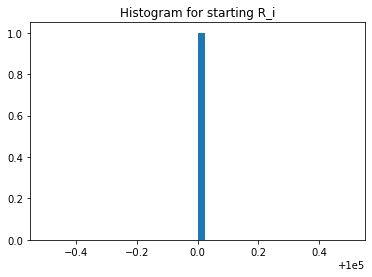

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 300001., 200015.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14999.])

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

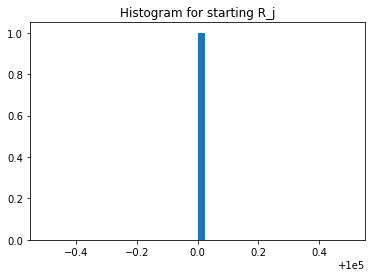

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000., 108430., 106443., ..., 121699., 101740., 124259.])

In [31]:
experiments.UNI_ji.unique()

array([100000.,  92422.,  94142., ...,  82436.,  80727., 105350.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


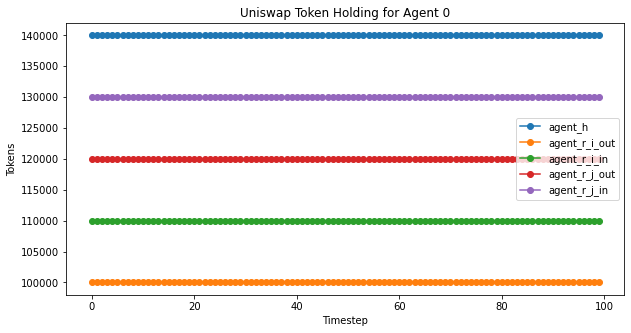

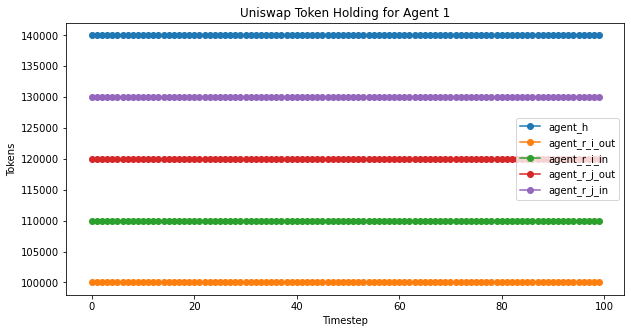

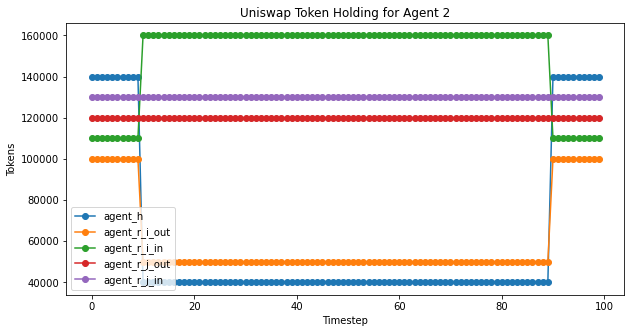

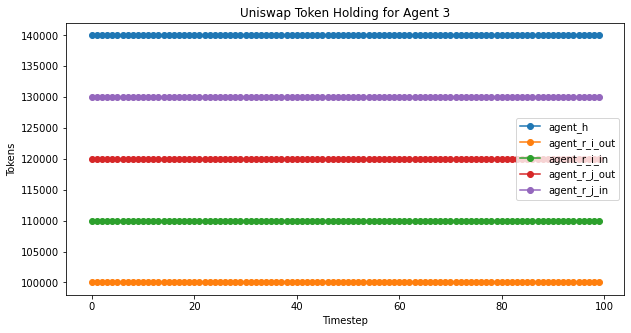

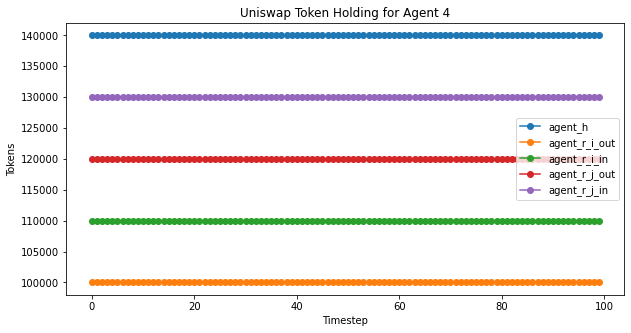

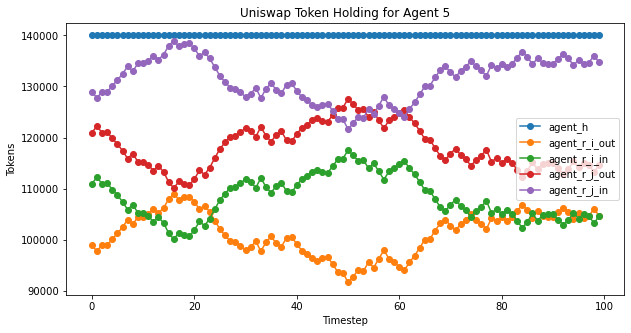

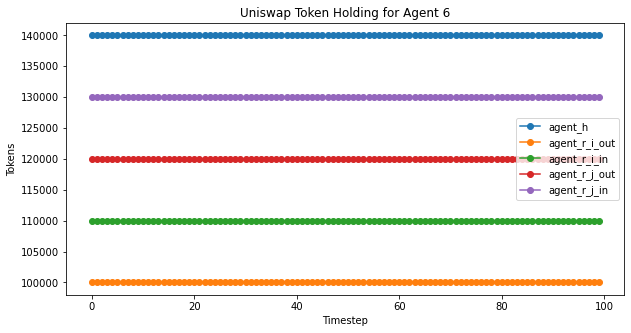

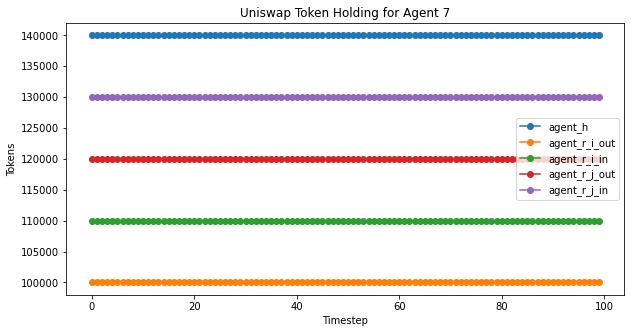

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


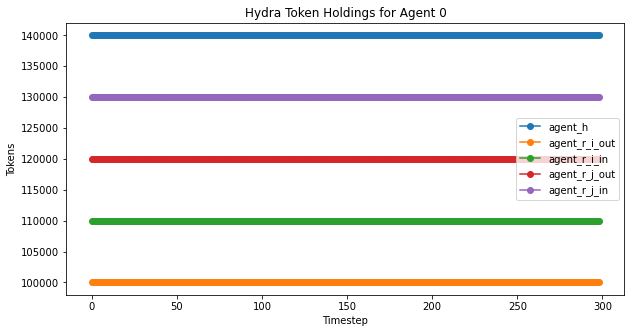

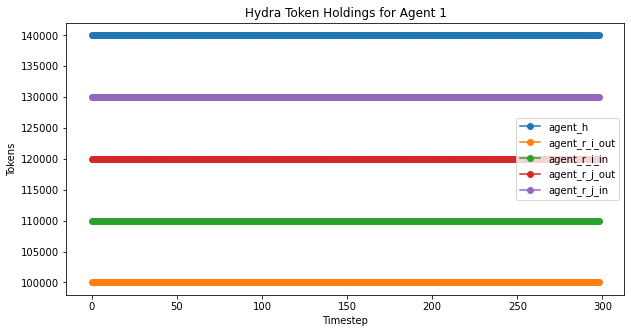

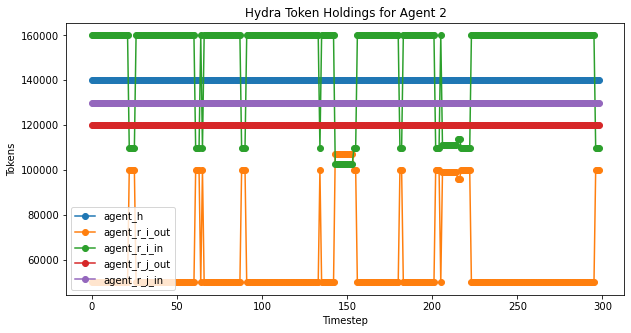

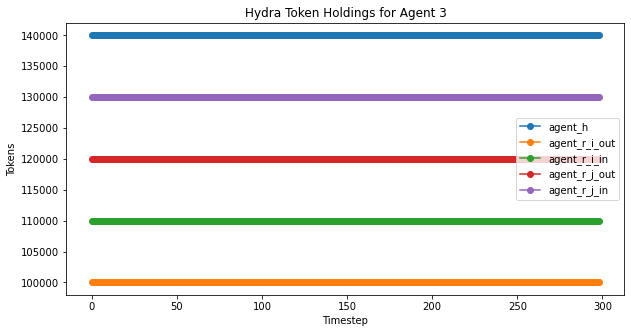

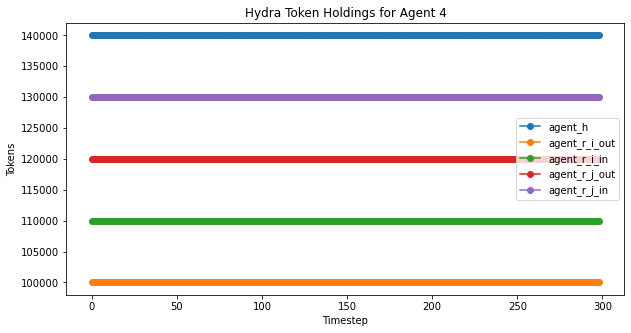

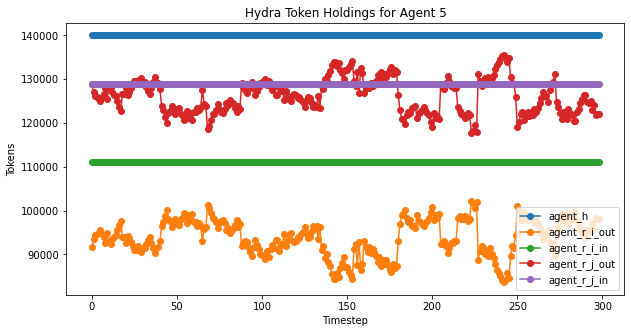

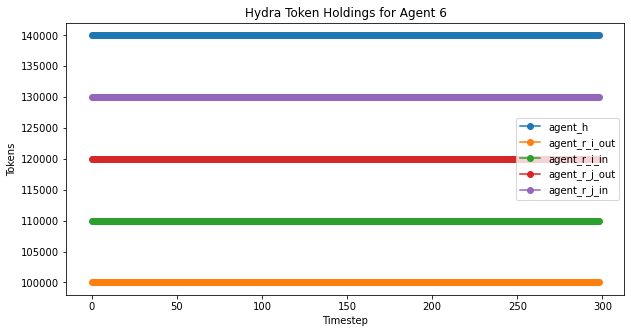

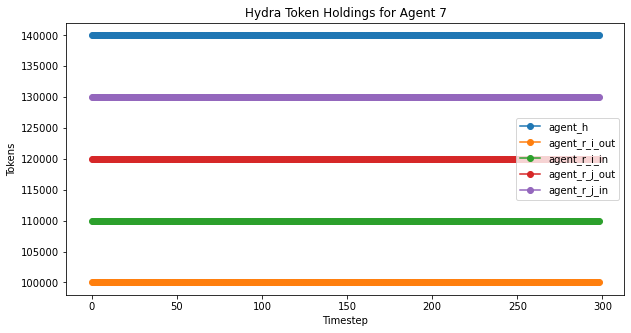

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

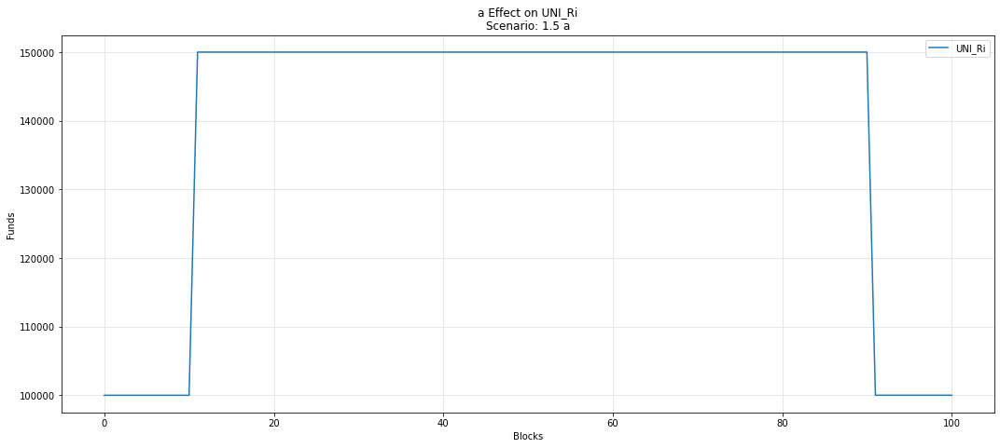

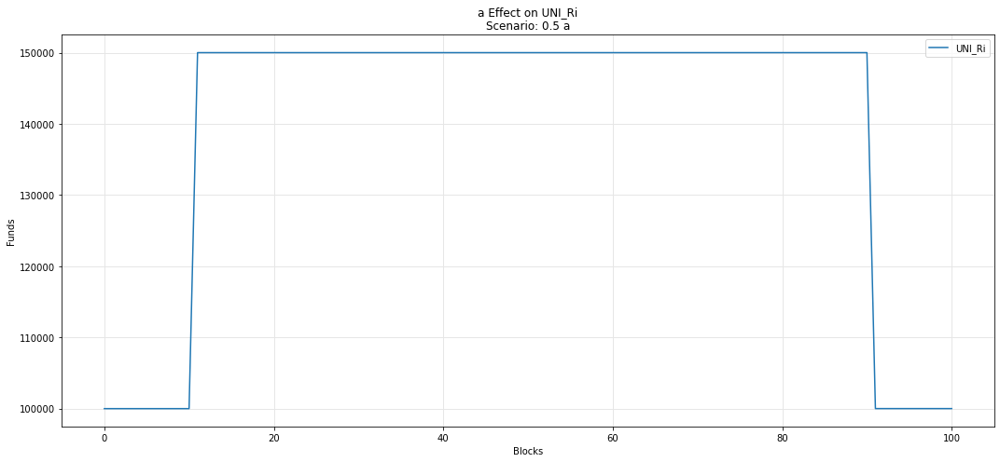

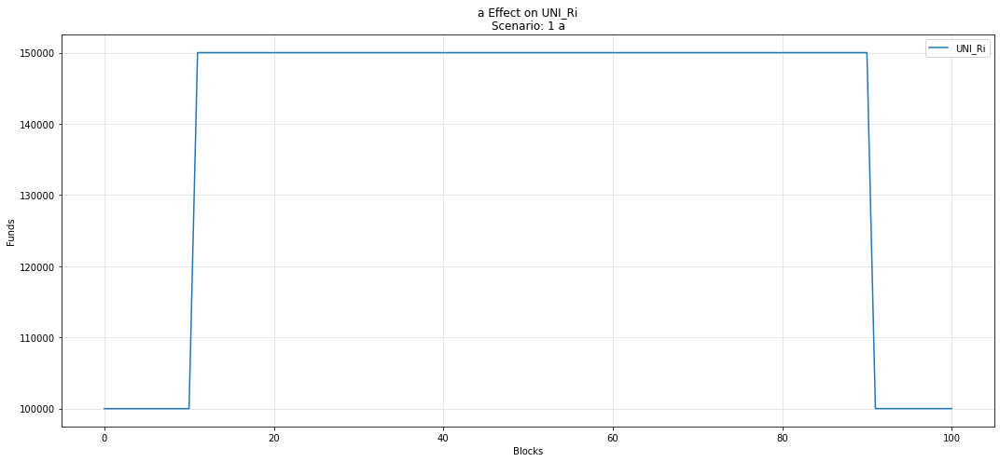

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

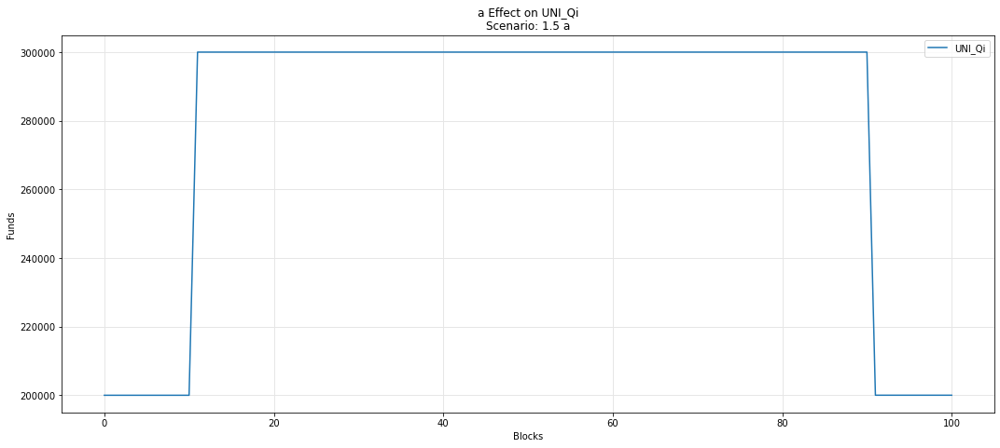

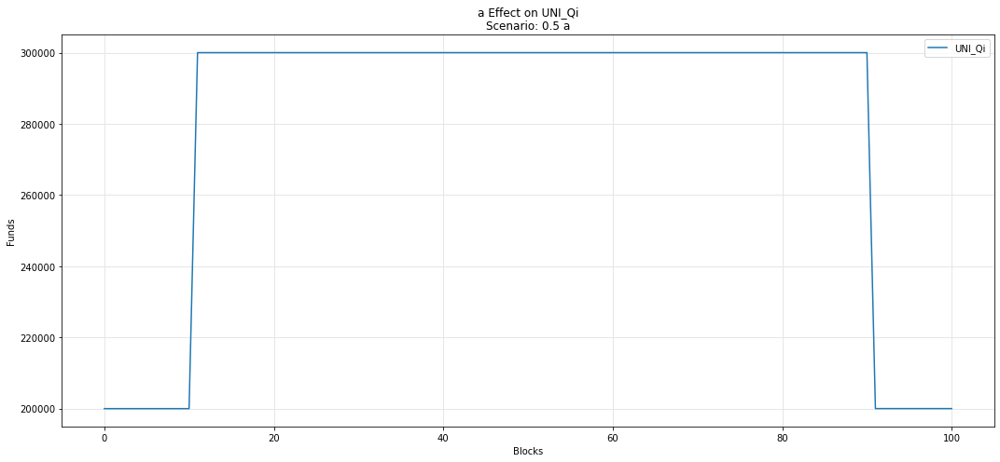

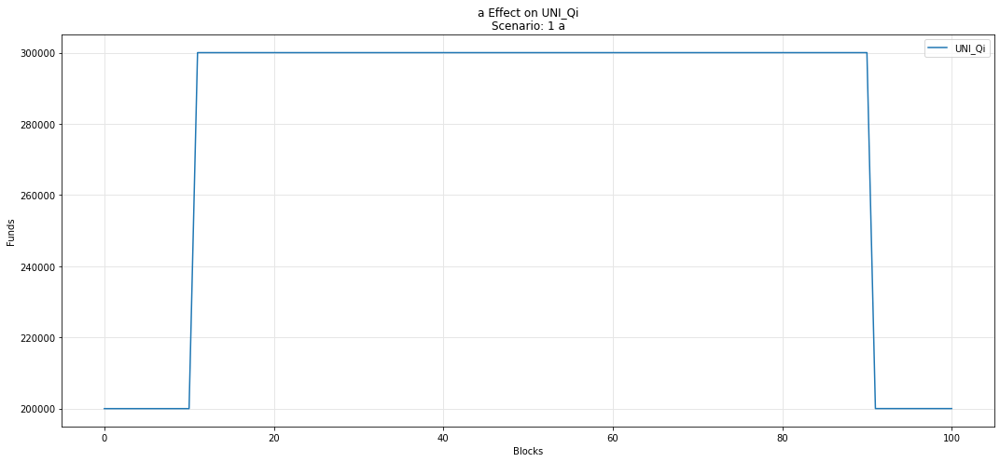

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

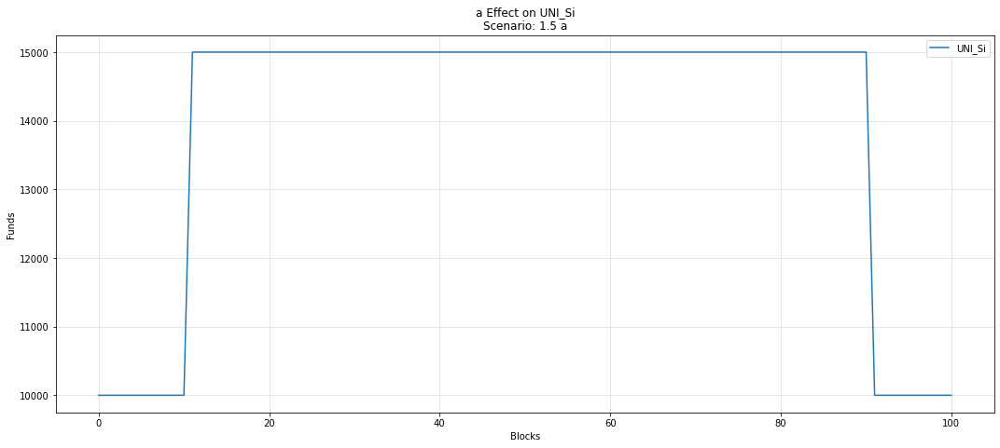

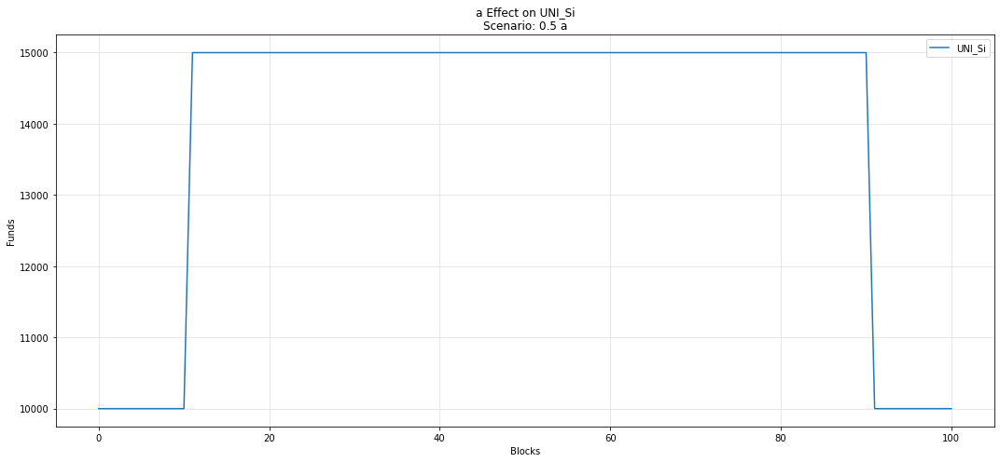

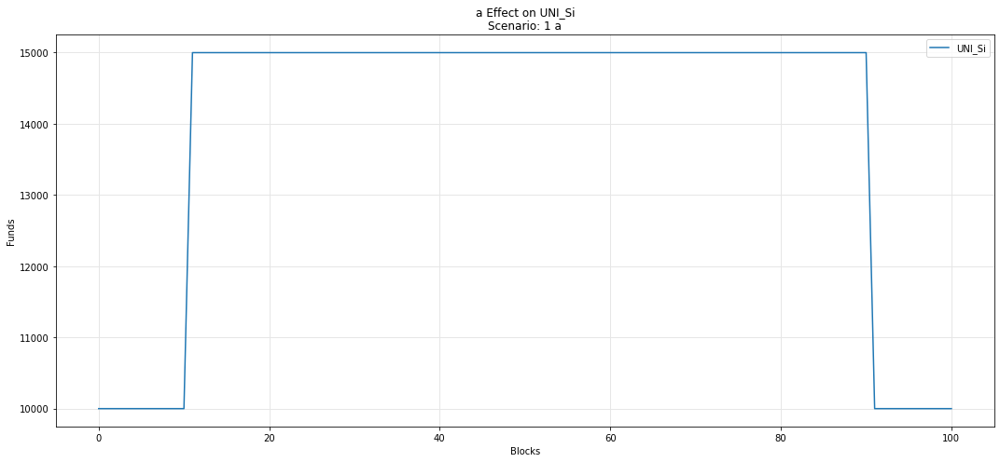

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

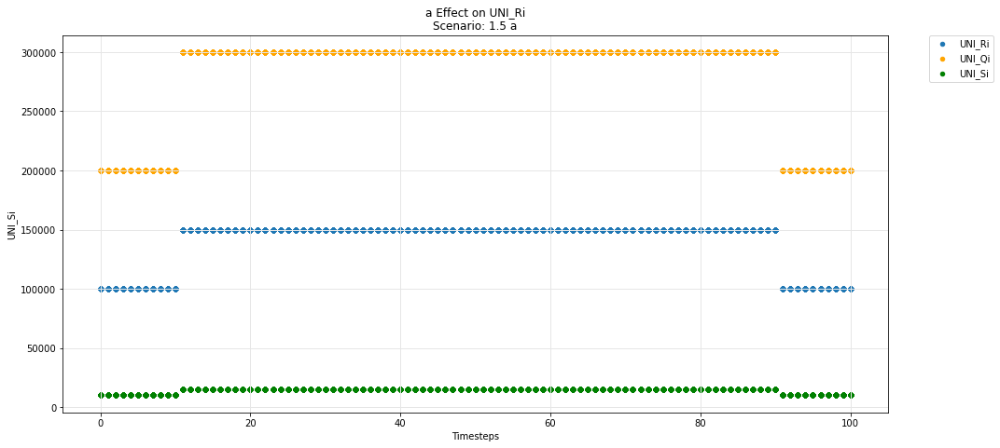

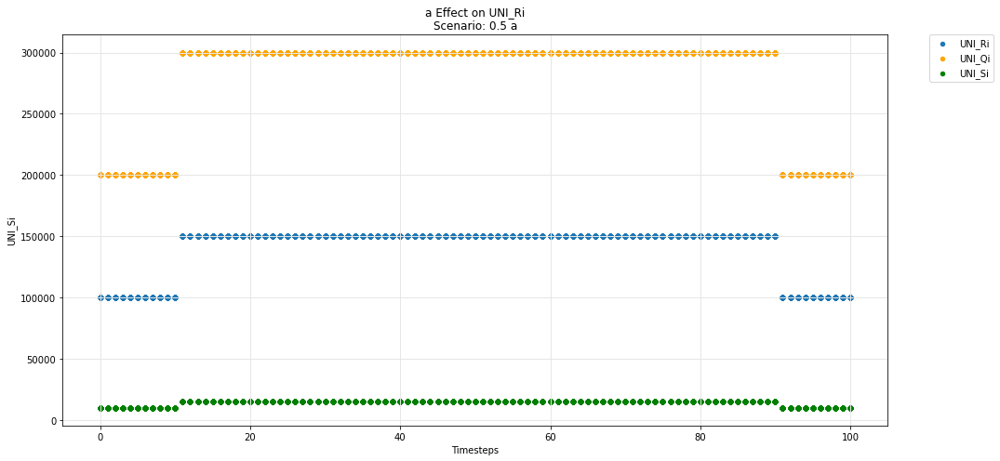

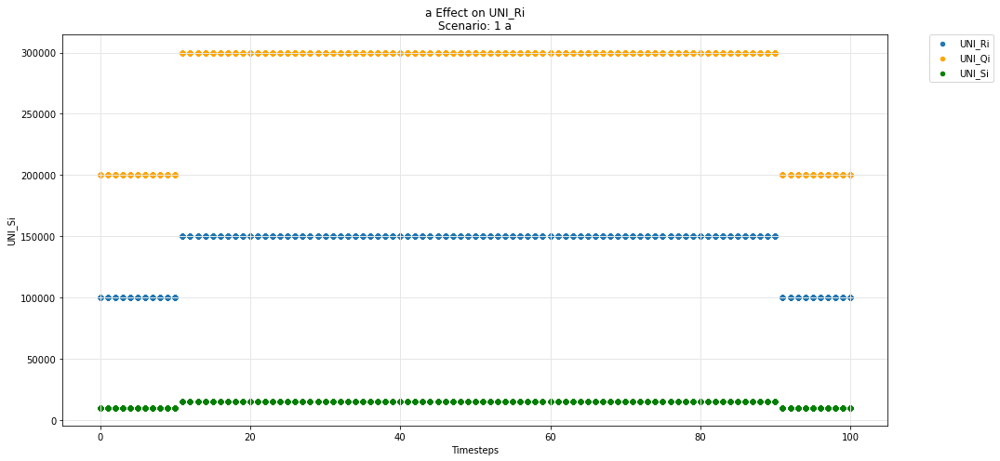

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

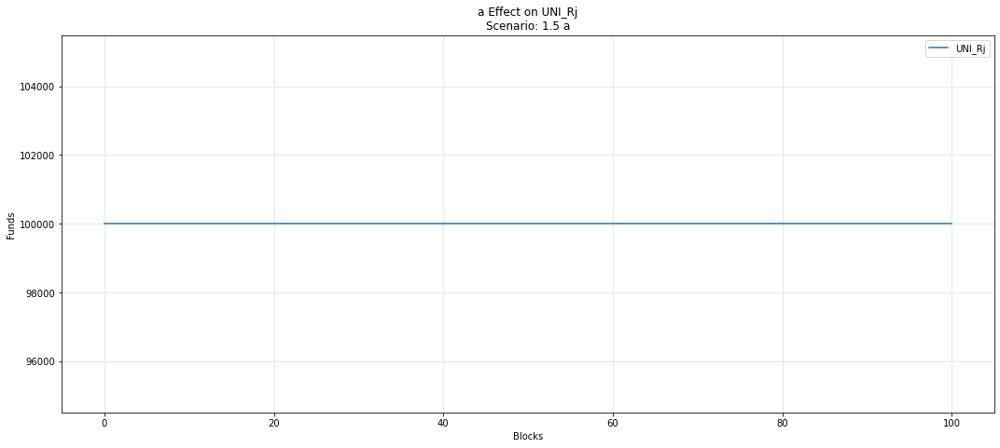

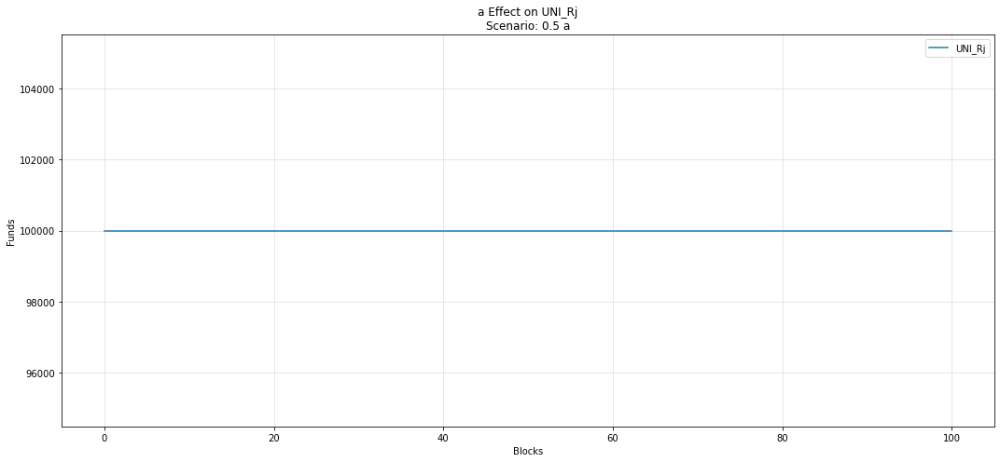

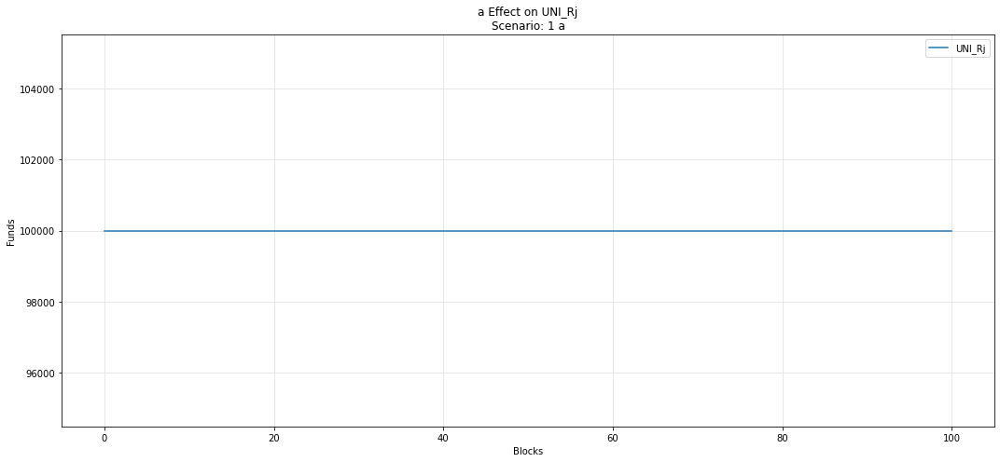

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

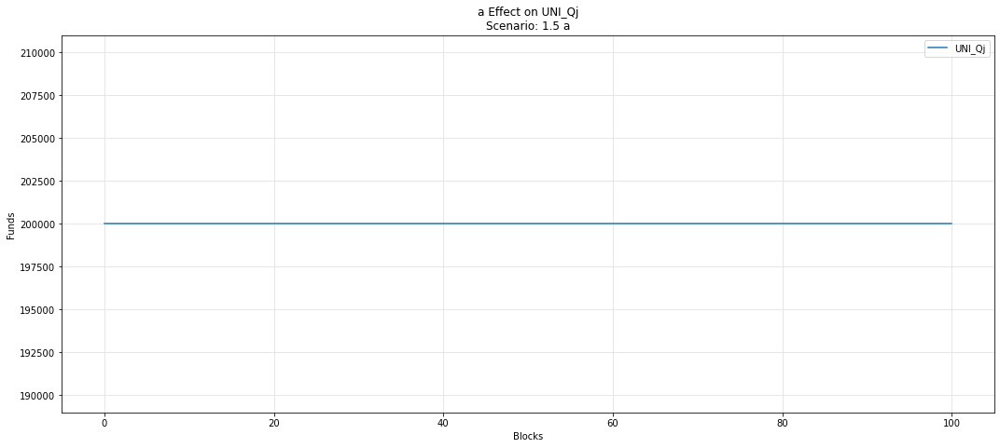

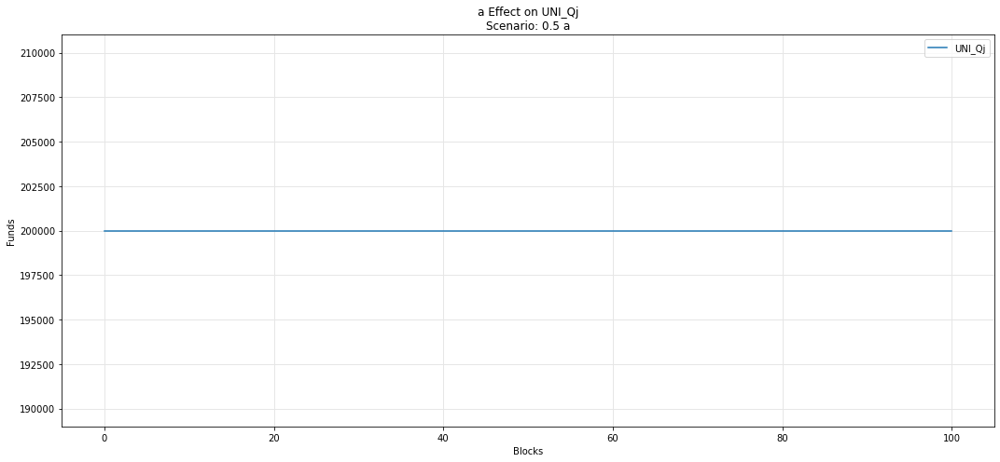

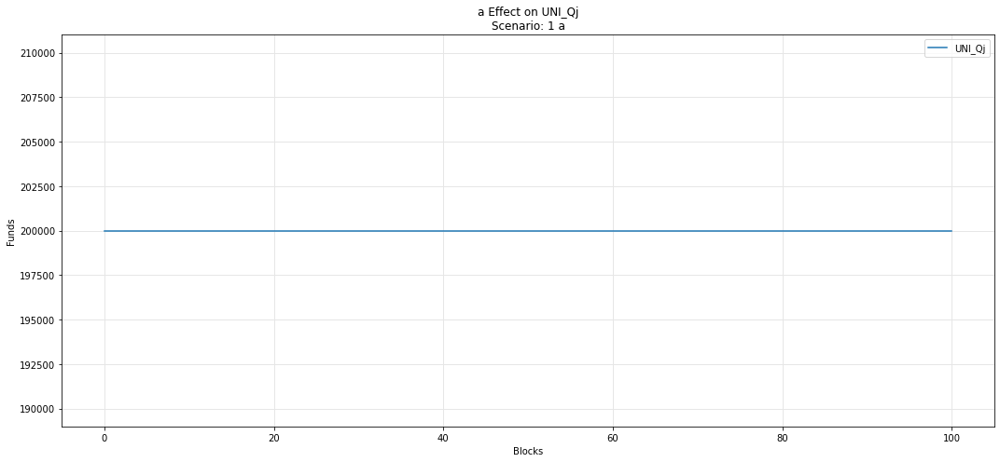

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

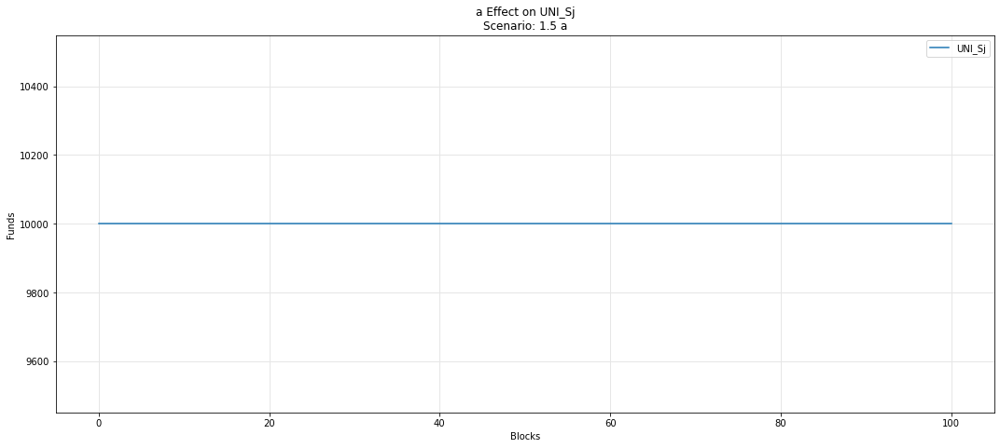

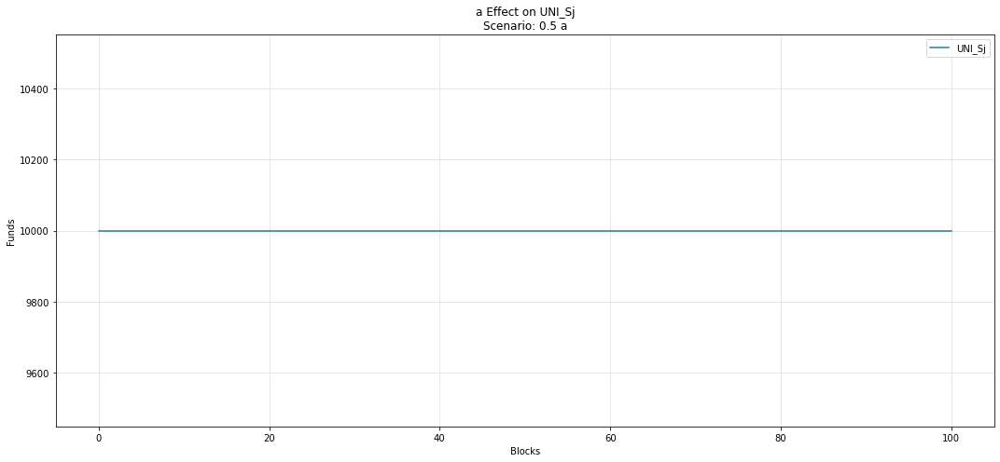

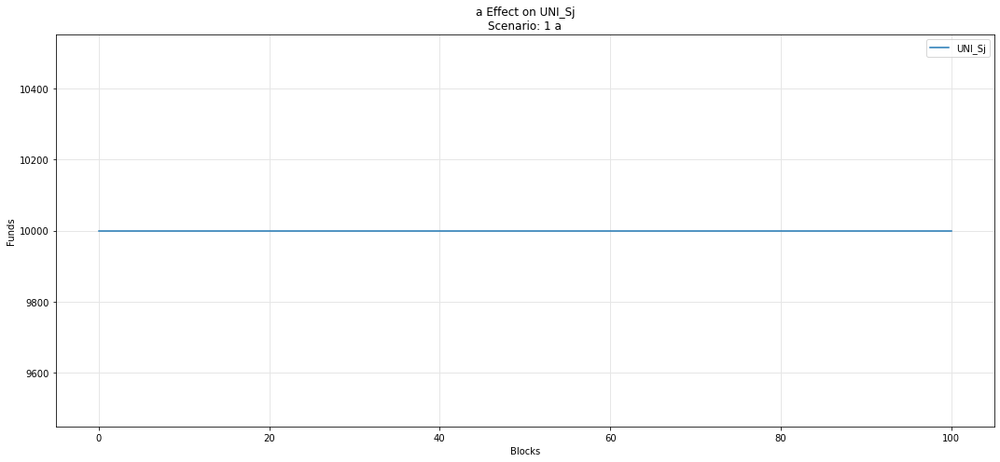

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

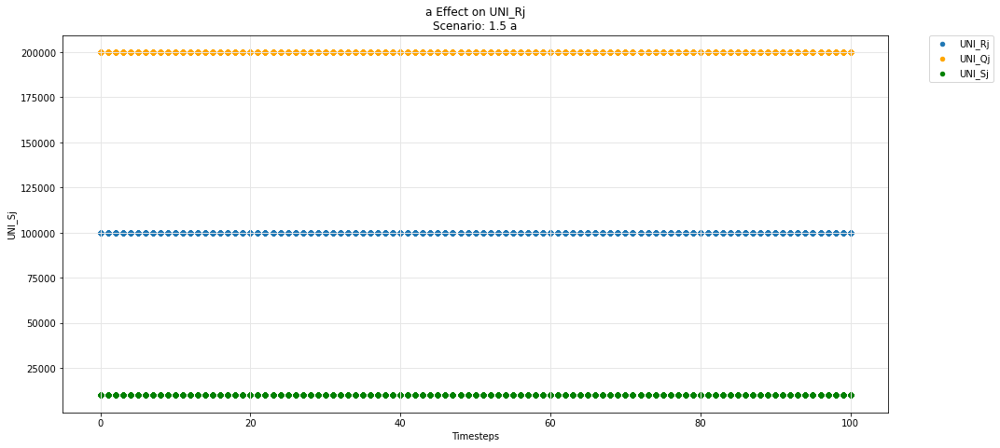

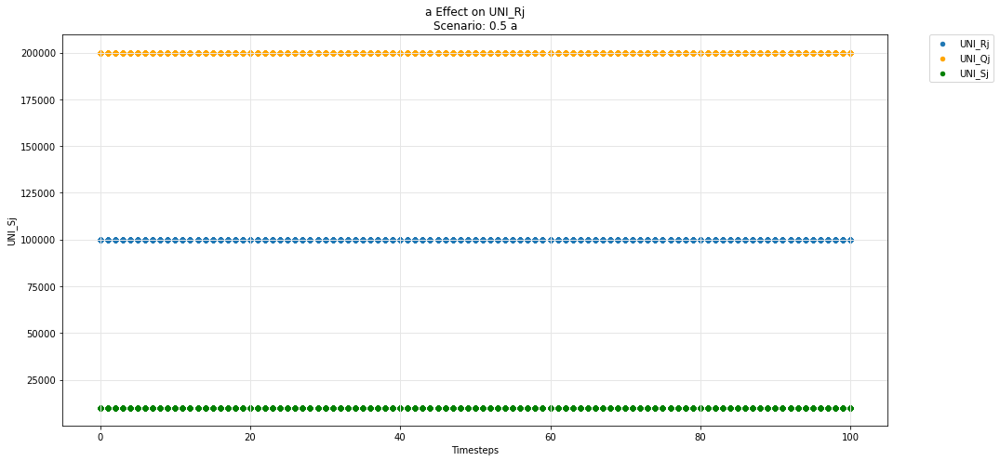

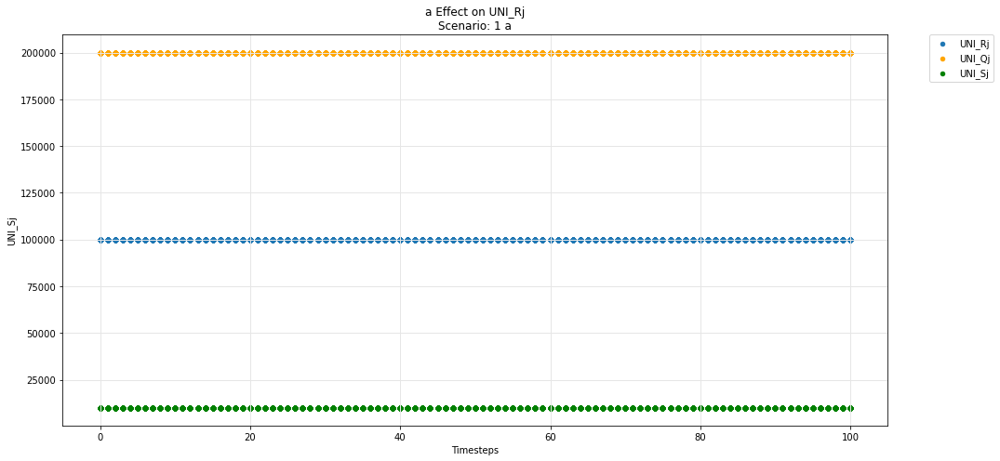

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

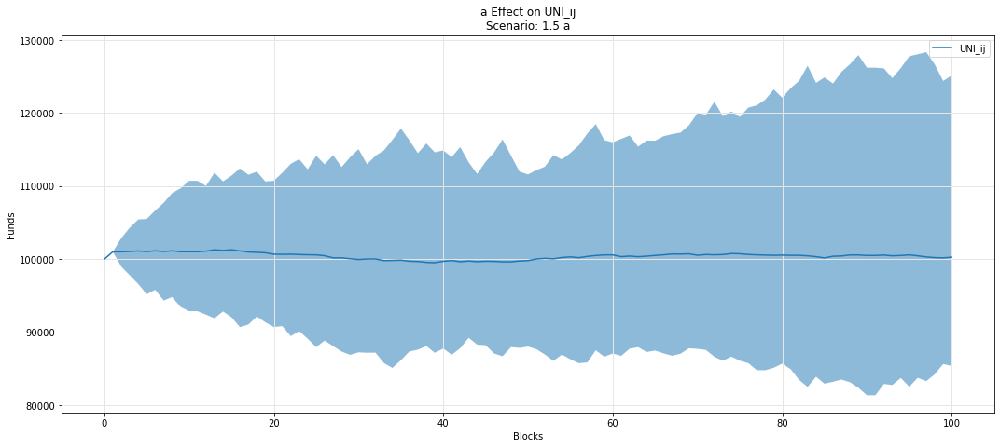

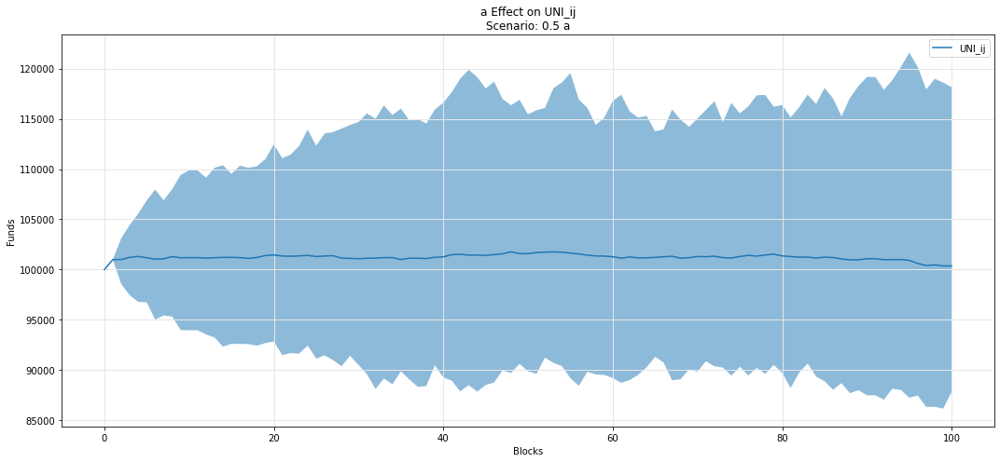

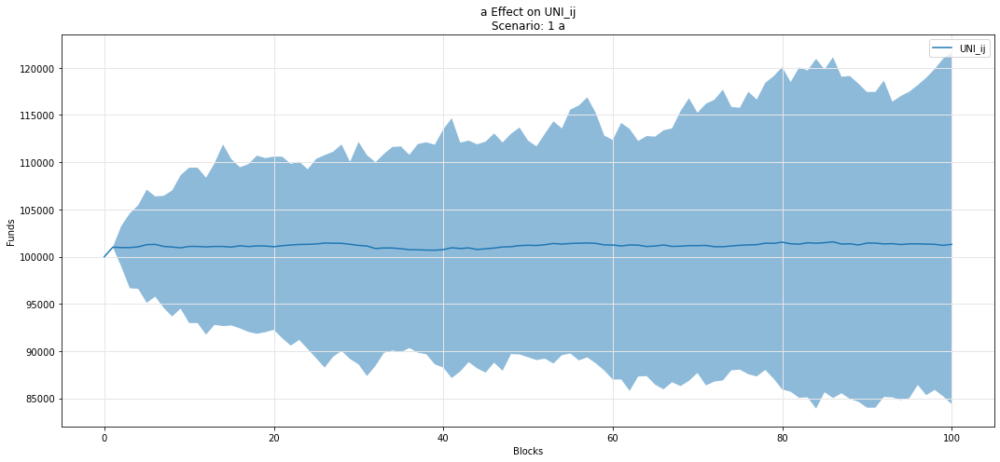

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

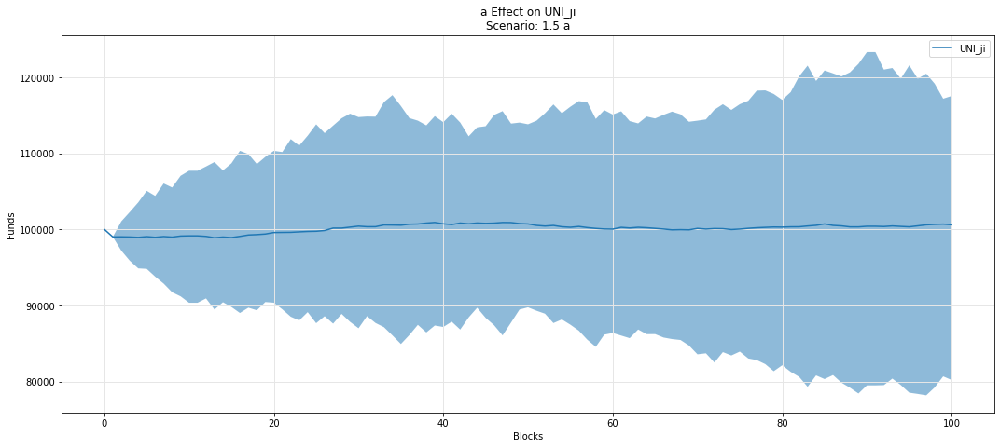

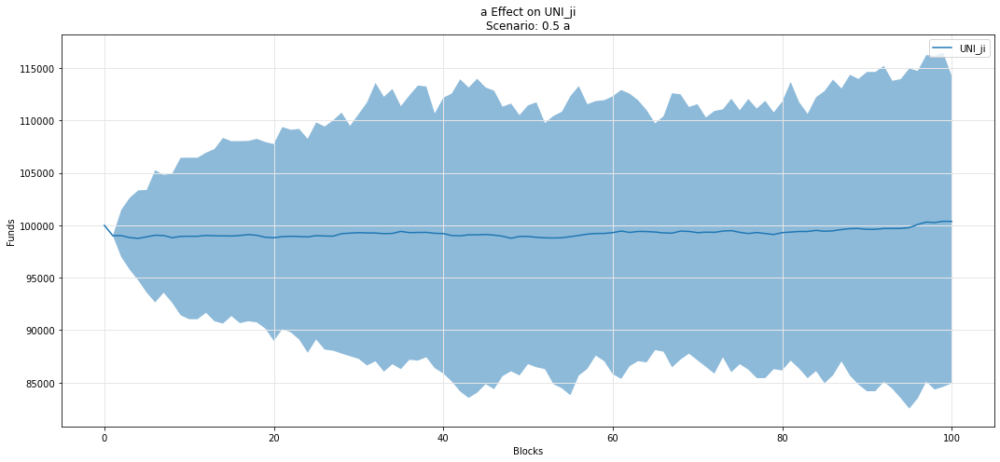

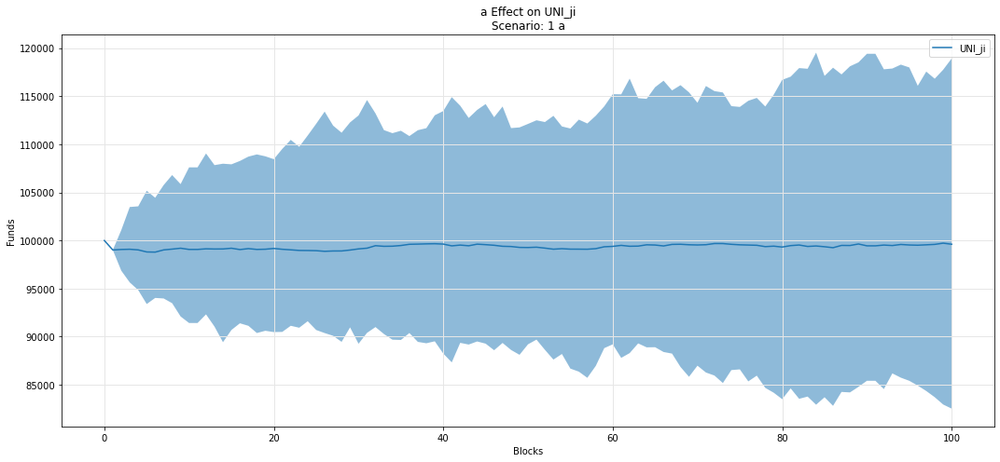

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

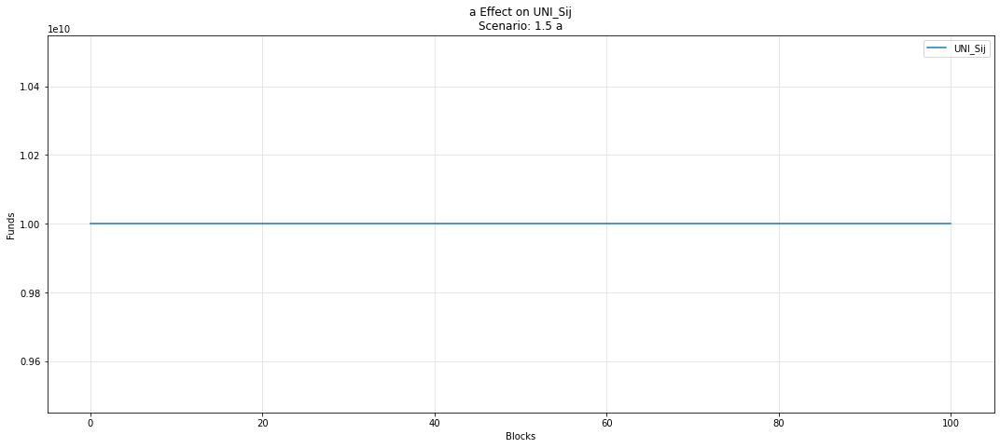

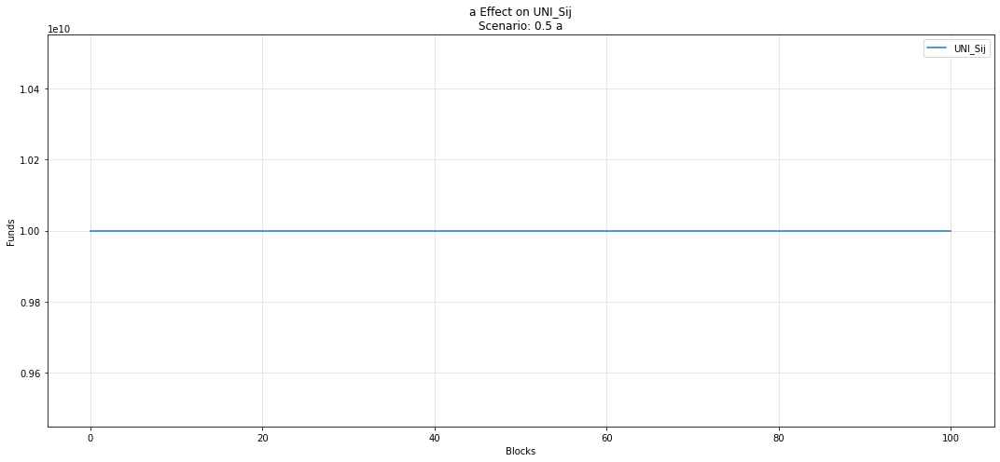

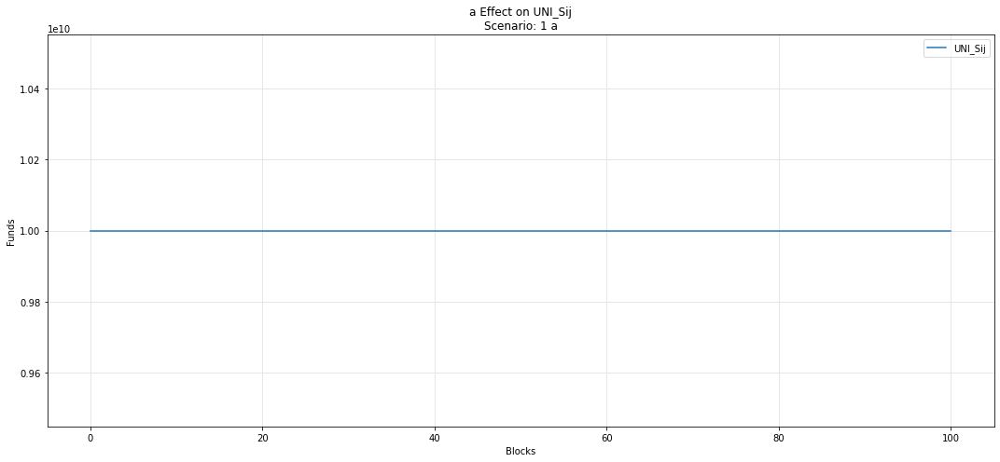

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

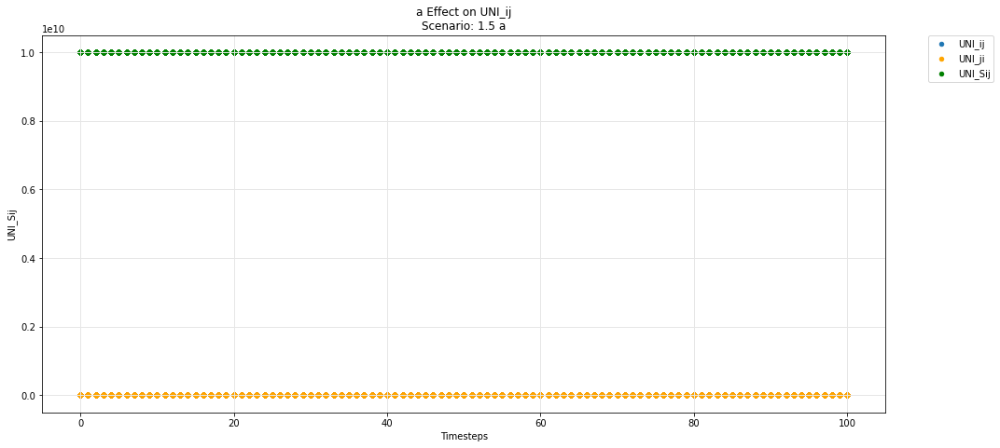

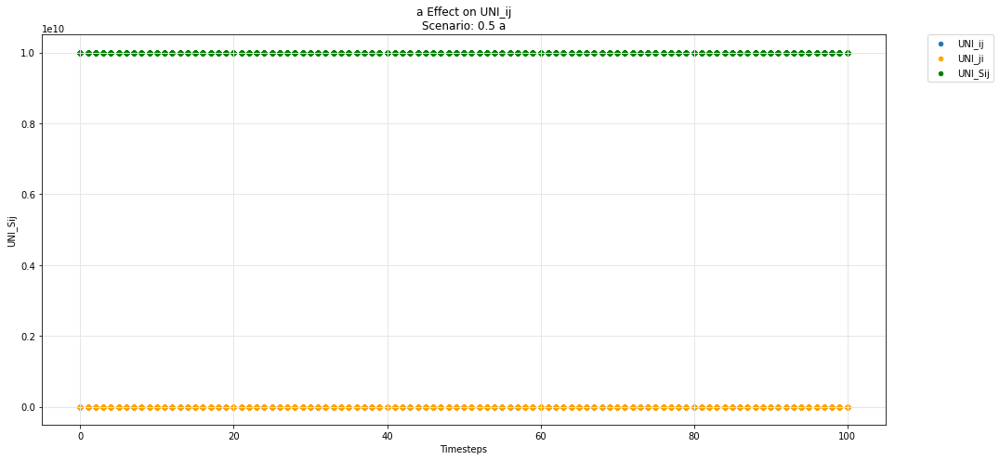

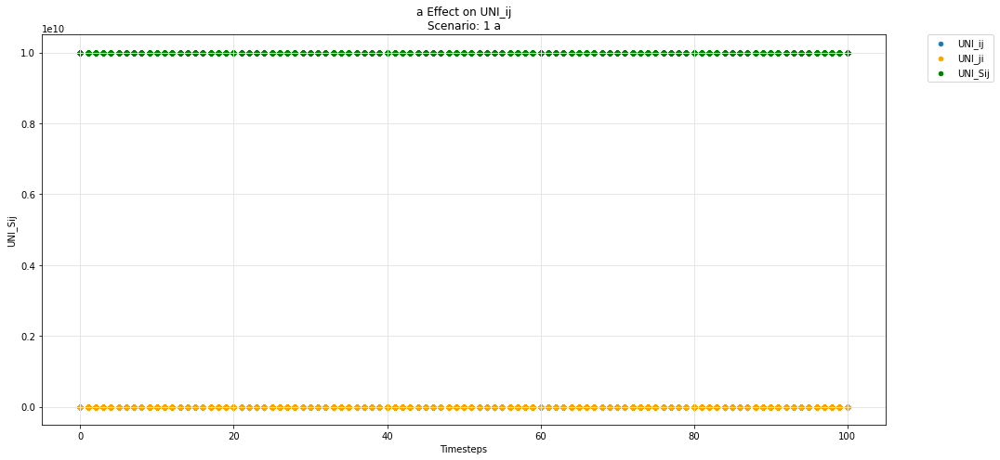

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

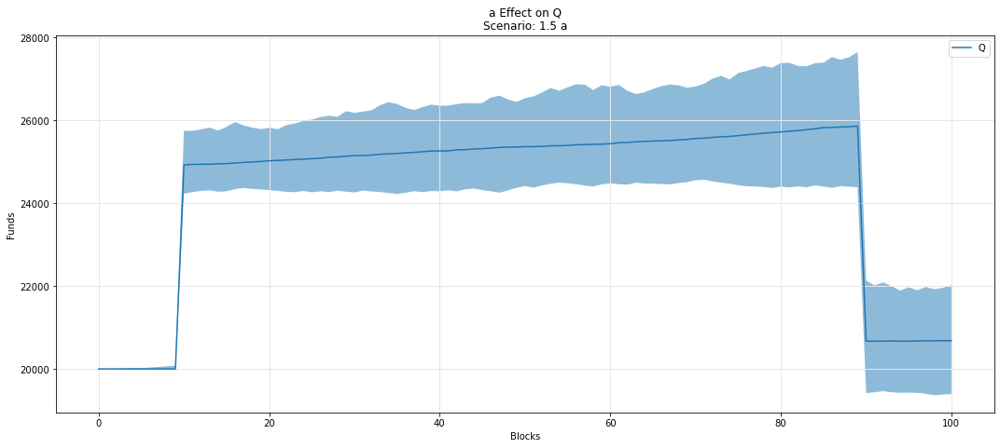

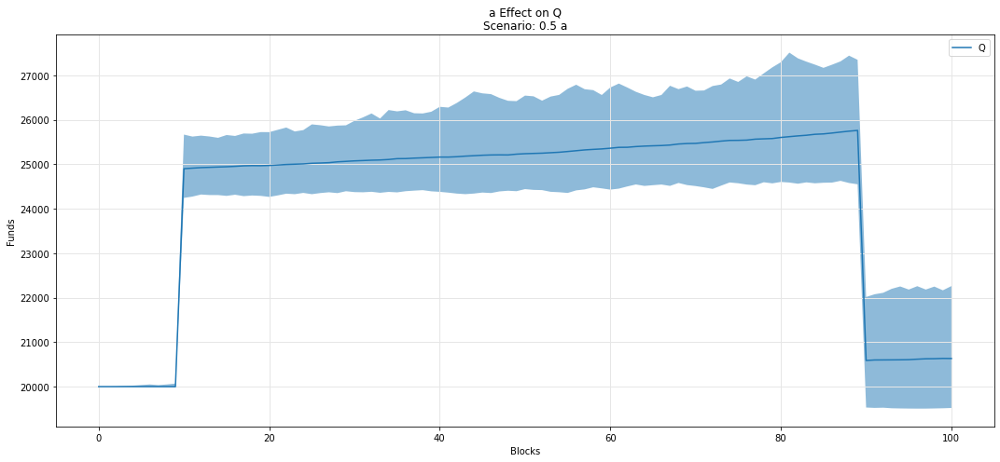

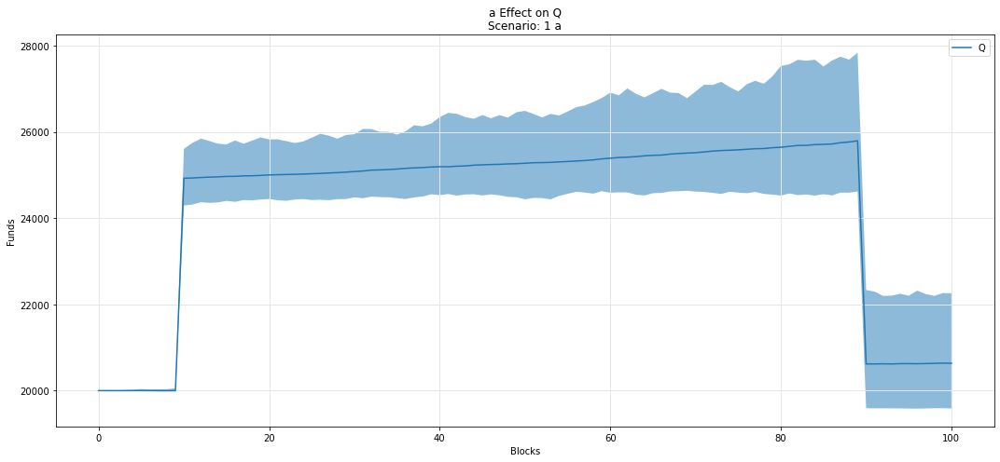

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

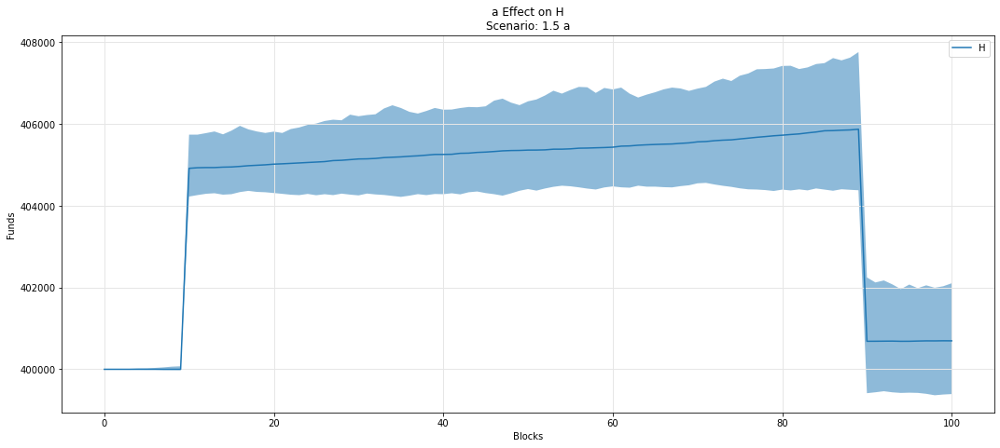

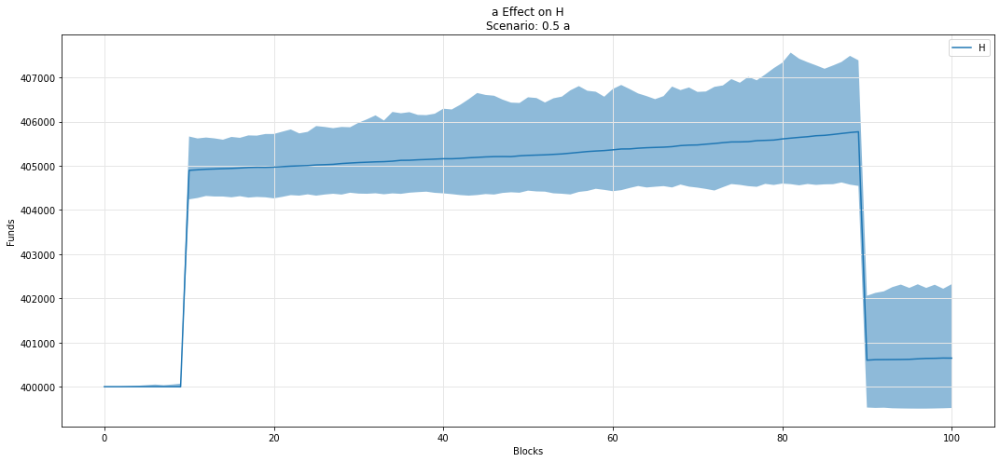

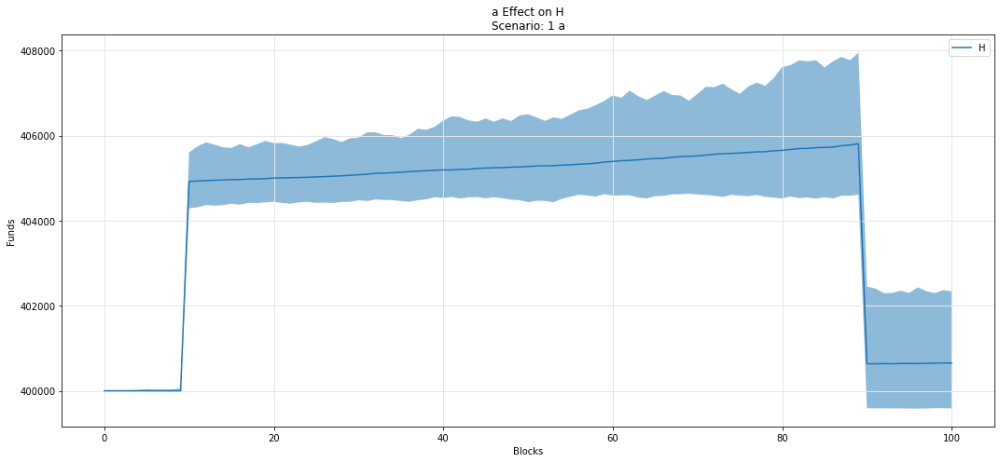

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

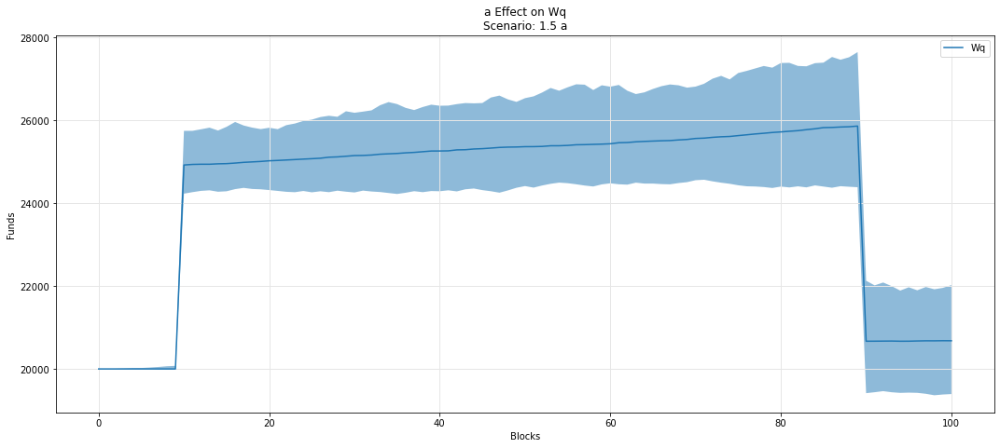

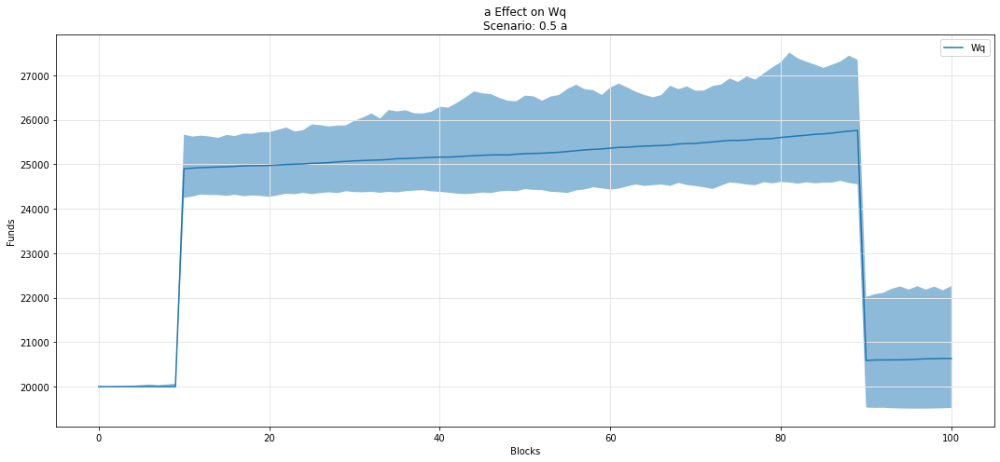

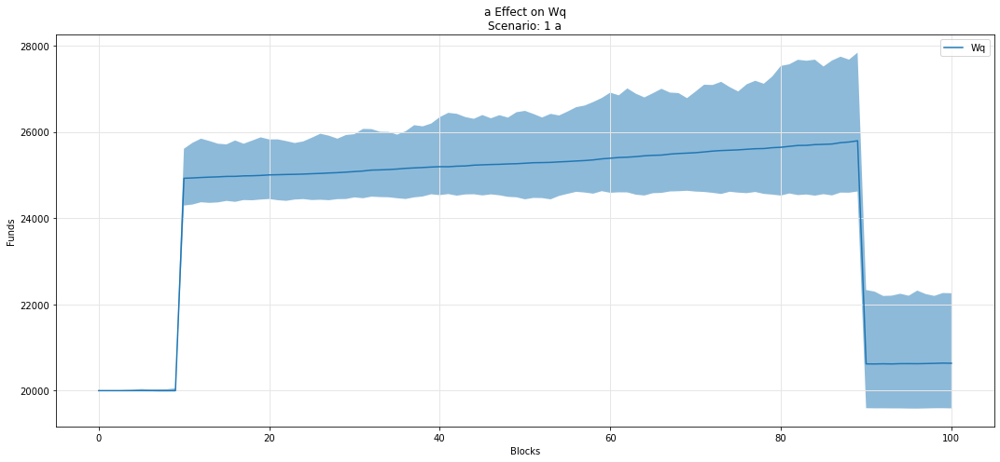

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

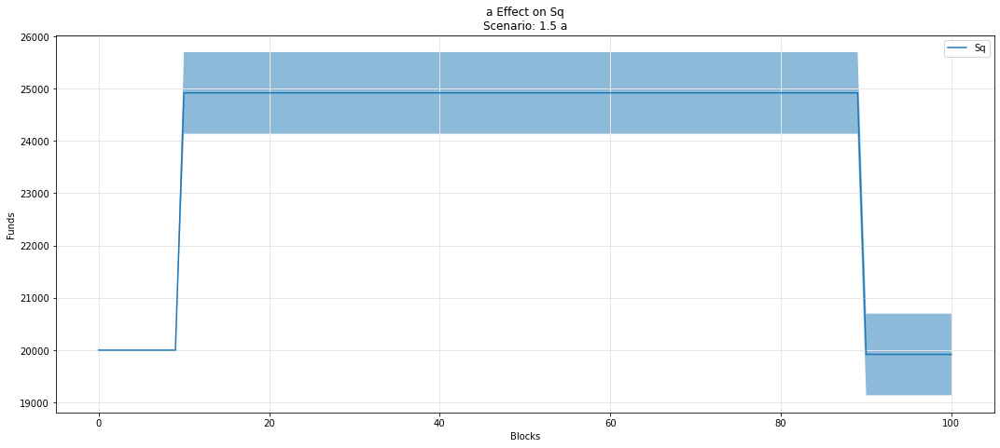

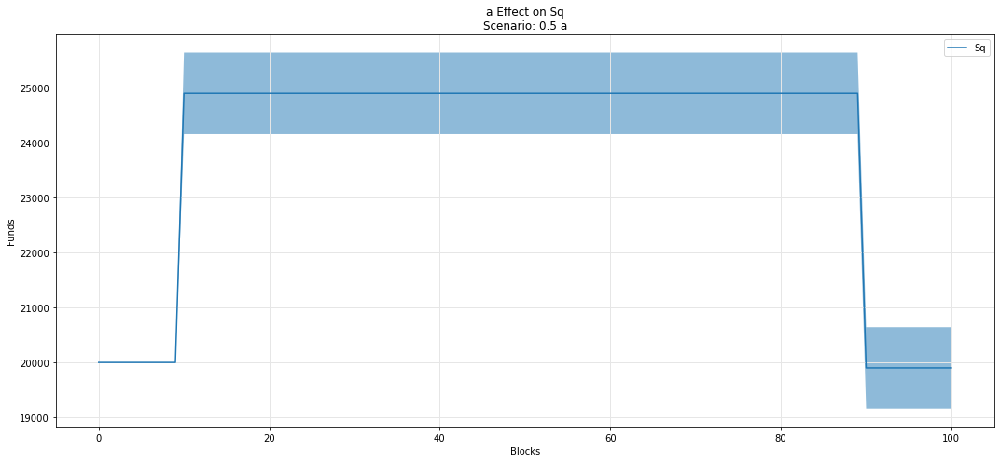

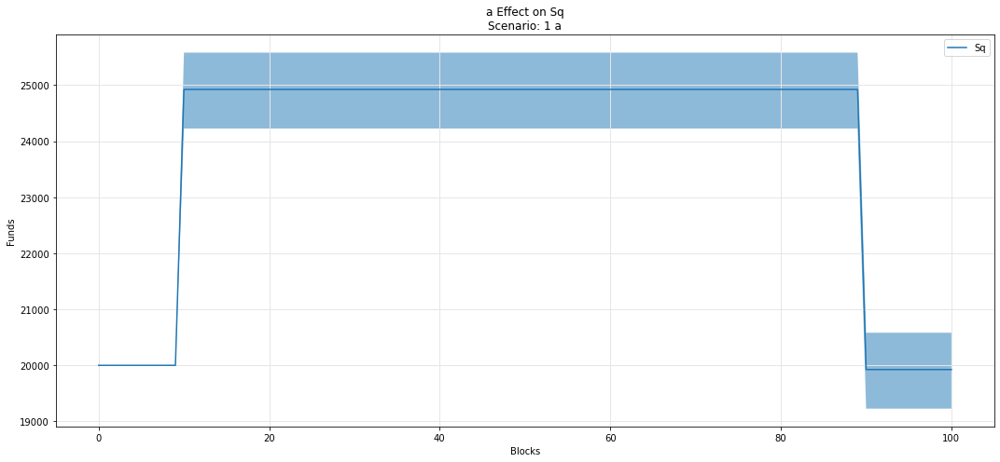

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

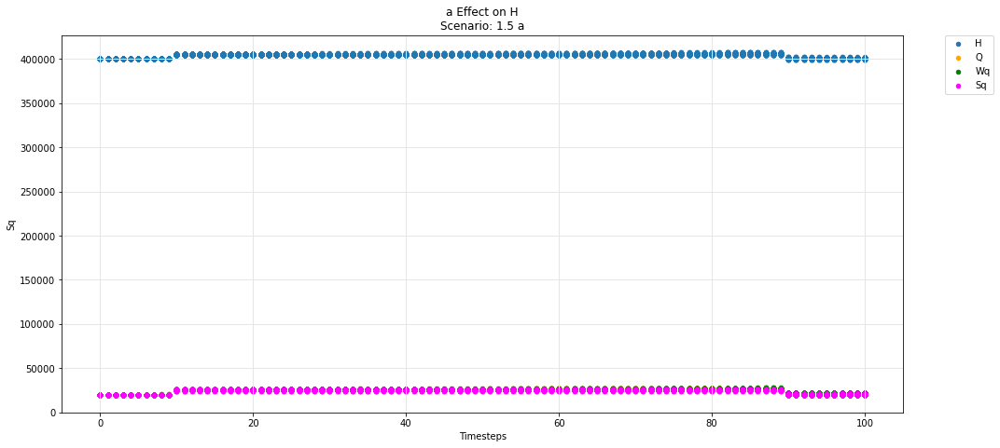

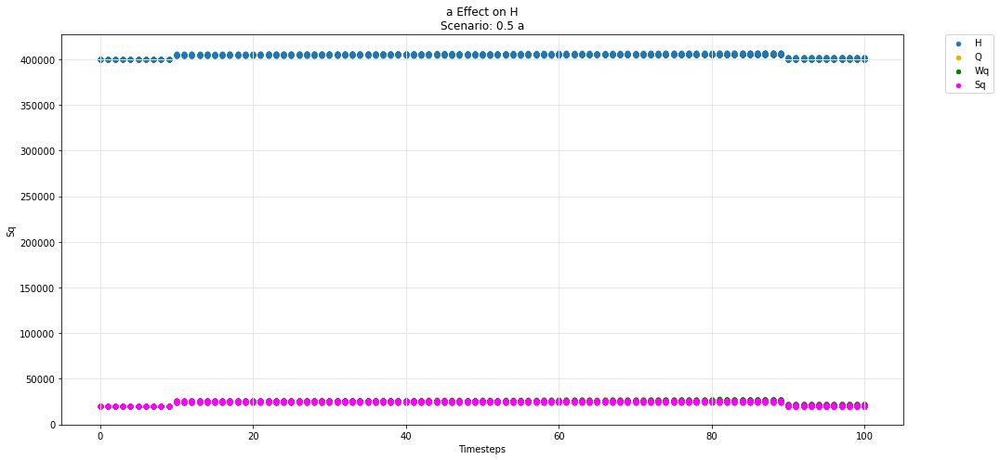

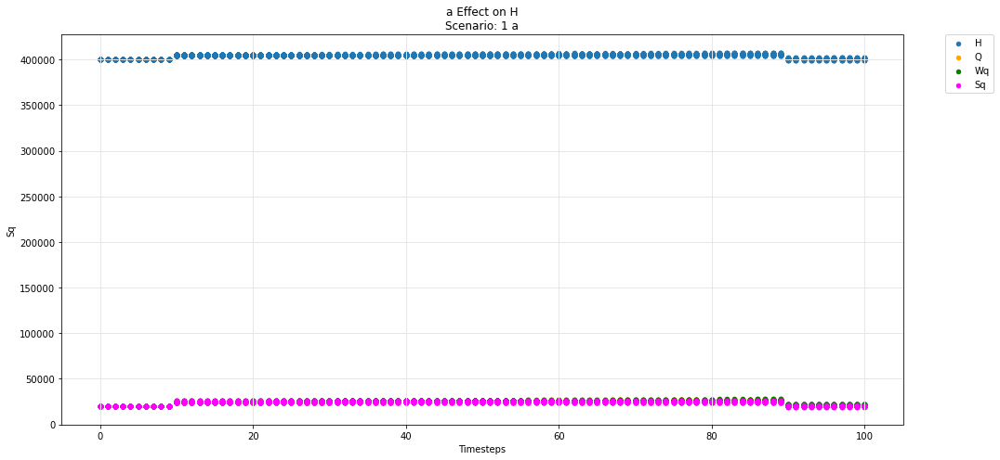

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

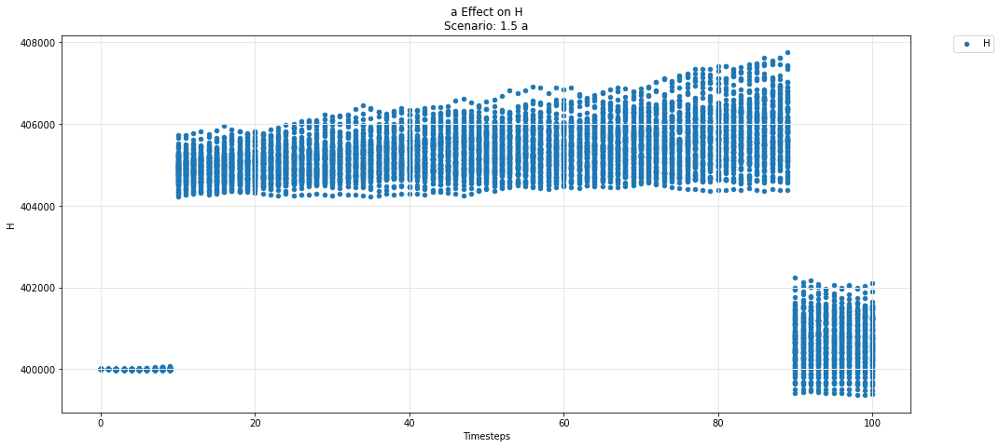

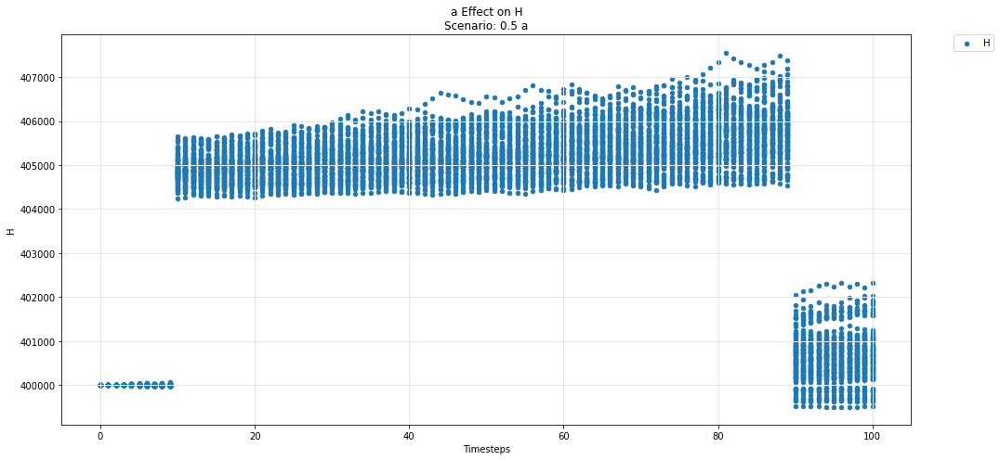

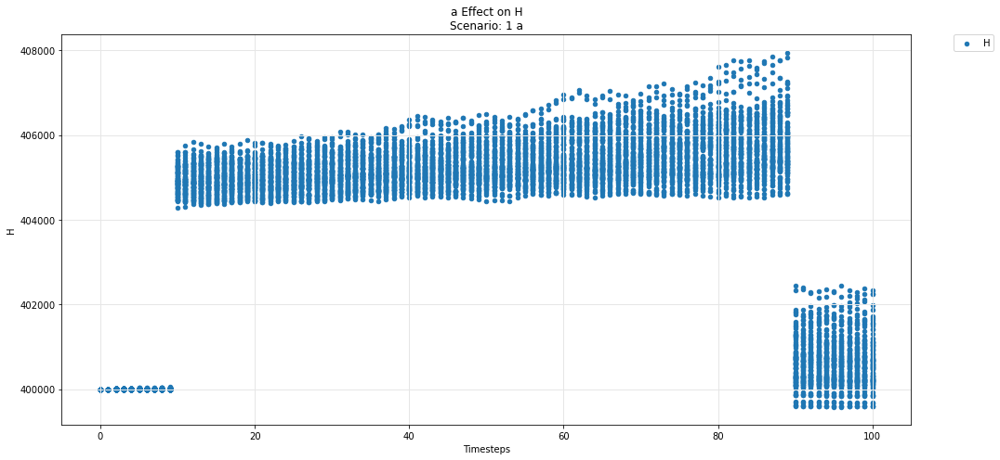

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

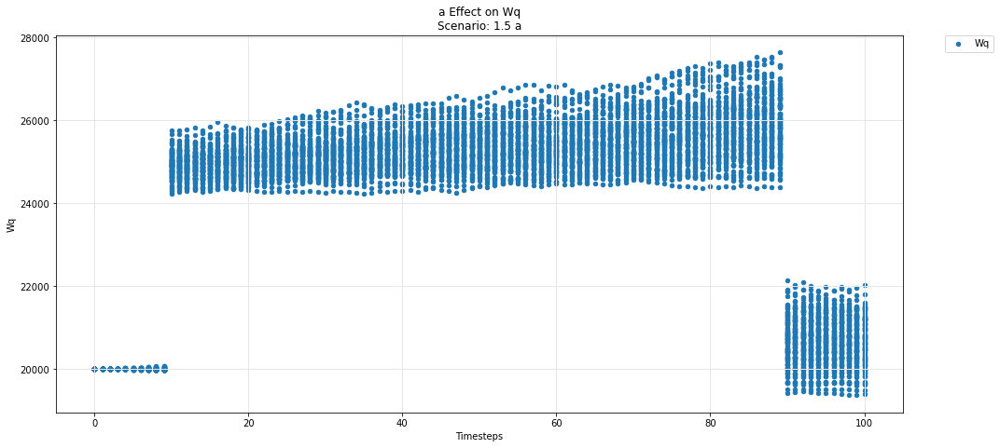

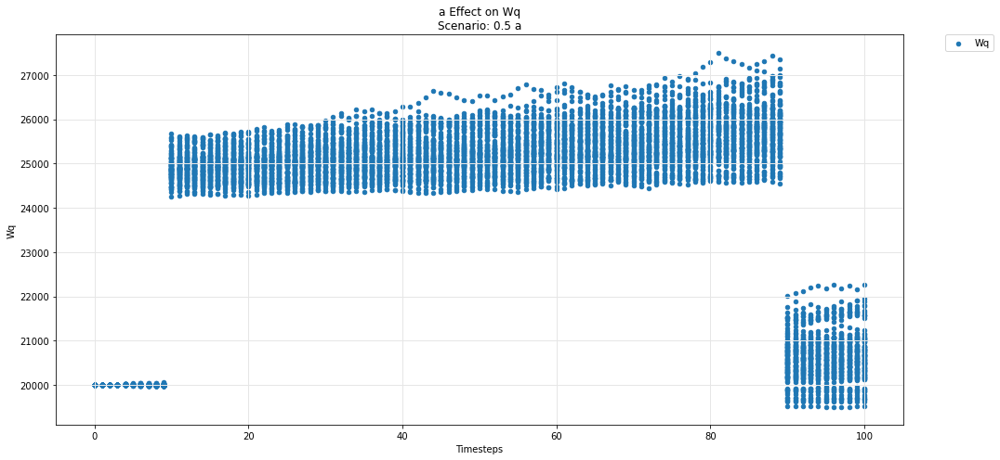

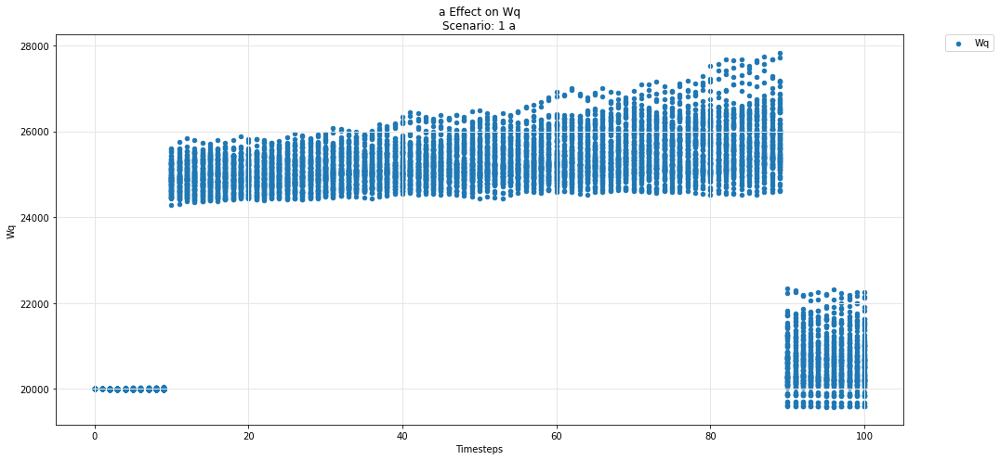

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

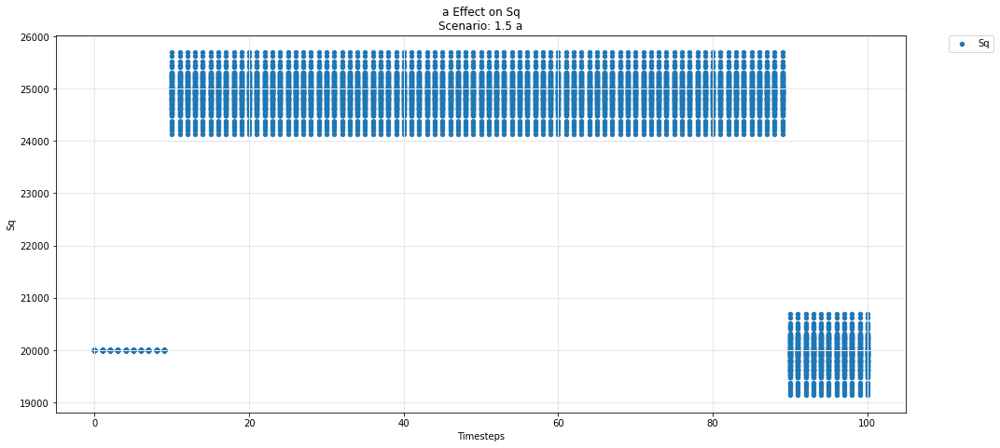

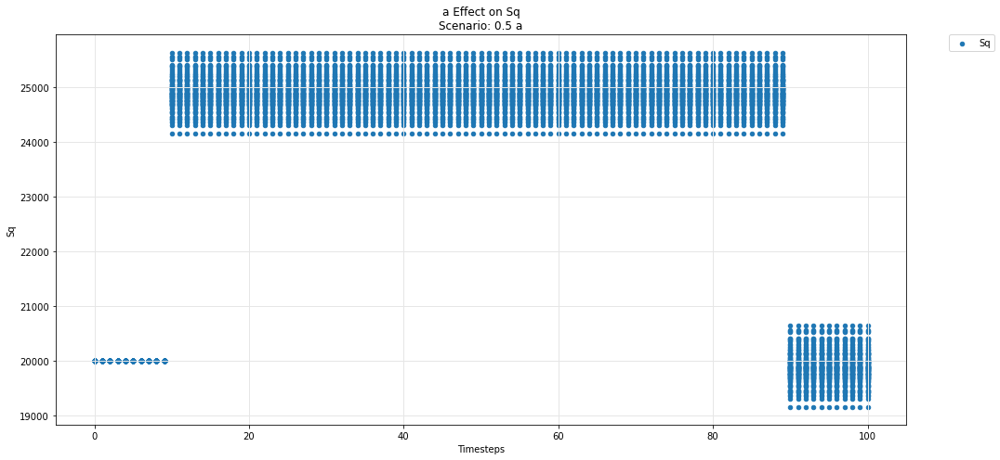

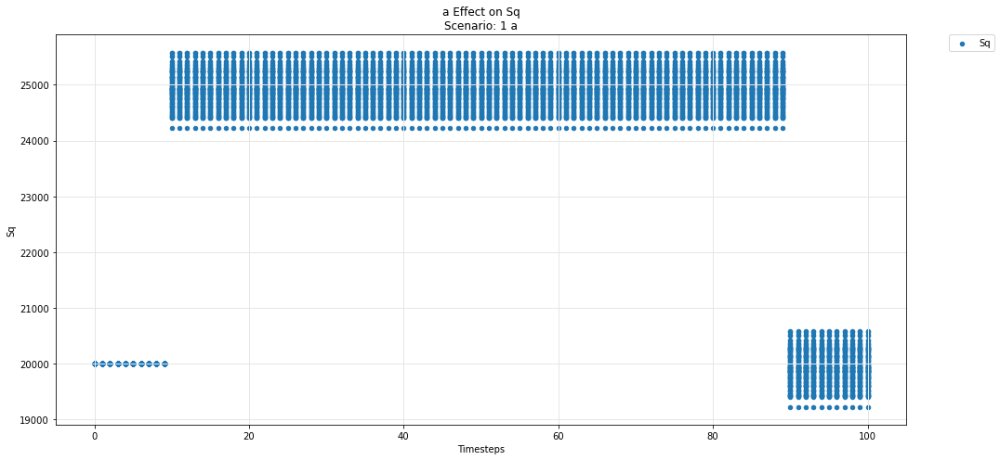

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

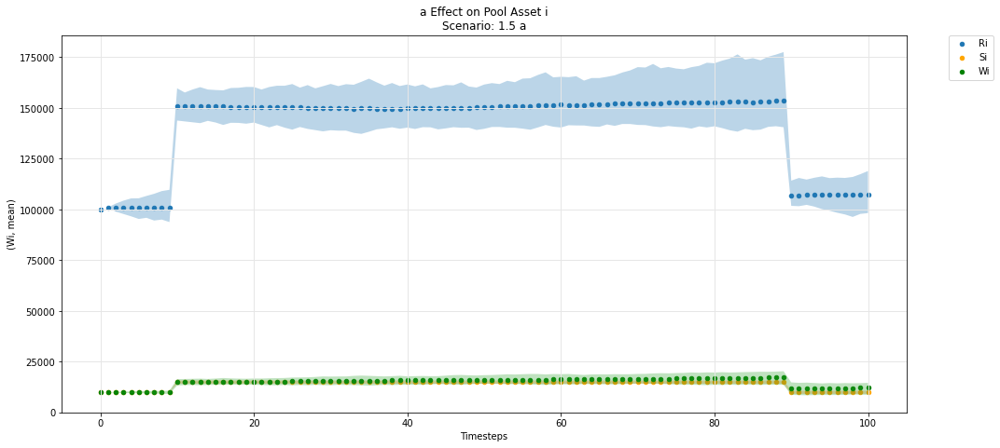

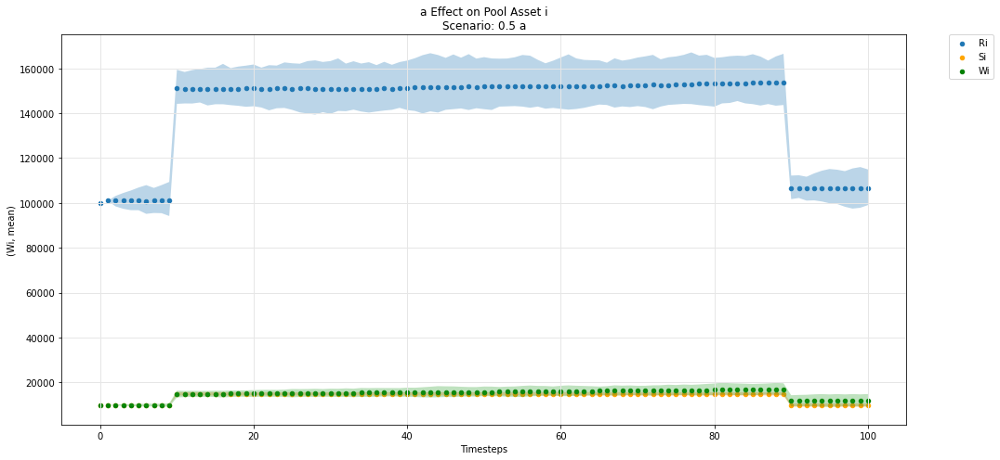

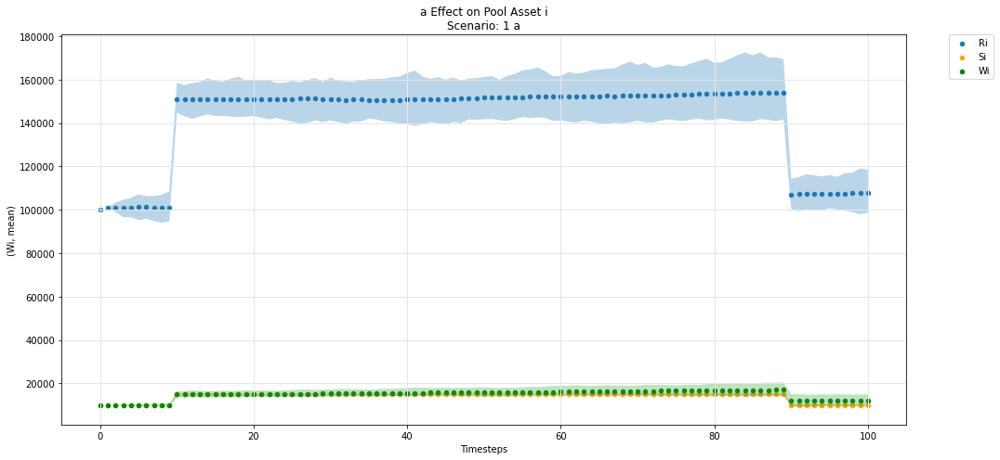

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

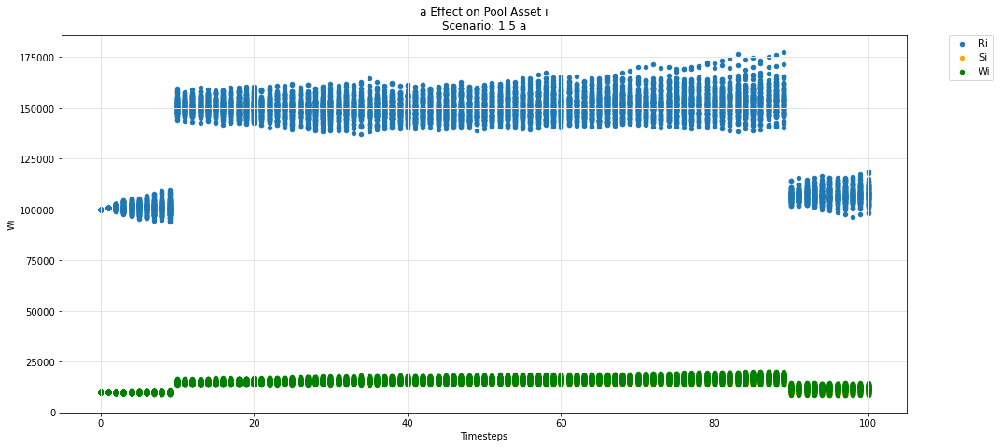

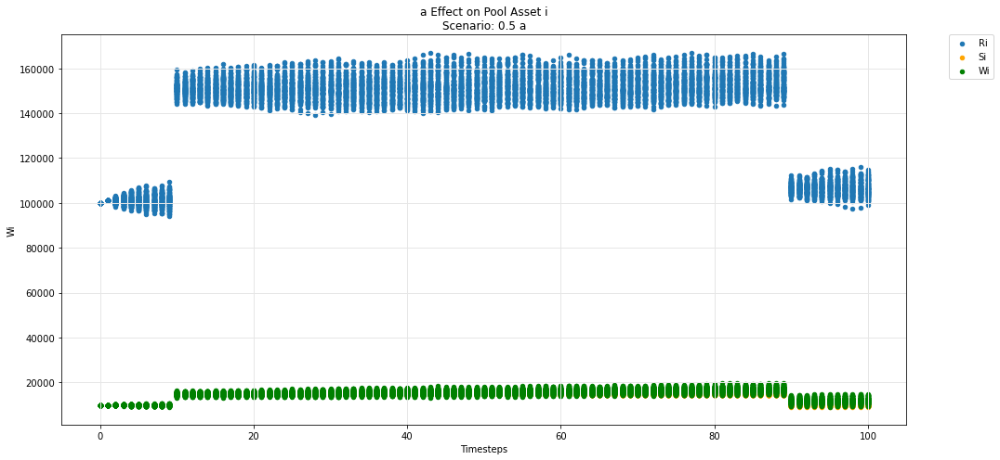

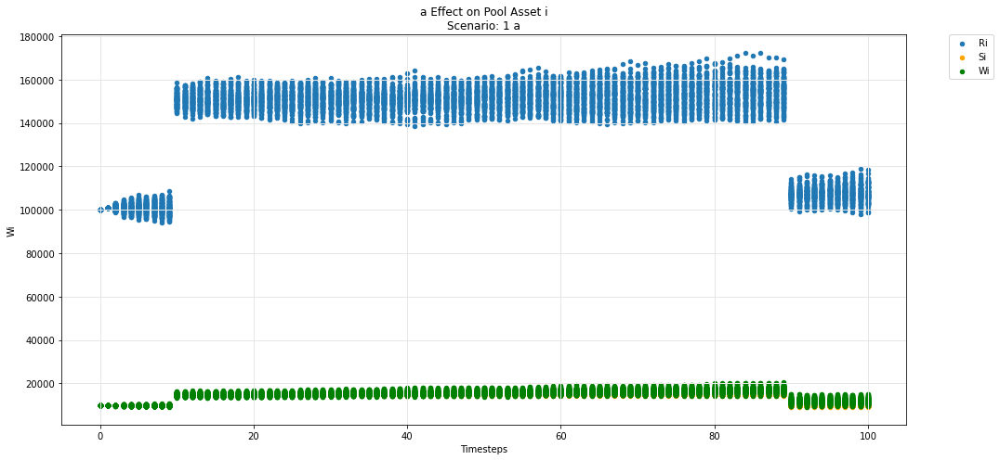

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

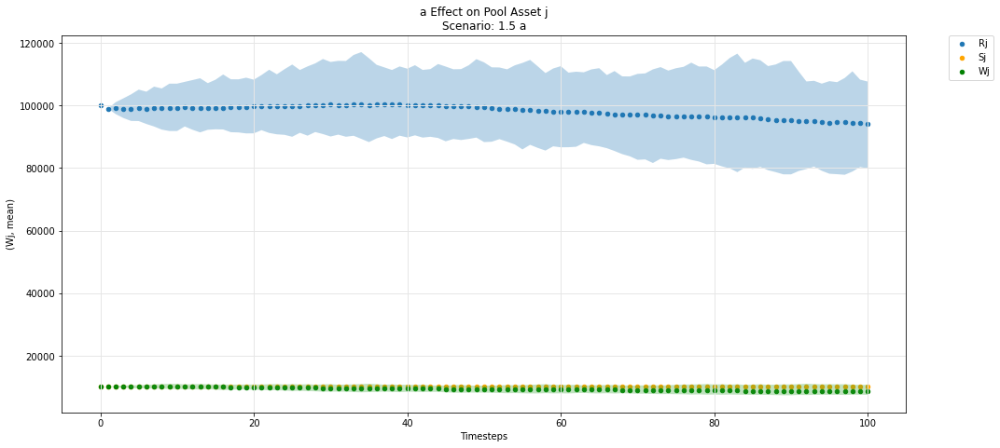

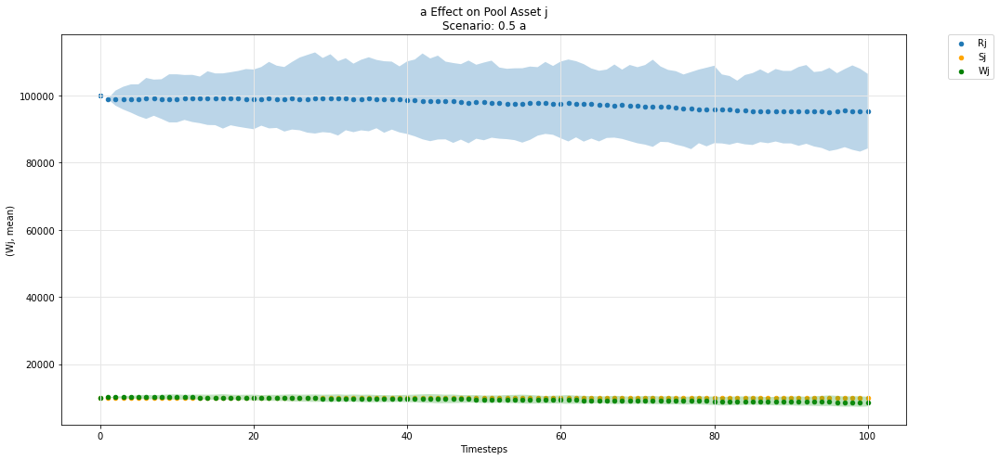

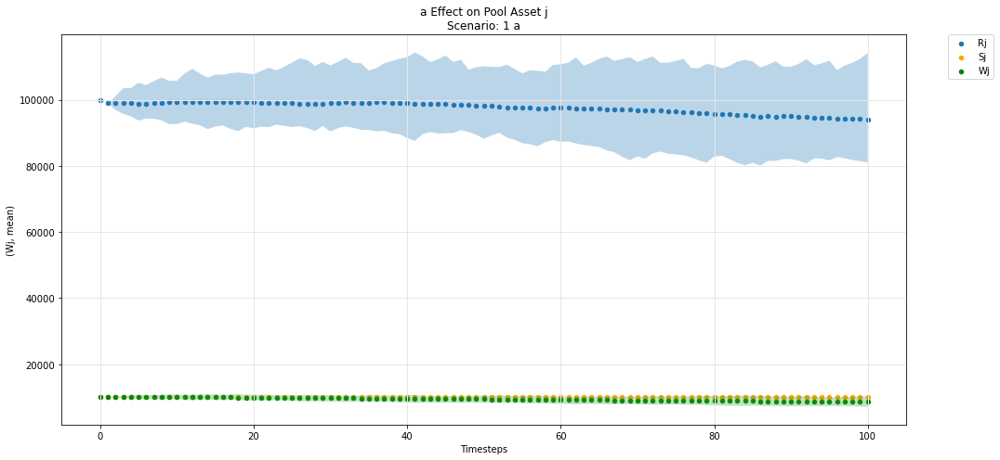

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

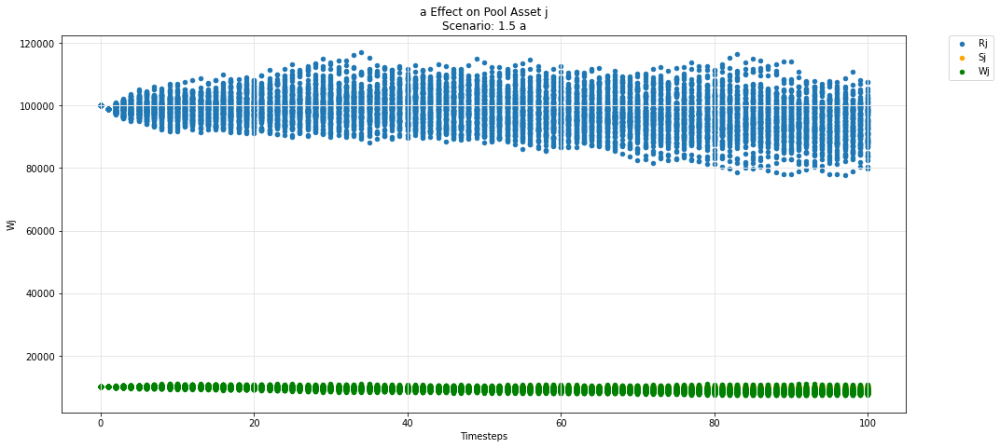

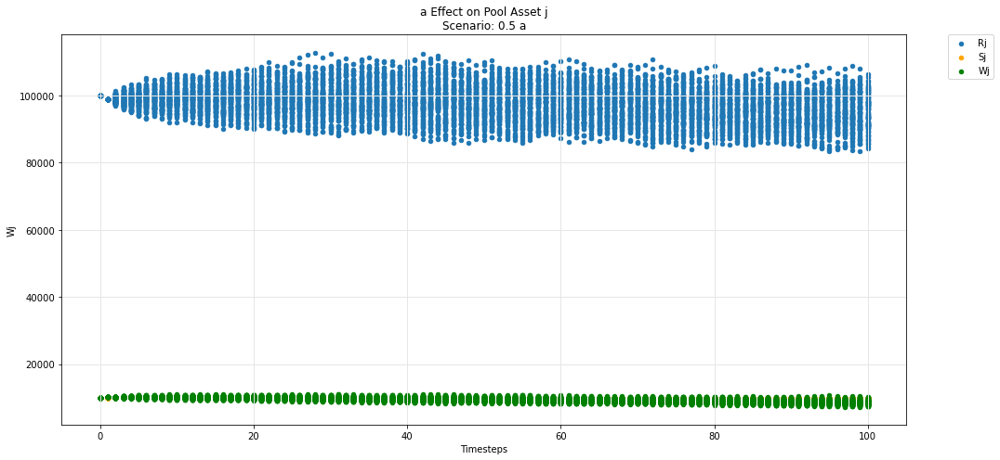

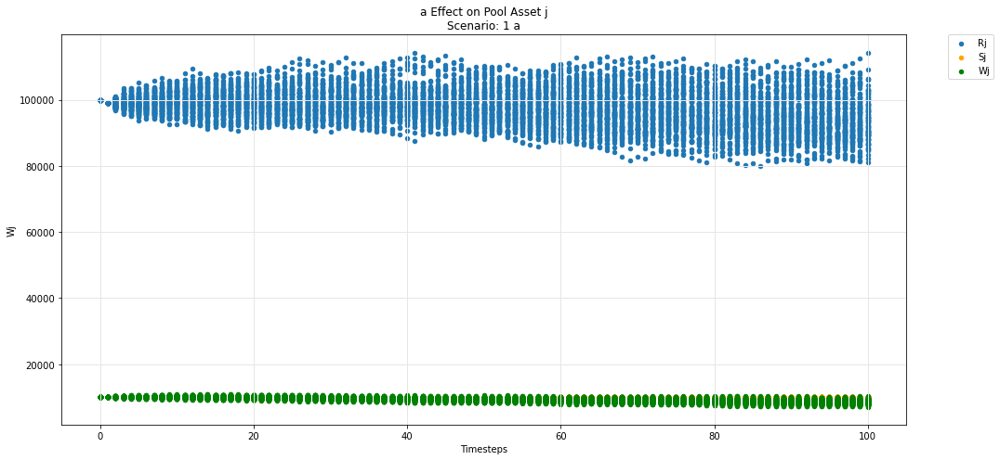

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

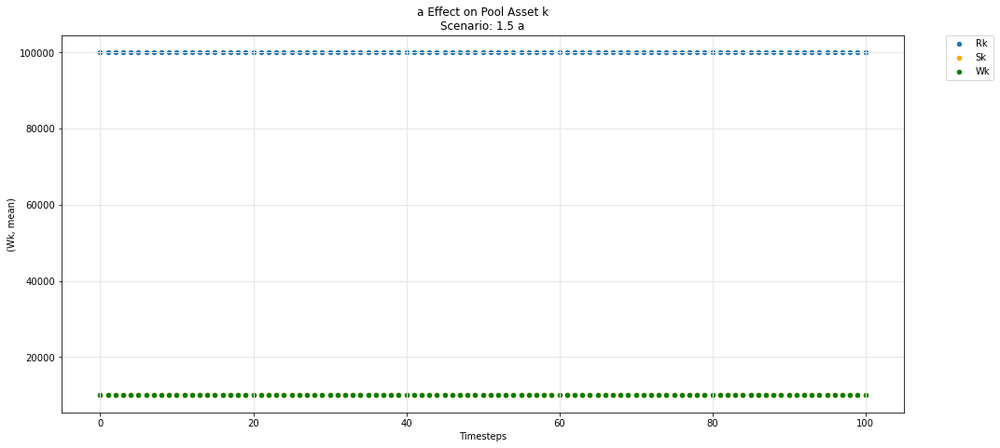

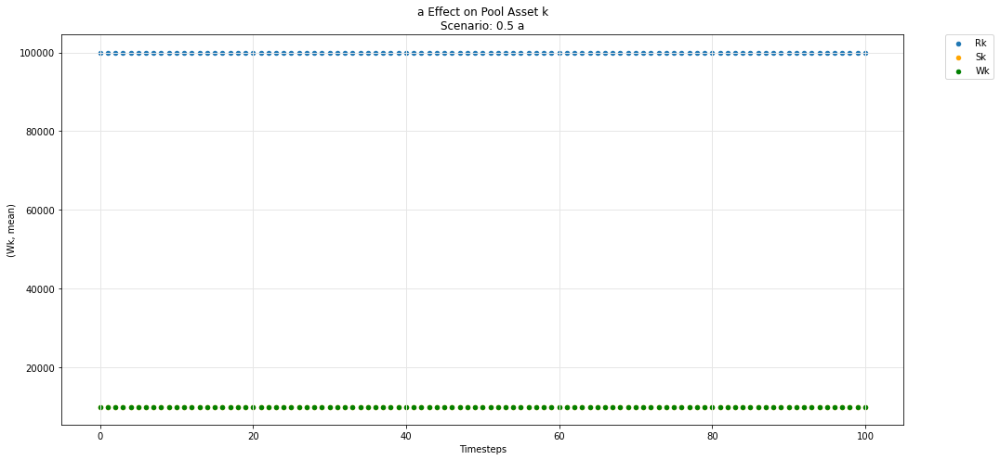

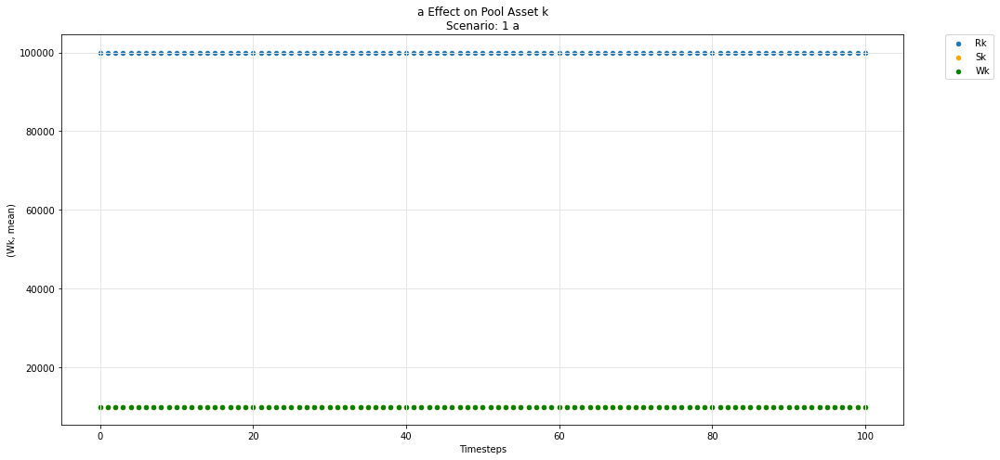

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

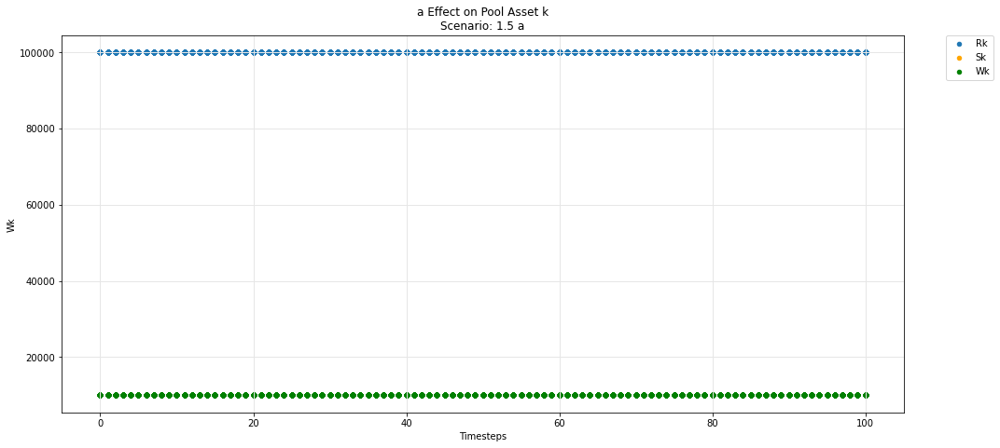

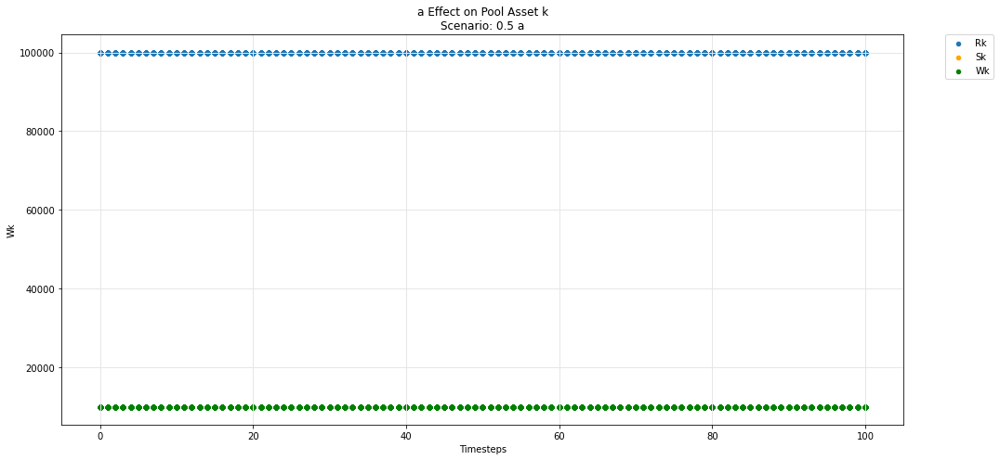

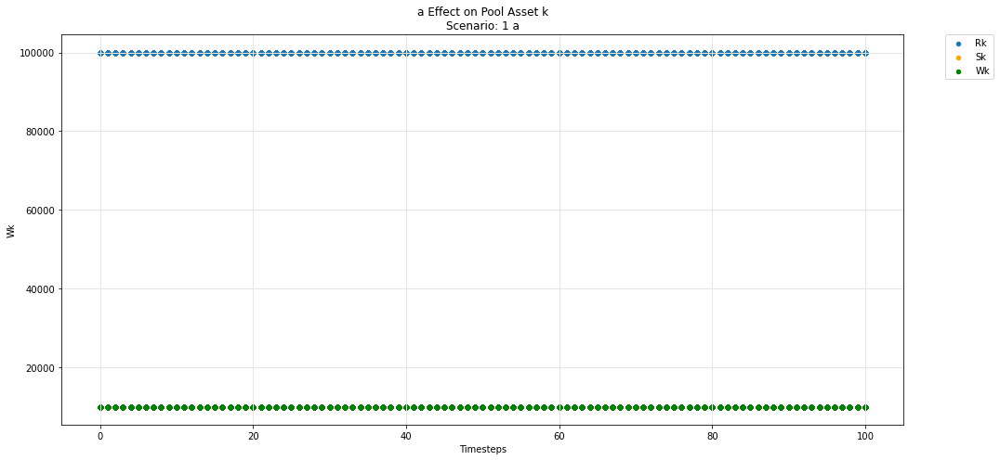

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

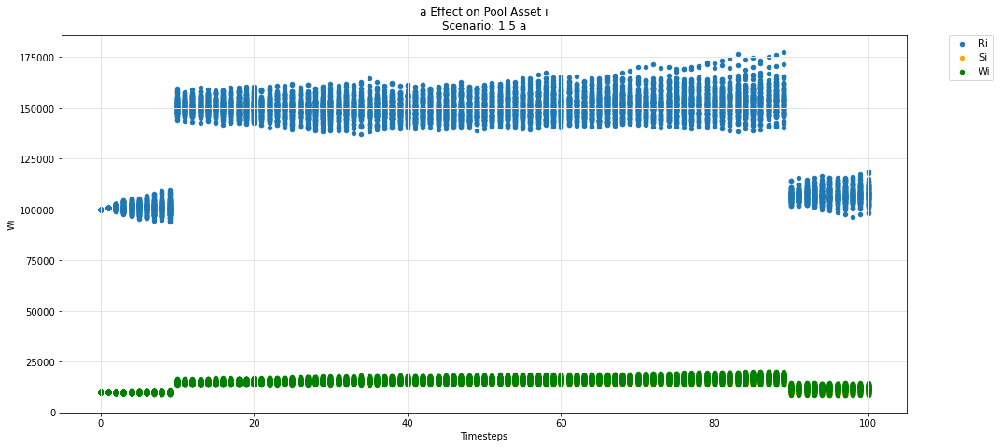

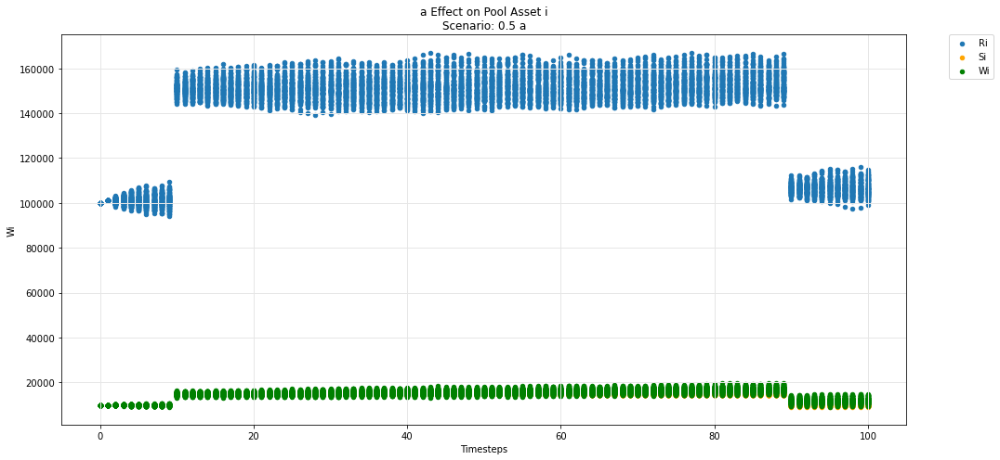

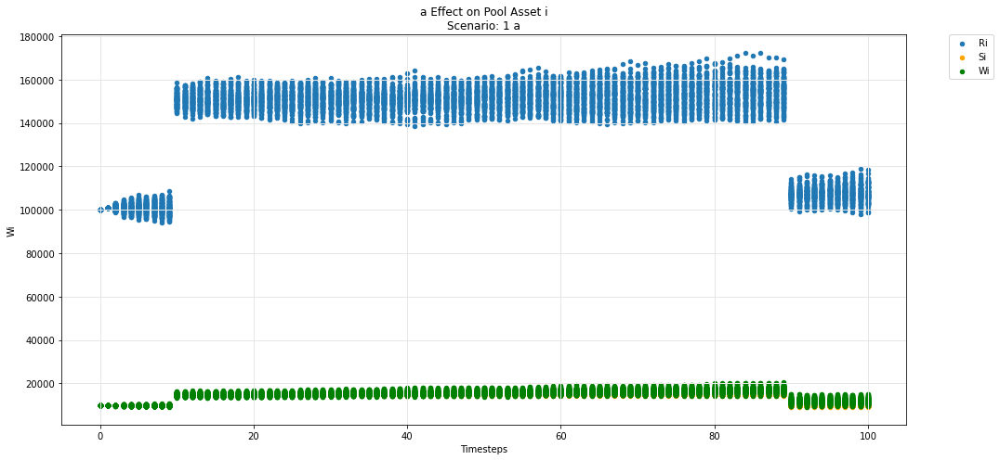

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

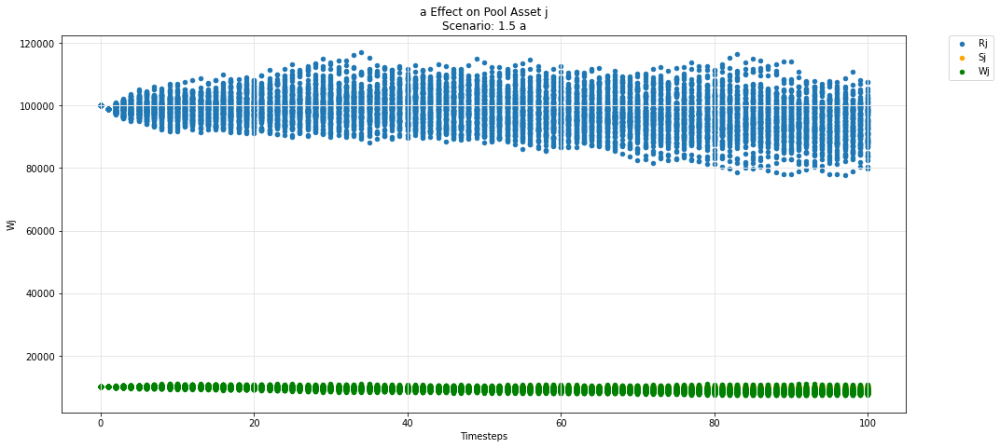

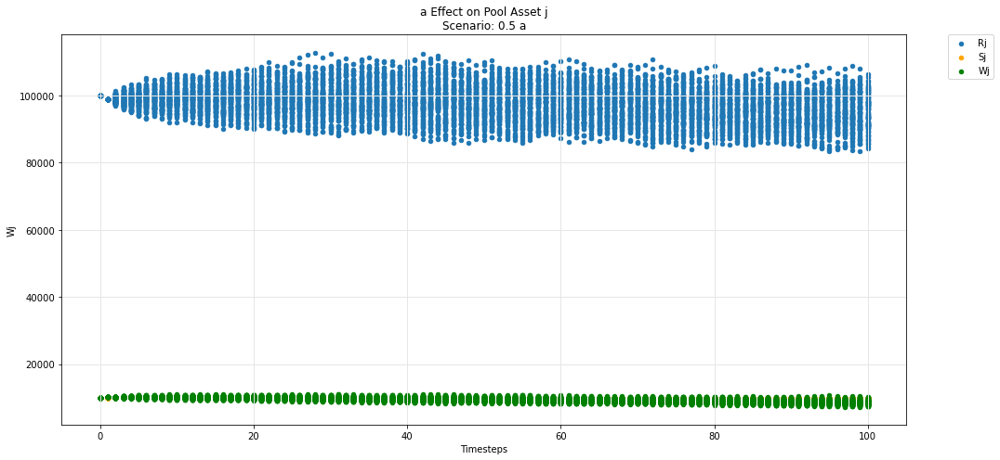

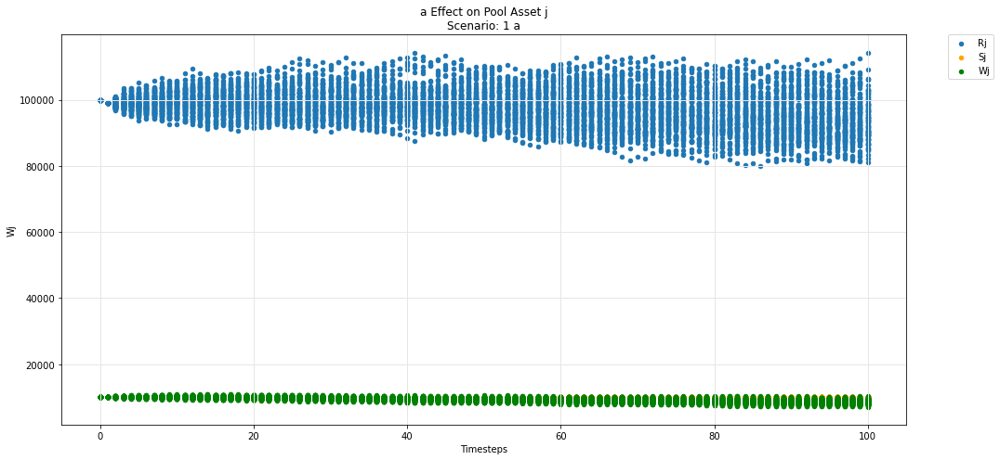

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

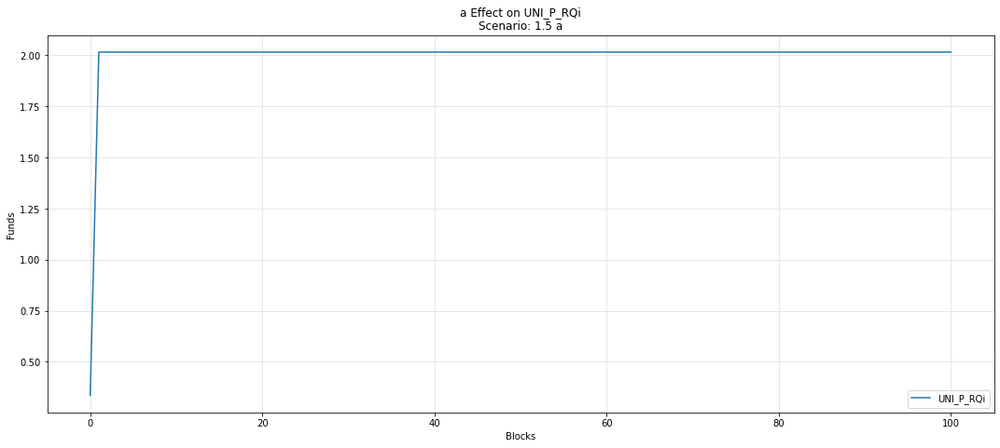

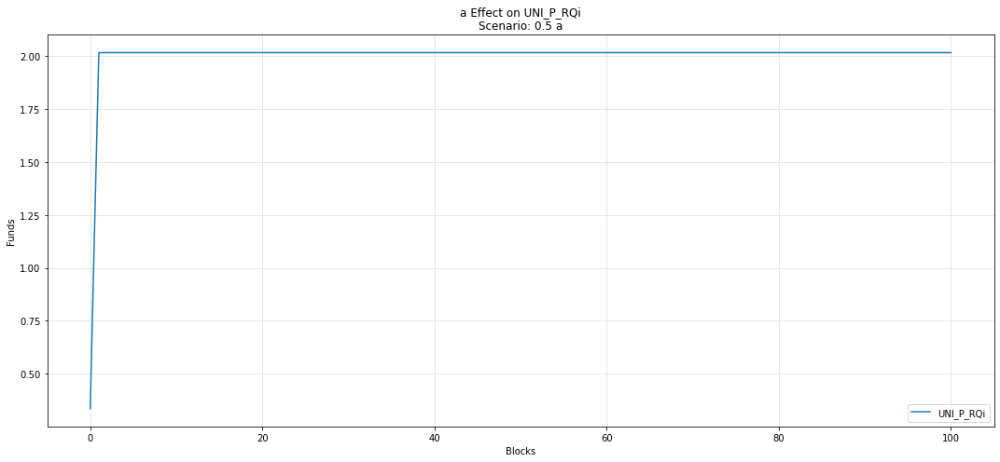

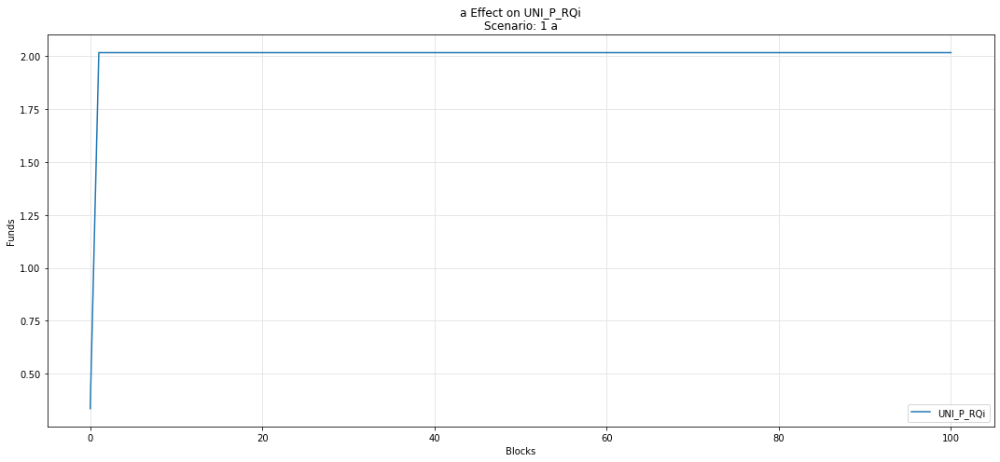

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

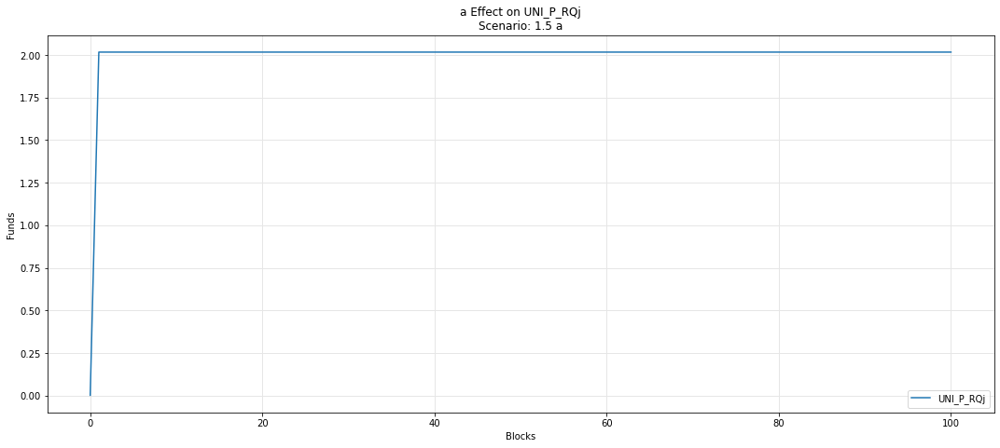

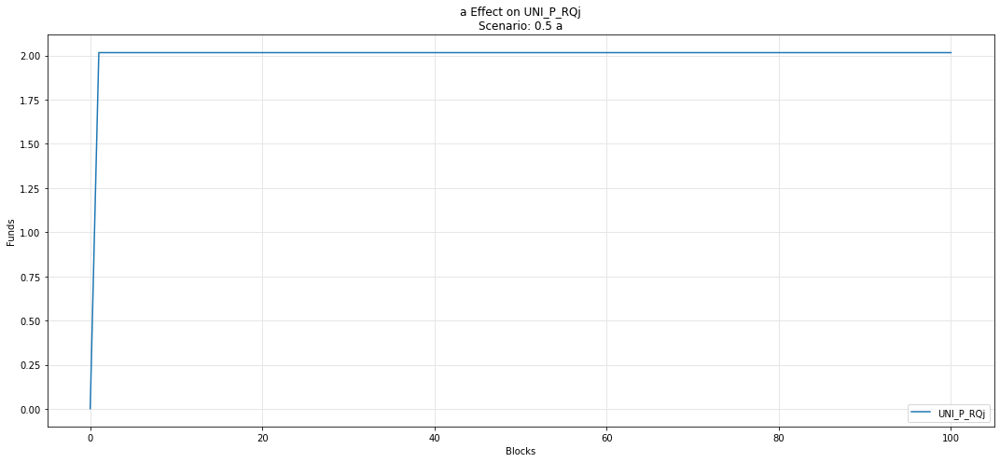

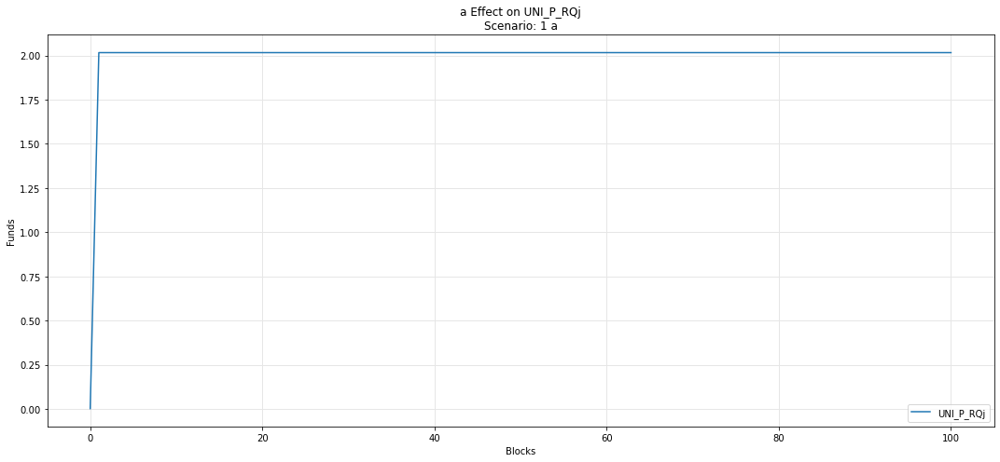

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

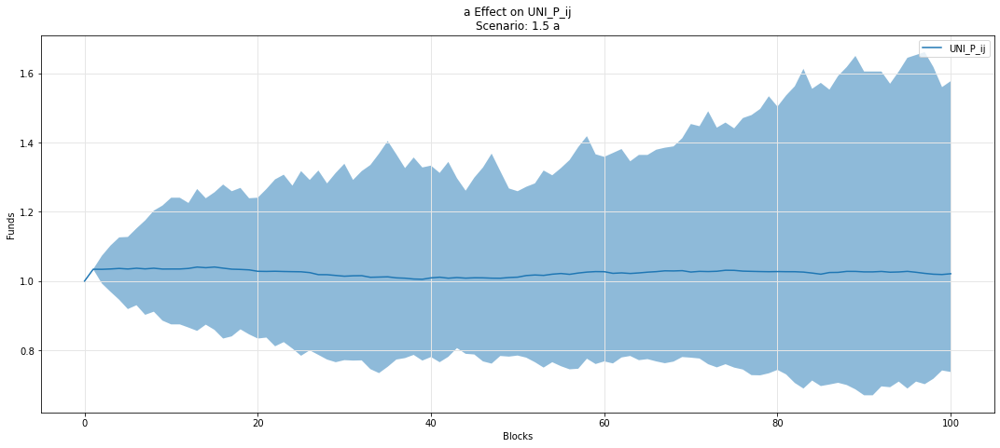

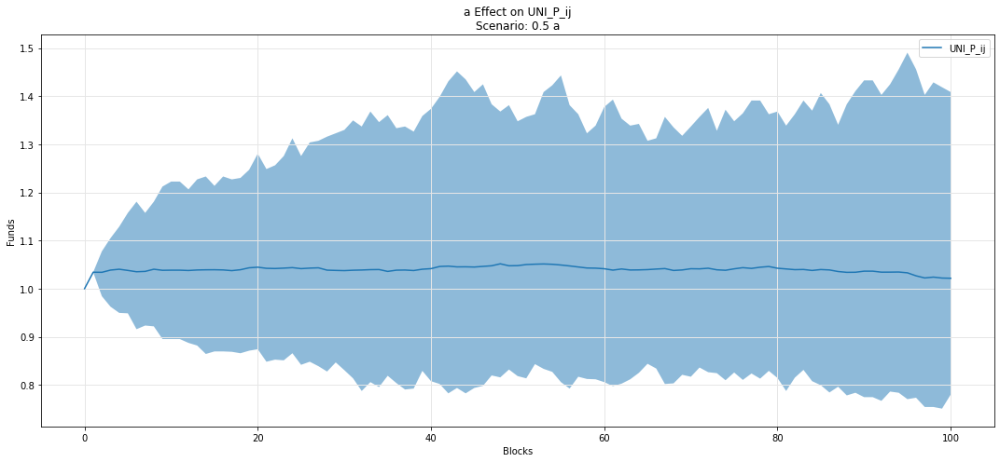

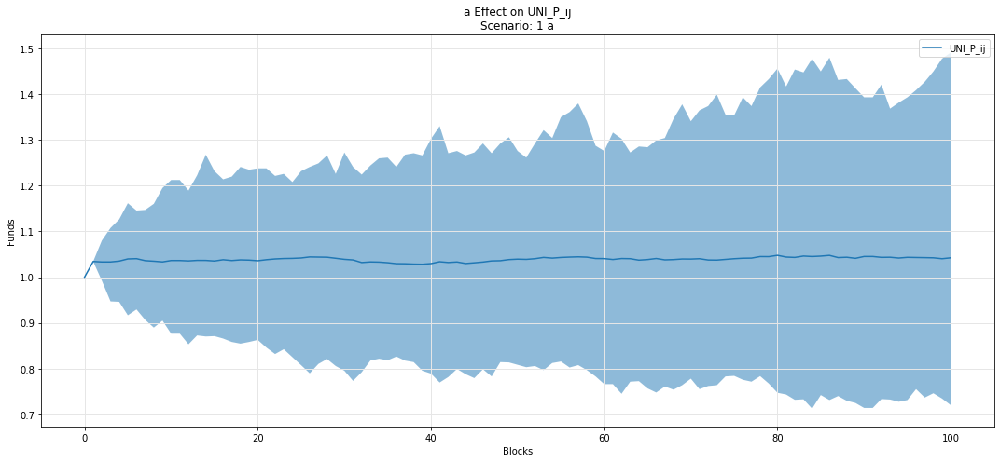

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

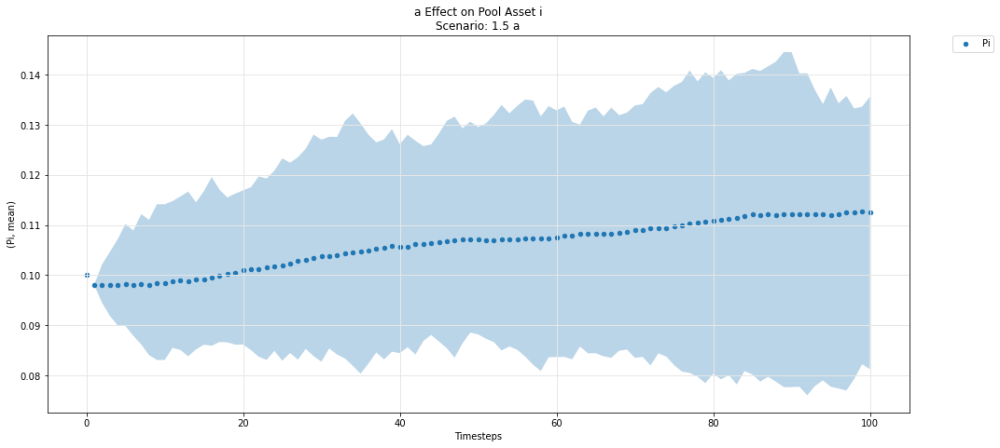

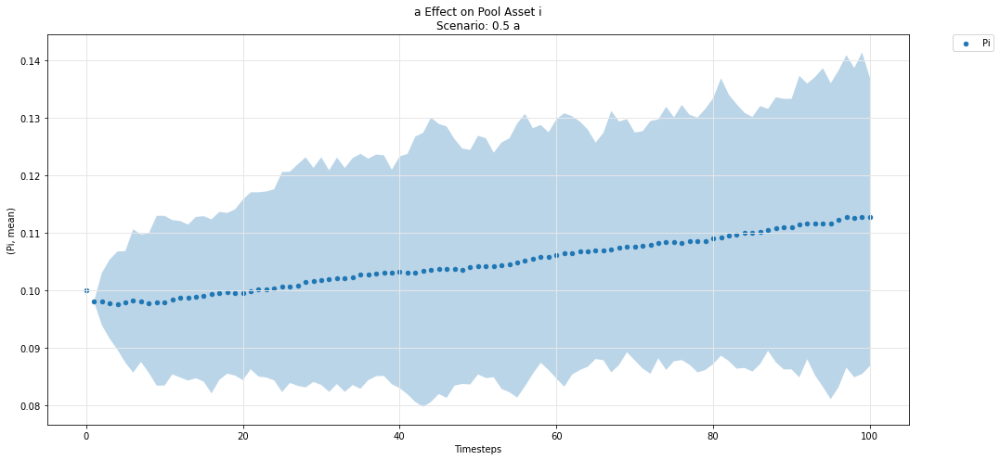

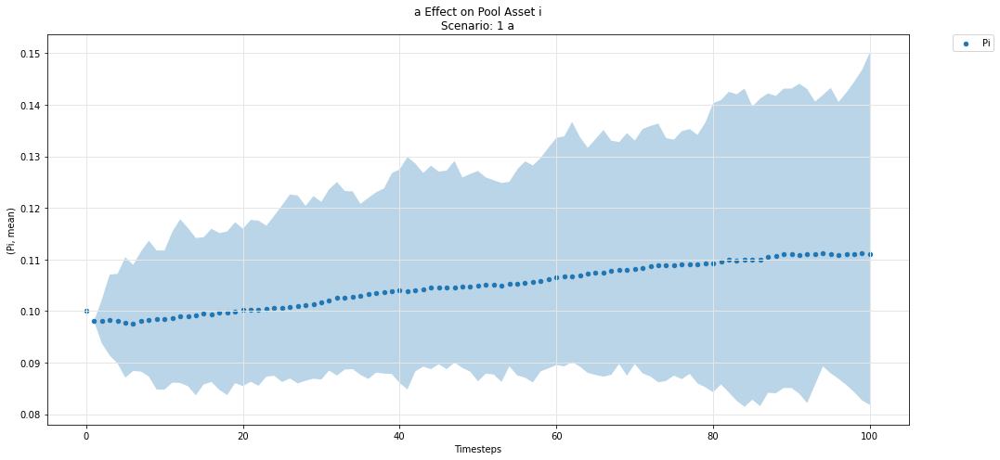

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

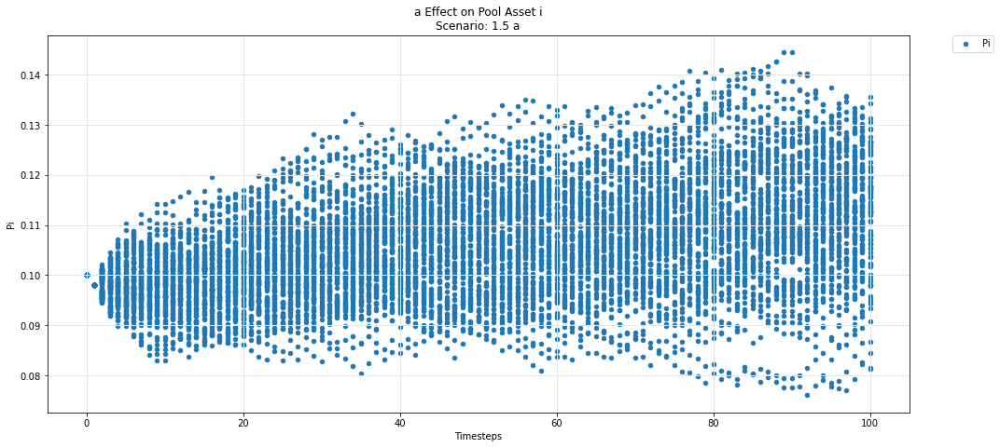

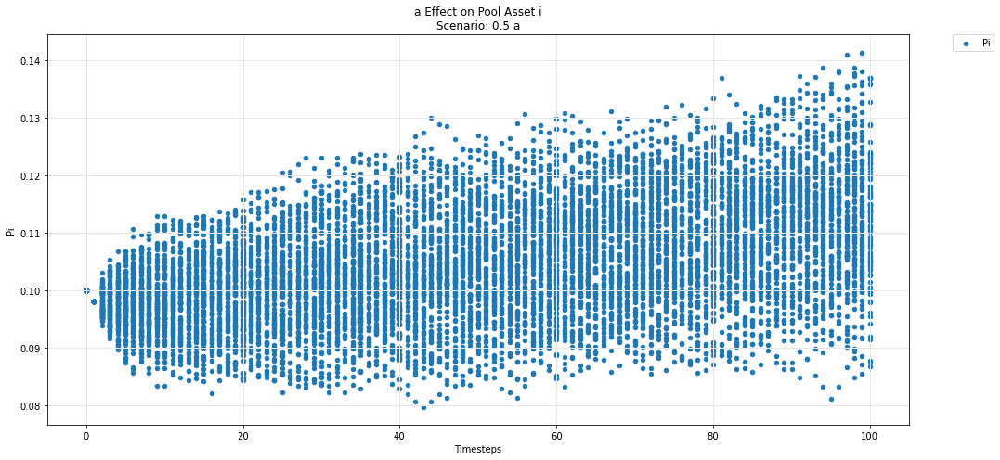

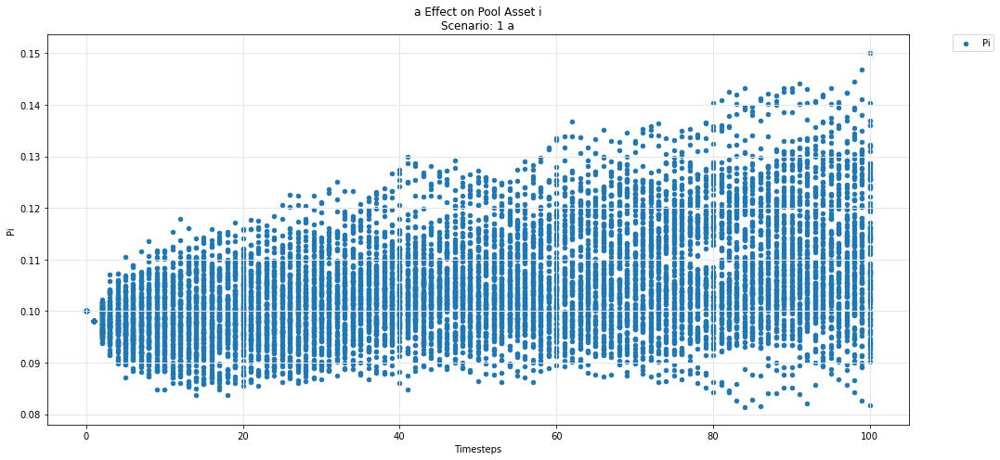

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

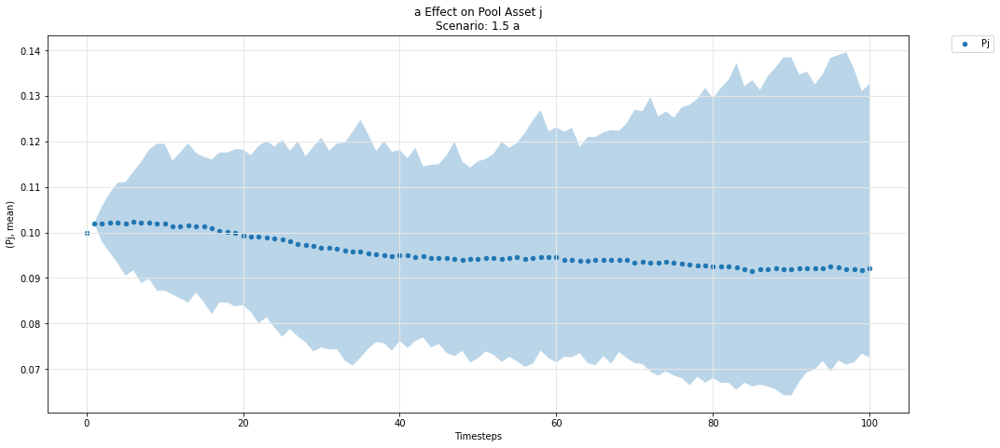

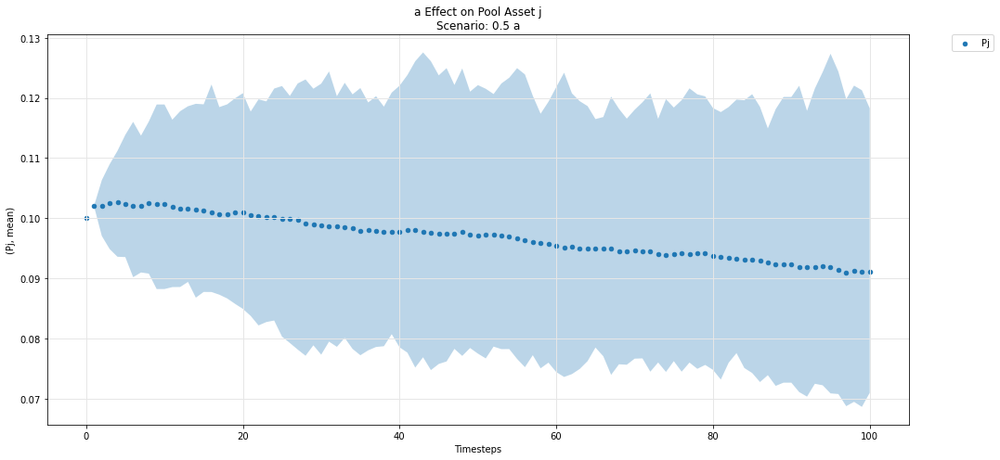

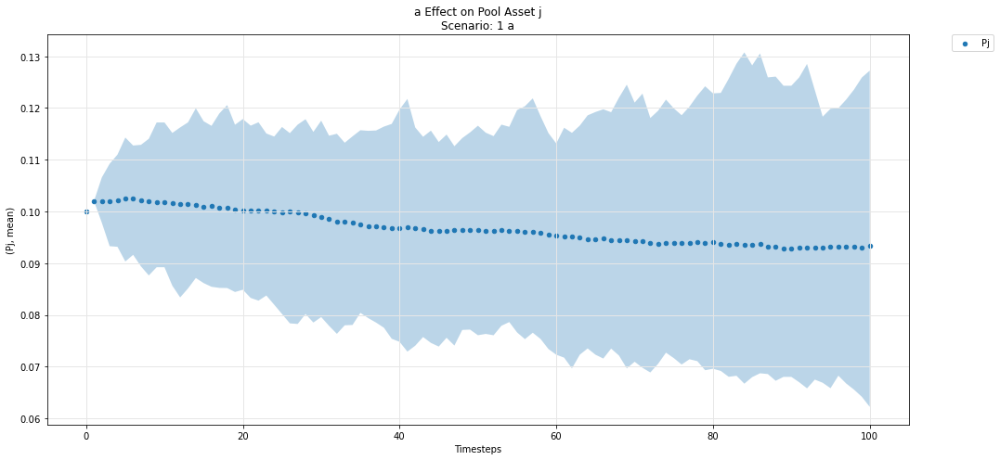

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

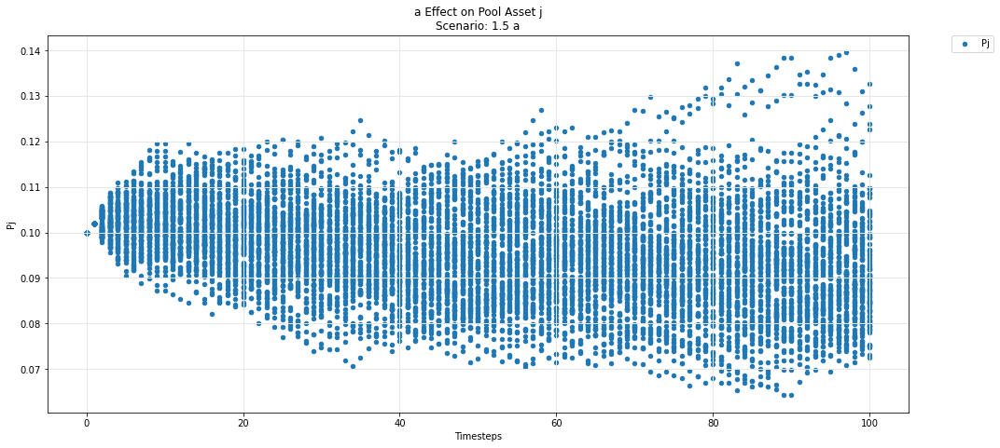

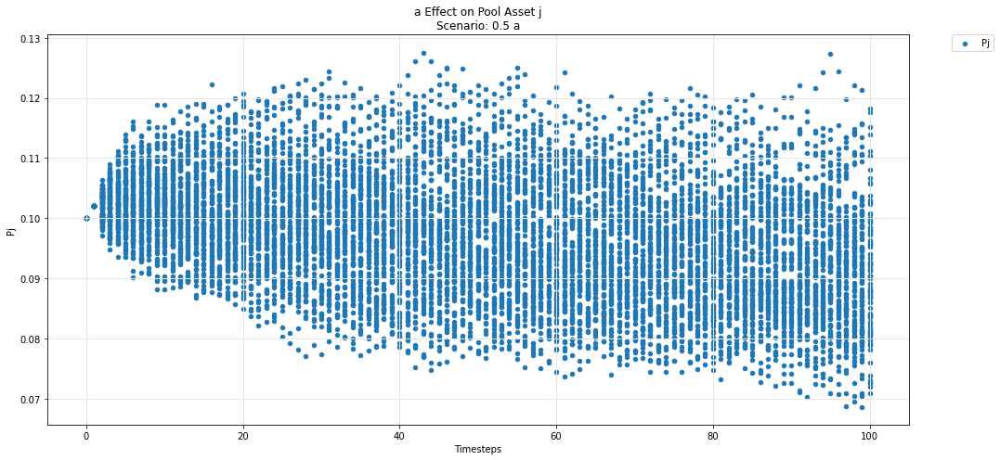

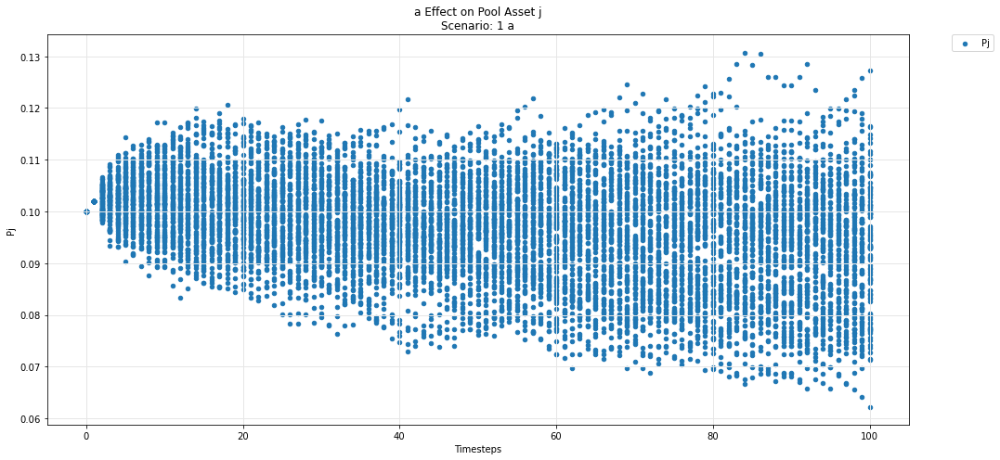

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

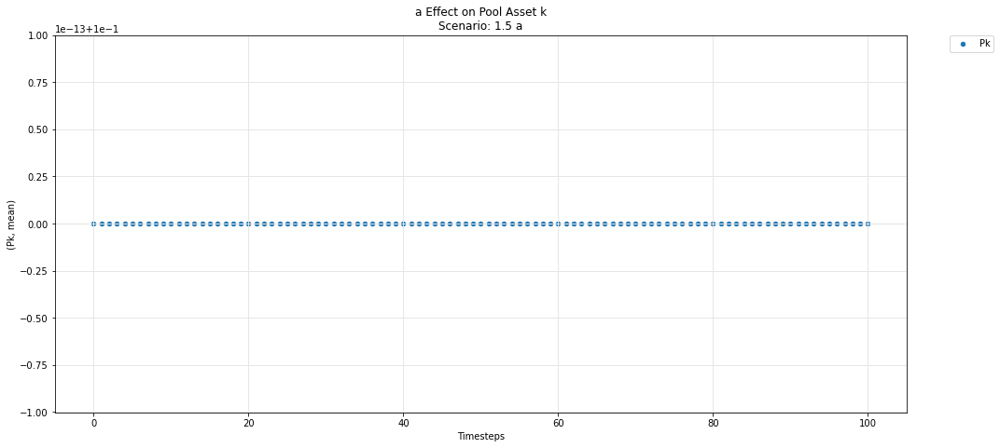

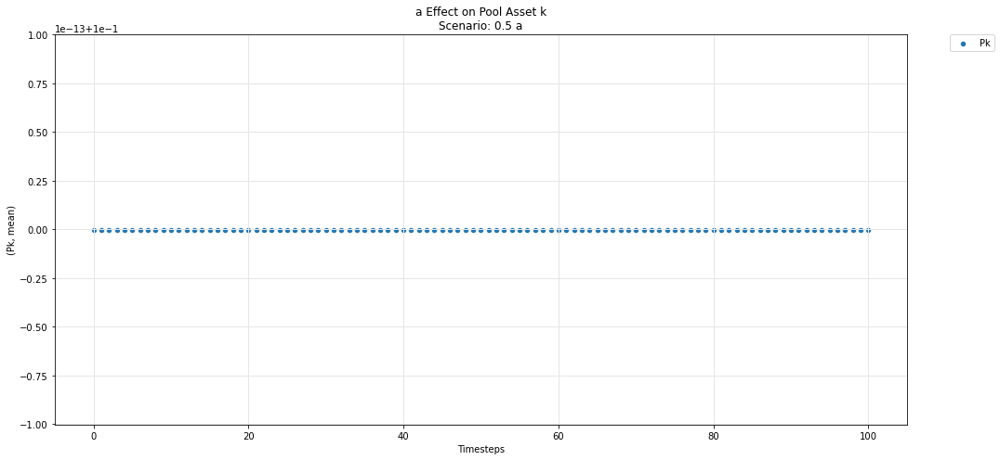

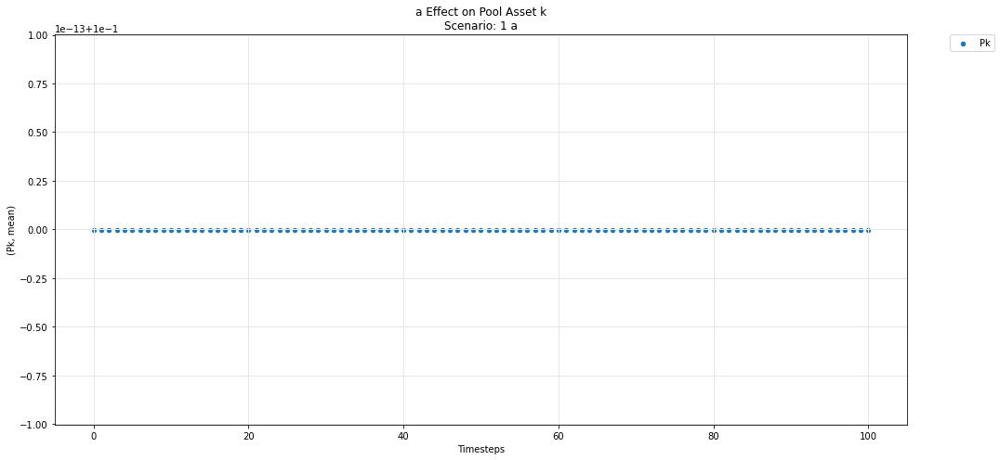

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

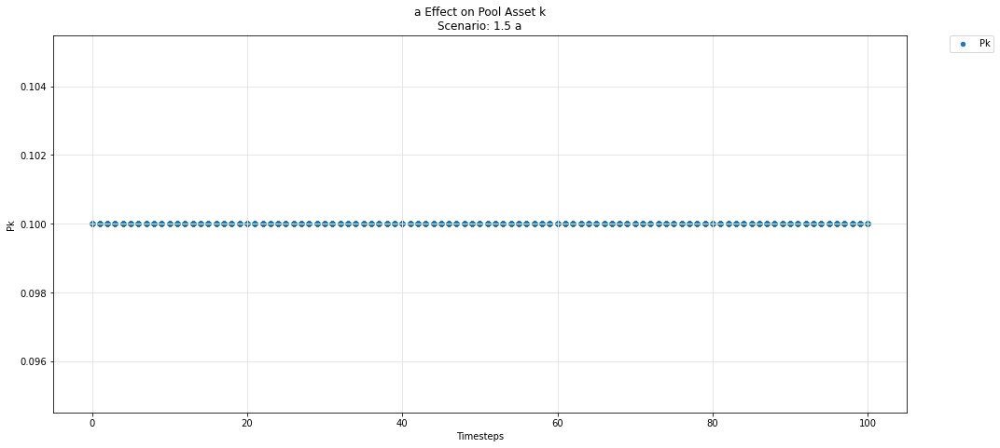

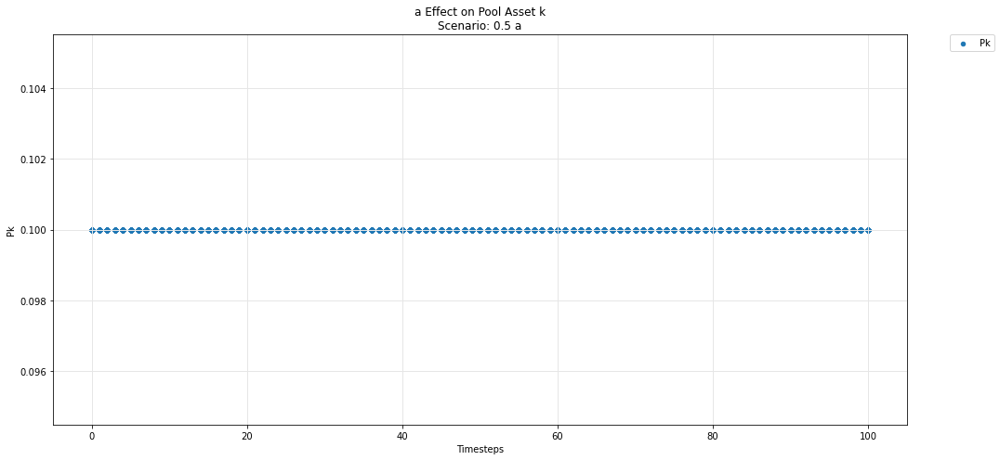

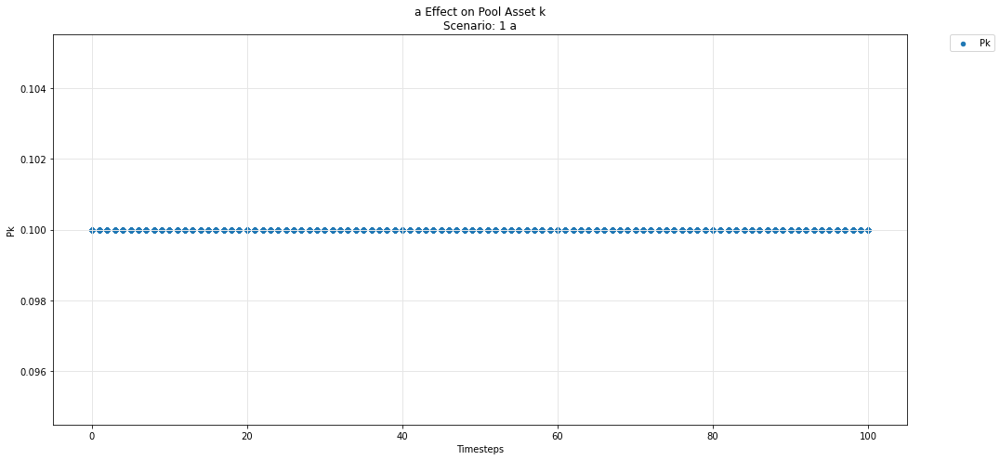

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')